# Redes Neurais e Aprendizado Profundo


## Perceptron

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

Vamos gerar alguns dados aleatórios como exemplo

In [2]:
# Dados aleatórios
np.random.seed(1)

n_samples = 10
n_features = 2
X = np.random.randn(n_samples, n_features)
y = np.random.randint(2, size=n_samples)
X,y

(array([[ 1.62434536, -0.61175641],
        [-0.52817175, -1.07296862],
        [ 0.86540763, -2.3015387 ],
        [ 1.74481176, -0.7612069 ],
        [ 0.3190391 , -0.24937038],
        [ 1.46210794, -2.06014071],
        [-0.3224172 , -0.38405435],
        [ 1.13376944, -1.09989127],
        [-0.17242821, -0.87785842],
        [ 0.04221375,  0.58281521]]),
 array([0, 0, 1, 1, 0, 0, 0, 0, 1, 1]))

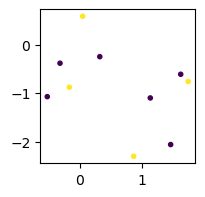

In [3]:
fig = plt.figure(figsize=(2,2))
plt.scatter(X[:,0], X[:,1], marker='.', c=y)

---
## 1. Classe Perceptron

Primeira implementação: 
- define e inicializa os parâmetros da rede,
- método para realizar o feed-forward

In [4]:
class Perceptron:
    # construtor - chamado ao instanciar 
    def __init__(self, n_features):
        self.nf = n_features
        self.W = tf.Variable(tf.random.normal([self.nf, 1]), name='weights')
        self.b = tf.Variable(tf.ones([1])/self.nf, name='bias')                     
                    
    # método especial - chamado ao usar o objeto 
    def __call__(self, x):
        logits = tf.matmul(x, self.W) + self.b
        return logits

In [5]:
# intanciamos a classe em um objeto que suporta 2 features
perc = Perceptron(5)
perc.W, perc.b

(<tf.Variable 'weights:0' shape=(5, 1) dtype=float32, numpy=
 array([[-1.184153  ],
        [-0.5496916 ],
        [ 1.1126369 ],
        [ 2.2485967 ],
        [-0.17531215]], dtype=float32)>,
 <tf.Variable 'bias:0' shape=(1,) dtype=float32, numpy=array([0.2], dtype=float32)>)

In [6]:
## chama implicitamente o metodo especial __call()__ (erro)
#perc(X)

In [7]:
model = Perceptron(2)
X_tf = tf.constant(X, dtype=tf.float32)
X, model(X_tf)

(array([[ 1.62434536, -0.61175641],
        [-0.52817175, -1.07296862],
        [ 0.86540763, -2.3015387 ],
        [ 1.74481176, -0.7612069 ],
        [ 0.3190391 , -0.24937038],
        [ 1.46210794, -2.06014071],
        [-0.3224172 , -0.38405435],
        [ 1.13376944, -1.09989127],
        [-0.17242821, -0.87785842],
        [ 0.04221375,  0.58281521]]),
 <tf.Tensor: shape=(10, 1), dtype=float32, numpy=
 array([[ 3.33634   ],
        [ 1.9738803 ],
        [ 5.7330356 ],
        [ 3.742772  ],
        [ 1.3005193 ],
        [ 5.8968124 ],
        [ 0.8893056 ],
        [ 3.7474084 ],
        [ 1.975079  ],
        [-0.55422235]], dtype=float32)>)

---
### 2. Método para predição e função de custo

In [8]:
class Perceptron:
    # construtor - chamado ao instanciar 
    def __init__(self, n_features):
        self.nf = n_features
        self.W = tf.Variable(tf.random.normal([self.nf, 1]), name='weights')
        self.b = tf.Variable(tf.ones([1])/self.nf, name='bias')                     
                    
    # método especial - chamado ao usar o objeto 
    def __call__(self, x):
        logits = tf.matmul(x, self.W) + self.b
        return logits

    # permite realizar predicao (Feed-forward) com numpy array
    def predict(self, x):
        X_tf = tf.constant(x, dtype=tf.float32)
        preds = self(X_tf)
        return preds.numpy()

    def loss_MSE(self, preds, labels):
        return tf.reduce_mean(tf.square(preds-labels))

In [9]:
# intanciamos a classe em um objeto que suporta 2 features
model = Perceptron(2)
y, model.predict(X)

(array([0, 0, 1, 1, 0, 0, 0, 0, 1, 1]),
 array([[-0.32072365],
        [-0.20537943],
        [-1.4474404 ],
        [-0.4611516 ],
        [ 0.24002764],
        [-1.3926197 ],
        [ 0.27650923],
        [-0.5872215 ],
        [-0.13356411],
        [ 0.9363347 ]], dtype=float32))

In [10]:
preds = model.predict(X)
loss_value = model.loss_MSE(preds, y)

In [11]:
loss_value.numpy()

1.2241823415016264

### Redes Neurais e Arquiteturas Profundas
#### **MBA em Ciências de Dados**

### *Módulo 1 - Introdução ao Aprendizado Profundo*

Moacir A. Ponti - ICMC/USP

# Implementação com Tensorflow e Keras

In [2]:
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import keras

from keras.optimizers import SGD
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.model_selection import train_test_split

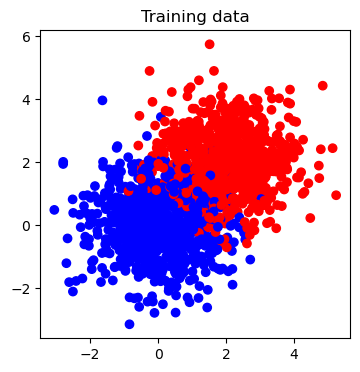

In [3]:
# Dados aleatórios
np.random.seed(1)
n_samples = 2000
n_features = 2
delta = 2.0
X = np.concatenate([np.random.randn(n_samples//2, n_features), 
                    np.random.randn(n_samples//2, n_features)+delta])
y = np.concatenate([np.zeros(n_samples//2), np.ones(n_samples//2)])

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.2, random_state=42)

fig = plt.figure(figsize=(4, 4))
plt.title('Training data')
plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=plt.cm.bwr)

In [9]:
## funcao para retornar modelo em Keras
def create_model():
    model = Sequential(
        [
        Dense(2, activation='tanh', name="layer1"),
        Dense(3, activation='tanh', name="layer2"),
        Dense(3, activation='softmax', name="layer3"),
        Dense(1, name="Output"),
        ]
    )

    return model

In [10]:
# instanciar modelo
p_model = create_model()

# compilar modelo com configuracoes de otimizacao
# Compile the model
p_model.compile(loss='mean_squared_error', optimizer=SGD(learning_rate=0.01), metrics=['accuracy'])

# treinamento
p_model.fit(X_train, y_train, epochs=30, batch_size=50, verbose=10)

# avaliacao

Epoch 1/30
Epoch 2/30
Epoch 3/30
Epoch 4/30
Epoch 5/30
Epoch 6/30
Epoch 7/30
Epoch 8/30
Epoch 9/30
Epoch 10/30
Epoch 11/30
Epoch 12/30
Epoch 13/30
Epoch 14/30
Epoch 15/30
Epoch 16/30
Epoch 17/30
Epoch 18/30
Epoch 19/30
Epoch 20/30
Epoch 21/30
Epoch 22/30
Epoch 23/30
Epoch 24/30
Epoch 25/30
Epoch 26/30
Epoch 27/30
Epoch 28/30
Epoch 29/30
Epoch 30/30


In [11]:
# Evaluate the model on the test data using `evaluate`
print("Evaluate on test data")
results = p_model.evaluate(X_test, y_test, batch_size=100)
print("test loss, test acc:", results)

Evaluate on test data
4/4 [==============================] - 0s 2ms/step - loss: 0.0742 - accuracy: 0.9075
test loss, test acc: [0.07417245954275131, 0.9075000286102295]


In [12]:
y_pred = p_model.predict(X_test)

13/13 [==============================] - 0s 1ms/step


Text(0.5, 1.0, 'Predicted data')

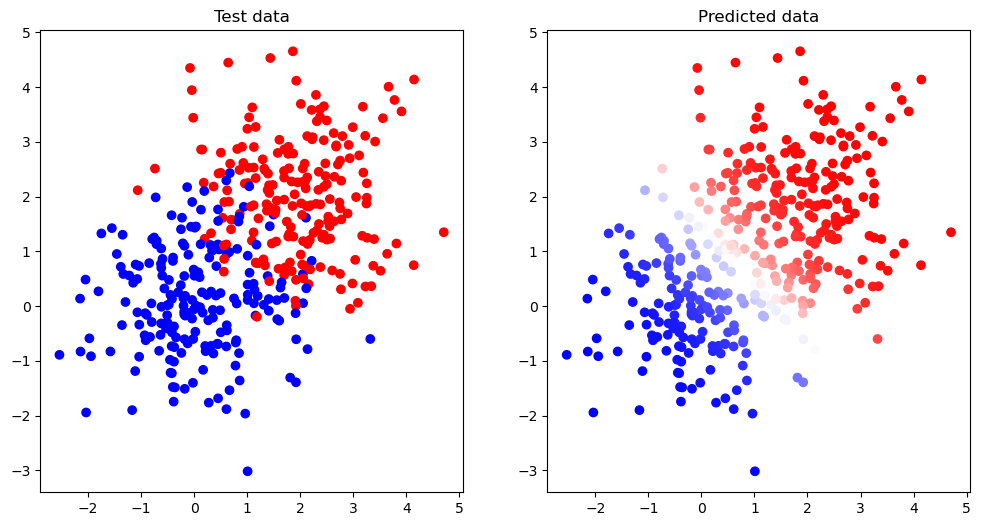

In [13]:
#plotando os dados de teste

fig = plt.figure(figsize=(12, 6))

plt.subplot(1,2,1); plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=plt.cm.bwr)
plt.subplot(1,2,1).set_title('Test data')
plt.subplot(1,2,2); plt.scatter(X_test[:, 0], X_test[:, 1], c=y_pred, cmap=plt.cm.bwr)
plt.subplot(1,2,2).set_title('Predicted data')

## <span style="color:darkred">Avaliação (com soluções)</span>

---
### Questão 1)

Qual dos cenários abaixo define o "aprendizado de características/feature learning" em aprendizado profundo supervisionado quando trabalhamos com dados não estruturados para classificação?

(a) realizar extração de características dos dados, trabalhar o espaço de características resultante, aplicar métodos de redução de dimensionalidade e um algoritmo de classificação para uma tarefa alvo<br>
(b) modelar por meio de diferentes redes neurais as etapas de extração de características, redução de dimensionalidade e de classificação da tarefa alvo<br>
(c) utilizar classificadores do tipo Perceptron para abordar o problema<br>
<font color='red'>(d) realizar preparação básica de dados e deixar que uma única rede neural aprenda as características e o classificador com base na tarefa alvo<br></font>
(e) realizar extração de características dos dados, trabalhar o espaço de características resultante com métodos do estado da arte e então utilizar um ensemble de redes neurais para resolver o problema<br>

**Justificativa**:

---
### Questão 2)

Qual a diferença entre as funções de ativação *sigmoide* e *tangente hiperbólica* aplicadas a uma camada de uma rede neural?

(a) a sigmóide produz como saída vetores cuja somatória é 1 e que podem ser interpretados como uma distribuição de probabilidade, enquanto a tangente hiperbólica comprime os valores da saída entre 0 e 1<br>
(b) a sigmóide produz como saída vetores cujos valores estão entre -1 e 1 de forma suave, enquanto a tangente hiperbólica  mapeia para 0 valores negativos e funciona como função linear para os positivos<br>
<font color='red'>(c) a sigmóide comprime os valores da saída entre 0 e 1 de forma suave, enquanto a tangente hiperbólica comprime os valores da saída entre -1 e 1 de forma suave<br></font>
(d) a sigmóide comprime os valores da saída entre 0 e 1 de forma suave, enquanto a tangente hiperbólica também comprime os valores da saída entre 0 e 1 porém na forma de um degrau na posição 0.
(e) ambas produzem a mesma saída pois possuem o mesmo formato.

---

### Questão 3)

Considere uma amostra com $n=6$ exemplos, para os quais temos as saídas (rótulos): $\mathbf{y} = [0, 0, 1, 1, 1, 0]$.

Dois modelos de rede neural produziram as seguintes saídas:<br>
$\hat{\mathbf{y}}_1 = [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]$,<br>
$\hat{\mathbf{y}}_2 = [0.1, 0.1, 0.1, 0.9, 0.9, 0.1]$.

Implemente funções que calcule as perdas para as saídas 1 e 2, respectivamente, arredondando para 2 casas decimais:
- quadrática média (MSE), considerando a formulação $\frac{1}{n} \sum_j (y_j - \hat{y}_j)^2$, com $j=1,...,n$
- entropia cruzada binária (CE), considerando a formulação $ \frac{1}{n}\sum_{j} -(y_j \ln \hat{y}_j + (1-y_j) \ln (1-\hat{y}_j)) $, com $j=1,...,n$.

OBS: para evitar erros por log de 0, use $ln(x+0.001)$, ou seja some 0.001 aos logs.

Assinale a alternativa que indica as perdas MSE e CE calculadas para as saídas 1 e 2

<font color='red'>(a) 1: MSE=0.50, CE=3.45, 2: MSE=0.14, CE=0.47<br></font>
(b) 1: MSE=3.00, CE=20.70, 2: MSE=0.84, CE=2.82<br>
(c) 1: MSE=0.50, CE=3.45, 2: MSE=4.00, CE=2.82<br>
(d) 1: MSE=0.50, CE=20.70, 2: MSE=0.47, CE=0.47<br>
(e) 1: MSE=1.00, CE=1.00, 2: MSE=0.14, CE=0.47<br>

In [25]:
import numpy as np

def mse(y,y_h):
    assert len(y) == len(y_h)
    n = len(y)
    y = np.array(y)
    y_h = np.array(y_h)
    return np.round(np.sum(np.square(y - y_h))/n,2)

def ce(y,y_h):
    assert len(y) == len(y_h)
    n = len(y)
    y = np.array(y)
    y_h = np.array(y_h)
    return np.round(np.sum(-(y*np.log(y_h+0.001) +(1-y)*np.log(1-y_h+0.001)))/n,2)

In [26]:
y = np.array([0, 0, 1, 1, 1, 0])

y_hat_1 = np.array([1, 1, 1, 1, 1, 1])
y_hat_2 = np.array([0.1, 0.1, 0.1, 0.9, 0.9, 0.1])

In [29]:
print('Perda Quadrática Média')
mse(y, y_hat_1)*6, mse(y, y_hat_2)*6

Perda Quadrática Média


(3.0, 0.8400000000000001)

In [31]:
print('Entropia Cruzada Média')
ce(y, y_hat_1)*6, ce(y, y_hat_2)*6

Entropia Cruzada Média


(20.700000000000003, 2.82)

---
### Questão 4)

Quando dizemos que um neurônio de uma rede neural "aprende" (no sentido de aprendizado de máquina), o que isso significa em termos do modelo matemático do Perceptron?

(a) aprender é inicializar os parâmetros do modelo (pesos e bias) com valores aleatórios<br>
(b) aprender é computar a função de perda/custo do modelo considerando seus parâmetros atuais (pesos e bias)<br>
(c) aprender é computar a multiplicação vetorial entre os dados de entrada e os pesos, e somar o valor bias<br>
<font color='red'>(d) aprender é ajustar os parâmetros do modelo (pesos e bias) usando uma base de dados de treinamento<br></font>
(e) aprender é ajustar os parâmetros do modelo (pesos e bias) usando uma base de dados de validação<br>

**Justificativa**:

---
### Questão 5)


Suponha duas formulações de um classificador:
1. $\hat y = s(\mathbf{w}^T \mathbf{x} + b)$, com $\mathbf{x} \in R^3$
2. $\hat y = s(w_1 x_1 + w_2 x_2 + w_3 x_3 + b)$,<br>
em que $s(.)$ é uma função de ativação do tipo sigmóide.

Qual a afirmativa correta quando comparamos essas formulações?


<font color='red'>(a) representam a mesma função de classificação</font><br>
(b) ambas são classicadores lineares, porém apenas a (1)  é válida para uso como neurônio de uma rede neural Perceptron<br>
(c) ambas são classicadores lineares, porém apenas a (2) é válida para uso como neurônio de uma rede neural Perceptron<br>
(d) apenas (1) é um classificador linear, enquanto a (2) é não linear <br>
(e) apenas (2) é um classificador linear, enquanto a (1) é não linear <br>

**Justificativa**:

## <span style="color:darkred">Exercícios com soluções</span>

# Parte 1 - Exercícios Essenciais

---

### Exercício 1)

As redes neurais artificiais passaram por um chamado "inverno" em que recebiam pouca atenção da academia e do mercado quando comparado aos sistemas especialistas. Por que isso mudou em meados de 2010?

 (a) Devido a descobertas da inteligência artificial em 2012 que revolucionou a área<br>
 <font color='red'>(b) Trabalhos científicos mostraram que a utilização de grandes bases de dados anotadas e o uso de placas gráficas permitiam treinar modelos com baixo erro de classificação</font><br>
 (c) Devido a melhoria dos sistemas computacionais, incluindo melhores processadores (CPUs), maior memória principal disponível (RAM) e placas gráficas (GPUs)<br>
 (d) Pois foi nessa época em que a área de ciência de dados tomou destaque, devido a grande quantidade de dados disponível (big data)<br>



---
### Exercício 2)

Seja $\mathbf{x} \in X$ um vetor com informações sobre perfis de clientes de um e-commerce, incluindo: data de nascimento, cidade, quantidade de pedidos realizados nos últimos 12 meses, total em reais das compras, entre outros. Desejamos obter um modelo que seja capaz de receber por entrada uma instância de $X$ e inferir a probabilidade $y$ de um cliente realizar uma compra no próximo mês. Considere duas formulações conforme abaixo:

1. Modelo A: $f(\mathbf{x}) = \hat{y}$
2. Modelo B:

$$\begin{align}
g(\mathbf{x}) &= \mathbf{r},\\
h(\mathbf{r}) &= \mathbf{s},\\
i(\mathbf{s}) &= \mathbf{w},\\
f(\mathbf{w}) &= \hat{y}
\end{align}
$$

O que podemos dizer sobre A e B?

(a) A é um classificador linear e B é um regressor multi-estágio<br>
(b) apenas B é uma formulação de aprendizado de máquina, enquanto A não pode ser considerado aprendizado de máquina<br>
(c) A é um classificador linear como o Perceptron, enquanto B é uma rede neural profunda<br>
<font color='red'>(d) A é uma formulação rasa, enquanto que B é uma formulação profunda para aprendizado de máquina</font><br>

---

### Exercício 3)

Seja $\mathbf{x}$ um vetor de entrada e $s$ um valor de saída de um neurônio de uma rede neural baseada em Perceptron. O processamento pode ser escrito na forma:

$f(\mathbf{x}) = a(\mathbf{w}^t\mathbf{x}+b) = s$,

sendo que $a()$ é a função de ativação. Sabendo que a entrada tem $d$ dimensões, quais são as dimensões das variáveis $w$ e $b$?

<font color='red'>(a) $w$ é um vetor com $d$ dimensões, enquanto $b$ é escalar possuindo uma dimensão<br></font>
(b) $w$ é um vetor com 2 dimensões, enquanto $b$ é escalar possuindo uma dimensão<br>
(c) $w$ é escalar com 1 dimensão, enquanto $b$ é o vetor bias cujo número de dimensões é igual ao número de classes do problema<br>
(d) $w$ é um vetor com $d-1$ dimensões, enquanto $b$ é bias e portanto possui apenas 1 dimensão


---

### Exercício 4)

Seja $\mathbf{x}$ um vetor de entrada e $\mathbf{s}$ um vetor de saída de uma camada de rede neural baseada em Perceptron. O processamento pode ser escrito na forma:

$f(\mathbf{x}) = a(W\mathbf{x}+\mathbf{b}) = \mathbf{s}$,

sendo que $a()$ é a função de ativação. Sabendo que a entrada tem $d$ dimensões e a saída tem $z$ dimensões, quais são as dimensões das variáveis $W$ e $b$ e quantos neurônios possui essa camada?

(a) são $d$ neurônios, sendo que $W$ possui $z \times d$, e $b$ possui $d$ dimensões<br>
(b) são $d \times z$ neurônios, sendo que $W$ possui $z \times d$, e $b$ possui $d$ dimensões<br>
<font color='red'>(c) são $z$ neurônios, sendo que $W$ possui $z \times d$, e $b$ possui $z$ dimensões<br></font>
(d) são $z$ neurônios, sendo que $W$ possui $d$, e $b$ possui $z$ dimensões


---

### Exercício 5)

Qual a diferença entre as funções de ativação *sigmoide* e *ReLU* aplicadas a uma camada de uma rede neural?

(a) a sigmóide produz como saída vetores cuja somatória é 1 e que podem ser interpretados como uma distribuição de probabilidade, enquanto a ReLU comprime os valores da saída entre 0 e 1 <br>
(b) a sigmóide produz como saída vetores cujos valores estão entre -1 e 1 de forma suave, enquanto a ReLU  mapeia para 0 valores negativos e funciona como função linear para os positivos<br>
<font color='red'>(c) a sigmóide comprime os valores da saída entre 0 e 1 de forma suave, enquanto a ReLU mapeia para 0 valores negativos e funciona como função linear para os positivos<br></font>
(d) a sigmóide comprime os valores da saída entre 0 e 1 de forma suave, enquanto a ReLU também comprime os valores da saída entre 0 e 1 porém na forma de um degrau na posição 0.

---

### Exercício 6)

Qual a diferença entre a perda esperada (expected loss) e a perda empírica (empirical loss)?

(a) Não há diferença, ambas são usadas para o treinamento de redes neurais, porém a perda esperada é contínua enquanto a perda empírica é discreta<br>
(b) A perda esperada exige uma quantidade infinita de exemplos, enquanto a perda empírica pode ser computada em um conjunto finito de instancias<br>
(c) A perda esperada é difícil de computar pois não temos acesso a probabilidade P(Y), assim computamos a perda empírica que é uma aproximação para um conjunto de treinamento quando não sabemos P(Y)<br>
<font color='red'>(d) A perda esperada é impossível de computar ao não ter disponível a probabilidade conjunta P(X,Y), enqanto a perda empírica se computa de forma agnóstica à P(X,Y) sobre um conjunto de treinamento. <br></font>

---

### Exercício 7)

Considere uma amostra com $n=5$ exemplos, para os quais temos as saídas (rótulos): $\mathbf{y} = [0, 1, 0, 0, 1]$.

Dois modelos de rede neural produziram as seguintes saídas:<br>
$\hat{\mathbf{y}}_1 = [0.5, 0.5, 0.5, 0.5, 0.5]$,<br>
$\hat{\mathbf{y}}_2 = [0.25, 0.75, 0.25, 0.25, 0.75]$.

Qual a perda quadrática média, considerando a formulação $\frac{1}{n} \sum_j (y_j - \hat{y}_j)^2$, com $j=1,...,n$ para as saídas 1 e 2, respectivamente?

<font color='red'>(a) 1: 0.25, 2: 0.0625<br></font>
(b) 1: 0.5, 2: 0.0625<br>
(c) 1: 0.25, 2: 0.5<br>
(d) 1: 0.5, 2: 0.25<br>

In [3]:
import numpy as np
y = np.array([0, 1, 0, 0, 1])

y_hat_1 = np.array([0.5, 0.5, 0.5, 0.5, 0.5])
y_hat_2 = np.array([0.25, 0.75, 0.25, 0.25, 0.75])

In [4]:


def mse(y,y_h):
    assert len(y) == len(y_h)
    n = len(y)
    y = np.array(y)
    y_h = np.array(y_h)
    return np.sum(np.square(y - y_h))/n

In [5]:
mse(y, y_hat_1), mse(y, y_hat_2)

(0.25, 0.0625)

---

### Exercício 8)

Considere uma amostra com $n=5$ exemplos, para os quais temos as saídas (rótulos): $\mathbf{y} = [0, 1, 0, 0, 1]$.

Dois modelos de rede neural produziram as seguintes saídas:<br>
$\hat{\mathbf{y}}_1 = [0.5, 0.5, 0.5, 0.5, 0.5]$,<br>
$\hat{\mathbf{y}}_2 = [0.25, 0.75, 0.25, 0.25, 0.75]$.

Qual a entropia cruzada binária, considerando a formulação $ \frac{1}{n}\sum_{j} -(y_j \ln \hat{y}_j + (1-y_j) \ln (1-\hat{y}_j)) $, com $j=1,...,n$ para as saídas 1 e 2, respectivamente, arredondando para 2 casas decimais?

(a) 1: 0.3, 2: 0.12<br>
<font color='red'>(b) 1: 0.69, 2: 0.29<br></font>
(c) 1: 0.12, 2: 0.03<br>
(d) 1: 0.29, 2: 0.07<br>

In [6]:
import numpy as np

def ce(y,y_h):
    assert len(y) == len(y_h)
    n = len(y)
    y = np.array(y)
    y_h = np.array(y_h)
    return np.round(np.sum(-(y*np.log(y_h) +(1-y)*np.log(1-y_h)))/n,2)

In [1]:
ce(y, y_hat_1), ce(y, y_hat_2)

NameError: name 'ce' is not defined

# Perceptron e seu Treinamento 

In [18]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

---
## 1. Classe Perceptron


In [19]:
class Perceptron:
    def __init__(self, num_features):
        """ Construtor """
        self.num_features = num_features
        self.W = tf.Variable(tf.random.normal([num_features, 1]), name='weights')
        self.b = tf.Variable(tf.zeros([1]), name='bias')
    
    def __call__(self, x):
        """ Feed-forward pass """
        logits = tf.matmul(x, self.W) + self.b
        return logits
    
    def squared_loss(self, predictions, labels):
        """ Funcao de perda quadrática """
        return tf.reduce_mean(tf.square(predictions - labels))

    def predict(self, X):
        """ Predição/inferencia convertendo para tipo tensorflow """
        X_tf = tf.constant(X, dtype=tf.float32)
        predictions = self(X_tf) ### chama o método __call()__
        return predictions.numpy()

    def train(self, X, y, learning_rate=0.0005, epochs=100, verbose=1):
        """Realiza o treinamento com o otimizador SGD"""
        X_tf = tf.constant(X, dtype=tf.float32)
        y_tf = tf.constant(y.reshape(-1,1), dtype=tf.float32)

        predictions = self(X_tf)
        current_loss = self.squared_loss(predictions, y_tf)
        optimizer = tf.optimizers.SGD(learning_rate)

        for epoch in range(epochs):

            # mecanismo to TF para computar e armazenar gradiente
            with tf.GradientTape() as tape:
                current_loss = self.squared_loss(self(X_tf), y_tf)

            grads = tape.gradient(current_loss, [self.W, self.b])
            optimizer.apply_gradients(zip(grads, [self.W, self.b]))

            if verbose >= 1:
                if epoch % verbose == 0:
                    print(f'Epoch: {epoch}, Loss: {current_loss.numpy()}')

### Uso da classe

#### Dados de treinamento:

In [20]:
# Dados aleatórios
np.random.seed(1)
n_samples = 100
n_features = 2
delta = 1.25
X = np.concatenate([np.random.randn(n_samples//2, n_features), np.random.randn(n_samples//2, n_features)+delta])
y = np.concatenate([np.zeros(n_samples//2), np.ones(n_samples//2)])

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)
#X_test = np.array([[0.1, 0.1], [1.25, 1.25]])
#y_test = np.array([0,1])

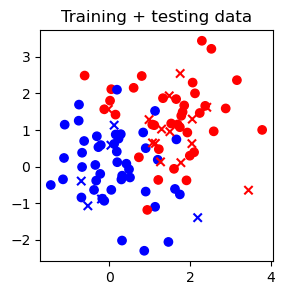

In [21]:
fig = plt.figure(figsize=(3, 3))
plt.title('Training + testing data')
plt.scatter(x_train[:, 0], x_train[:, 1], c=y_train, cmap=plt.cm.bwr)  # 'c' parameter controls the colors, 'cmap' sets the color map
plt.scatter(x_test[:, 0], x_test[:, 1], marker='x', c=y_test, cmap=plt.cm.bwr)  # 'c' parameter controls the colors, 'cmap' sets the color map

In [22]:
# Create and train the Perceptron
perceptron = Perceptron(2)

In [23]:
predictions = perceptron.predict(x_test)
predictions

array([[-0.6952412 ],
       [ 0.12461984],
       [-0.523608  ],
       [ 0.15988788],
       [-1.7138021 ],
       [-0.19160736],
       [ 0.7096729 ],
       [ 0.88143885],
       [ 0.46193656],
       [ 0.26305926],
       [ 0.49361765],
       [-0.65958977],
       [-0.3320099 ],
       [ 0.3912253 ],
       [-1.894666  ],
       [ 1.069214  ],
       [-0.08607818],
       [ 1.4752133 ],
       [ 0.35311115],
       [ 1.2860482 ]], dtype=float32)

In [24]:
perceptron.train(x_train, y_train, epochs=5000, verbose=200)

Epoch: 0, Loss: 0.8342491388320923
Epoch: 200, Loss: 0.6022453308105469
Epoch: 400, Loss: 0.4466138780117035
Epoch: 600, Loss: 0.34071269631385803
Epoch: 800, Loss: 0.2682083547115326
Epoch: 1000, Loss: 0.2184402048587799
Epoch: 1200, Loss: 0.18424129486083984
Epoch: 1400, Loss: 0.16073016822338104
Epoch: 1600, Loss: 0.1445636749267578
Epoch: 1800, Loss: 0.13344649970531464
Epoch: 2000, Loss: 0.12580128014087677
Epoch: 2200, Loss: 0.12054365873336792
Epoch: 2400, Loss: 0.11692795902490616
Epoch: 2600, Loss: 0.1144413948059082
Epoch: 2800, Loss: 0.11273135244846344
Epoch: 3000, Loss: 0.1115553230047226
Epoch: 3200, Loss: 0.11074656248092651
Epoch: 3400, Loss: 0.11019035428762436
Epoch: 3600, Loss: 0.10980784893035889
Epoch: 3800, Loss: 0.1095447763800621
Epoch: 4000, Loss: 0.1093638688325882
Epoch: 4200, Loss: 0.10923943668603897
Epoch: 4400, Loss: 0.1091538667678833
Epoch: 4600, Loss: 0.1090950146317482
Epoch: 4800, Loss: 0.10905452817678452


In [25]:
# Predict após treinamento
predictions = perceptron.predict(x_test)
loss_test = perceptron.squared_loss(predictions, y_test)
print(f"Predictions: {predictions}")
print(f"True values: {y_test}")
print(f"Loss test: {loss_test.numpy():.4f}")

Predictions: [[-0.15537651]
 [ 0.5329551 ]
 [ 0.57763255]
 [ 0.5196074 ]
 [ 0.81417495]
 [ 0.7346054 ]
 [ 0.6176122 ]
 [ 0.39591345]
 [ 0.27742636]
 [ 0.6726368 ]
 [ 0.99988496]
 [-0.04575525]
 [ 0.46877724]
 [ 0.6395277 ]
 [ 0.3943296 ]
 [ 0.8491974 ]
 [-0.06762289]
 [ 1.0223639 ]
 [ 0.8599701 ]
 [ 0.44338906]]
True values: [0. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 0. 1. 1. 0. 1. 0. 1. 1. 1.]
Loss test: 0.3452


Text(0.5, 1.0, 'Predicted data')

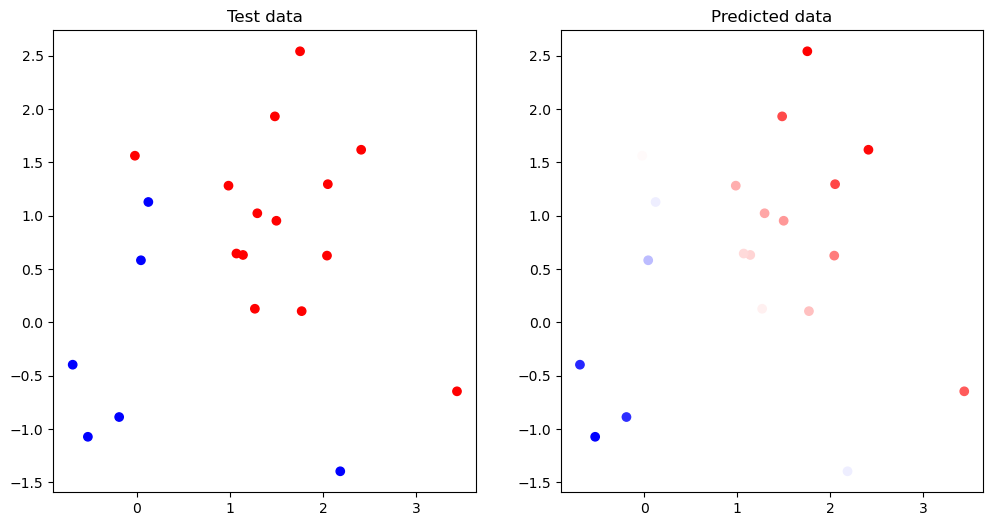

In [27]:
#plotando os dados de teste

fig = plt.figure(figsize=(12, 6))

plt.subplot(1,2,1); plt.scatter(x_test[:, 0], x_test[:, 1], c=y_test, cmap=plt.cm.bwr)
plt.subplot(1,2,1).set_title('Test data')
plt.subplot(1,2,2); plt.scatter(x_test[:, 0], x_test[:, 1], c=predictions, cmap=plt.cm.bwr)
plt.subplot(1,2,2).set_title('Predicted data')

### Redes Neurais e Arquiteturas Profundas
#### **MBA em Ciências de Dados**

### *Módulo 2*

Moacir A. Ponti - ICMC/USP


## MLP com dados estruturados


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
#import tensorflow_datasets as tfds
import keras
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import confusion_matrix

from sklearn.metrics import ConfusionMatrixDisplay
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

In [2]:
# Carregar dataset Wine Quality
#ds, ds_info = tfds.load('wine_quality/red', split='train', 
#                        as_supervised=True, with_info=True)

path = r'C:\Users\jmblima\OneDrive - Sefaz-SP\Área de Trabalho\MBA - USP\Redes Neurais\dados\winequality_white.csv'
df = pd.read_csv(path, sep=';', header=0)
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [3]:
#ds_info

In [4]:
# Conversao para DataFrame
#df = tfds.as_dataframe(ds, ds_info)

<Axes: xlabel='quality'>

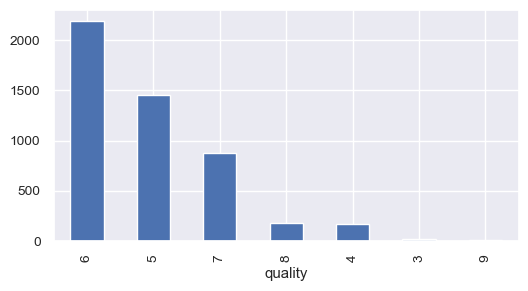

In [5]:
plt.figure(figsize=(6,3))
sns.set(font_scale=0.9)
df['quality'].value_counts().plot(kind = 'bar')

In [6]:
# Separar rótulo (Y) das features (X)
y = df['quality'].values
y_normalized = y - y.min()

X = df.drop(columns='quality').values

num_classes = np.unique(y_normalized).shape[0]

In [7]:
# Converter labels para one-hot
y_onehot = to_categorical(y_normalized, num_classes=num_classes)

In [8]:
# Divisao treinamento / teste
X_train, X_test, y_train, y_test = train_test_split(X, y_onehot, 
                                                    test_size=0.2, random_state=42)

# Normalizacao
scaler = MinMaxScaler()  # ou StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
print(f'Dataset size = {X_train_scaled.shape}')

Dataset size = (3918, 11)


In [9]:
# Modelo de Rede Neural
model = Sequential([
    Dense(4, activation='relu', input_shape=(X_train_scaled.shape[1],)),
    Dense(num_classes, activation='softmax')
])

In [10]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 4)                 48        
                                                                 
 dense_1 (Dense)             (None, 7)                 35        
                                                                 
Total params: 83 (332.00 Byte)
Trainable params: 83 (332.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [11]:
# Compilacao = definir parametros de treinamento e métricas
model.compile(optimizer='sgd', loss='categorical_crossentropy', 
              metrics=['accuracy'])

# Fit = Treinamento do modelo definindo número de épocas e batch_size
model.fit(X_train_scaled, y_train, epochs=20, batch_size=10)

Epoch 1/20
392/392 [==============================] - 1s 923us/step - loss: 1.5334 - accuracy: 0.4201
Epoch 2/20
392/392 [==============================] - 0s 897us/step - loss: 1.3302 - accuracy: 0.4507
Epoch 3/20
392/392 [==============================] - 0s 851us/step - loss: 1.3060 - accuracy: 0.4507
Epoch 4/20
392/392 [==============================] - 0s 824us/step - loss: 1.2919 - accuracy: 0.4507
Epoch 5/20
392/392 [==============================] - 0s 826us/step - loss: 1.2798 - accuracy: 0.4507
Epoch 6/20
392/392 [==============================] - 0s 810us/step - loss: 1.2684 - accuracy: 0.4525
Epoch 7/20
392/392 [==============================] - 0s 824us/step - loss: 1.2578 - accuracy: 0.4518
Epoch 8/20
392/392 [==============================] - 0s 817us/step - loss: 1.2468 - accuracy: 0.4523
Epoch 9/20
392/392 [==============================] - 0s 864us/step - loss: 1.2363 - accuracy: 0.4581
Epoch 10/20
392/392 [==============================] - 0s 834us/step - loss: 1.225

### Podemos mudar as métricas a serem acompanhadas

In [12]:
def nn_model(n_neurons=4, metrics=['accuracy']):
    # Build the Neural Network model
    model = Sequential([
        Dense(n_neurons, activation='relu', input_shape=(X_train_scaled.shape[1],)),
        Dense(num_classes, activation='softmax')
    ])
    
    # Compile the model
    model.compile(optimizer=keras.optimizers.SGD(), 
                  loss='categorical_crossentropy', metrics=metrics)

    return model

In [13]:
metrics = [
    keras.metrics.Precision(name="precision"),
    keras.metrics.Recall(name="recall"),
]

In [14]:
# Build the Neural Network model
model = nn_model(n_neurons=4, metrics=metrics)

# Train the model
history = model.fit(X_train_scaled, y_train, epochs=20, batch_size=10)

Epoch 1/20
392/392 [==============================] - 1s 1ms/step - loss: 1.5267 - precision: 0.2857 - recall: 0.0015
Epoch 2/20
392/392 [==============================] - 0s 947us/step - loss: 1.3105 - precision: 0.3595 - recall: 0.0222
Epoch 3/20
392/392 [==============================] - 0s 880us/step - loss: 1.2768 - precision: 0.3781 - recall: 0.0352
Epoch 4/20
392/392 [==============================] - 0s 849us/step - loss: 1.2592 - precision: 0.4059 - recall: 0.0595
Epoch 5/20
392/392 [==============================] - 0s 845us/step - loss: 1.2453 - precision: 0.4235 - recall: 0.0664
Epoch 6/20
392/392 [==============================] - 0s 820us/step - loss: 1.2325 - precision: 0.4519 - recall: 0.0684
Epoch 7/20
392/392 [==============================] - 0s 867us/step - loss: 1.2218 - precision: 0.4669 - recall: 0.0990
Epoch 8/20
392/392 [==============================] - 0s 839us/step - loss: 1.2128 - precision: 0.4738 - recall: 0.0947
Epoch 9/20
392/392 [======================

In [15]:
# Evaluate the model
loss, prec, recall = model.evaluate(X_test_scaled, y_test)
print("Valores :")
print("Test loss:", loss)
print("Test metrics:",  prec, recall)

31/31 [==============================] - 0s 1ms/step - loss: 1.1521 - precision: 0.5571 - recall: 0.2439
Valores :
Test loss: 1.1520522832870483
Test metrics: 0.557109534740448 0.24387754499912262


### Analisando o modelo

Aqui aparecem conceitos na prática:
* **batchsize**
* número de épocas (**epochs**). 

Uma época ocorre após treinarmos o modelo com N instâncias</br>
onde N é o total de exemplos de treinamento

In [16]:
X_train_scaled.shape

(3918, 11)

Temos 1279 exemplos de treinamento. 

Por exemplo com batchsize = 10, precisaremos de 1279/10, 
- 128 iterações (mini-batchs selecionados) para perfazer uma **época**

Com o Keras podemos plotar as funções de perda ao longo do treinamento

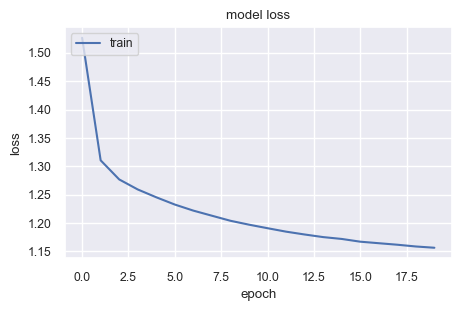

In [17]:
fig = plt.figure(figsize=(5,3))
sns.set(font_scale=0.8)
plt.plot(history.history["loss"])
plt.title("model loss")
plt.ylabel("loss")
plt.xlabel("epoch")
plt.legend(["train"], loc="upper left")
plt.show()

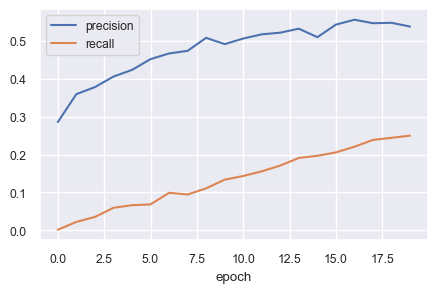

In [18]:
fig = plt.figure(figsize=(5,3))
plt.plot(history.history["precision"], label='precision')
plt.plot(history.history["recall"], label='recall')
plt.xlabel("epoch")
plt.legend(loc="upper left")
plt.show()

In [19]:
# Computando as métricas para o teste
score = model.evaluate(X_test, y_test, verbose=0)

In [20]:
print("Precisao: ", score[1])
print("Revocacao: ", score[2])

Precisao:  0.29591837525367737
Revocacao:  0.29591837525367737


In [21]:
y_pred = model.predict(X_test, verbose=0)
y_pred_class = np.argmax(y_pred, axis = 1)
result = confusion_matrix(np.argmax(y_test,axis=1), y_pred_class, normalize='pred')

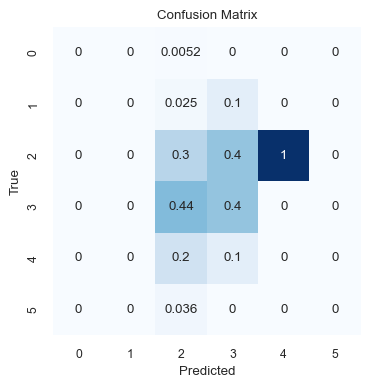

In [22]:
plt.figure(figsize=(4, 4))
sns.set(font_scale=0.8)
sns.heatmap(result, annot=True, cmap='Blues', cbar=False, square=True)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

### Desbalanceamento


In [23]:
labels, counts = np.unique(y_normalized, return_counts=True)
labels,counts

(array([0, 1, 2, 3, 4, 5, 6], dtype=int64),
 array([  20,  163, 1457, 2198,  880,  175,    5], dtype=int64))

Uma das formas de mitigar é gerar pesos para as classes

Aqui faremos o peso inversamente proporcional à sua distribuição no treinamento

In [24]:
class_weight = {}
total = sum(counts)
for l,c in zip(labels, counts):
    class_weight[l] = round(1-(c/total),8)

class_weight

{0: 0.9959167,
 1: 0.96672111,
 2: 0.70253165,
 3: 0.55124541,
 4: 0.82033483,
 5: 0.96427113,
 6: 0.99897918}

### Outros ajustes:

- Tamanho do batch e learning rate
- Número de neurônios

In [25]:
def nn_model(n_neurons=(4,), metrics=['accuracy'], learning_rate=0.1):
    # Build the Neural Network model
    model = Sequential()
    model.add(Dense(n_neurons[0], activation='relu', 
                    input_shape=(X_train_scaled.shape[1],)))
    
    for lay in range(len(n_neurons)-1):
        model.add(Dense(n_neurons[lay], activation='relu'))
        
    model.add(Dense(num_classes, activation='softmax'))
    
    # Compile the model
    model.compile(optimizer=keras.optimizers.SGD(learning_rate), 
                  loss='categorical_crossentropy', metrics=metrics)

    return model

In [32]:
model2 = nn_model(n_neurons=(16,), metrics=metrics, learning_rate=0.15)

# Train the model
history = model2.fit(X_train_scaled, y_train, epochs=90, batch_size=32,
                    class_weight=class_weight)

Epoch 1/90
123/123 [==============================] - 1s 1ms/step - loss: 0.9933 - precision: 0.3920 - recall: 0.0241
Epoch 2/90
123/123 [==============================] - 0s 1ms/step - loss: 0.9282 - precision: 0.3750 - recall: 7.6570e-04
Epoch 3/90
123/123 [==============================] - 0s 1ms/step - loss: 0.8955 - precision: 0.5143 - recall: 0.0092
Epoch 4/90
123/123 [==============================] - 0s 1ms/step - loss: 0.8679 - precision: 0.5508 - recall: 0.0526
Epoch 5/90
123/123 [==============================] - 0s 1ms/step - loss: 0.8550 - precision: 0.5109 - recall: 0.0957
Epoch 6/90
123/123 [==============================] - 0s 1ms/step - loss: 0.8464 - precision: 0.5351 - recall: 0.1325
Epoch 7/90
123/123 [==============================] - 0s 1ms/step - loss: 0.8397 - precision: 0.5357 - recall: 0.1434
Epoch 8/90
123/123 [==============================] - 0s 1ms/step - loss: 0.8349 - precision: 0.5442 - recall: 0.1554
Epoch 9/90
123/123 [==============================] 

In [33]:
# Computando as métricas para o teste
score2 = model2.evaluate(X_test, y_test, verbose=0)
print("Precisao: ", score2[1])
print("Revocacao: ", score2[2])

Precisao:  0.2928571403026581
Revocacao:  0.2928571403026581


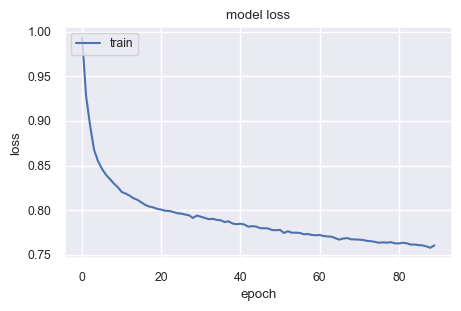

In [34]:
fig = plt.figure(figsize=(5,3))
sns.set(font_scale=0.8)
plt.plot(history.history["loss"])
plt.title("model loss")
plt.ylabel("loss")
plt.xlabel("epoch")
plt.legend(["train"], loc="upper left")
plt.show()

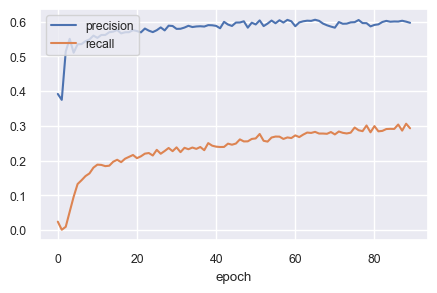

In [35]:
fig = plt.figure(figsize=(5,3))
plt.plot(history.history["precision"], label='precision')
plt.plot(history.history["recall"], label='recall')
plt.xlabel("epoch")
plt.legend(loc="upper left")
plt.show()

In [30]:
y_pred = model2.predict(X_test, verbose=0)
y_pred_class = np.argmax(y_pred, axis = 1)
result = confusion_matrix(np.argmax(y_test,axis=1), y_pred_class, normalize='pred')

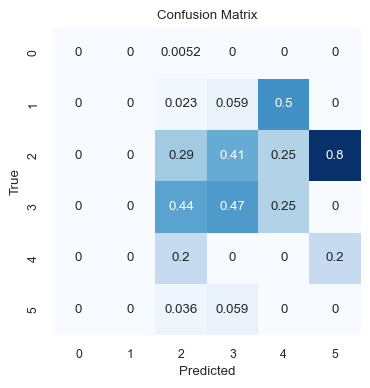

In [31]:
plt.figure(figsize=(4, 4))
sns.set(font_scale=0.8)
sns.heatmap(result, annot=True, cmap='Blues', cbar=False, square=True)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

## Modulo 2 - Embeddings de Modelos Pré-treinados - Imagens
### Rede Convolucional Supervisionada Pré-treinada

In [1]:
import numpy as np
import tensorflow as tf
import tensorflow_datasets as tfds

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.decomposition import PCA

In [ ]:
# Load the CIFAR-10 dataset from TensorFlow Datasets
(ds_train, ds_test), ds_info = tfds.load('cifar10', split=['train[:10%]', 'test[:10%]'], 
                                         as_supervised=True, with_info=True)
num_classes = ds_info.features['label'].num_classes

In [3]:
# Funcao para exterair os labels apenas
def extract_labels(image, label):
    return label

# Obter os labels
ds_train_labels = ds_train.map(extract_labels)
ds_test_labels = ds_test.map(extract_labels)
# converter para numpy array
train_labels = np.array(list(ds_train_labels.as_numpy_iterator()))
test_labels = np.array(list(ds_test_labels.as_numpy_iterator()))

In [4]:
# Preprocessamento do dataset de imagens
def preprocess_image(image, label):
    # tamanho das imagens 224x224
    image = tf.image.resize(image, (224, 224))
    # usa o preprocessamento do modelo "mobilenet_v2"
    image = tf.keras.applications.mobilenet_v2.preprocess_input(image)
    return image, label

# Preprocessa imagens em batches
ds_train = ds_train.map(preprocess_image).batch(32)
ds_test = ds_test.map(preprocess_image).batch(32)

In [5]:
# Carrega um modelo base, sem incluir o classificador (include_top = False)
# esse modelo foi pretreinado na ImageNet
# ver https://keras.io/api/applications/
base_model = tf.keras.applications.MobileNetV2(include_top=False,
                                               weights='imagenet',
                                               input_shape=(224, 224, 3))

#base_model.summary()

In [6]:
# Como o modelo não tem a camada de classificacao, 
# o predict aqui nos gera como saída os embeddings
features_train = base_model.predict(ds_train)
features_test = base_model.predict(ds_test)

32/32 [==============================] - 37s 1s/step


In [7]:
# Agora achatamos o resultado pois a saída são tensores e não vetores
features_train_flat = features_train.reshape(len(features_train), -1)
features_test_flat = features_test.reshape(len(features_test), -1)

In [8]:
features_train_flat.shape

(5000, 62720)

### Aplicando as features obtidas em um classificador

1. Redução da dimensonalidade
2. Treinamento do classificador

In [14]:
# PCA para reduzir a dimensionalidade
pca = PCA(n_components=1000)
pca.fit(features_train_flat)

# Transformacao e obtencao dos componentes principais
compressed_features_train = pca.transform(features_train_flat)
compressed_features_test = pca.transform(features_test_flat)

In [ ]:
logreg_classifier = LogisticRegression(max_iter=1000, multi_class='auto')
logreg_classifier.fit(compressed_features_train, train_labels)

In [16]:
# Avaliando o classificador
predictions = logreg_classifier.predict(compressed_features_test)
accuracy = accuracy_score(test_labels, predictions)
print("Test accuracy:", accuracy)

Test accuracy: 0.822


## *Modulo 2* - Embeddings de Modelos Pré-treinados - Texto

## Modelos Sentence Transformer

In [ ]:
!pip install sentence_transformers

In [3]:
import numpy as np
import tensorflow_datasets as tfds

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

from sentence_transformers import SentenceTransformer

In [4]:
# IMDb movie reviews dataset
(ds_train, ds_test), ds_info = tfds.load('imdb_reviews', split=['train[:10%]', 'test[:5%]'],
                                         as_supervised=True, with_info=True)

# pega numero de classes
num_classes = ds_info.features['label'].num_classes

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/3 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/25000 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/imdb_reviews/plain_text/1.0.0.incompletePO3K2K/imdb_reviews-train.tfrecord…

Generating test examples...:   0%|          | 0/25000 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/imdb_reviews/plain_text/1.0.0.incompletePO3K2K/imdb_reviews-test.tfrecord*…

Generating unsupervised examples...:   0%|          | 0/50000 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/imdb_reviews/plain_text/1.0.0.incompletePO3K2K/imdb_reviews-unsupervised.t…

Dataset imdb_reviews downloaded and prepared to /root/tensorflow_datasets/imdb_reviews/plain_text/1.0.0. Subsequent calls will reuse this data.


In [5]:
# extraindo textos e respectivos rotulos
texts_train  = np.array([x.numpy().decode('utf-8') for x, _ in ds_train])
labels_train = np.array([y for _, y in ds_train])

texts_test  = np.array([x.numpy().decode('utf-8') for x, _ in ds_test])
labels_test = np.array([y for _, y in ds_test])

In [6]:
texts_train[:2], labels_train[:2]

(array(["This was an absolutely terrible movie. Don't be lured in by Christopher Walken or Michael Ironside. Both are great actors, but this must simply be their worst role in history. Even their great acting could not redeem this movie's ridiculous storyline. This movie is an early nineties US propaganda piece. The most pathetic scenes were those when the Columbian rebels were making their cases for revolutions. Maria Conchita Alonso appeared phony, and her pseudo-love affair with Walken was nothing but a pathetic emotional plug in a movie that was devoid of any real meaning. I am disappointed that there are movies like this, ruining actor's like Christopher Walken's good name. I could barely sit through it.",
        'I have been known to fall asleep during films, but this is usually due to a combination of things including, really tired, being warm and comfortable on the sette and having just eaten a lot. However on this occasion I fell asleep because the film was rubbish. The plot 

In [7]:
_, counts = np.unique(labels_train, return_counts=True)
counts

array([1265, 1235])

In [8]:
texts_train.shape, texts_test.shape

((2500,), (1250,))

In [9]:
# Carregando um Sentence Transformer
# modelos pré-treinados: https://www.sbert.net/docs/pretrained_models.html
model_pretrained = SentenceTransformer('distiluse-base-multilingual-cased-v1')

In [11]:
# Obtem os embeddings
embeddings_train = model_pretrained.encode(texts_train, 
                                           show_progress_bar=True, 
                                           batch_size=16)

embeddings_test = model_pretrained.encode(texts_test, show_progress_bar=True, batch_size=16)

Batches:   0%|          | 0/157 [00:00<?, ?it/s]

Batches:   0%|          | 0/79 [00:00<?, ?it/s]

### Aplicando as features obtidas em um classificador

In [12]:
# Treinando um Logistic Regression Classifier com os embeddings obtidos
logreg_classifier = LogisticRegression(max_iter=1000, multi_class='auto')
logreg_classifier.fit(embeddings_train, labels_train)

# predizendo para conjunto de teste e avaliando
predictions = logreg_classifier.predict(embeddings_test)
accuracy = accuracy_score(labels_test, predictions)
print("Test accuracy:", accuracy)

Test accuracy: 0.7736


## <span style="color:darkred">Módulo II</span>
### <span style="color:darkred">Avaliação (com soluções)</span>

---
### Questão 1)

Seja uma rede neural para classificação binária com seus parâmetros inicializados aleatoriamente e cuja saída tem um neurônio com ativação tangente hiperbólica. Executamos o passo "Forward" com uma única instância que sabemos ser positiva e o resultado foi 1.0. O que podemos dizer sobre esse modelo?

(a) O modelo está superconfiante na classe positiva e pode ser usado com sucesso para novas instâncias pois irá gerar saídas próximas a 1.0<br>
(b) O modelo acertou a classe da instância, indicando que pode ser usado com sucesso em novas instâncias, inclusive da classe negativa, desde que seja  substituida a função de ativação para sigmoide<br>
(c) O modelo acertou a classe da instância, indicando que pode ser usado com sucesso em novas instâncias, inclusive da classe negativa, desde que seja  substituida a função de ativação para softmax<br>
(d) O modelo está superconfiante nessa instância, porém seria necessário verificar sua saída também em uma única instância negativa para verificar se estaria pronto para ser utilizado amplamente<br>
<font color='red'>(e) O modelo está superconfiante nessa instância, mas seria necessário avaliar sua qualidade usando uma função de custo e um conjunto maior de treinamento<br></font>

**Justificativa**: Considerando que a ativação é hiperbólica, o valor máximo é 1.0, assim podemos considerar que o modelo está superconfiante nessa instância, tendo acertado sua classe. Não é possível dizer isso para toda a classe positiva, e asim apenas para a instância em questão, o que invalida a opção (a). Também não há garantias de que outras novas instâncias terão o mesmo sucesso, mesmo modificando a função de ativação para outras como sigmóide e softmax, invalidando as opções (b) e (c). Finalmente, avaliar sua saída em uma única instância negativa não nos dá garantias de que possa ser utilizado amplamente. De fato, a avaliação do modelo deve ser feita preferencialmente usando uma métrica ou função de custo sobre um conjunto mais amplo de dados, e assim a alternativa (e) é a correta.

---
### Questão 2)


Qual o papel do **gradiente** no treinamento de redes neurais?

<font color='red'>(a) Prover a direção e magnitude na qual cada parâmetro poderá ser adaptado de forma a reduzir o custo</font><br>
(b) Avaliar a qualidade do modelo atual, sendo que quanto menor o valor de sua saída, melhor é o modelo<br>
(c) Avaliar a qualidade do modelo atual, sendo que quanto maior o valor de sua saída, melhor é o modelo<br>
(d) Inicializar os parâmetros do modelo de forma a assegurar a melhor <br>
(e) Prover um novo valor, com base na função de custo, que irá substituir o parâmetro atual<br>

**Justificativa**: O gradiente não tem como objetivo avaliar qualidade (essa comumente é avaliada por uma função de custo), invalidando as alternativas (b) e (c). Também não tem ligação com a inicialização, invalidando a alternativa (d). O valor que gera o gradiente não é usado para substituir o parâmetro atual, portanto (e) é inválida. O gradiente é uma função que provê uma direção (sinal) e magnitude que é usado por um algoritmo de otimização para adaptar o parâmetro para minimizar a função de custo.

---
### Questão 3)

Considere que vamos utilizar uma rede neural pré-treinada usando uma tarefa auto-supervisionada genérica para dados textuais. Primeiramente utilizamos uma rede neural que foi treinada para a tarefa de predizer palavras ocultadas em um texto com bases de dados públicas. A seguir, aproveitamos esse modelo para obter características com base no embedding da tarefa base, porém para um problema alvo diferente, o de classificação em texto. Podemos dizer que:

(a) Como raramente há dados abundantes para o pré-treinamento, o qual depende da variabilidade e quantidade de dados, esse processo pode não gerar bons resultados<br>
<font color='red'>(b) O modelo pré-treinado pode prover boas representações para a tarefa alvo devido à generalidade, variabilidade e quantidade de dados com o qual a tarefa base foi treinada.<br></font>
(c) O modelo pré-treinado pode não ter boa qualidade para a tarefa alvo em questão, pois nenhum dos rótulos foram obtidos por anotação manual/humana<br>
(d) O ideal é reinicializar o modelo pré-treinado para treiná-lo desde zero com a tarefa alvo usando aprendizado supervisionados<br>
(e) O modelo pré-treinado gera cortes no espaço de características original que possui tarefa diferente da tarefa alvo, assim será necessário treinar um classificador novo, do zero, usando uma nova tarefa auto-supervisionada.<br>

**Justificativa**: As tarefas auto-supervisionadas permitem gerar os alvos diretamente a partir dos dados, tornando a quantidade de dados disponíveis abundante - esse fato invalida a opção (a). O fato de não ser computado a partir de anotação humana não significa que as representações sejam ruins pois a quantidade e variabilidade dos dados de origem é o foco dessa abordagem - invalidando a opção (c).  O uso de modelos pré-treinados autosupervisionado é não treinar desde o zero - invalidando a opção (d). Igualmente, usar uma nova tarefa auto-supervisionada não é necessário se a tarefa inicial foi genérica - invalidando a opção (e). Assim, a opção válida é a (b)

---
### Questão 4)

Qual o motivo de utilizar mais do que um neurônio Perceptron em paralelo numa camada oculta (antes da saída) da rede neural Multilayer Perceptron?

(a) Permitir o uso de aprendizado profundo, o qual possui vantagens sobre o aprendizado de máquina "raso"<br>
<font color='red'>(b) Cada neurônio aprende uma função linear independente utilizando como base os dados de entrada, permitindo aproximar funções mais complexas<br></font>
(c) Reduzir a dimensionalidade dos dados de entrada por meio de uma projeção das características, de forma a facilitar a classificação final no cenário multiclasse<br>
(d) Mais do que um neurônio permite treinar a rede neural profunda por meio de mini-batch stochastic gradient descent, permitindo um treinamento mais eficiente em particular em bases de dados grandes<br>
(e) Viabilizar um treinamento de um modelo com maior acurácia pois serão feitas múltiplas adaptações da rede neural para cada minibatch<br>

**Justificativa**: Cada neurônio Perceptron ajusta uma função linear. Ao aumentar a quantidade de neurônios estamos gerando uma nova função linear aprendida de forma paralela às demais. Isso permite aproximar funções cada vez mais complexas conforme aumentamos o número de neurônios. Alternativas incorretas: (a) ao aumentar a quantidade de neurônios temos um modelo maior em "largura" e não em profundidade; (c) ao aumentar a quantidade de neurônios, se aumenta a dimensionalidade, além disso não é esse o objetivo exato do incremento de neurônios e não se relaciona necessariamente com o cenário multiclasse; (d) o número de neurônios não se relaciona com o treinamento com algoritmos baseados em gradiente; (e) não necessariamente utilizar mais do que um neurônio viabiliza maior acurácia - no caso de um problema linearmente separável por exemplo um neurônio é suficiente.

---

### Questão 5)

Instale o pacote `tensorflow_datasets`. Defina as sementes aleatórias do numpy para 3 e do tensorflow para 1, depois carregue a base de dados `wine_quality` da biblioteca Tensorflow Datasets, conforme código abaixo para entender o problema.

O objetivo dessa base de dados é obter a qualidade de um rótulo de vinho com base nas características de entrada. Assim, os valores alvo (target) são escalares, tipicamente entre 0 e 10 (representando um tipo de nota do vinho).  Para essa formulação, queremos que o valor alvo (target) seja um único número escalar (representando o valor da nota do vinho), portanto a saída da rede deve gerar um único número entre 0 e 10.

Utilizando a biblioteca Keras, formule um modelo de rede neural sequencial, do tipo MLP, com 3 camadas ocultas contendo, respectivamente, 128, 128 e 8 neurônios, todas com função de ativação do tipo `relu`. A rede deve ser montada de forma a ser capaz de resolver o problema com relação ao alvo, mas não é necessário treiná-la para essa questão.

Quantos parâmetros essa rede possui na primeira camada, e no total?

(a) primeira 1408, no total 1153<br>
(b) primeira 1408, no total 18824<br>
(c) primeira 1536, no total 18824<br>
<font color='red'>(d) primeira 1536, no total 19089<br></font>
(e) primeira 768, no total 3937<br>

 **Justificativa**: ver código abaixo

In [1]:
from numpy.random import seed
from tensorflow.random import set_seed

import tensorflow as tf
import tensorflow_datasets as tfds

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

In [ ]:
train_data, info_data = tfds.load("wine_quality", split='train', as_supervised=True, with_info=True)

n_feats = len(info_data.features['features'])
print(f'\nQuantidade de features: {n_feats}')
for feat, feat_type in info_data.features['features'].items():
    print(f'- {feat}: {feat_type.dtype}')

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/4898 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/wine_quality/white/1.0.0.incompleteK1RQOW/wine_quality-train.tfrecord*...:…

Dataset wine_quality downloaded and prepared to /root/tensorflow_datasets/wine_quality/white/1.0.0. Subsequent calls will reuse this data.



Quantidade de features: 11
- fixed acidity: <dtype: 'float32'>
- volatile acidity: <dtype: 'float32'>
- citric acid: <dtype: 'float32'>
- residual sugar: <dtype: 'float32'>
- chlorides: <dtype: 'float32'>
- free sulfur dioxide: <dtype: 'float32'>
- total sulfur dioxide: <dtype: 'float32'>
- density: <dtype: 'float32'>
- pH: <dtype: 'float32'>
- sulphates: <dtype: 'float64'>
- alcohol: <dtype: 'float32'>


In [5]:
seed(3)
set_seed(1)

model = Sequential(
    [
        Dense(128, activation="relu", input_shape=(n_feats,)),
        Dense(128, activation="relu"),
        Dense(8, activation="relu"),
        Dense(1, activation="relu"),
    ]
)
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 128)               1536      
                                                                 
 dense_5 (Dense)             (None, 128)               16512     
                                                                 
 dense_6 (Dense)             (None, 8)                 1032      
                                                                 
 dense_7 (Dense)             (None, 1)                 9         
                                                                 
Total params: 19089 (74.57 KB)
Trainable params: 19089 (74.57 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________



### Questão 5 - AS2

Instale o pacote `tensorflow_datasets`. Defina as sementes aleatórias do numpy para 3 e do tensorflow para 1, depois carregue a base de dados `wine_quality` da biblioteca Tensorflow Datasets, conforme código abaixo para entender o problema.

O objetivo dessa base de dados é obter a qualidade de um rótulo de vinho com base nas características de entrada. Assim, os valores alvo (target) são escalares, tipicamente entre 0 e 10 (representando um tipo de nota do vinho).  Para essa formulação, queremos que o valor alvo (target) seja um único número escalar (representando o valor da nota do vinho), portanto a saída da rede deve gerar um único número entre 0 e 10.

Utilizando a biblioteca Keras, formule um modelo de rede neural sequencial, do tipo MLP, com 3 camadas ocultas contendo, respectivamente, 128, 128 e 8 neurônios, todas com função de ativação do tipo `relu`. A rede deve ser montada de forma a ser capaz de resolver o problema com relação ao alvo, mas não é necessário treiná-la para essa questão.

Quantos parâmetros essa rede possui na primeira camada, e no total?

(a) primeira 1408, no total 1153<br>
(b) primeira 1408, no total 18824<br>
(c) primeira 1536, no total 18824<br>
(d) primeira 1536, no total 19089<br>
(e) primeira 768, no total 3937<br>

# Implementação com Tensorflow e Keras

In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import keras
import seaborn as sns

from keras.optimizers import RMSprop
from keras.callbacks import History

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

In [2]:
# Carregar dataset Wine Quality

path = r'C:\Users\jmblima\OneDrive - Sefaz-SP\Área de Trabalho\MBA - USP\Redes Neurais\dados\winequality_white.csv'
df = pd.read_csv(path, sep=';', header=0)
path = r'C:\Users\jmblima\OneDrive - Sefaz-SP\Área de Trabalho\MBA - USP\Redes Neurais\dados\winequality_red.csv'
df2 = pd.read_csv(path, sep=';', header=0)

df = pd.concat([df, df2], axis=0)
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


<Axes: xlabel='quality'>

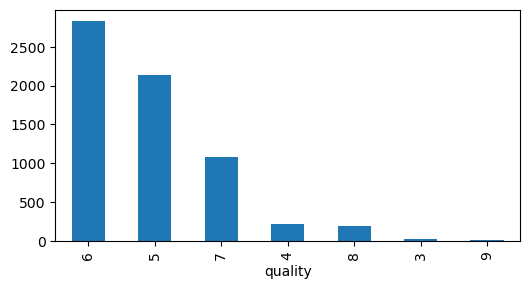

In [3]:
plt.figure(figsize=(6,3))
df['quality'].value_counts().plot(kind = 'bar')

In [4]:
y = df['quality'].values
y_normalized = y
X = df.drop(columns='quality').values

# Dividir o conjunto em teste e treino
X_train, X_test, y_train, y_test = train_test_split(X, y_normalized , test_size=0.2, random_state=42)

In [5]:
# Normalizacao de X
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()  # ou StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
print(f'Dataset size = {X_train_scaled.shape}')

Dataset size = (5197, 11)


In [6]:
## funcao para retornar modelo em Keras
model = Sequential([
    Dense(128, activation='relu', name="layer1", input_shape=(X_train_scaled.shape[1],)),
    Dense(128, activation='relu', name="layer2"),
    #Dense(8, activation='relu', name="layer3"),
    #Dense(8, activation='relu', name="layer4"),
    #Dense(8, activation='relu', name="layer5"),
    #Dense(8, activation='relu', name="layer6"),
    #Dense(8, activation='relu', name="layer7"),
    Dense(8, activation='softmax', name="layer8"),
    Dense(1, name="Output")]
    )



In [7]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer1 (Dense)              (None, 128)               1536      
                                                                 
 layer2 (Dense)              (None, 128)               16512     
                                                                 
 layer8 (Dense)              (None, 8)                 1032      
                                                                 
 Output (Dense)              (None, 1)                 9         
                                                                 
Total params: 19089 (74.57 KB)
Trainable params: 19089 (74.57 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [8]:
# compilar modelo com configuracoes de otimizacao
# Compile the model
model.compile(loss='mean_squared_error', optimizer=RMSprop(learning_rate=0.01), metrics=["mean_absolute_error"])

# treinamento
history = model.fit(X_train_scaled, y_train, epochs=100, batch_size=256)

# avaliacao

Epoch 1/100
21/21 [==============================] - 1s 2ms/step - loss: 23.3470 - mean_absolute_error: 4.7411
Epoch 2/100
21/21 [==============================] - 0s 2ms/step - loss: 18.5781 - mean_absolute_error: 4.2178
Epoch 3/100
21/21 [==============================] - 0s 1ms/step - loss: 15.3097 - mean_absolute_error: 3.8108
Epoch 4/100
21/21 [==============================] - 0s 1ms/step - loss: 12.4103 - mean_absolute_error: 3.4101
Epoch 5/100
21/21 [==============================] - 0s 1ms/step - loss: 9.8528 - mean_absolute_error: 3.0108
Epoch 6/100
21/21 [==============================] - 0s 2ms/step - loss: 7.6318 - mean_absolute_error: 2.6186
Epoch 7/100
21/21 [==============================] - 0s 2ms/step - loss: 5.7392 - mean_absolute_error: 2.2313
Epoch 8/100
21/21 [==============================] - 0s 2ms/step - loss: 4.1641 - mean_absolute_error: 1.8514
Epoch 9/100
21/21 [==============================] - 0s 2ms/step - loss: 2.9082 - mean_absolute_error: 1.4953
Epoch 

In [9]:
# Evaluate the model on the test data using `evaluate`
print("Evaluate on test data")
results = model.evaluate(X_test_scaled, y_test, batch_size=100)
print("test loss, test acc:", results)

Evaluate on test data
13/13 [==============================] - 0s 1ms/step - loss: 0.4803 - mean_absolute_error: 0.5433
test loss, test acc: [0.48032376170158386, 0.5433313250541687]


In [10]:
y_pred = model.predict(X_test_scaled)


41/41 [==============================] - 0s 825us/step


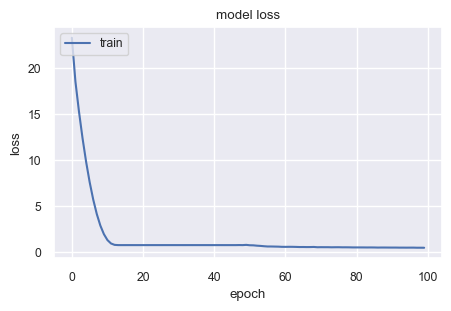

In [11]:
fig = plt.figure(figsize=(5,3))
sns.set(font_scale=0.8)
plt.plot(history.history["loss"])
plt.title("model loss")
plt.ylabel("loss")
plt.xlabel("epoch")
plt.legend(["train"], loc="upper left")
plt.show()

<Figure size 600x1200 with 0 Axes>

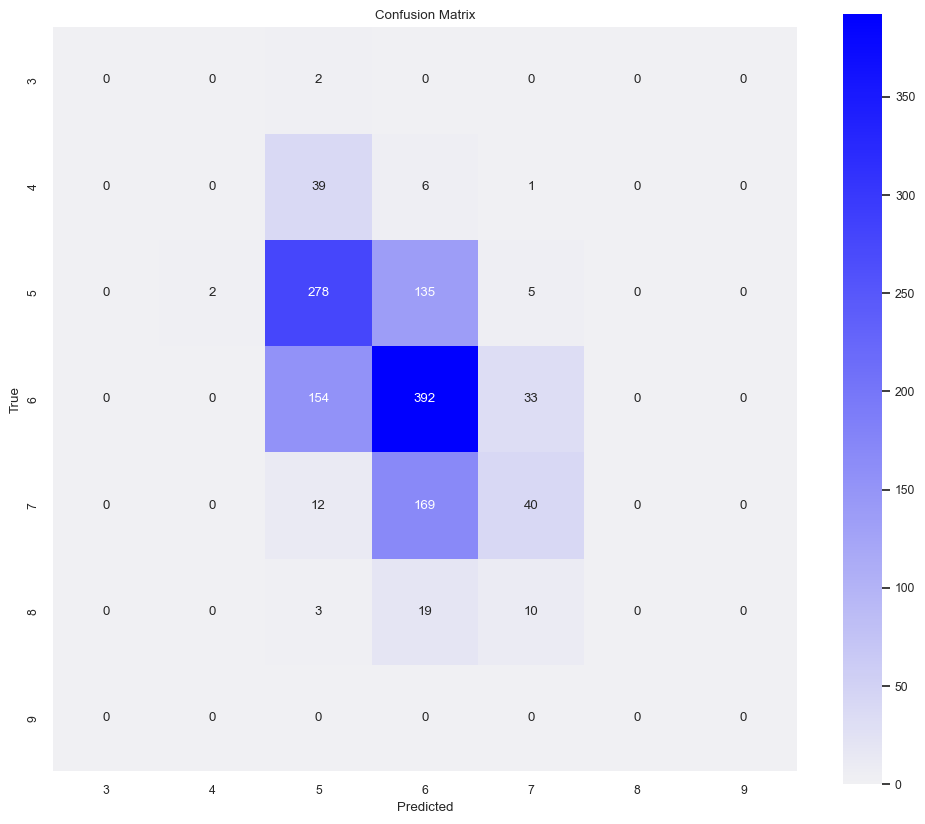

In [12]:
#Matriz de confusão

labels = [3,4,5,6,7,8,9]
y_pred = np.rint(y_pred)

result = confusion_matrix(y_test, y_pred, labels=labels)

plt.figure(figsize=(6, 12))
f, ax = plt.subplots(figsize=(12,10))
cmap = sns.light_palette('blue',n_colors=8, as_cmap=True)
sns.heatmap(result, annot=True, cmap=cmap, square=True, fmt='d', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

## <span style="color:darkred">Módulo 2</span>
### <span style="color:darkred">Exercícios com soluções</span>

### Exercício 1)

Utilizando a biblioteca Keras, formule um modelo de rede neural sequencial, do tipo MLP, cuja entrada seja preparada para receber um vetor de 100 dimensões e que possua 2 camadas ocultas, cada uma com 50 neurônios, e 1 camada de saída, com 3 neurônios e função de ativação softmax.

Quantos parâmetros, no total, essa rede possui?

(a) 203<br>
(b) 10303<br>
(c) 7651<br>
<font color='red'>(d) 7753<br></font>

In [1]:
from tensorflow import keras

model1 = keras.Sequential(
    [
        keras.layers.Dense(50, activation="relu", input_shape=(100,)),
        keras.layers.Dense(50, activation="relu"),
        keras.layers.Dense(3, activation="softmax"),
    ]
)
model1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 50)                5050      
                                                                 
 dense_1 (Dense)             (None, 50)                2550      
                                                                 
 dense_2 (Dense)             (None, 3)                 153       
                                                                 
Total params: 7753 (30.29 KB)
Trainable params: 7753 (30.29 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


---

### Exercício 2)

Considerando que temos uma base de dados de treinamento com 8000 exemplos. Definindo o tamanho do lote (minibatch size) como sendo 50, quantas iterações o algoritmo backpropagation deverá executar, adaptando os parâmetros da rede, para completar 5 épocas?

<font color='red'>(a) 800<br></font>
(a) 160<br>
(b) 801<br>
(c) 250<br>

In [2]:
N = 8000
batchsize = 50

iteracoes_epoca = N/batchsize
iteracoes_epoca * 5

800.0

---

### Exercício 3)

Qual a diferença entre as funções de ativação *sigmoide* e *softmax* aplicadas a uma camada de uma rede neural?

(a) a sigmóide produz como saída vetores cuja somatória é 1 e que podem ser interpretados como uma distribuição de probabilidade, enquanto a softmax comprime os valores da saída entre 0 e 1 <br>
(b) a sigmóide produz como saída vetores cujos valores estão entre -1 e 1, enquanto a softmax comprime os valores da saída entre 0 e 1<br>
<font color='red'>(c) a sigmóide comprime os valores da saída entre 0 e 1, enquanto a softmax produz como saída vetores cuja somatória é 1 e que podem ser interpretados como uma distribuição de probabilidade<br></font>
(d) a sigmóide produz como saída vetores cujos valores individuais estão entre 0 e 1 utilizando uma função suave, enquanto a softmax produz vetores no formato one-hot-encoding compatíveis


---

### Exercício 4)

Qual a diferença entre os algoritmos Gradient Descent e Stochastic Gradient Descent?

 (a) O Stochastic Gradient Descent utiliza a perda quadrática para realizar o treinamento, enquanto o Gradient Descent utiliza a função da entropia cruzada para otimizar os parâmetros<br>
 (b) O Gradient Descent utiliza a perda quadrática para realizar o treinamento, enquanto o Stochastic Gradient Descent utiliza a função da entropia cruzada para otimizar os parâmetros<br>
 <font color='red'>(c) O Gradient Descent carrega todos os dados de treinamento na memória para realizar o cômputo da função de custo e adaptar os parâmetros, enquanto o Stochastic Gradient Descent seleciona aleatoriamente um subconjunto de instâncias para realizar cada iteração.</font><br>
 (d) O Stochastic Gradient Descent carrega todos os dados de treinamento na memória para realizar o cômputo da função de custo e adaptar os parâmetros, enquanto o Gradient Descent seleciona aleatoriamente um subconjunto de instâncias para realizar cada iteração.<br>
 
 **Justificativa**: Auto-supervisão tem a intenção de diminuir a dependência de grandes quantidades de dados rotulados, permitindo que se utilize dados raspados da Internet ou obtidos de forma automática para gerar um modelo inicial que possa ser transferido para tarefas específicas.


---

### Exercício 5)

Para qual cenário a auto-supervisão é uma técnica útil?

 (a) Processar dados não estruturados de qualquer origem criando um classificador diretamente a partir dos dados sem a necessidade de rotulação, e posteriormente classificar novas imagens utilizando esse modelo.<br>
 (b) Pré-processar grandes bases de dados de forma a eliminar outliers, ruído e outros efeitos indesejados nessa base de dados, garantindo maior acurácia para dados futuros.<br>
 <font color='red'>(c) Coletar e utilizar grandes quantidades de dados não anotados, e obter um modelo inicial que possa ser utilizado como base para adaptar modelos para problemas específicos, vencendo a barreira de anotar dados massivamente.</font><br>
 (d) Para base de dados pequenas em que não se dispõe de grande quantidades de exemplos para treinar redes neurais profundas para tarefas de classificação e regressão, pois essa técnica realiza aumento de dados de forma nativa.<br>
 
 **Justificativa**: Auto-supervisão tem a intenção de diminuir a dependência de grandes quantidades de dados rotulados, permitindo que se utilize dados raspados da Internet ou obtidos de forma automática para gerar um modelo inicial que possa ser transferido para tarefas específicas.


---

### Exercício 6)

Instale o pacote `tensorflow_datasets`. Defina as sementes aleatórias do numpy para 1 e do tensorflow para 2, depois carregue a base de dados `iris` da biblioteca Tensorflow Datasets, conforme código abaixo. 

O objetivo dessa base de dados é classificar flores a partir de 4 características de entrada referentes à tamanhos de sépala e pétala. Assim, os valores alvo (target) são 3 classes possíveis.

Considerando o valor alvo descrito, e que você tem disponíveis as funções de ativação: sigmóide, relu, tangente hiperbólica e softmax, escolha as funções mais adequadas e monte uma arquitetura da rede com 2 camadas ocultas com 12 neurônios na primeira, e 8 neurônios na segunda.

Como deve ficar a arquitetura da rede neural?

(a) 2 camadas com 12 e 8 neurônios, 164 parâmetros e função de ativação relu na camada de saída<br>
(b) 3 camadas com 12, 8 e 1 neurônios, 173 parâmetros e função de ativação sigmóide na camada de saída<br>
(c) 4 camadas com 4, 12, 8 e 3 neurônios, 211 parâmetros e função de ativação softmax na camada de saída<br>
<font color='red'>(d) 3 camadas com 12, 8 e 3 neurônios, 191 parâmetros e função de ativação softmax na camada de saída<br></font>


**Justificativa**: como a saída precisa ser uma de 3 classes, temos a última camada com a função softmax. A primeira camada recebe as 4 features diretamente, seguida por 12 e 8 neuronios. Ver código abaixo.

In [3]:
from numpy.random import seed
seed(1)
from tensorflow.random import set_seed
set_seed(2)

import tensorflow as tf
import tensorflow_datasets as tfds

(train_data, test_data), info_data = tfds.load("iris",split=['train[:90%]','train[90%:]'], as_supervised=True, with_info=True)

print('Tamanho do conjunto de treinamento: ', len(train_data))
print('Tamanho do conjunto de teste: ', len(test_data))

n_class = info_data.features['label'].num_classes
print(f'Número de classes: {n_class}')

n_feats = info_data.features['features'].shape[0]
print(f'Quantidade de features: {n_feats}')

IndentationError: unexpected indent (shuffle.py, line 79)

In [ ]:
model2 = keras.Sequential(
    [
        keras.layers.Dense(12, activation="relu", input_shape=(n_feats,)),
        keras.layers.Dense(8, activation="relu"),
        keras.layers.Dense(3, activation="softmax"),
    ]
)
model2.summary()

NameError: name 'n_feats' is not defined

---

### Exercício 7)

Utilizando a base de dados `iris` do tensorflow datasets, e o modelo de rede neural criado na questão anterior, compile o modelo utilizando uma função de custo de entropia cruzada categórico (categorical_crossentropy), o otimizador SGD e a taxa de aprendizado 0.01.

Utilize os dados para treinar a rede neural por 30 épocas, com batch-size 8. 

Avalie o modelo após treinado, usando o conjunto de teste e o método `model.evaluate()`, Escolha a opção que se encaixe no intervalo de valores obtidos para observada no teste.

<font color='red'>(a) loss = (0.18, 0.22)<br></font>
(b) loss = (0.05, 0.13)<br>
(c) loss = (0.9, 1.25)<br>
(d) loss = (0.0, 0.04)<br>

In [ ]:
from numpy.random import seed
from tensorflow.random import set_seed

import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow import keras

(train_data, test_data), info_data = tfds.load("iris",split=['train[:90%]','train[90%:]'], as_supervised=True, with_info=True)

print('Tamanho do conjunto de treinamento: ', len(train_data))
print('Tamanho do conjunto de teste: ', len(test_data))

n_class = info_data.features['label'].num_classes
print(f'Número de classes: {n_class}')

n_feats = info_data.features['features'].shape[0]
print(f'Quantidade de features: {n_feats}')

ImportError: cannot import name 'core' from partially initialized module 'tensorflow_datasets' (most likely due to a circular import) (C:\Users\jmblima\AppData\Local\miniconda3\Lib\site-packages\tensorflow_datasets\__init__.py)

In [4]:
one_hot_encoded_train = train_data.map(lambda x, y: (x, tf.one_hot(y, 3)))
one_hot_encoded_test = test_data.map(lambda x, y: (x, tf.one_hot(y, 3)))

NameError: name 'train_data' is not defined

In [ ]:
seed(1)
set_seed(2)

batch_size = 8
one_hot_encoded_train = one_hot_encoded_train.cache().batch(batch_size).prefetch(2)
one_hot_encoded_test = one_hot_encoded_test.cache().batch(batch_size).prefetch(2)

In [ ]:
model2 = keras.Sequential(
    [
        keras.layers.Dense(12, activation="relu", input_shape=(n_feats,)),
        keras.layers.Dense(8, activation="relu"),
        keras.layers.Dense(3, activation="softmax"),
    ]
)
model2.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 12)                60        
                                                                 
 dense_1 (Dense)             (None, 8)                 104       
                                                                 
 dense_2 (Dense)             (None, 3)                 27        
                                                                 
Total params: 191 (764.00 Byte)
Trainable params: 191 (764.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
model2.compile(optimizer=keras.optimizers.SGD(0.01),
              loss='categorical_crossentropy')

history = model2.fit( one_hot_encoded_train,
    epochs=30,
    verbose=1,
)

Epoch 1/30
17/17 [==============================] - 1s 3ms/step - loss: 0.9664
Epoch 2/30
17/17 [==============================] - 0s 2ms/step - loss: 0.8085
Epoch 3/30
17/17 [==============================] - 0s 2ms/step - loss: 0.7043
Epoch 4/30
17/17 [==============================] - 0s 2ms/step - loss: 0.6309
Epoch 5/30
17/17 [==============================] - 0s 2ms/step - loss: 0.5749
Epoch 6/30
17/17 [==============================] - 0s 2ms/step - loss: 0.5292
Epoch 7/30
17/17 [==============================] - 0s 2ms/step - loss: 0.4899
Epoch 8/30
17/17 [==============================] - 0s 2ms/step - loss: 0.4562
Epoch 9/30
17/17 [==============================] - 0s 2ms/step - loss: 0.4276
Epoch 10/30
17/17 [==============================] - 0s 2ms/step - loss: 0.4018
Epoch 11/30
17/17 [==============================] - 0s 2ms/step - loss: 0.3794
Epoch 12/30
17/17 [==============================] - 0s 2ms/step - loss: 0.3601
Epoch 13/30
17/17 [==============================

In [ ]:
model2.evaluate(one_hot_encoded_train)

17/17 [==============================] - 0s 2ms/step - loss: 0.1829


0.18289700150489807

In [ ]:
model2.evaluate(one_hot_encoded_test)

2/2 [==============================] - 0s 4ms/step - loss: 0.2033


0.20334936678409576

---

### Exercício 8)

Utilizando a base de dados `iris` do tensorflow datasets, e o mesmo modelo de rede neural criado na questão anterior, compile o modelo utilizando uma função de custo de entropia cruzada categórico (categorical_crossentropy), o otimizador SGD e a taxa de aprendizado 0.01. Adicione a métrica `accuracy`

Utilize os dados para treinar a rede neural por 30 épocas, com batch-size **16**. 

Avalie o modelo após treinado, usando o conjunto de teste e o método `model.evaluate()`, Escolha a opção que se encaixe no intervalo de valores obtidos para acurácia no treinamento e teste, respectivamente.

<font color='red'>(a) accuracy train = (94, 97), test = (91, 94)<br></font>
(b) accuracy train = (94, 97), test = (87, 90) <br>
(c) accuracy train = (91, 92), test = (91, 94) <br>
(d) accuracy train = (87, 90), test = (91, 92) <br>

In [ ]:
from numpy.random import seed
from tensorflow.random import set_seed

import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow import keras

(train_data, test_data), info_data = tfds.load("iris",split=['train[:90%]','train[90%:]'], as_supervised=True, with_info=True)

print('Tamanho do conjunto de treinamento: ', len(train_data))
print('Tamanho do conjunto de teste: ', len(test_data))

n_class = info_data.features['label'].num_classes
print(f'Número de classes: {n_class}')

n_feats = info_data.features['features'].shape[0]
print(f'Quantidade de features: {n_feats}')

Tamanho do conjunto de treinamento:  135
Tamanho do conjunto de teste:  15
Número de classes: 3
Quantidade de features: 4


In [ ]:
one_hot_encoded_train = train_data.map(lambda x, y: (x, tf.one_hot(y, 3)))
one_hot_encoded_test = test_data.map(lambda x, y: (x, tf.one_hot(y, 3)))

In [ ]:
seed(1)
set_seed(2)

batch_size = 16
one_hot_encoded_train = one_hot_encoded_train.cache().batch(batch_size).prefetch(2)
one_hot_encoded_test = one_hot_encoded_test.cache().batch(batch_size).prefetch(2)

In [ ]:
model2 = keras.Sequential(
    [
        keras.layers.Dense(12, activation="relu", input_shape=(n_feats,)),
        keras.layers.Dense(8, activation="relu"),
        keras.layers.Dense(3, activation="softmax"),
    ]
)
model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 12)                60        
                                                                 
 dense_4 (Dense)             (None, 8)                 104       
                                                                 
 dense_5 (Dense)             (None, 3)                 27        
                                                                 
Total params: 191 (764.00 Byte)
Trainable params: 191 (764.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
model2.compile(optimizer=keras.optimizers.SGD(0.01),
              loss='categorical_crossentropy', metrics=['accuracy'])

history = model2.fit( one_hot_encoded_train,
    epochs=30,
    verbose=1,
)

Epoch 1/30
9/9 [==============================] - 1s 3ms/step - loss: 0.9591 - accuracy: 0.4963
Epoch 2/30
9/9 [==============================] - 0s 3ms/step - loss: 0.8393 - accuracy: 0.6667
Epoch 3/30
9/9 [==============================] - 0s 3ms/step - loss: 0.7647 - accuracy: 0.6667
Epoch 4/30
9/9 [==============================] - 0s 2ms/step - loss: 0.7076 - accuracy: 0.7185
Epoch 5/30
9/9 [==============================] - 0s 3ms/step - loss: 0.6643 - accuracy: 0.8074
Epoch 6/30
9/9 [==============================] - 0s 3ms/step - loss: 0.6320 - accuracy: 0.7630
Epoch 7/30
9/9 [==============================] - 0s 3ms/step - loss: 0.6053 - accuracy: 0.7333
Epoch 8/30
9/9 [==============================] - 0s 3ms/step - loss: 0.5824 - accuracy: 0.6963
Epoch 9/30
9/9 [==============================] - 0s 3ms/step - loss: 0.5623 - accuracy: 0.6963
Epoch 10/30
9/9 [==============================] - 0s 3ms/step - loss: 0.5447 - accuracy: 0.7111
Epoch 11/30
9/9 [======================

In [ ]:
model2.evaluate(one_hot_encoded_train)

9/9 [==============================] - 0s 2ms/step - loss: 0.3600 - accuracy: 0.9630


[0.35997042059898376, 0.9629629850387573]

In [ ]:
model2.evaluate(one_hot_encoded_test)

2/2 [==============================] - 0s 4ms/step - loss: 0.2144 - accuracy: 0.9333


[0.21440784633159637, 0.9333333373069763]

## *Módulo 3 - Redes Neurais Convolucionais (CNNs)*
### **MLP vs CNN**

## Exemplo de uso de redes neurais profundas para classificação de imagens

### 1. Como tratar bases de imagens antes de começar a processar
### 2. Comparação: Rede Densa (MLP) vs Rede Convolucional (CNN)

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
import tensorflow_datasets as tfds

In [2]:
# testando o uso de GPU
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
      raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

SystemError: GPU device not found

In [3]:
# Carregando dataset a partir de TensorFlow Datasets
(ds_train, ds_test), ds_info = tfds.load('fashion_mnist', 
                                         split=['train[:15%]', 'test[:30%]'], 
                                         as_supervised=True, with_info=True)
num_classes = ds_info.features['label'].num_classes

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling C:\Users\jmblima\tensorflow_datasets\fashion_mnist\3.0.1.incomplete6PKGK3\fashion_mnist-train.tfreco…

Generating test examples...: 0 examples [00:00, ? examples/s]

Shuffling C:\Users\jmblima\tensorflow_datasets\fashion_mnist\3.0.1.incomplete6PKGK3\fashion_mnist-test.tfrecor…

Dataset fashion_mnist downloaded and prepared to C:\Users\jmblima\tensorflow_datasets\fashion_mnist\3.0.1. Subsequent calls will reuse this data.


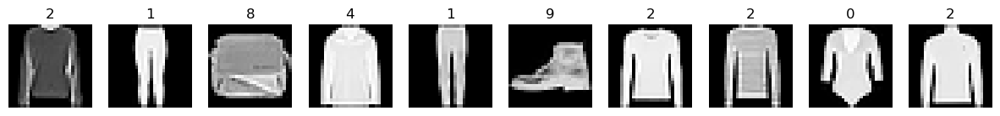

In [4]:
def show_images(images, labels):
    fig, axes = plt.subplots(1, len(images), figsize=(15, 3))
    for i, (image, label) in enumerate(zip(images, labels)):
        axes[i].imshow(image, cmap='gray')
        axes[i].axis('off')
        axes[i].set_title(f"{label}")
    plt.show()

# extrai primeiras 10 imagens para exibir
list_images = []
list_labels = []
for example in ds_train.take(10):
    image = example[0].numpy()
    label = example[1].numpy()
    list_images.append(image)
    list_labels.append(label)
    
show_images(list_images, list_labels)

In [5]:
# Resolucao da imagem
image_resolution = ds_info.features['image'].shape

# Tamanho do dataset
num_train_examples_total = ds_info.splits['train'].num_examples
num_test_examples_total = ds_info.splits['test'].num_examples
# TAmanho do dataset realmente carregado
num_train_examples = tf.data.experimental.cardinality(ds_train).numpy()
num_test_examples = tf.data.experimental.cardinality(ds_test).numpy()

# Número de classes
num_classes = ds_info.features['label'].num_classes

print(f"Resolução: {image_resolution}")
print(f"Training Set: {num_train_examples} exemplos de {num_train_examples_total} totais")
print(f"Testing Set: {num_test_examples} exemplos de {num_test_examples_total} totais")
print(f"Classes: {num_classes}")

Resolução: (28, 28, 1)
Training Set: 9000 exemplos de 60000 totais
Testing Set: 3000 exemplos de 10000 totais
Classes: 10


---

Sabendo as características do dataset, agora, o passo ideal é **pré-processar** as imagens para facilitar o processo de otimização das redes neurais:

1. Normalizar seus valores (para o intervalo 0-1)
2. Alterar a codificação das classes (para one-hot-encoding): teremos 10 neurônios na saída, não apenas 1

In [6]:
# Exibindo dados originais
for image, label in ds_train.take(1):
    print(image.numpy()[16,:10])
    print(label.numpy())

[[  0]
 [  0]
 [  0]
 [  0]
 [ 83]
 [ 71]
 [136]
 [194]
 [126]
 [ 46]]
2


In [7]:
def one_hot_label(image, label):
    label = tf.one_hot(label, num_classes)
    return image, label
    
# Pre-processa imagens
def preprocess_image(image, label):
    # converte imagem para float32
    image = tf.image.convert_image_dtype(image, tf.float32)
    return image, label

ds_train = ds_train.map(preprocess_image)
ds_test = ds_test.map(preprocess_image)

ds_train = ds_train.map(one_hot_label)
ds_test = ds_test.map(one_hot_label)

In [8]:
# Exibindo dados processados
for image, label in ds_train.take(1):
    print(image.numpy()[16,:10])
    print(label.numpy())

[[0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.3254902 ]
 [0.2784314 ]
 [0.53333336]
 [0.7607844 ]
 [0.49411768]
 [0.18039216]]
[0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]


### Tudo pronto, agora vamos começar

OBS: poderíamos ter feito mais etapas de pré-processamento aqui, como por exemplo normalização z-score das imagens, remoção de outliers, etc.

### Vamos aos concorrentes
1. Multilayer Perceptron, com (pelo menos) 60 anos de vida, uma densa experiência e muitas conexões

2. Rede convolucional, mais jovem porém com menos graus de liberdade e maior quantidade de representações intermediárias por camada.

In [9]:
# concorrente número um, no canto direito!
MLP = keras.Sequential()

MLP.add(keras.layers.InputLayer(input_shape=image_resolution)) 
# precisamos achatar a imagem para um vetor antes de começar
MLP.add(keras.layers.Flatten()) 
MLP.add(keras.layers.Dense(256, activation="relu"))
MLP.add(keras.layers.Dense(256, activation="relu"))
MLP.add(keras.layers.Dense(256, activation="relu"))
MLP.add(keras.layers.Dense(256, activation="relu"))
MLP.add(keras.layers.Dense(10, activation='softmax'))
MLP.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 784)               0         
                                                                 
 dense (Dense)               (None, 256)               200960    
                                                                 
 dense_1 (Dense)             (None, 256)               65792     
                                                                 
 dense_2 (Dense)             (None, 256)               65792     
                                                                 
 dense_3 (Dense)             (None, 256)               65792     
                                                                 
 dense_4 (Dense)             (None, 10)                2570      
                                                                 
Total params: 400906 (1.53 MB)
Trainable params: 400906 

In [10]:
# o concorrente novato, no canto esquerdo!
CNN = keras.Sequential()

CNN.add(keras.layers.Conv2D(32, kernel_size=(3,3), strides=(2,2), 
                            padding='valid', activation='relu', 
                            input_shape=image_resolution))
CNN.add(keras.layers.Conv2D(64, kernel_size=(3,3), strides=(2,2), 
                            padding='valid', activation='relu', 
                            input_shape=image_resolution))
CNN.add(keras.layers.Conv2D(64, kernel_size=(3,3), strides=(1,1), 
                            padding='same', activation='relu'))

CNN.add(keras.layers.Flatten())
CNN.add(keras.layers.Dense(128, activation="relu"))
CNN.add(keras.layers.Dense(10, activation='softmax'))
CNN.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 13, 13, 32)        320       
                                                                 
 conv2d_1 (Conv2D)           (None, 6, 6, 64)          18496     
                                                                 
 conv2d_2 (Conv2D)           (None, 6, 6, 64)          36928     
                                                                 
 flatten_1 (Flatten)         (None, 2304)              0         
                                                                 
 dense_5 (Dense)             (None, 128)               295040    
                                                                 
 dense_6 (Dense)             (None, 10)                1290      
                                                                 
Total params: 352074 (1.34 MB)
Trainable params: 35207

### 1) Preparando o dataset e os modelos

In [11]:
# as sementes ajudam a ter resultados reproduzíveis
from numpy.random import seed
from tensorflow.random import set_seed

seed(1)
set_seed(2)

# vamos usar o mesmo número de épocas e batchsize para ambos
batch_size = 64
epochs = 25

# definindo o batch size para iterar sobre o dataset
ds_train = ds_train.batch(batch_size)
ds_test = ds_test.batch(batch_size)

In [12]:
# compilando os modelos
MLP.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.SGD(learning_rate=0.1),
              metrics=['accuracy'])

CNN.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.SGD(learning_rate=0.1),
              metrics=['accuracy'])

## **E lá vamos nós**: em quem você apostaria?

In [13]:
histMLP = MLP.fit(ds_train,
                    batch_size=batch_size,
                    epochs=epochs, verbose=0)

scoreMLP_Tr = MLP.evaluate(ds_train, verbose = 0)
scoreMLP_Te = MLP.evaluate(ds_test, verbose = 0)

In [14]:
histCNN = CNN.fit(ds_train,
                    batch_size=batch_size,
                    epochs=epochs, 
                    verbose=0)

scoreCNN_Tr = CNN.evaluate(ds_train, verbose = 0)
scoreCNN_Te = CNN.evaluate(ds_test, verbose = 0)

Text(0.5, 1.0, 'Perda ao longo das épocas')

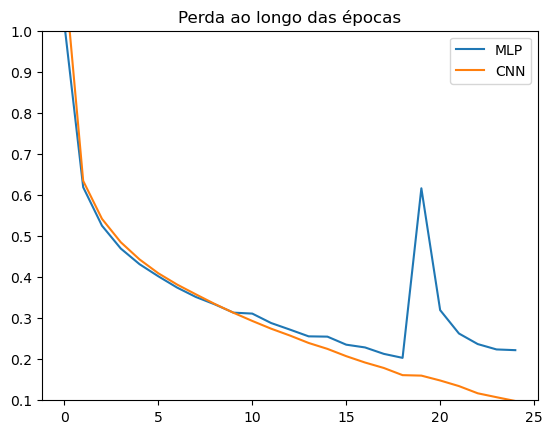

In [15]:
plt.plot(histMLP.history['loss'])
plt.plot(histCNN.history['loss'])
plt.ylim([0.1,1.0])
plt.legend(["MLP", "CNN"], loc="upper right")
plt.title("Perda ao longo das épocas")

In [16]:
print(f"MLP Acurácia treinamento: {(scoreMLP_Tr[1]*100):.2f}%")
print(f"MLP Acurácia teste: {(scoreMLP_Te[1]*100):.2f}%\n")

print(f"CNN Acurácia treinamento: {(scoreCNN_Tr[1]*100):.2f}%")
print(f"CNN Acurácia teste: {(scoreCNN_Te[1]*100):.2f}%")

MLP Acurácia treinamento: 89.82%
MLP Acurácia teste: 83.73%

CNN Acurácia treinamento: 91.59%
CNN Acurácia teste: 84.10%


### Redes Neurais e Arquiteturas Profundas
#### **MBA em Ciências de Dados**

### *Módulo 3 - Redes Neurais Convolucionais (CNNs)*

**Explorando alternativas para arquiteturas de CNNs**

Moacir A. Ponti

---

In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow import keras

## 1. Carregar e preparar base de dados

In [8]:
# Carregando dataset a partir de TensorFlow Datasets
(ds_train, ds_test), ds_info = tfds.load('cifar10', split=['train[:20%]', 'test[:25%]'], 
                                         as_supervised=True, with_info=True)
num_classes = ds_info.features['label'].num_classes

In [10]:
# Get the image resolution
input_shape = ds_info.features['image'].shape

# Get the size of each set
num_train_examples = tf.data.experimental.cardinality(ds_train).numpy()
num_test_examples = tf.data.experimental.cardinality(ds_test).numpy()

# Get the number of classes
num_classes = ds_info.features['label'].num_classes

# Print the obtained information
print(f"Resolução: {input_shape}")
print(f"Training Set: {num_train_examples} exemplos")
print(f"Testing Set: {num_test_examples} exemplos")
print(f"Classes: {num_classes}")

Resolução: (32, 32, 3)
Training Set: 10000 exemplos
Testing Set: 2500 exemplos
Classes: 10


2023-10-02 11:46:29.151908: W tensorflow/core/kernels/data/cache_dataset_ops.cc:854] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


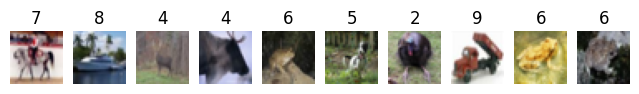

In [13]:
def show_images(images, labels):
    fig, axes = plt.subplots(1, len(images), figsize=(8, 3))
    for i, (image, label) in enumerate(zip(images, labels)):
        axes[i].imshow(image, cmap='gray')
        axes[i].axis('off')
        axes[i].set_title(f"{label}")
    plt.show()

# extrai primeiras 10 imagens para exibir
list_images = []
list_labels = []
for example in ds_train.take(10):
    image = example[0].numpy()
    label = example[1].numpy()
    list_images.append(image)
    list_labels.append(label)
    
show_images(list_images, list_labels)

In [14]:
def one_hot_label(image, label):
    label = tf.one_hot(label, num_classes)
    return image, label
    
# Pre-processa imagens
def preprocess_image(image, label):
    # converte imagem para float32
    image = tf.image.convert_image_dtype(image, tf.float32)
    return image, label

ds_train = ds_train.map(preprocess_image)
ds_test = ds_test.map(preprocess_image)

ds_train = ds_train.map(one_hot_label)
ds_test = ds_test.map(one_hot_label)

#### Preparar os batches

In [44]:
# vamos usar o mesmo número de épocas e batchsize para ambos
batch_size = 64

# definindo o batch size para iterar sobre o dataset
ds_train = ds_train.batch(batch_size)
ds_test = ds_test.batch(batch_size)

## 2. Projetar redes neurais

### 2.1 - CNN estilo "VGGNet"

In [85]:
CNN1 = keras.Sequential()
CNN1.add(keras.layers.Conv2D(32, kernel_size=(3,3), strides=(1,1), 
                             padding='valid', activation='relu', 
                             input_shape=input_shape))
CNN1.add(keras.layers.MaxPooling2D(pool_size=(2,2), strides=(2,2)))
CNN1.add(keras.layers.Conv2D(64, kernel_size=(3,3), strides=(1,1), 
                             padding='same', activation='relu'))
CNN1.add(keras.layers.Conv2D(64, kernel_size=(3,3), strides=(1,1), 
                             padding='same', activation='relu'))
CNN1.add(keras.layers.Conv2D(64, kernel_size=(3,3), strides=(1,1), 
                             padding='same', activation='relu'))
CNN1.add(keras.layers.MaxPooling2D(pool_size=(2,2), strides=(2,2)))
CNN1.add(keras.layers.Conv2D(64, kernel_size=(3,3), strides=(1,1), 
                             padding='same', activation='relu'))
CNN1.add(keras.layers.Conv2D(64, kernel_size=(3,3), strides=(1,1),  
                             padding='same', activation='relu'))
CNN1.add(keras.layers.Conv2D(64, kernel_size=(3,3), strides=(1,1),  
                             padding='same', activation='relu'))
CNN1.add(keras.layers.MaxPooling2D(pool_size=(2,2), strides=(2,2)))
CNN1.add(keras.layers.Flatten())
CNN1.add(keras.layers.Dense(64, activation='relu'))
CNN1.add(keras.layers.Dense(10, activation='softmax'))
CNN1.summary()

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_110 (Conv2D)         (None, 30, 30, 32)        896       
                                                                 
 max_pooling2d_40 (MaxPooli  (None, 15, 15, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_111 (Conv2D)         (None, 15, 15, 64)        18496     
                                                                 
 conv2d_112 (Conv2D)         (None, 15, 15, 64)        36928     
                                                                 
 conv2d_113 (Conv2D)         (None, 15, 15, 64)        36928     
                                                                 
 max_pooling2d_41 (MaxPooli  (None, 7, 7, 64)          0         
 ng2D)                                               

### 2.2 - Substituição de MaxPooling por strides > 1

In [87]:
# Algumas alternativas: uso de stride ao invés de MaxPooling e uso de tamanhos de filtro diferentes: ao inves de 3x3, usamos 1x3, 3x1 e 1x1
CNN2 = keras.Sequential()
CNN2.add(keras.layers.Conv2D(32, kernel_size=(3,3), strides=(1,1), 
                             padding='valid', activation='relu', input_shape=input_shape))
CNN2.add(keras.layers.Conv2D(64, kernel_size=(3,3), strides=(2,2), 
                             padding='same', activation='relu'))
CNN2.add(keras.layers.Conv2D(64, kernel_size=(3,3), strides=(1,1), 
                             padding='same', activation='relu'))
CNN2.add(keras.layers.Conv2D(64, kernel_size=(3,3), strides=(2,2), 
                             padding='same', activation='relu'))
CNN2.add(keras.layers.Conv2D(64, kernel_size=(3,3), strides=(1,1), 
                             padding='same', activation='relu'))
CNN2.add(keras.layers.Conv2D(64, kernel_size=(3,3), strides=(2,2), 
                             padding='same', activation='relu'))
CNN2.add(keras.layers.Flatten())
CNN2.add(keras.layers.Dense(64, activation='relu'))
CNN2.add(keras.layers.Dense(10, activation='softmax'))
CNN2.summary()

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_122 (Conv2D)         (None, 30, 30, 32)        896       
                                                                 
 conv2d_123 (Conv2D)         (None, 15, 15, 64)        18496     
                                                                 
 conv2d_124 (Conv2D)         (None, 15, 15, 64)        36928     
                                                                 
 conv2d_125 (Conv2D)         (None, 8, 8, 64)          36928     
                                                                 
 conv2d_126 (Conv2D)         (None, 8, 8, 64)          36928     
                                                                 
 conv2d_127 (Conv2D)         (None, 4, 4, 64)          36928     
                                                                 
 flatten_20 (Flatten)        (None, 1024)            

### 2.3 - Uso de convoluções por partes 1x3, 3x1, 1x1 

(como usado por Inception, mas aqui não estão em paralelo, apenas em sequência)

In [112]:
# Algumas alternativas: uso de stride ao invés de MaxPooling e 
# uso de tamanhos de filtro diferentes: ao inves de 3x3, usamos 1x3, 3x1 e 1x1
CNN3 = keras.Sequential()
CNN3.add(keras.layers.Conv2D(32, kernel_size=(3,3), strides=(1,1), 
                             padding='valid', activation='relu', 
                             input_shape=input_shape))
CNN3.add(keras.layers.MaxPooling2D(pool_size=(2,2), strides=(2,2)))
CNN3.add(keras.layers.Conv2D(32, kernel_size=(1,3), strides=(1,1), 
                             padding='same', activation='relu'))
CNN3.add(keras.layers.Conv2D(32, kernel_size=(3,1), strides=(1,1), 
                             padding='same', activation='relu'))
CNN3.add(keras.layers.Conv2D(32, kernel_size=(1,1), strides=(1,1),  
                             padding='same', activation='relu'))
CNN3.add(keras.layers.MaxPooling2D(pool_size=(2,2), strides=(2,2)))
CNN3.add(keras.layers.Conv2D(64, kernel_size=(1,3), strides=(1,1),  
                             padding='same', activation='relu'))
CNN3.add(keras.layers.Conv2D(64, kernel_size=(3,1), strides=(1,1),  
                             padding='same', activation='relu'))
CNN3.add(keras.layers.Conv2D(64, kernel_size=(1,1), strides=(1,1),  
                             padding='same', activation='relu'))
CNN3.add(keras.layers.Flatten())
CNN3.add(keras.layers.Dense(64, activation='relu'))
CNN3.add(keras.layers.Dense(10, activation='softmax'))
CNN3.summary()

Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_195 (Conv2D)         (None, 30, 30, 32)        896       
                                                                 
 max_pooling2d_57 (MaxPooli  (None, 15, 15, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_196 (Conv2D)         (None, 15, 15, 32)        3104      
                                                                 
 conv2d_197 (Conv2D)         (None, 15, 15, 32)        3104      
                                                                 
 conv2d_198 (Conv2D)         (None, 15, 15, 32)        1056      
                                                                 
 max_pooling2d_58 (MaxPooli  (None, 7, 7, 32)          0         
 ng2D)                                               

### 2.4 - Blocos Residuais (estilo ResNet)

In [89]:
def residual_block(x, n_filters, kernel_size=3, strides=1):
    # skip conection
    skip_connection = x
    
    # Primeira camada convolucional
    x = keras.layers.Conv2D(n_filters, kernel_size=kernel_size, 
                            strides=strides, activation='linear', 
                            padding='same')(x)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Activation('relu')(x)

    # Segunda camada convolucional
    x = keras.layers.Conv2D(n_filters, kernel_size=kernel_size, 
                            strides=strides, activation='linear', 
                            padding='same')(x)
    x = keras.layers.BatchNormalization()(x)
    
    # Adição da saída antes das camadas
    x = keras.layers.add([x, skip_connection])
    x = keras.layers.Activation('relu')(x)
    
    return x


Para usar a função `residual_block` é melhor montar a rede usando o modo "funcional"

In [90]:
def ResNetCNN(input_shape, num_classes, n_filters=32):
    
    input_tensor = keras.layers.Input(shape=input_shape)
    x = input_tensor

    x = keras.layers.Conv2D(n_filters, kernel_size=3, strides=1, 
                            activation='relu', padding='same')(x)
    
    # Blocos residuais + MaxPooling
    x = residual_block(x, n_filters=n_filters)
    x = keras.layers.MaxPooling2D(pool_size=(2,2), strides=(2,2))(x)
    
    x = residual_block(x, n_filters=n_filters)
    x = keras.layers.MaxPooling2D(pool_size=(2,2), strides=(2,2))(x)
    
    # Achatar a saída do bloco residual
    x = keras.layers.Flatten()(x)
    
    # Camada densa/fully connected
    x = keras.layers.Dense(128, activation='relu')(x)
    
    output_tensor = keras.layers.Dense(num_classes, activation='softmax')(x)  
    
    # Cria o modelo com base na entrada e saída
    model = keras.Model(inputs=input_tensor, outputs=output_tensor)

    return model


In [91]:
CNN_res = ResNetCNN(input_shape, 10)
CNN_res.summary()

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_13 (InputLayer)       [(None, 32, 32, 3)]          0         []                            
                                                                                                  
 conv2d_148 (Conv2D)         (None, 32, 32, 32)           896       ['input_13[0][0]']            
                                                                                                  
 conv2d_149 (Conv2D)         (None, 32, 32, 32)           9248      ['conv2d_148[0][0]']          
                                                                                                  
 batch_normalization_32 (Ba  (None, 32, 32, 32)           128       ['conv2d_149[0][0]']          
 tchNormalization)                                                                          

### 2.5 - Blocos Separáveis em Profundidade (estilo Xception/MobileNet)

In [92]:
def XceptionCNN(input_shape, num_classes, n_filters=32, blocks=3):
    
    input_tensor = keras.layers.Input(shape=input_shape)
    x = input_tensor

    x = keras.layers.Conv2D(n_filters, kernel_size=3, strides=1, 
                            activation='relu', padding='same')(x)
    
    # Blocos separaveis em profundidade + MaxPooling
    x = keras.layers.DepthwiseConv2D(kernel_size=3, strides=1, 
                                     padding='same')(x)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Activation('relu')(x)
    x = keras.layers.MaxPooling2D(pool_size=(2,2), strides=(2,2))(x)
    
    x = keras.layers.DepthwiseConv2D(kernel_size=3, strides=1, 
                                     padding='same')(x)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Activation('relu')(x)
    x = keras.layers.MaxPooling2D(pool_size=(2,2), strides=(2,2))(x)
    
    # Achatar a saída do bloco residual
    x = keras.layers.Flatten()(x)
    
    # Camada densa/fully connected
    x = keras.layers.Dense(128, activation='relu')(x)
    
    output_tensor = keras.layers.Dense(num_classes, activation='softmax')(x)  
    
    # Cria o modelo com base na entrada e saída
    model = keras.Model(inputs=input_tensor, outputs=output_tensor)

    return model


In [93]:
CNN_x = XceptionCNN(input_shape, 10)
CNN_x.summary()

Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_14 (InputLayer)       [(None, 32, 32, 3)]       0         
                                                                 
 conv2d_153 (Conv2D)         (None, 32, 32, 32)        896       
                                                                 
 depthwise_conv2d_4 (Depthw  (None, 32, 32, 32)        320       
 iseConv2D)                                                      
                                                                 
 batch_normalization_36 (Ba  (None, 32, 32, 32)        128       
 tchNormalization)                                               
                                                                 
 activation_35 (Activation)  (None, 32, 32, 32)        0         
                                                                 
 max_pooling2d_47 (MaxPooli  (None, 16, 16, 32)        0   

# 3. Compilando Modelos

In [113]:
# as sementes ajudam a ter resultados reproduzíveis
from numpy.random import seed
from tensorflow.random import set_seed
seed(1)
set_seed(2)

CNN1.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.SGD(learning_rate=0.01),
              metrics=['accuracy'])

CNN2.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.SGD(learning_rate=0.01),
              metrics=['accuracy'])

CNN3.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.SGD(learning_rate=0.01),
              metrics=['accuracy'])

CNN_res.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.SGD(learning_rate=0.01),
              metrics=['accuracy'])

CNN_x.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.SGD(learning_rate=0.01),
              metrics=['accuracy'])


# 4. Executando o treinamento

In [96]:
epochs = 15

In [97]:
hist1 = CNN1.fit(ds_train,
                 batch_size=batch_size,
                 epochs=epochs, verbose=0)

score1_Tr = CNN1.evaluate(ds_train, verbose = 0)
score1_Te = CNN1.evaluate(ds_test, verbose = 0)

In [98]:
hist2 = CNN2.fit(ds_train,
                 batch_size=batch_size,
                 epochs=epochs, verbose=0)

score2_Tr = CNN2.evaluate(ds_train, verbose = 0)
score2_Te = CNN2.evaluate(ds_test, verbose = 0)

In [114]:
hist3 = CNN3.fit(ds_train,
                 batch_size=batch_size,
                 epochs=epochs, verbose=0)

score3_Tr = CNN3.evaluate(ds_train, verbose = 0)
score3_Te = CNN3.evaluate(ds_test, verbose = 0)

In [100]:
hist4 = CNN_res.fit(ds_train,
                 batch_size=batch_size,
                 epochs=epochs, verbose=0)

score4_Tr = CNN_res.evaluate(ds_train, verbose = 0)
score4_Te = CNN_res.evaluate(ds_test, verbose = 0)

In [101]:
hist5 = CNN_x.fit(ds_train,
                 batch_size=batch_size,
                 epochs=epochs, verbose=0)

score5_Tr = CNN_x.evaluate(ds_train, verbose = 0)
score5_Te = CNN_x.evaluate(ds_test, verbose = 0)

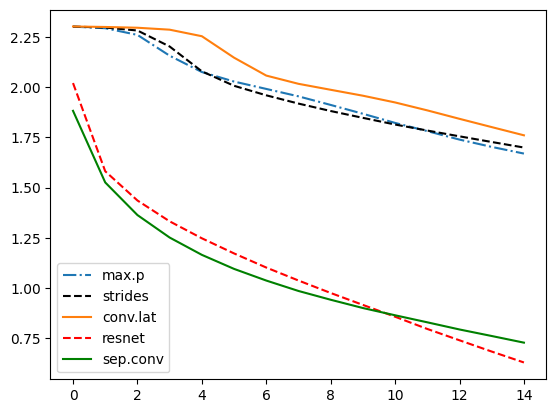

In [115]:
plt.plot(hist1.history['loss'], '-.')
plt.plot(hist2.history['loss'], '--k')
plt.plot(hist3.history['loss'], '-')
plt.plot(hist4.history['loss'], '--r')
plt.plot(hist5.history['loss'], '-g')

plt.legend(["max.p", "strides", "conv.lat", "resnet", "sep.conv"], loc="lower left")

In [116]:
print("Acurácia Treinamento")
print(f"CNN max.pool : {(score1_Tr[1])*100:.1f}")
print(f"CNN strides  : {(score2_Tr[1])*100:.1f}")
print(f"CNN conv.lat : {(score3_Tr[1])*100:.1f}")
print(f"CNN resnet   : {(score4_Tr[1])*100:.1f}")
print(f"CNN sep.conv : {(score5_Tr[1])*100:.1f}\n")

print("Acurácia Teste")
print(f"CNN max.pool : {(score1_Te[1])*100:.1f}")
print(f"CNN strides  : {(score2_Te[1])*100:.1f}")
print(f"CNN conv.lat : {(score3_Te[1])*100:.1f}")
print(f"CNN resnet   : {(score4_Te[1])*100:.1f}")
print(f"CNN sep.conv : {(score5_Te[1])*100:.1f}")

Acurácia Treinamento
CNN max.pool : 39.1
CNN strides  : 40.0
CNN conv.lat : 36.9
CNN resnet   : 71.0
CNN sep.conv : 67.7

Acurácia Teste
CNN max.pool : 38.7
CNN strides  : 40.1
CNN conv.lat : 38.0
CNN resnet   : 55.2
CNN sep.conv : 56.0


### <span style="color:darkred">Módulo 3 - Redes Neurais Convolucionais (CNNs)</span>
### <span style="color:darkred">Avaliação (com soluções)</span>

---
### Questão 1)

Considere duas camadas independentes de redes neurais profundas:

A. Camada densa com 128 neurônios, cuja entrada é um vetor de 676 dimensões;<br>
B. Camada convolucional com 128 neurônios (filtros) de tamanho 3x3, cuja entrada é uma matriz de 26x26 valores

Qual o total de parâmetros a serem aprendidos em cada camada?

(a) A = 86528 parâmetros; B = 1280 parâmetros <br>
(b) A = 86528 parâmetros; B = 6760 parâmetros <br>
(c) A = 86528 parâmetros; B = 33280 parâmetros <br>
<font color='red'>(d) A = 86656 parâmetros; B = 1280 parâmetros <br></font>
(e) A = 86656 parâmetros; B = 6760 parâmetros <br>

**Justificativa:** se a entrada possui 676 dimensões, então cada neurônio de uma camada densa tem 676 pesos, mais 1 termo bias = 677, o que multiplicado por 128 neurônios gera 86656. No caso de uma camada convolucional, independente do tamanho da entrada, se há 128 neurônios com filtros 3x3, então cada um deles terá 9 parâmetros + 1 bias = 10 valores, totalizando 1280 parâmetros.

---
### Questão 2)

Considere o conceito de "campo receptivo local" como uma região de certo tamanho dos dados de entrada que é processada de forma a gerar a saída. Considere ainda dois tipos de unidades de processamento de redes neurais profundas:

A. Camada densa (tipo Perceptron), que recebe por entrada um vetor com 16384 dimensões<br>
B. Camada convolucional com filtro de tamanho 3x3 com padding, que recebe por entrada uma imagem com 128 x 128 dimensões.<br>
C. Sequência de duas camadas: a primeira convolucional com filtros de tamanho 5x5 sem padding, que recebe por entrada uma imagem com 128 x 128 dimensões, seguida de uma camada densa (tipo Perceptron), que recebe por entrada o vetor composto por todos os valores achatados (flatten) da camada convolucional anterior.

Qual é o tamanho do campo receptivo local nos dados de entrada, para cada valor de saída das camadas computado por A, B e C?

Em C a saída é referente à segunda camada, portanto considerar o processamento de ambas.

 <font color='red'>(a) A = 16384; B = 3 x 3; C = 128 x 128 </font><br>
 (b) A = 1; B = 3 x 3; C = 126 x 126<br>
 (c) A = 1;  B = 128 x 128; C = 128 x 128<br>
 (d) A = 16384; B = 5 x 5; C = 128 x 128<br>
 (e) A = 16384; B = 130 x 130; C = 126 x 126<br>


**Justificativa:** No caso (A), toda camada densa processa todos os elementos de entrada e portanto o campo receptivo é composto de todos os valores. De fato poderíamos até mesmo dizer que, na prática, é um campo receptivo global. Já uma camada convolucional (B), essa processa dados localmente sempre igual ao tamanho do filtro, nesse caso 3x3. No caso (C) o campo receptivo da camada convolucional é 5x5, porém todos os valores são posteriormente submetidos a uma camada densa, e para essa segunda camada todos os elementos da entrada estão sendo considerados (direta ou indiretamente). Assim, o campo receptivo termina sendo toda a imagem de entrada contendo 128x128 pixels.

---
### Questão 3)

Utilizando a biblioteca Keras, projete uma rede neural para processar dados unidimensionais (dimensionalidade do vetor de entrada = 256), e que contenha as seguintes camadas:

1. camada max pooling 1D com tamanho de pool = 3
2. camada convolucional 1D com 32 filtros de tamanho 5, com zero-padding
3. camada max pooling 1D com tamanho de pool = 7
4. camada convolucional 1D com 64 filtros de tamanho 3, sem padding
5. camada global max pooling 1D

Essa arquitetura poderia ser utilizada para receber por entrada uma janela de uma série temporal contendo 256 instancias e aprender um espaço de características compacto com a camada Global Max Pooling.

Quais as dimensionalidades das saídas das camadas 1 (primeiro MaxPooling), 4 (segunda Convolucional) e 5 (Global Max Pooling)?

(a) 1=(256,1); 4=(10,32); 5=(64)<br>
(b) 1=(256,32); 4=(7,64); 5=(64)<br>
(c) 1=(84,1); 4=(7,32); 5=(32)<br>
(d) 1=(85,32); 4=(10,64); 5=(64)<br>
<font color='red'>(e) 1=(85,1); 4=(10,64); 5=(64)</font><br>

**Justificativa:** ver código abaixo

In [ ]:
import tensorflow as tf
from tensorflow import keras

modelA = keras.Sequential()
modelA.add(keras.layers.MaxPooling1D(pool_size=3, input_shape=(256,1)))
modelA.add(keras.layers.Conv1D(32, kernel_size=5, padding='same', activation='relu'))
modelA.add(keras.layers.MaxPooling1D(pool_size=7))
modelA.add(keras.layers.Conv1D(64, kernel_size=3, padding='valid', activation='relu'))
modelA.add(keras.layers.GlobalMaxPooling1D())
modelA.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 max_pooling1d_4 (MaxPoolin  (None, 85, 1)             0         
 g1D)                                                            
                                                                 
 conv1d_4 (Conv1D)           (None, 85, 32)            192       
                                                                 
 max_pooling1d_5 (MaxPoolin  (None, 12, 32)            0         
 g1D)                                                            
                                                                 
 conv1d_5 (Conv1D)           (None, 10, 64)            6208      
                                                                 
 global_max_pooling1d_2 (Gl  (None, 64)                0         
 obalMaxPooling1D)                                               
                                                      

---
### Questão 4)

Carregue a base de dados CIFAR-10 conforme o código abaixo. Normalize os dados das imagens de forma a que os valores estejam entre 0 e 1, depois converta as classes para o tipo categórico utilizando o ` tf.keras.utils.to_categorical`.

A seguir, crie uma CNN para classificar imagens dessa base de dados, contendo como camadas:

1. convolucional 1 com 16 filtros de tamanho $3\times 3$, sem padding e stride 1 (nas duas direções)
2. maxpooling com tamanho 2 e stride 2 nas duas direções
3. convolucional 2 com 32 filtros de tamanho $3\times 1$, com padding e stride $2,1$
4. convolucional 3 com 32 filtros de tamanho $1\times 3$, com padding e stride $1,2$
5. global max pooling
6. camada densa com 32 neurônios
7. camada classificadora com ativação softmax

Após montar o modelo realize a predição para o primeiro elemento do conjunto de treinamento no formato `model.predict([x_train[1:2]])`

Quais os tamanhos das saídas das camadas de 3 até 5, e qual foi a média das probabilidades (de todas as classes) gerada como saída para a predição do primeiro elemento?

(a) 3=(15,8,32); 4=(8,8,32); 5=(64); média=0.2<br>
(b) 3=(8,8,32); 4=(8,8,32); 5=(64); média=0.01<br>
(c) 3=(16,8,32); 4=(8,8,32); 5=(32); média=0.2<br>
(d) 3=(8,15,32); 4=(4,8,32); 5=(32); média=0.01<br>
<font color='red'>(e) 3=(8,15,32); 4=(8,8,32); 5=(32); média=0.1<br></font>

**Justificativa:** ver código abaixo

2023-10-01 20:33:12.735635: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-10-01 20:33:12.735741: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-10-01 20:33:12.739963: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-10-01 20:33:13.019891: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-01 20:33:14.996101: W tensorflow/compiler/

Instructions for updating:
The TensorFlow Distributions library has moved to TensorFlow Probability (https://github.com/tensorflow/probability). You should update all references to use `tfp.distributions` instead of `tf.distributions`.
Instructions for updating:
The TensorFlow Distributions library has moved to TensorFlow Probability (https://github.com/tensorflow/probability). You should update all references to use `tfp.distributions` instead of `tf.distributions`.
(50000, 32, 32, 3)
Classes:  10


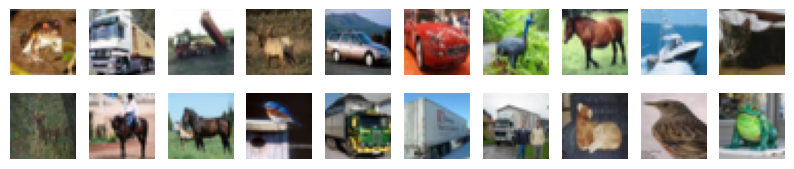

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras

from tensorflow.keras.datasets import cifar10
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

fig, axes = plt.subplots(2,10, figsize=(10,2))
ax = axes.ravel()
for i in range(20):
    ax[i].imshow(x_train[i], cmap="gray")
    ax[i].axis('off')

img_lin, img_col = x_train.shape[1], x_train.shape[2]
num_classes = len(np.unique(y_train))
print(x_train.shape)
print('Classes: ', num_classes)

# normalizando imagens para intervalo entre 0 e 1
x_train = x_train.astype('float32') / 255.0
x_test = x_test.astype('float32') / 255.0

y_train = tf.keras.utils.to_categorical(y_train, num_classes)
y_test = tf.keras.utils.to_categorical(y_test, num_classes)

# verifica se as imagens da base de dados tem um canal (i.e. em tons de cinza)
# ou mais do que um canal e se houver mais do que um canal entao armazena a
# quantidade de canais
if (len(x_train.shape) == 3):
      n_channels = 1
else:
      n_channels = x_train.shape[3]

# re-formatando as imagens de forma que sejam transformadas em
# matrizes com canais (por exemplo quando as imagens sao RGB)
if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], n_channels, img_lin, img_col)
    x_test = x_test.reshape(x_test.shape[0], n_channels, img_lin, img_col)
    input_shape = (n_channels, img_lin, img_col)
else:
    x_train = x_train.reshape(x_train.shape[0], img_lin, img_col, n_channels)
    x_test = x_test.reshape(x_test.shape[0], img_lin, img_col, n_channels)
    input_shape = (img_lin, img_col, n_channels)

In [ ]:
model = keras.Sequential()
model.add(keras.layers.Conv2D(16, kernel_size=(3,3), strides=(1,1), padding='valid', activation='relu', input_shape=(img_lin, img_col,3)))
model.add(keras.layers.MaxPooling2D(pool_size=(2,2), strides=(2,2)))
model.add(keras.layers.Conv2D(32, kernel_size=(3,1), strides=(2,1),  padding='same', activation='relu'))
model.add(keras.layers.Conv2D(32, kernel_size=(1,3), strides=(1,2), padding='same', activation='relu'))
model.add(keras.layers.GlobalMaxPooling2D())
model.add(keras.layers.Dense(32))
model.add(tf.keras.layers.Dense(10, activation='softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 30, 30, 16)        448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 15, 15, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 8, 15, 32)         1568      
                                                                 
 conv2d_2 (Conv2D)           (None, 8, 8, 32)          3104      
                                                                 
 global_max_pooling2d (Glob  (None, 32)                0         
 alMaxPooling2D)                                                 
                                                                 
 dense (Dense)               (None, 32)                1

In [ ]:
np.mean(model.predict([x_train[1:2]], verbose=False))

0.10000001

---

### Questão 5)

Carregue a base de dados CIFAR-10 conforme o código abaixo. Normalize os dados das imagens de forma a que os valores estejam entre 0 e 1, depois converta as classes para o tipo categórico utilizando o ` tf.keras.utils.to_categorical`.  Iremos usar um subconjunto de treinamento contendo as primeiras 9000 imagens (usar código abaixo)

A seguir, crie uma CNN para classificar imagens dessa base de dados, contendo como camadas:

1. convolucional 1 com 32 filtros de tamanho $3\times 3$, sem padding e stride 1 (nas duas direções)
2. maxpooling com tamanho 2 e stride 2 nas duas direções
3. convolucional 2 com 64 filtros de tamanho $3\times 1$, sem padding e stride $2,1$
4. convolucional 3 com 64 filtros de tamanho $1\times 3$, sem padding e stride $1,2$
5. global max pooling
6. camada densa com 32 neurônios
7. camada classificadora com ativação softmax

Todas as camadas convolucionais devem ter ativação relu.

Iremos repetir 5 vezes o experimento de treinamento e avaliação dessa rede, da seguinte forma: defina as sementes aleatórias do numpy para 1 e do tensorflow para 2. Depois, utilizando a arquitetura definida, configure a rede para treinar com a configuração abaixo.
* otimizador: SGD
* taxa de aprendizado: 0.015
* função de custo: `categorical_crossentropy`
* métrica: `accuracy`
* épocas: 15
* batchsize: 50

Após o processo de aprendizado, obtenha a acurácia calculada no conjunto de treinamento e no conjunto de testes utilizando a função `evaluate()`.

Com base na média da acurácia de treinamento e teste obtida das 5 execuções, escolha a opção cujo intervalo se enquadre nos valores obtidos.

(a) Acurácia Treinamento = [47,52],  Acurácia Teste = [37,42]<br>
(b) Acurácia Treinamento = [41,44],  Acurácia Teste = [35,40]<br>
(c) Acurácia Treinamento = [30,34],  Acurácia Teste = [35,40]<br>
(d) Acurácia Treinamento = [41,44],  Acurácia Teste = [30,34]<br>
<font color='red'>(e) Acurácia Treinamento = [30,34],  Acurácia Teste = [30,34]<br></font>

**Justificativa:** ver código abaixo

(50000, 32, 32, 3)
Classes:  10


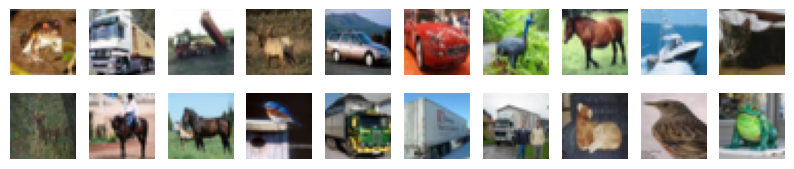

In [11]:
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras

from tensorflow.keras.datasets import cifar10
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

fig, axes = plt.subplots(2,10, figsize=(10,2))
ax = axes.ravel()
for i in range(20):
    ax[i].imshow(x_train[i], cmap="gray")
    ax[i].axis('off')

img_lin, img_col = x_train.shape[1], x_train.shape[2]
num_classes = len(np.unique(y_train))
print(x_train.shape)
print('Classes: ', num_classes)

x_train = x_train.astype('float32') / 255.0
x_test = x_test.astype('float32') / 255.0

y_train = tf.keras.utils.to_categorical(y_train, num_classes)
y_test = tf.keras.utils.to_categorical(y_test, num_classes)

# verifica se as imagens da base de dados tem um canal (i.e. em tons de cinza)
# ou mais do que um canal e se houver mais do que um canal entao armazena a
# quantidade de canais
if (len(x_train.shape) == 3):
      n_channels = 1
else:
      n_channels = x_train.shape[3]

# re-formatando as imagens de forma que sejam transformadas em
# matrizes com canais (por exemplo quando as imagens sao RGB)
if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], n_channels, img_lin, img_col)
    x_test = x_test.reshape(x_test.shape[0], n_channels, img_lin, img_col)
    input_shape = (n_channels, img_lin, img_col)
else:
    x_train = x_train.reshape(x_train.shape[0], img_lin, img_col, n_channels)
    x_test = x_test.reshape(x_test.shape[0], img_lin, img_col, n_channels)
    input_shape = (img_lin, img_col, n_channels)

## subconjunto
x_train_sub = x_train[:9000]
y_train_sub = y_train[:9000]

del x_train, y_train

In [12]:
from numpy.random import seed
from tensorflow.random import set_seed

def my_cnn(show_summary=False):
    model = keras.Sequential()
    model.add(keras.layers.Conv2D(32, kernel_size=(3,3), strides=(1,1), padding='valid', activation='relu', input_shape=(img_lin, img_col,3)))
    model.add(keras.layers.MaxPooling2D(pool_size=(2,2), strides=(2,2)))
    model.add(keras.layers.Conv2D(64, kernel_size=(3,1), strides=(2,1),  padding='valid', activation='relu'))
    model.add(keras.layers.Conv2D(64, kernel_size=(1,3), strides=(1,2), padding='valid', activation='relu'))
    model.add(keras.layers.GlobalMaxPooling2D())
    model.add(keras.layers.Dense(32))
    model.add(tf.keras.layers.Dense(10, activation='softmax'))
    if show_summary: model.summary()
    return model

In [13]:
# exemplo de como realizar o treinamento
for i in range(1,6):
    # sementes
    seed(1)
    set_seed(2)
    # criar modelo
    # compilar modelo
    # treinar modelo
    # avaliar modelo

In [14]:
batch_size = 50
epochs = 15

acc_train = []
acc_test = []

for i in range(1,6):
    seed(1)
    set_seed(2)
    print(f'Training Model {i}...')
    model = my_cnn()
    model.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.SGD(learning_rate=0.015),
              metrics=['accuracy'])

    model.fit(x_train_sub, y_train_sub,
                    batch_size=batch_size,
                    epochs=epochs, verbose=0)

    scoreTr = model.evaluate(x_train_sub, y_train_sub, verbose = 0)
    scoreTe = model.evaluate(x_test, y_test, verbose = 0)

    acc_train.append(scoreTr[1])
    acc_test.append(scoreTe[1])
    print(f'\tAccuracy: Train {scoreTr[1]*100:.1f}% / Test {scoreTe[1]*100:.1f}%')

Training Model 1...
	Accuracy: Train 31.0% / Test 30.4%
Training Model 2...
	Accuracy: Train 32.5% / Test 31.2%
Training Model 3...
	Accuracy: Train 30.8% / Test 29.5%
Training Model 4...
	Accuracy: Train 31.4% / Test 31.0%
Training Model 5...
	Accuracy: Train 30.6% / Test 29.8%


In [15]:
print(f"Acurácia média treinamento: {(np.mean(acc_train)*100):.1f}%")
print(f"Acurácia média teste: {(np.mean(acc_test)*100):.1f}%")

Acurácia média treinamento: 31.3%
Acurácia média teste: 30.4%


## <span style="color:darkred">Módulo 3 - Redes Neurais Convolucionais (CNNs)</span>
### <span style="color:darkred">Exercícios com soluções</span>

---

### Exercício 1)

A operação de convolução consiste em, centrada em um ponto de uma matriz ou tensor, fazer uma combinação linear de valores na região da posição central, gerando como saída um único valor, escalar. 

Considere que a convolução opera numa região de tamanho $5\times 5$ com stride = 1, isso significa que para cada conjunto local de $5 \times 5$ valores, produziremos um único de saída. Se a entrada é uma matriz com tamanho $10 \times 10$, e caso não seja utilizado nenhum pré-processamento ou zero-padding nos dados, qual o tamanho da saída?

 (a) $10\times 10$ <br>
 <font color='red'>(b) $6\times 6$ </font><br>
 (c) $8\times 8$<br>
 (d) $5\times 5$<br>

**Justificativa**: para computar a saída em regiões de $5\times 5$, precisamos começar na terceira linha e terceira coluna da matriz, e finalizar duas linhas e duas colunas antes da matriz terminar. Assim, para uma entrada de tamanho $10\times 10$, perdemos duas linhas e duas colunas de cada lado, gerando uma matriz de $6\times 6$ como saída.

---
### Exercício 2)

Cada camada convolucional com $k$ neurônios (filtros de convolução) gera $k$ saídas distintas. Enquanto na camada densa as $k$ saídas são valores individuais (escalares), na convolucional as saídas são mapas de ativação (ou mapas de características). Porque eles recebem esse nome?

 (a) Pois podemos escolher os filtros de convolução de forma a processar imagens de entrada e obter características como borda, textura e regiões planas com cores.<br>
 <font color='red'>(b) Pois podem ser interpretados como representações dos dados de entrada, aprendidas por meio da otimização da função de custo/perda da rede neural convolucional</font><br>
 (c) Pois os filtros convolucionais extraem de forma aleatória características da entrada de forma que essas características, ou ativações, melhorem a capacidade de classificar novos exemplos<br>
 (d) Pois foram baseadas em funções de ativação das redes neurais Multilayer Perceptron, as quais também realizam um tipo de processamento de características das entradas<br>

---
### Exercício 3)

Assuma uma entrada de tamanho $256 \times 256 \times 3$, e duas camadas convolucionais, sequenciais. A primeira possui 8 neurônios de tamanho $3\times 3 \times 3$ e *não* usa zero-padding. A segunda possui 16 neurônios de tamanho $3 \times 3 \times p$ e aplica zero-padding. 

Quantos mapas de ativação são gerados pela segunda camada convolucional, qual o tamanho final da saída da segunda camada e qual o valor de $p$?

 <font color='red'>(a) 16 mapas, saída $254 \times 254 \times 16$, $p = 8$</font><br>
 (a) 24 mapas, saída $254 \times 254 \times 8$, $p = 8$<br>
 (c) 16 mapas, saída $252 \times 252 \times 8$, $p = 16$<br>
 (d) 24 mapas, saída $256 \times 256 \times 16$, $p = 8$<br>

---

### Exercício 4)

Camadas convolucionais costumam gerar saídas de alta dimensionalidade, o que pode tornar difícil a otimização do modelo. Desejamos manter o aprendizado de mapas de ativação, mas reduzir a dimensionalidade espacial dos dados ao longo da rede neural. Marque a alternativa com a estratégia que melhor se adequa ao efeito desejado.

(a) Utilizar filtros de convolucão de tamanho menor<br>
(b) Aumentar a quantidade de camadas de convolucão<br>
<font color='red'>(c) Utilizar camadas de pooling ou convoluções com stride maior do que 1<br></font>
(d) Substituir todas as camadas convolucionais por camadas de pooling


---

### Exercício 5)

Utilizando a biblioteca Keras, formule duas arquiteturas de rede neural sequencial convolucional, cuja entrada seja preparada para receber um vetor unidimensional de $1024$ dimensões.

Arquitetura A
1. camada convolucional 1 com 16 filtros de tamanho $1\times 8$, com padding
2. camada max pooling de tamanho $4$
3. camada convolucional 2 com 32 filtros de tamanho $1\times 8$, com padding
4. camada max pooling de tamanho $4$
5. camada convolucional 3 com 8 filtros de tamanho $1\times 1$, com padding
5. camada densa de saída com 3 neurônios.

Arquitetura B
1. camada convolucional 1 com 16 filtros de tamanho  $1\times 8$ e stride 4, com padding
2. camada convolucional 2 com 32 filtros de tamanho  $1\times 8$ e stride 4, com padding
3. camada convolucional 3 com 8 filtros de tamanho $1\times 1$, com padding
4. camada densa de saída com 3 neurônios.

Qual o tamanho da saída das camadas convolucionais 2 e 3, e o total de parâmetros de cada rede?

(a) A: conv2=(256,32), conv3=(64,8), total=6075; B: conv2=(64,32), conv3=(64,8), total=4075 <br>
(b) A: conv2=(64,32), conv3=(64,8), total=6075; B: conv2=(64,32), conv3=(64,8), total=6075 <br>
(c) A: conv2=(64,32), conv3=(1,8), total=4128; B: conv2=(64,32), conv3=(1,8), total=1539 <br>
<font color='red'>(d) A: conv2=(256,32), conv3=(64,8), total=6075; B: conv2=(64,32), conv3=(64,8), total=6075 <br></font>

In [3]:
import tensorflow as tf
from tensorflow import keras

modelA = keras.Sequential()
modelA.add(keras.layers.Conv1D(16, kernel_size=8, padding='same', activation='relu', input_shape=(1024,1)))
modelA.add(keras.layers.MaxPooling1D(pool_size=4))
modelA.add(keras.layers.Conv1D(32, kernel_size=8, padding='same', activation='relu'))
modelA.add(keras.layers.MaxPooling1D(pool_size=4))
modelA.add(keras.layers.Conv1D(8, kernel_size=1, padding='same', activation='relu'))
modelA.add(keras.layers.Flatten())

modelA.add(keras.layers.Dense(3, activation='softmax'))
modelA.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_3 (Conv1D)            (None, 1024, 16)          144       
_________________________________________________________________
max_pooling1d_2 (MaxPooling1 (None, 256, 16)           0         
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 256, 32)           4128      
_________________________________________________________________
max_pooling1d_3 (MaxPooling1 (None, 64, 32)            0         
_________________________________________________________________
conv1d_5 (Conv1D)            (None, 64, 8)             264       
_________________________________________________________________
flatten_1 (Flatten)          (None, 512)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 3)                

In [2]:
modelB = keras.Sequential()
modelB.add(keras.layers.Conv1D(16, kernel_size=8, strides=4, padding='same', activation='relu', input_shape=(1024,1)))
modelB.add(keras.layers.Conv1D(32, kernel_size=8, strides=4, padding='same', activation='relu'))
modelB.add(keras.layers.Conv1D(8, kernel_size=1, padding='same', activation='relu'))
modelB.add(keras.layers.Flatten())
modelB.add(keras.layers.Dense(3, activation='softmax'))
modelB.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_3 (Conv1D)            (None, 256, 16)           144       
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 64, 32)            4128      
_________________________________________________________________
conv1d_5 (Conv1D)            (None, 64, 8)             264       
_________________________________________________________________
flatten_1 (Flatten)          (None, 512)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 3)                 1539      
Total params: 6,075
Trainable params: 6,075
Non-trainable params: 0
_________________________________________________________________


In [4]:
modelC = keras.Sequential()
modelC.add(keras.layers.Conv2D(32, kernel_size=(3,3), strides=(2,2), padding='same', activation='relu', input_shape=(1024,1024,1)))
modelC.add(keras.layers.Conv2D(64, kernel_size=(1,3), strides=(1,2), padding='same', activation='relu'))
modelC.add(keras.layers.Conv2D(64, kernel_size=(3,1), strides=(2,1),  padding='same', activation='relu'))
modelC.add(keras.layers.Conv2D(128, kernel_size=(3,3), strides=(3,3), padding='valid', activation='relu'))
modelC.add(keras.layers.GlobalAveragePooling2D())
modelC.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 512, 512, 32)      320       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 512, 256, 64)      6208      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 256, 256, 64)      12352     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 85, 85, 128)       73856     
_________________________________________________________________
global_average_pooling2d (Gl (None, 128)               0         
Total params: 92,736
Trainable params: 92,736
Non-trainable params: 0
_________________________________________________________________


---

### Exercício 6)

Carregue a base de dados CIFAR-100 e exiba as 10 primeiras imagens dessa base de dados. Normalize os dados das imagens de forma a que os valores estejam entre 0 e 1, depois converta as classes para o tipo categórico utilizando o ` tf.keras.utils.to_categorical`.

A seguir, use a arquitetura:
1. camada convolucional 1 com 32 filtros de tamanho $3\times 3$, com padding e stride 2 (nas duas direções)
2. camada convolucional 2 com 64 filtros de tamanho $1\times 3$, com padding e stride $1,2$
3. camada convolucional 3 com 64 filtros de tamanho $3\times 1$, com padding e stride $2,1$
4. camada convolucional 4 com 128 filtros de tamanho $3\times 3$, sem padding e stride 3 (nas duas direções)
5. camada global average pooling

E adapte a rede para receber como entrada imagens dessa base. Todas as camadas da rede, exceto a última, devem ter funções de ativação do tipo `relu`. Crie uma camada densa no final que permita classificar as imagens nos rótulos disponíveis no conjunto de treinamento, usando a função de ativação adequada. 

Qual o tamanho da saída das duas últimas camadas da rede (global average pooling e densa), e o total de parâmetros da mesma rede?

(a) global average pooling = 128, densa = 128, parâmetros = 106212<br>
(b) global average pooling = 128, densa = 100, parâmetros = 12900<br>
(c) global average pooling = 128, densa = 20, parâmetros = 12900<br>
<font color='red'>(d) global average pooling = 128, densa = 100, parâmetros = 106212<br></font>

(50000, 32, 32, 3)
Classes:  100


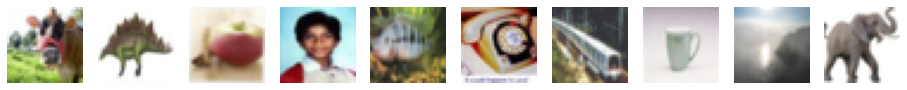

In [6]:
import numpy as np
import matplotlib.pyplot as plt

from tensorflow.keras.datasets import cifar100
(x_train, y_train), (x_test, y_test) = cifar100.load_data()

n_imgs = 10
plt.figure(figsize=(16,2))
for im in np.arange(n_imgs):
    plt.subplot(1,n_imgs,im+1)
    plt.imshow(x_train[im])
    plt.axis('off')
    
img_lin, img_col, img_cha = x_train.shape[1], x_train.shape[2], x_train.shape[3]
num_classes = len(np.unique(y_train))
print(x_train.shape)
print('Classes: ', num_classes)

x_train = x_train.astype('float32') / 255.0
x_test = x_test.astype('float32') / 255.0

y_train = tf.keras.utils.to_categorical(y_train, num_classes)
y_test = tf.keras.utils.to_categorical(y_test, num_classes)

In [12]:
modelD = keras.Sequential()
modelD.add(keras.layers.Conv2D(32, kernel_size=(3,3), strides=(2,2), padding='same', activation='relu', input_shape=(img_lin, img_col, img_cha)))
modelD.add(keras.layers.Conv2D(64, kernel_size=(1,3), strides=(1,2), padding='same', activation='relu'))
modelD.add(keras.layers.Conv2D(64, kernel_size=(3,1), strides=(2,1),  padding='same', activation='relu'))
modelD.add(keras.layers.Conv2D(128, kernel_size=(3,3), strides=(3,3), padding='valid', activation='relu'))
modelD.add(keras.layers.GlobalAveragePooling2D())
modelD.add(keras.layers.Dense(num_classes, activation="softmax"))
modelD.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_16 (Conv2D)           (None, 16, 16, 32)        896       
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 16, 8, 64)         6208      
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 8, 8, 64)          12352     
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 2, 2, 128)         73856     
_________________________________________________________________
global_average_pooling2d_4 ( (None, 128)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 100)               12900     
Total params: 106,212
Trainable params: 106,212
Non-trainable params: 0
________________________________________________

---

### Exercício 7)

Defina as sementes aleatórias do numpy para 1 e do tensorflow para 2. Depois, utilizando a arquitetura definida no exercício anterior, configure a rede para treinar com a configuração abaixo, salvando o histórico da perda e acurácia para as épocas.
* otimizador: SGD
* taxa de aprendizado: 0.09
* função de custo: `categorical_crossentropy`
* métrica: `accuracy`
* épocas: 10
* batchsize: 64

Após as 8 épocas, exiba e analise gráfico da função de custo no conjunto de treinamento ao longo das épocas e avalie a acurácia no conjunto de testes. Considerando: (1) a convergência da função de custo e (2) comparando a acurácia no conjunto de testes com o que seria a acurácia de um classificador aleatório para a base de dados CIFAR-100, escolha a alternativa correta.

(a) A função de custo indica estabilização, alcançando uma acurácia 25 vezes superior a de um classificador aleatório<br>
(b) A função de custo indica que ainda há espaço para o treinamento de mais épocas, a acurácia obtida é mais do que 50 vezes superior do que um classificador aleatório<br>
<font color='red'>(c) A função de custo indica que ainda há espaço para o treinamento de mais épocas, e a acurácia obtida é mais do que 15 vezes superior do que um classificador aleatório<br></font>
(d) A função de custo indica um valor baixo de custo e assim, treinar por mais épocas não irá beneficiar o modelo, a acurácia obtida é apenas ligeiramente superior a um classificador aleatório<br>


In [13]:
from numpy.random import seed
seed(1)
from tensorflow.random import set_seed
set_seed(2)

modelD.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.SGD(learning_rate=0.09),
              metrics=['accuracy'])

In [14]:
batch_size = 64
epochs = 10

# a variável history guarda os dados do processo de treinamento para
# posteriormente analisarmos
history = modelD.fit(x_train, y_train,
                    batch_size=batch_size,
                    epochs=epochs,
                    verbose=1)

2021-10-06 09:28:38.167655: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:176] None of the MLIR Optimization Passes are enabled (registered 2)
2021-10-06 09:28:38.203665: I tensorflow/core/platform/profile_utils/cpu_utils.cc:114] CPU Frequency: 2594535000 Hz


Epoch 1/10


2021-10-06 09:28:39.244874: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudnn.so.8
2021-10-06 09:28:40.652193: I tensorflow/stream_executor/cuda/cuda_dnn.cc:359] Loaded cuDNN version 8200
2021-10-06 09:28:42.200502: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublas.so.11
2021-10-06 09:28:43.570437: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublasLt.so.11


782/782 [==============================] - 12s 8ms/step - loss: 4.5044 - accuracy: 0.0208
Epoch 2/10
782/782 [==============================] - 6s 8ms/step - loss: 4.1216 - accuracy: 0.0634
Epoch 3/10
782/782 [==============================] - 6s 8ms/step - loss: 3.8989 - accuracy: 0.0999
Epoch 4/10
782/782 [==============================] - 7s 9ms/step - loss: 3.7254 - accuracy: 0.1297
Epoch 5/10
782/782 [==============================] - 7s 9ms/step - loss: 3.5972 - accuracy: 0.1533
Epoch 6/10
782/782 [==============================] - 7s 9ms/step - loss: 3.4905 - accuracy: 0.1710
Epoch 7/10
782/782 [==============================] - 7s 10ms/step - loss: 3.3939 - accuracy: 0.1902
Epoch 8/10
782/782 [==============================] - 7s 9ms/step - loss: 3.3146 - accuracy: 0.2036
Epoch 9/10
782/782 [==============================] - 7s 9ms/step - loss: 3.2380 - accuracy: 0.2178
Epoch 10/10
782/782 [==============================] - 7s 9ms/step - loss: 3.1709 - accuracy: 0.2309


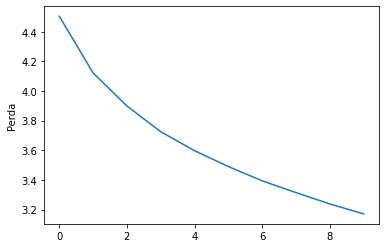

In [15]:
plt.plot(history.history['loss'])
plt.ylabel('Perda')
plt.show()

In [16]:
score = modelD.evaluate(x_test, y_test, verbose = 0)
print("Acurácia: %.4f (aleatório = %.4f)" % (score[1], 1/num_classes))

Acurácia: 0.1775 (aleatório = 0.0100)


---

### Exercício 8)


Crie uma nova rede neural com base na anterior mas adicionando, logo após a 3.a camada convolucional, e antes da 4.a camada convolucional, outras 2 camadas no formato:

* camada convolucional com 64 filtros de tamanho $1\times 3$, com padding e stride $1,2$
* camada convolucional com 64 filtros de tamanho $3\times 1$, com padding e stride $2,1$

Defina as sementes aleatórias do numpy para 1 e do tensorflow para 2, e a seguir execute o treinamento dessa rede utilizando os parâmetros conforme a questão anterior, mas aumente o número de épocas para 15.

Considerando:
1. a diferença no valor da função de custo obtida nas épocas 1 e 10 (para permitir comparar com a anterior), e
2. a acurácia no conjunto de testes após o treinamento completo

Escolha a alternativa correta:

(a) A diferença do valor da função de custo da 1.a para a 10.a época é menor nessa nova arquitetura, indicando convergência mais lenta, e ao final a acurácia atinge valor superior a 25% com essa arquitetura mais profunda<br>
(b) A diferença do valor da função de custo da 1.a para a 10.a época é maior nessa nova arquitetura, mostrando a superioridade da arquitetura mais profunda, que ao final atinge acurácia acima de 50%<br>
<font color='red'>(c) A diferença do custo da 1.a para a 10.a época é maior nessa nova arquitetura, indicando convergência mais rápida, e ao final a acurácia atinge valor superior a 20% com a arquitetura mais profunda<br></font>
(d) A diferença do valor da função de custo da 1.a para a 10.a época é menor nessa nova arquitetura, indicando que a arquitetura menos profunda é mais estável, e ao final a acurácia atinge valor próxmo a 10% com essa arquitetura mais profunda<br>

In [19]:
modelE = keras.Sequential()
modelE.add(keras.layers.Conv2D(32, kernel_size=(3,3), strides=(2,2), padding='same', activation='relu', input_shape=(img_lin, img_col, img_cha)))
modelE.add(keras.layers.Conv2D(64, kernel_size=(1,3), strides=(1,2), padding='same', activation='relu'))
modelE.add(keras.layers.Conv2D(64, kernel_size=(3,1), strides=(2,1), padding='same', activation='relu'))
modelE.add(keras.layers.Conv2D(64, kernel_size=(1,3), strides=(1,2), padding='same', activation='relu'))
modelE.add(keras.layers.Conv2D(64, kernel_size=(3,1), strides=(2,1), padding='same', activation='relu'))
modelE.add(keras.layers.Conv2D(128, kernel_size=(3,3), strides=(3,3), padding='valid', activation='relu'))
modelE.add(keras.layers.GlobalAveragePooling2D())
modelE.add(keras.layers.Dense(num_classes, activation="softmax"))
modelE.summary()

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_20 (Conv2D)           (None, 16, 16, 32)        896       
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 16, 8, 64)         6208      
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 8, 8, 64)          12352     
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 8, 4, 64)          12352     
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 4, 4, 64)          12352     
_________________________________________________________________
conv2d_25 (Conv2D)           (None, 1, 1, 128)         73856     
_________________________________________________________________
global_average_pooling2d_5 ( (None, 128)              

In [20]:
seed(1)
set_seed(2)

modelE.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.SGD(learning_rate=0.09),
              metrics=['accuracy'])

batch_size = 64
epochs = 15

# a variável history guarda os dados do processo de treinamento para
# posteriormente analisarmos
history2 = modelE.fit(x_train, y_train,
                    batch_size=batch_size,
                    epochs=epochs,
                    verbose=1,
                    validation_data=(x_test, y_test))

Epoch 1/15
782/782 [==============================] - 10s 12ms/step - loss: 4.4691 - accuracy: 0.0270 - val_loss: 4.3204 - val_accuracy: 0.0592
Epoch 2/15
782/782 [==============================] - 10s 12ms/step - loss: 3.8839 - accuracy: 0.1056 - val_loss: 3.9983 - val_accuracy: 0.0964
Epoch 3/15
782/782 [==============================] - 9s 12ms/step - loss: 3.5757 - accuracy: 0.1581 - val_loss: 3.5837 - val_accuracy: 0.1588
Epoch 4/15
782/782 [==============================] - 10s 13ms/step - loss: 3.3323 - accuracy: 0.2034 - val_loss: 3.6952 - val_accuracy: 0.1580
Epoch 5/15
782/782 [==============================] - 10s 13ms/step - loss: 3.1355 - accuracy: 0.2386 - val_loss: 3.3290 - val_accuracy: 0.2219
Epoch 6/15
782/782 [==============================] - 11s 13ms/step - loss: 2.9794 - accuracy: 0.2659 - val_loss: 3.2684 - val_accuracy: 0.2197
Epoch 7/15
782/782 [==============================] - 11s 14ms/step - loss: 2.8492 - accuracy: 0.2922 - val_loss: 3.3787 - val_accuracy: 

In [ ]:
score = modelE.evaluate(x_test, y_test, verbose = 0)
print("Acurácia: %.1f (aleatório = %.1f)" % (score[1]*100, (1/num_classes)*100))

In [ ]:
plt.plot(history2.history['loss'])
plt.ylabel('Perda')
plt.show()

## *Módulo 4 - Treinamento de Redes Profundas*
### Regularização e Normalização

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_datasets as tfds
from numpy.random import seed
from tensorflow.random import set_seed

tfds.disable_progress_bar()

Carregando a base de dados "Cats vs Dogs"

Vamos ainda re-dimensionar as imagens para o tamanho $150\times 150$

Posteriormente, para aumentar a velocidade, vamos pré-calcular os batches

In [2]:
(train_ds, validation_ds, test_ds), info = tfds.load(
    "cats_vs_dogs",
    split=["train[0%:20%]", "train[20%:25%]", "train[25%:40%]"],
    as_supervised=True,  # Include labels
    with_info=True
)

print(info)

def normalize_img(image, label):
  """Normalizes images: `uint8` -> `float32`."""
  return tf.cast(image, tf.float32) / 255., label

# redimensionando exemplos e normalizando entre 0-1 tipo float32
img_size = (150, 150)
train_ds = train_ds.map(lambda x, y: (tf.image.resize(x, img_size), y))
train_ds = train_ds.map(normalize_img, num_parallel_calls=tf.data.experimental.AUTOTUNE)

validation_ds = validation_ds.map(lambda x, y: (tf.image.resize(x, img_size), y))
validation_ds = validation_ds.map(normalize_img, num_parallel_calls=tf.data.experimental.AUTOTUNE)

test_ds = test_ds.map(lambda x, y: (tf.image.resize(x, img_size), y))
test_ds = test_ds.map(normalize_img, num_parallel_calls=tf.data.experimental.AUTOTUNE)

input_shape = img_size+(3,)

tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    full_name='cats_vs_dogs/4.0.0',
    description="""
    A large set of images of cats and dogs. There are 1738 corrupted images that are dropped.
    """,
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    data_dir='/root/tensorflow_datasets/cats_vs_dogs/4.0.0',
    file_format=tfrecord,
    download_size=786.67 MiB,
    dataset_size=689.64 MiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'image/filename': Text(shape=(), dtype=string),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=23262, num_shards=8>,
    },
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, John (JD) and Howell, Jon and Saul,

In [3]:
# definindo tamanho de batch e colocando os batches num "cache"
batch_size = 32
train_ds = train_ds.cache().batch(batch_size).prefetch(buffer_size=10)
validation_ds = validation_ds.cache().batch(batch_size).prefetch(buffer_size=10)
test_ds = test_ds.cache().batch(batch_size).prefetch(buffer_size=10)

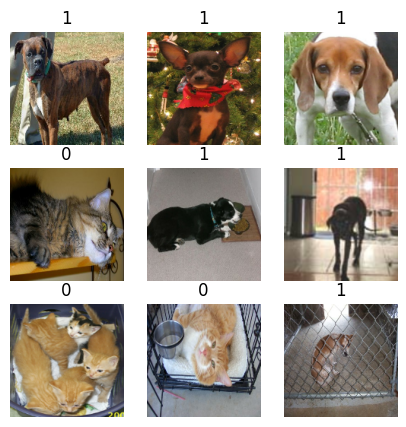

In [4]:
plt.figure(figsize=(5, 5))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy())
        plt.title(int(labels[i]))
        plt.axis("off")

### 1) Vamos investigar uma CNN sequencial, e adicionar opções de Dropout (regularização), e normalização por batch e por camada

In [5]:
def my_cnn(input_shape, num_classes, dropout_rate=0.0, batch_norm=False, layer_norm=False):

    inputs = keras.Input(shape=input_shape)

    x = layers.Conv2D(32, 3, strides=2, padding="same")(inputs)

    if (batch_norm): x = layers.BatchNormalization()(x)
    elif (layer_norm): x = layers.LayerNormalization()(x)
    x = layers.Activation("relu")(x)

    # guarda ativacao para somar ao fim do bloco residual
    ativacao_residual = x

    for n_filtros in [64,64]:
        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(n_filtros, 3, padding="same")(x)
        if (batch_norm): x = layers.BatchNormalization()(x)
        elif (layer_norm): x = layers.LayerNormalization()(x)

        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(n_filtros, 3, padding="same")(x)
        if (batch_norm): x = layers.BatchNormalization()(x)
        elif (layer_norm): x = layers.LayerNormalization()(x)

        x = layers.MaxPooling2D(3, strides=2, padding="same")(x)

        # residual
        residual = layers.Conv2D(n_filtros, 1, strides=2, padding="same")(
            ativacao_residual
        )
        x = layers.add([x, residual])  # adiciona resisual
        ativacao_residual = x  # armazena saida do bloco

    x = layers.SeparableConv2D(512, 3, padding="same")(x)
    if (batch_norm): x = layers.BatchNormalization()(x)
    elif (layer_norm): x = layers.LayerNormalization()(x)
    x = layers.Activation("relu")(x)

    x = layers.GlobalAveragePooling2D()(x)
    if num_classes == 2:
        activation = "sigmoid"
        neuronios = 1
    else:
        activation = "softmax"
        neuronios = num_classes

    x = layers.Dropout(dropout_rate)(x)
    outputs = layers.Dense(neuronios, activation=activation)(x)

    return keras.Model(inputs, outputs)

### I - Avaliando o papel da Normalização

In [6]:
seed(1)
set_seed(2)

epochs = 8

CNN1 = my_cnn(input_shape=input_shape, num_classes=2,
              dropout_rate=0.0, batch_norm=False, layer_norm=False)
CNN1.compile(loss='binary_crossentropy',
              optimizer=keras.optimizers.AdamW(learning_rate=0.0001),
              metrics=['accuracy'])

hist1 = CNN1.fit(train_ds,
                    batch_size=batch_size,
                    epochs=epochs, validation_data=validation_ds)

Epoch 1/8
146/146 [==============================] - 30s 85ms/step - loss: 0.6931 - accuracy: 0.4987 - val_loss: 0.6925 - val_accuracy: 0.5189
Epoch 2/8
146/146 [==============================] - 5s 34ms/step - loss: 0.6926 - accuracy: 0.5138 - val_loss: 0.6916 - val_accuracy: 0.5309
Epoch 3/8
146/146 [==============================] - 5s 34ms/step - loss: 0.6919 - accuracy: 0.5277 - val_loss: 0.6901 - val_accuracy: 0.5619
Epoch 4/8
146/146 [==============================] - 5s 35ms/step - loss: 0.6905 - accuracy: 0.5464 - val_loss: 0.6874 - val_accuracy: 0.5610
Epoch 5/8
146/146 [==============================] - 5s 33ms/step - loss: 0.6879 - accuracy: 0.5486 - val_loss: 0.6829 - val_accuracy: 0.5662
Epoch 6/8
146/146 [==============================] - 5s 34ms/step - loss: 0.6841 - accuracy: 0.5540 - val_loss: 0.6772 - val_accuracy: 0.5722
Epoch 7/8
146/146 [==============================] - 5s 33ms/step - loss: 0.6799 - accuracy: 0.5621 - val_loss: 0.6718 - val_accuracy: 0.5739
Epoch

### com Batch Normalization

In [7]:
seed(1)
set_seed(2)

CNN2 = my_cnn(input_shape=input_shape, num_classes=2,
              dropout_rate=0.0, batch_norm=True, layer_norm=False)

CNN2.compile(loss='binary_crossentropy',
              optimizer=keras.optimizers.AdamW(learning_rate=0.0001),
              metrics=['accuracy'])

hist2 = CNN2.fit(train_ds,
                    batch_size=batch_size,
                    epochs=epochs, validation_data=validation_ds)

Epoch 1/8
146/146 [==============================] - 13s 46ms/step - loss: 0.6573 - accuracy: 0.5989 - val_loss: 0.7110 - val_accuracy: 0.4905
Epoch 2/8
146/146 [==============================] - 6s 42ms/step - loss: 0.6238 - accuracy: 0.6481 - val_loss: 0.8381 - val_accuracy: 0.4905
Epoch 3/8
146/146 [==============================] - 6s 43ms/step - loss: 0.5999 - accuracy: 0.6756 - val_loss: 1.1213 - val_accuracy: 0.4905
Epoch 4/8
146/146 [==============================] - 6s 42ms/step - loss: 0.5781 - accuracy: 0.7021 - val_loss: 0.9012 - val_accuracy: 0.5198
Epoch 5/8
146/146 [==============================] - 6s 42ms/step - loss: 0.5612 - accuracy: 0.7165 - val_loss: 0.5776 - val_accuracy: 0.6838
Epoch 6/8
146/146 [==============================] - 6s 42ms/step - loss: 0.5477 - accuracy: 0.7257 - val_loss: 0.6057 - val_accuracy: 0.6864
Epoch 7/8
146/146 [==============================] - 7s 48ms/step - loss: 0.5365 - accuracy: 0.7311 - val_loss: 0.6271 - val_accuracy: 0.6770
Epoch

### com Layer Normalization

In [8]:
seed(1)
set_seed(2)

CNN3 = my_cnn(input_shape=input_shape, num_classes=2,
              dropout_rate=0.0, batch_norm=False, layer_norm=True)

CNN3.compile(loss='binary_crossentropy',
              optimizer=keras.optimizers.AdamW(learning_rate=0.0001),
              metrics=['accuracy'])

hist3 = CNN3.fit(train_ds,
                    batch_size=batch_size,
                    epochs=epochs, validation_data=validation_ds)

Epoch 1/8
146/146 [==============================] - 25s 120ms/step - loss: 0.6913 - accuracy: 0.5303 - val_loss: 0.6750 - val_accuracy: 0.5954
Epoch 2/8
146/146 [==============================] - 15s 105ms/step - loss: 0.6697 - accuracy: 0.5873 - val_loss: 0.6422 - val_accuracy: 0.6177
Epoch 3/8
146/146 [==============================] - 15s 106ms/step - loss: 0.6536 - accuracy: 0.6083 - val_loss: 0.6285 - val_accuracy: 0.6237
Epoch 4/8
146/146 [==============================] - 15s 106ms/step - loss: 0.6432 - accuracy: 0.6197 - val_loss: 0.6188 - val_accuracy: 0.6263
Epoch 5/8
146/146 [==============================] - 15s 104ms/step - loss: 0.6337 - accuracy: 0.6290 - val_loss: 0.6101 - val_accuracy: 0.6418
Epoch 6/8
146/146 [==============================] - 15s 104ms/step - loss: 0.6242 - accuracy: 0.6455 - val_loss: 0.6002 - val_accuracy: 0.6529
Epoch 7/8
146/146 [==============================] - 16s 112ms/step - loss: 0.6144 - accuracy: 0.6617 - val_loss: 0.5899 - val_accuracy:

com BN + Regularização Dropout

In [9]:
seed(1)
set_seed(2)

CNN4 = my_cnn(input_shape=input_shape, num_classes=2,
              dropout_rate=0.25, batch_norm=True)

CNN4.compile(loss='binary_crossentropy',
              optimizer=keras.optimizers.AdamW(learning_rate=0.0001),
              metrics=['accuracy'])

hist4 = CNN4.fit(train_ds,
                    batch_size=batch_size,
                    epochs=epochs, validation_data=validation_ds)

Epoch 1/8
146/146 [==============================] - 13s 43ms/step - loss: 0.6821 - accuracy: 0.5858 - val_loss: 0.6959 - val_accuracy: 0.4905
Epoch 2/8
146/146 [==============================] - 6s 43ms/step - loss: 0.6400 - accuracy: 0.6232 - val_loss: 0.7382 - val_accuracy: 0.4905
Epoch 3/8
146/146 [==============================] - 6s 42ms/step - loss: 0.6269 - accuracy: 0.6460 - val_loss: 0.8436 - val_accuracy: 0.4905
Epoch 4/8
146/146 [==============================] - 6s 43ms/step - loss: 0.6029 - accuracy: 0.6694 - val_loss: 0.6690 - val_accuracy: 0.5928
Epoch 5/8
146/146 [==============================] - 6s 42ms/step - loss: 0.5869 - accuracy: 0.6872 - val_loss: 0.6040 - val_accuracy: 0.6546
Epoch 6/8
146/146 [==============================] - 6s 43ms/step - loss: 0.5705 - accuracy: 0.6948 - val_loss: 0.6900 - val_accuracy: 0.6375
Epoch 7/8
146/146 [==============================] - 6s 41ms/step - loss: 0.5565 - accuracy: 0.7130 - val_loss: 0.6671 - val_accuracy: 0.6478
Epoch

In [10]:
scores1 = CNN1.evaluate(validation_ds, verbose=0)
scores2 = CNN2.evaluate(validation_ds, verbose=0)
scores3 = CNN3.evaluate(validation_ds, verbose=0)
scores4 = CNN4.evaluate(validation_ds, verbose=0)

In [11]:
print("Na validação")
print("BatchNorm LayerNorm Dropout - Loss\tAcc")
print("    -         -        -      %.4f\t%.4f" % (scores1[0],scores1[1]))
print("    X         -        -      %.4f\t%.4f" % (scores2[0],scores2[1]))
print("    -         X        -      %.4f\t%.4f" % (scores3[0],scores3[1]))
print("    X         -        X      %.4f\t%.4f" % (scores4[0],scores4[1]))

Na validação
BatchNorm LayerNorm Dropout - Loss	Acc
    -         -        -      0.6669	0.5773
    X         -        -      0.6274	0.6796
    -         X        -      0.5811	0.6796
    X         -        X      0.6657	0.6546


**Resumo: avaliando os modelos agora no teste**

In [12]:
scores1 = CNN1.evaluate(test_ds, verbose=0)
scores2 = CNN2.evaluate(test_ds, verbose=0)
scores3 = CNN3.evaluate(test_ds, verbose=0)
scores4 = CNN4.evaluate(test_ds, verbose=0)

In [13]:
print("BatchNorm LayerNorm Dropout - Loss\tAcc")
print("    -         -        -      %.4f\t%.4f" % (scores1[0],scores1[1]))
print("    X         -        -      %.4f\t%.4f" % (scores2[0],scores2[1]))
print("    -         X        -      %.4f\t%.4f" % (scores3[0],scores3[1]))
print("    X         -        X      %.4f\t%.4f" % (scores4[0],scores4[1]))

BatchNorm LayerNorm Dropout - Loss	Acc
    -         -        -      0.6704	0.5744
    X         -        -      0.6127	0.6756
    -         X        -      0.5704	0.7085
    X         -        X      0.6639	0.6489


### Redes Neurais e Aprendizado Profundo
#### **MBA em Ciências de Dados**

### *Módulo 4 - Treinamento de Redes Profundas*

**Aumentação de Dados e Transferência de Aprendizado**</span>

Moacir Antonelli Ponti

---

In [26]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from numpy.random import seed
from tensorflow.random import set_seed

import tensorflow_datasets as tfds

#tfds.disable_progress_bar()

# selecionamos 50% do treinamento
(train_ds, validation_ds, test_ds), info = tfds.load(
    "beans",
    split=["train[0%:50%]", "validation[0%:100%]", "test[0%:100%]"],
    as_supervised=True, 
    with_info=True
)

2021-10-12 15:19:35.936679: W tensorflow/core/kernels/data/cache_dataset_ops.cc:768] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


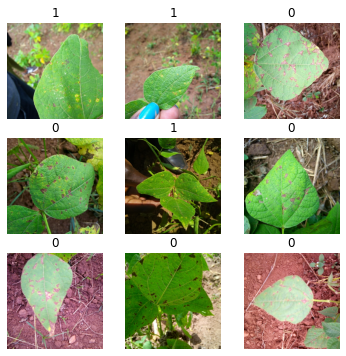

In [27]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 6))
for i, (image, label) in enumerate(train_ds.take(9)):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(image)
    plt.title(int(label))
    plt.axis("off")


In [28]:
print(info)

def normalize_img(image, label):
  """Normalizes images: `uint8` -> `float32`."""
  return tf.cast(image, tf.float32) / 255., label

# redimensionando exemplos e normalizando entre 0-1 tipo float32
img_size = (128, 128)
train_ds = train_ds.map(lambda x, y: (tf.image.resize(x, img_size), tf.one_hot(y,3)))
train_ds = train_ds.map(normalize_img, num_parallel_calls=tf.data.experimental.AUTOTUNE)

validation_ds = validation_ds.map(lambda x, y: (tf.image.resize(x, img_size), tf.one_hot(y,3)))
validation_ds = validation_ds.map(normalize_img, num_parallel_calls=tf.data.experimental.AUTOTUNE)

test_ds = test_ds.map(lambda x, y: (tf.image.resize(x, img_size), tf.one_hot(y,3)))
test_ds = test_ds.map(normalize_img, num_parallel_calls=tf.data.experimental.AUTOTUNE)

input_shape = img_size+(3,)

tfds.core.DatasetInfo(
    name='beans',
    full_name='beans/0.1.0',
    description="""
    Beans is a dataset of images of beans taken in the field using smartphone
    cameras. It consists of 3 classes: 2 disease classes and the healthy class.
    Diseases depicted include Angular Leaf Spot and Bean Rust. Data was annotated
    by experts from the National Crops Resources Research Institute (NaCRRI) in
    Uganda and collected by the Makerere AI research lab.
    """,
    homepage='https://github.com/AI-Lab-Makerere/ibean/',
    data_path='/home/maponti/tensorflow_datasets/beans/0.1.0',
    download_size=171.69 MiB,
    dataset_size=171.63 MiB,
    features=FeaturesDict({
        'image': Image(shape=(500, 500, 3), dtype=tf.uint8),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=3),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'test': <SplitInfo num_examples=128, num_shards=1>,
        'train': <SplitInfo num_ex

In [4]:
batch_size = 32

train_ds = train_ds.cache().batch(batch_size).prefetch(buffer_size=10)
validation_ds = validation_ds.cache().batch(batch_size).prefetch(buffer_size=10)
test_ds = test_ds.cache().batch(batch_size).prefetch(buffer_size=10)

---

### Data Augmentation: 
#### funciona como uma camada de pré-processamento, gerando transformações aleatórias na imagem de entrada. 

Ao longo das épocas é responsável pela perturbação da entrada.

In [5]:
data_augmentation = keras.Sequential(
    [
        layers.experimental.preprocessing.RandomFlip("horizontal"),
        layers.experimental.preprocessing.RandomFlip("vertical"),
        layers.experimental.preprocessing.RandomRotation(0.25),
        layers.experimental.preprocessing.RandomContrast(0.3),
    ]
)

2021-10-12 15:16:21.651463: W tensorflow/core/kernels/data/cache_dataset_ops.cc:768] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.
2021-10-12 15:16:21.651758: W tensorflow/core/kernels/data/cache_dataset_ops.cc:768] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


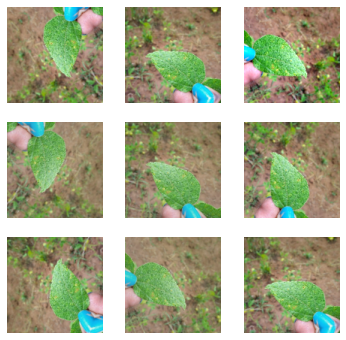

In [6]:
for images, labels in train_ds.take(1):
    plt.figure(figsize=(6, 6))
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = data_augmentation(
            tf.expand_dims(images[1], 0), training=True
        )
        #plt.title(str(labels[i].numpy()))
        plt.imshow(augmented_image[0].numpy())
        plt.axis("off")


--- 
### Carregando a CNN "MobileNet V2" para ser usada como "backbone" da solução

**Abordagem 1**: pesos inicializados aleatoriamente

carregamos `include_top=False` pois não queremos a última camada (top), especifica da ImageNet


In [7]:
base_model_random = tf.keras.applications.MobileNetV2(
    weights=None,
    input_shape=(128, 128, 3),
    include_top=False
)

# Permitir treinamento do modelo carregado
base_model_random.trainable = True

# Com base na MobileNetV2 vamos criar nosso modelo
# definimos o tamanho da entrada
inputs = keras.Input(shape=(128, 128, 3))
# aplicamos a transformacao da imagem de entrada
x = data_augmentation(inputs)

# Depois da "aumentacao de dados", temos o modelo base
x = base_model_random(x, training=True)
x = keras.layers.GlobalAveragePooling2D(name="avg_pool")(x)
x = keras.layers.Dropout(0.3)(x)
outputs = keras.layers.Dense(3,activation="softmax")(x)

model_random = keras.Model(inputs, outputs)

model_random.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
sequential (Sequential)      (None, 128, 128, 3)       0         
_________________________________________________________________
mobilenetv2_1.00_128 (Functi (None, 4, 4, 1280)        2257984   
_________________________________________________________________
avg_pool (GlobalAveragePooli (None, 1280)              0         
_________________________________________________________________
dropout (Dropout)            (None, 1280)              0         
_________________________________________________________________
dense (Dense)                (None, 3)                 3843      
Total params: 2,261,827
Trainable params: 2,227,715
Non-trainable params: 34,112
______________________________________________

#### Compilando e treinando o modelo a partir de pessos aleatórios

In [8]:
seed(1)
set_seed(2)

model_random.compile(
    optimizer=keras.optimizers.Adam(0.0001),
    loss="categorical_crossentropy",
    metrics=["acc"],
)

epochs = 20
rand_hist = model_random.fit(train_ds, epochs=epochs, validation_data=validation_ds)

Epoch 1/20


2021-10-12 15:16:26.178629: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudnn.so.8
2021-10-12 15:16:26.521686: I tensorflow/stream_executor/cuda/cuda_dnn.cc:359] Loaded cuDNN version 8200
2021-10-12 15:16:26.842776: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublas.so.11
2021-10-12 15:16:27.038451: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublasLt.so.11


17/17 [==============================] - 8s 201ms/step - loss: 1.1388 - acc: 0.3656 - val_loss: 1.1155 - val_acc: 0.4286
Epoch 2/20
17/17 [==============================] - 2s 127ms/step - loss: 1.1382 - acc: 0.3501 - val_loss: 1.0942 - val_acc: 0.4135
Epoch 3/20
17/17 [==============================] - 2s 128ms/step - loss: 1.1287 - acc: 0.3985 - val_loss: 1.0715 - val_acc: 0.3985
Epoch 4/20
17/17 [==============================] - 2s 127ms/step - loss: 1.1479 - acc: 0.3656 - val_loss: 1.0948 - val_acc: 0.4361
Epoch 5/20
17/17 [==============================] - 2s 128ms/step - loss: 1.1333 - acc: 0.4004 - val_loss: 1.1341 - val_acc: 0.3759
Epoch 6/20
17/17 [==============================] - 2s 127ms/step - loss: 1.1406 - acc: 0.3810 - val_loss: 1.1272 - val_acc: 0.4060
Epoch 7/20
17/17 [==============================] - 2s 126ms/step - loss: 1.1174 - acc: 0.4120 - val_loss: 1.0720 - val_acc: 0.4436
Epoch 8/20
17/17 [==============================] - 2s 126ms/step - loss: 1.0556 - acc:

In [9]:
scores = model_random.evaluate(validation_ds)
print('Inicializacao Aleatoria. Scores: ', scores)

5/5 [==============================] - 0s 25ms/step - loss: 0.9188 - acc: 0.5489
Inicializacao Aleatoria. Scores:  [0.918752133846283, 0.548872172832489]


--- 
### Carregando a CNN "MobileNet V2" com pesos pré-treinados

**Abordagem 2**: uso de pesos pré-treinados na imagenet para Transferência de Aprendizado


In [10]:
base_model = tf.keras.applications.MobileNetV2(
    weights="imagenet",
    input_shape=(128, 128, 3),
    include_top=False
)

# Tornamos o modelo base não treinável, "congelando" os parâmetros
base_model.trainable = False

# Nosso modelo como anteriormente
inputs = keras.Input(shape=(128, 128, 3))
x = data_augmentation(inputs) 

# Incluindo a MobileNetV2 com parametros pré-treinados, mas ainda não treinável
x = base_model(x, training=False)
x = keras.layers.GlobalAveragePooling2D(name="avg_pool")(x)
x = keras.layers.Dense(160,activation="relu", name="projection")(x)
x = keras.layers.Dropout(0.3)(x)
outputs = keras.layers.Dense(3,activation="softmax")(x)
model = keras.Model(inputs, outputs)

model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
sequential (Sequential)      (None, 128, 128, 3)       0         
_________________________________________________________________
mobilenetv2_1.00_128 (Functi (None, 4, 4, 1280)        2257984   
_________________________________________________________________
avg_pool (GlobalAveragePooli (None, 1280)              0         
_________________________________________________________________
projection (Dense)           (None, 160)               204960    
_________________________________________________________________
dropout_1 (Dropout)          (None, 160)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 3)                 483 

#### Passo 1: treinar apenas a camada de saída (softmax)


In [11]:
seed(1)
set_seed(2)

model.compile(
    optimizer=keras.optimizers.Adam(0.0001),
    loss="categorical_crossentropy",
    metrics=["acc"],
)

epochs = 16
pt_hist1 = model.fit(train_ds, epochs=epochs, validation_data=validation_ds)

Epoch 1/15
17/17 [==============================] - 4s 86ms/step - loss: 1.1934 - acc: 0.4662 - val_loss: 0.8421 - val_acc: 0.6165
Epoch 2/15
17/17 [==============================] - 1s 41ms/step - loss: 0.8905 - acc: 0.6093 - val_loss: 0.6766 - val_acc: 0.7143
Epoch 3/15
17/17 [==============================] - 1s 39ms/step - loss: 0.7171 - acc: 0.7195 - val_loss: 0.6161 - val_acc: 0.7293
Epoch 4/15
17/17 [==============================] - 1s 39ms/step - loss: 0.6391 - acc: 0.7215 - val_loss: 0.5821 - val_acc: 0.7444
Epoch 5/15
17/17 [==============================] - 1s 39ms/step - loss: 0.6195 - acc: 0.7331 - val_loss: 0.5374 - val_acc: 0.7744
Epoch 6/15
17/17 [==============================] - 1s 39ms/step - loss: 0.6023 - acc: 0.7408 - val_loss: 0.5285 - val_acc: 0.7744
Epoch 7/15
17/17 [==============================] - 1s 39ms/step - loss: 0.5762 - acc: 0.7544 - val_loss: 0.5242 - val_acc: 0.7744
Epoch 8/15
17/17 [==============================] - 1s 40ms/step - loss: 0.5421 - a

In [12]:
scores = model.evaluate(validation_ds)
print('Transferencia do Aprendizado de Representacaoes. Scores: ', scores)

5/5 [==============================] - 0s 24ms/step - loss: 0.4394 - acc: 0.8195
Transferencia do Aprendizado de Representacaoes. Scores:  [0.43939706683158875, 0.8195488452911377]


#### Passo 2: ajuste fino do restante dos parâmetros

Executamos mais algumas épocas para tentar melhorar as outras camadas

In [13]:
# des-congelando o modelo base, permitindo ser treinável

# modelo completo
base_model.trainable = True

# congelando as primeiras camadas, deixando apenas as ultimas treinaveis
for layer in base_model.layers[:-4]: 
    layer.trainable = False
    # congela tambem camadas de BN
    if isinstance(layer, keras.layers.BatchNormalization):
        layer._per_input_updates = {}
        
# verificando
for layer in base_model.layers[-8:]: print(layer, layer.trainable)      
# note a diferença no summary
model.summary()

<tensorflow.python.keras.layers.convolutional.DepthwiseConv2D object at 0x7f8c86065fd0> False
<tensorflow.python.keras.layers.normalization_v2.BatchNormalization object at 0x7f8c86067df0> False
<tensorflow.python.keras.layers.advanced_activations.ReLU object at 0x7f8c860a8190> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f8c8600db20> False
<tensorflow.python.keras.layers.normalization_v2.BatchNormalization object at 0x7f8c8604c3a0> True
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f8c85fbe520> True
<tensorflow.python.keras.layers.normalization_v2.BatchNormalization object at 0x7f8c85fbef70> True
<tensorflow.python.keras.layers.advanced_activations.ReLU object at 0x7f8c85fbe9a0> True
Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 128, 128, 3)]     0         
_____________________________________________

In [14]:
# aqui definimos um passo/learning rate bem pequeno para o ajuste-fino
model.compile(
    optimizer=keras.optimizers.Adam(10e-7), 
    loss="categorical_crossentropy",
    metrics=["acc"],
)

epochs = 5
pt_hist2 = model.fit(train_ds, epochs=epochs, validation_data=validation_ds)

Epoch 1/5
17/17 [==============================] - 4s 85ms/step - loss: 0.3963 - acc: 0.8491 - val_loss: 0.4386 - val_acc: 0.8195
Epoch 2/5
17/17 [==============================] - 1s 39ms/step - loss: 0.4145 - acc: 0.8298 - val_loss: 0.4397 - val_acc: 0.8195
Epoch 3/5
17/17 [==============================] - 1s 39ms/step - loss: 0.3686 - acc: 0.8414 - val_loss: 0.4394 - val_acc: 0.8195
Epoch 4/5
17/17 [==============================] - 1s 41ms/step - loss: 0.4001 - acc: 0.8221 - val_loss: 0.4408 - val_acc: 0.8195
Epoch 5/5
17/17 [==============================] - 1s 42ms/step - loss: 0.4020 - acc: 0.8337 - val_loss: 0.4420 - val_acc: 0.8195


In [15]:
scores = model.evaluate(validation_ds)
print('Ajuste Fino. Scores validacao: ', scores)

5/5 [==============================] - 0s 25ms/step - loss: 0.4420 - acc: 0.8195
Ajuste Fino. Scores validacao:  [0.4419874846935272, 0.8195488452911377]


Comparando o histórico das duas abordagens

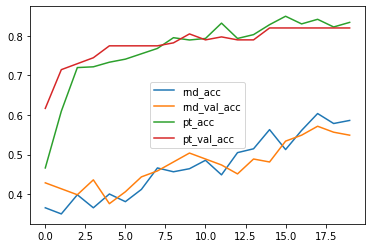

In [16]:
pt_tra_hist = np.concatenate((pt_hist1.history['acc'], pt_hist2.history['acc']), axis=None)
pt_val_hist = np.concatenate((pt_hist1.history['val_acc'], pt_hist2.history['val_acc']), axis=None)

plt.plot(rand_hist.history['acc'])
plt.plot(rand_hist.history['val_acc'])
plt.plot(pt_tra_hist)
plt.plot(pt_val_hist)
plt.legend(['rnd_acc','rnd_val_acc','pt_acc','pt_val_acc'])

--- 
### Obtendo features a partir da CNN "MobileNet V2" com pesos pré-treinados

**Abordagem 3**: obter a saída dessa rede, sem incluir a camada de predição (softmax).

Esse processo *não necessita de treinamento* da rede. Para obter features, incluímos uma nova camada, de Global Pooling e definimos essa camada como sendo a de saída do modelo.

Aqui também não incluimos o "topo" da rede, cujas camadas dependem de uma entrada de tamanho igual a da ImageNet (224x224) e saída com 1000 classes.

In [17]:
# carregando pessos pré-treinados
base_model_extraction = keras.applications.MobileNetV2(
    weights="imagenet",
    input_shape=(128, 128, 3),
    include_top=False
)

# obtemos a camada de saída do modelo carregado (última camada pois não incluímos o topo da rede)
base_output = base_model_extraction.layers[-1].output

# para evitar uma dimensionalidade alta, definimos uma nova camada de saída
feat_layer = keras.layers.GlobalAveragePooling2D()(base_output)

# montamos um novo modelo com a entrada do pré-treinado, e saída criada acima
model_imagenet = keras.models.Model(base_model_extraction.inputs, feat_layer)

# passando os exemplos de treinamento pela rede sem treinamento
# o "predict" vai nos dar a saída programada, obtida da GlobalAveragePooling2D
features_train_mobilenet = np.array(model_imagenet.predict(train_ds))
features_val_mobilenet = np.array(model_imagenet.predict(validation_ds))
features_test_mobilenet = np.array(model_imagenet.predict(test_ds))

print('\tDados x features obtidas treinamento: ', features_train_mobilenet.shape)
print('\tDados x features obtidas test: ', features_test_mobilenet.shape)

	Dados x features obtidas treinamento:  (517, 1280)
	Dados x features obtidas test:  (128, 1280)


As features obtidas podem ser utilizadas para treinar classificadores não profundos ou como índices de sistemas de recuperação baseada em conteúdo.

Vamos visualizá-las utilizando uma projeção PCA em duas dimensões

In [18]:
from sklearn.decomposition import PCA

# pca com dados da ImageNet
pca = PCA(n_components=2)
pca.fit(features_train_mobilenet)
pca_train_imagenet = pca.transform(features_train_mobilenet)

In [19]:
print(pca.explained_variance_)

[45.509853 36.836216]


In [20]:
# obtem labels treinamento
train_ds2 = train_ds.map(lambda x, y: (x, tf.math.argmax(y,axis=1)))
train_labels = list(np.concatenate([y for x, y in train_ds2], axis=0))

# obtem labels da validacao
validation_ds2 = validation_ds.map(lambda x, y: (x, tf.math.argmax(y,axis=1)))
val_labels = list(np.concatenate([y for x, y in validation_ds2], axis=0))

# obtem labels do teste
test_ds2 = test_ds.map(lambda x, y: (x, tf.math.argmax(y,axis=1)))
test_labels = list(np.concatenate([y for x, y in test_ds2], axis=0))

In [21]:
pca_train_imagenet.shape

(517, 2)

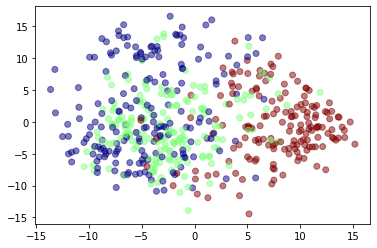

In [22]:
colors = ((np.array(train_labels)/2)*100).astype(int)
plt.scatter(pca_train_imagenet[:,0], pca_train_imagenet[:,1], c=colors, alpha=0.5, cmap='jet')

Usando em um classificador externo

In [23]:
from sklearn.svm import SVC

svm_feat1 = SVC(C=10, probability=True)
svm_feat1.fit(features_train_mobilenet, train_labels)

SVC(C=10, probability=True)

In [24]:
print('Acurácia Treinamento:')
print(svm_feat1.score(features_train_mobilenet, train_labels))
print('Acurácia Validacao:')
print(svm_feat1.score(features_val_mobilenet, val_labels))

Acurácia Treinamento:
1.0
Acurácia Validacao:
0.8872180451127819


---
Resumo comparativo das abordagens:

1. Treinamento a partir de pesos aleatórios
2. Pré-treinamento + Transferência de Aprendizado e Ajuste Fino
3. Extração de Características + Classificador Externo

In [ ]:
scoresR = model_random.evaluate(test_ds, verbose=0)
scoresTL = model.evaluate(test_ds, verbose=0)
scoresF = svm_feat1.score(features_test_mobilenet, test_labels)

print('MobileNet treinada de pesos aleatorios: ', scoresR[1]*100)
print('MobileNet pré-treinada + ajuste fino: ', scoresTL[1]*100)
print('Features MobileNet + SVM: ', scoresF*100)

## <span style="color:darkred">Módulo 4 - Estratégias de Treinamento e Transferência de Aprendizado</span>
### <span style="color:darkred">Avaliação (com soluções)</span>

---

### Questão 1)

Considere as seguintes suposições que comumente são feitas ao treinar redes neurais profundas por serem consideradas importantes ou essenciais para o bom treinamento desses modelos:

I - Dados de entrada são uma mistura de categóricos e não estruturados<br>
II - Dados possuem alta taxa ruído nos rótulos<br>
III - Conjunto de treinamento possui quantidade adequada ao problema<br>
IV - Dados de entrada podem possuir features em  intervalos muito diferentes de valores<br>
V - Há dados representativos com relação à tarefa alvo do problema<br>

Quais dessas são verdadeiras?

(a) I, III<br>
(b) I, III, V<br>
(c) II, III<br>
(d) II, III, V<br>
<font color='red'>(e) III, V<br></font>

**Justificativa:** I é inválida pois redes neurais não permitem dados categóricos de forma nativa, II é inválida pois o treinamento de redes neurais supõe dados com baixa taxa de ruído nos rótulos devido ao fato de que esses podem ser memorizados, III é válida pois a quantidade de dados é relevante para modelos com alta complexidade como é o caso de redes profundas, IV é inválido pois redes neurais não se dão bem com features/dados de entrada em intervalos arbitrários, V é válido pois é preciso haver representatividade dos dados de saída/alvo, por exemplo entre as diferentes classes ou valores da regressão.

---
### Questão 2)


Considere os valores de perda abaixo listadas, observadas no conjunto de treinamento de forma independente após treinar modelos de rede profunda por 50 épocas para um problema de classificação de 3 classes usando a perda entropia cruzada categórica.

I - Perda 0.9<br>
II - Perda 1.1<br>
III - Perda 11.5<br>
IV - Perda -39.0<br>

Dica: para interpretar os valores acima, realize simulações com distintas situações calculando as perdas a partir de vetores de probabilidade com: (1) todas as classes equiprováveis, (2) classe correta (alvo) com probabilidade muito baixa (0.00001) e demais equiprováveis, (3) e vetor de probabilidade com a classe alvo contendo a máxima, porém baixa, probabilidade.<br>

Qual a interpretação do resultado dos valores acima?

(a) I: classe alvo com probabilidade 0.9, II: classe alvo probabilidade 0.00001 e demais equiprováveis, III: classes equiprováveis, IV:  erro de cálculo numérico<br>
(b) I: classes equiprováveis, II: classe alvo com probabilidade 0.51, III: classe alvo com probabilidade 0.1, IV: classe alvo probabilidade 0.00001 e demais equiprováveis<br>
(c) I: classes equiprováveis, II: classe alvo com probabilidade 0.05, III: erro de cálculo numérico, IV: classe alvo probabilidade 0.00001 e demais equiprováveis<br>
<font color='red'>(d) I: classe alvo com probabilidade 0.4, II: classes equiprováveis, III: classe alvo probabilidade 0.00001 e demais equiprováveis, IV: erro de cálculo numérico<br></font>
(e) I: classe alvo com probabilidade 0.33, II: classes equiprováveis, III: classe alvo com probabilidade 0.51, IV: erro de cálculo numérico<br>

**Justificativa:** ver código abaixo. No pior cenário em que a classe alvo tem probabilidade 0.00001 o custo pode chegar a 11.5 (III), portanto uma perda de 39 (IV) é provavelmente um erro de cálculo ou de precisão numérica pois um valor negativo não é esperado para o custo de entropia cruzada. Já com classes equiprováveis temos a perda próxima a 1.1 (II). Com baixa (porém máxima) probabilidade 0.4 temos perda 0.9 (I).

In [ ]:
import numpy as np

def cross_entropy_loss(y,yh):
    return -np.sum((y*np.log(yh)))

#
classes = 3

y2 = np.zeros(classes)
y2[0] = 1

print('vetor alvo: ', y2)

# cenário uniformemente distribuído
yh2 = np.ones(classes)/classes
print('classes equiprovaveis: ', yh2)

loss_eq1 = cross_entropy_loss(y2,yh2)
print(f'uniforme: {loss_eq1:.1f}\n')

# cenário de probabilidade próxima a zero
yr2 = np.zeros(classes)
yr2[0] = 1e-5
yr2[1:] = (1-yr2[0])/(classes-1) # outras classes equiprovaveis
print(f'classe correta probabilidade 10^-5: {yr2}, sum = {np.sum(yr2)}')

loss_eq2 = cross_entropy_loss(y2,yr2)
print(f'alvo prob. zero: {loss_eq2:.1f}')

# cenário correto com baixa probabilidade
yc2 = np.zeros(classes)
yc2[0] = 0.4 # probabilidade baixa
yc2[1:] = (1-yc2[0])/(classes-1) # outras classes equiprovaveis
print(f'\nclasse correta baixa probabilidade: {yc2}, sum = {np.sum(yc2)}')

loss_eq3 = cross_entropy_loss(y2,yc2)
print(f'correto, com baixa probabilidade: {loss_eq3:.1f}')

vetor alvo:  [1. 0. 0.]
classes equiprovaveis:  [0.33333333 0.33333333 0.33333333]
uniforme: 1.1

classe correta probabilidade 10^-5: [1.e-50 5.e-01 5.e-01], sum = 1.0
alvo prob. zero: 115.1

classe correta baixa probabilidade: [0.4 0.3 0.3], sum = 1.0
correto, com baixa probabilidade: 0.9


---

### Questão 3)

Carregue a base de dados Fashion MNIST código disponível no notebook fornecido e crie um modelo de CNN com a seguinte arquitetura, capaz de obter classificação nessa base de dados de imagens. Considere que todas as camadas convolucionais tem zeropadding, e ativação relu, exceto quando mencionado contrário.

1. Pré-processamento para aumentação contendo:
  * RandomRotation(0.05)
  * RandomZoom(0.075),
  * RandomContrast(0.2),
  * RandomFlip("horizontal")
1. Convolucional 2D com 256 filtros $3\times 3$.
2. MaxPooling2D $2\times 2$ e strides $2$
2. Batch Normalization
3. SeparableConv2D com 128 filtros $3\times 3$.
4. MaxPooling2D $2\times 2$ e strides $2$
5. Batch Normalization
6. SeparableConv2D com 128 filtros $3\times 3$.
8. GlobalAveragePooling2D
9. Camada densa com 100 neurônios
9. Dropout de 0.3
10. Densa com ativação softmax

Parte da implementação já está disponível no notebook fornecido. Usar o que está disponível e completar conforme necessário para obter os resultados.

Realize 10 experimentos, incializando as sementes do numpy e tensorflow para os valores: 10,20,30,40,50,60,70,80,90 e 100. Em cada uma, treine um modelo contendo a camada de aumento de dados.

Utilize as primeiras 4 mil imagens (use [:4000]) por 8 épocas com batch size 42, otimizador AdamW e taxa de aprendizado 0.0003 com a perda de entropia cruzada categórica. Em cada experimento, avalie o resultado da acurácia no conjunto de testes.

Considerando a acurácia média em porcentagem obtida  no conjunto de testes considerando apenas a sua parte inteira (sem contar casas decimais, exemplo: 38%), qual foi o resultado mais próximo do seu experimento com relação aos casos abaixo?

(a) Acurácia entre 25% e 35%<br>
(b) Acurácia entre 45 e 55%<br>
<font color="red">(c) Acurácia entre 65 e 75%<br></font>
(d) Acurácia entre 80 e 90%<br>
(e) Acurácia acima de 95%<br>

 **Justificativa**: Ver código abaixo.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from numpy.random import seed
from tensorflow.random import set_seed

fashion_mnist = keras.datasets.fashion_mnist
(train_images, train_labels), (test_images, test_labels) = fashion_mnist.load_data()

train_images = train_images / 255.0
test_images = test_images / 255.0

train_labels = keras.utils.to_categorical(train_labels, 10)
test_labels = keras.utils.to_categorical(test_labels, 10)

In [ ]:
data_augmentation = keras.Sequential(
    [
        layers.experimental.preprocessing.RandomRotation(0.05),
        layers.experimental.preprocessing.RandomZoom(0.075),
        layers.experimental.preprocessing.RandomContrast(0.2),
        layers.experimental.preprocessing.RandomFlip("horizontal"),
    ]
)

def my_cnn(input_shape, num_classes, dropout_rate=0.0, augmentation=False):

    inputs = keras.Input(shape=input_shape)
    if augmentation:
        x = data_augmentation(inputs)
        x = layers.Conv2D(256, 3, activation="relu", padding="same")(x)
    else:
        x = layers.Conv2D(256, 3, activation="relu", padding="same")(inputs)

    x = layers.MaxPooling2D(2, strides=2, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.SeparableConv2D(128, 3, activation="relu", padding="same")(x)
    x = layers.MaxPooling2D(2, strides=2, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.SeparableConv2D(128, 3, activation="relu", padding="same")(x)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(100, activation="relu")(x)
    x = layers.Dropout(dropout_rate)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)

    return keras.Model(inputs, outputs)

In [ ]:
model = my_cnn((28,28,1), 10, 0.3, True)
model.summary()

Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 sequential_1 (Sequential)   (None, 28, 28, 1)         0         
                                                                 
 conv2d_7 (Conv2D)           (None, 28, 28, 256)       2560      
                                                                 
 max_pooling2d_14 (MaxPooli  (None, 14, 14, 256)       0         
 ng2D)                                                           
                                                                 
 batch_normalization_14 (Ba  (None, 14, 14, 256)       1024      
 tchNormalization)                                               
                                                                 
 separable_conv2d_14 (Separ  (None, 14, 14, 128)       3520

In [ ]:
epochs = 8
batch_size = 42
no_images = 4000

train_sub = train_images[:no_images]
labels_sub= train_labels[:no_images]

In [ ]:
mean_acc = 0.0
seeds = list([10,20,30,40,50,60,70,80,90,100])

for sd in seeds:
    seed(sd)
    set_seed(sd)
    print('Experimento com semente = ', sd)
    model = my_cnn((28,28,1), 10, 0.3, True)
    model.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.AdamW(learning_rate=0.0003),
              metrics=['accuracy'])
    hist1 = model.fit(train_sub, labels_sub, batch_size=batch_size, epochs=epochs, verbose=0)
    scores = model.evaluate(test_images, test_labels, verbose=0)
    mean_acc = mean_acc + (scores[1]*100)
    print(f'\tAcuracia DA: {(scores[1]*100):.2f}')

Experimento com semente =  10
	Acuracia DA: 69.86
Experimento com semente =  20
	Acuracia DA: 72.99
Experimento com semente =  30
	Acuracia DA: 63.75
Experimento com semente =  40
	Acuracia DA: 71.43
Experimento com semente =  50
	Acuracia DA: 73.16
Experimento com semente =  60
	Acuracia DA: 62.95
Experimento com semente =  70
	Acuracia DA: 73.58
Experimento com semente =  80
	Acuracia DA: 70.95
Experimento com semente =  90
	Acuracia DA: 71.66
Experimento com semente =  100
	Acuracia DA: 67.02


In [ ]:
print('')
print(f'Acurácia de teste média {(mean_acc/len(seeds)):.0f}%')


Acurácia de teste média 70%


---
### Questão 4)

Carregue a base de dados Fashion-MNIST e use uma rede neural convolucional com arquitetura contendo as seguintes camadas  (conforme código disponível no notebook fornecido)
* Camada Convolucional 2D, contendo 128 filtros 3x3 e stride 1, ativação=relu, padding=same
* MaxPooling 2D com passo e stride 2 nas duas direções
* Bloco Residual com 64 filtros nas suas camadas convolucionais
* GlobalAveragePooling2D
* Camada densa de saída softmax

Utilizar: otimizador Adam, batchsize 24, e 8 épocas. com entropia cruzada categórica.

Investigue os seguintes valores de taxa de aprendizado: 0.0001, 0.0005, 0.001, 0.005, 0.01, todos com decaimento exponencial com taxa de decaimento 0.02 desde a primeira época (sem arredondar o resultado no scheduler).

Para isso, utilize as primeiras 800 imagens (:800) para treinamento e as próximas 400 para validação (800:1200), conforme código disponível no notebook fornecido.

Repita o experimento 5 vezes, utilizando sementes de 1 a 5 que devem ser setadas no tensorflow e numpy antes da compilação e treinamento de cada modelo. Use o mesmo conjunto de treinamento e validação em todas as execuções e obtenha a perda média (das 5 execuções) computada no conjunto de validação .

Qual taxa de aprendizado teve menor valor de perda média, considerando o conjunto de validação?

(a) 0.0001<br>
(b) 0.0005<br>
(c) 0.001<br>
<font color='red'>(d) 0.005<br></font>
(e) 0.01<br>

**Justificativa:** ver código abaixo

(60000, 28, 28)
Classes:  10


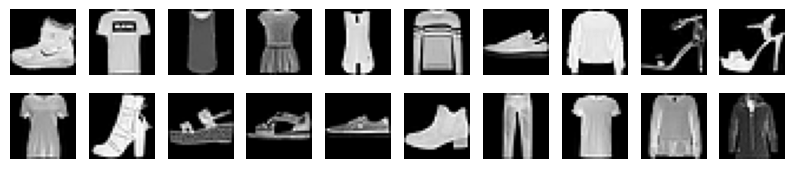

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from numpy.random import seed
from tensorflow.random import set_seed

from tensorflow.keras.datasets import fashion_mnist
(x_train, y_train), (x_test, y_test) = fashion_mnist.load_data()

fig, axes = plt.subplots(2,10, figsize=(10,2))
ax = axes.ravel()
for i in range(20):
    ax[i].imshow(x_train[i], cmap="gray")
    ax[i].axis('off')

img_lin, img_col = x_train.shape[1], x_train.shape[2]
num_classes = len(np.unique(y_train))
print(x_train.shape)
print('Classes: ', num_classes)

x_train = x_train.astype('float32') / 255.0
x_test = x_test.astype('float32') / 255.0

y_train = tf.keras.utils.to_categorical(y_train, num_classes)
y_test = tf.keras.utils.to_categorical(y_test, num_classes)

# verifica se as imagens da base de dados tem um canal (i.e. em tons de cinza)
# ou mais do que um canal e se houver mais do que um canal entao armazena a
# quantidade de canais
if (len(x_train.shape) == 3):
      n_channels = 1
else:
      n_channels = x_train.shape[3]

# re-formatando as imagens de forma que sejam transformadas em
# matrizes com canais (por exemplo quando as imagens sao RGB)
if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], n_channels, img_lin, img_col)
    x_test = x_test.reshape(x_test.shape[0], n_channels, img_lin, img_col)
    input_shape = (n_channels, img_lin, img_col)
else:
    x_train = x_train.reshape(x_train.shape[0], img_lin, img_col, n_channels)
    x_test = x_test.reshape(x_test.shape[0], img_lin, img_col, n_channels)
    input_shape = (img_lin, img_col, n_channels)

In [ ]:
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import concatenate
from tensorflow.keras.utils import plot_model
from tensorflow.keras.layers import add

def residual_block(layer_in, n_filters):
    merge_input = layer_in
    #verifica se é necessária uma primeira camada para deixar o número de filtros iguais para adição
    if layer_in.shape[-1] != n_filters:
        merge_input = Conv2D(n_filters, (1,1), padding='same', activation='relu', kernel_initializer='he_normal')(layer_in)
    # conv1
    conv1 = Conv2D(n_filters, (3,3), padding='same', activation='relu', kernel_initializer='he_normal')(layer_in)
    # conv2
    conv2 = Conv2D(n_filters, (3,3), padding='same', activation='linear', kernel_initializer='he_normal')(conv1)
    # soma entrada com saída (pulou 2 camadas)
    layer_out = add([conv2, merge_input])
    # função de ativação da saída do bloco
    layer_out = keras.layers.Activation('relu')(layer_out)
    return layer_out

# minha ResNet
def ResNetModel():
    input_layer = Input(shape=input_shape)
    layer1 = Conv2D(128, (3,3), padding='same', activation='relu')(input_layer)
    pool1 = MaxPooling2D((2,2), strides=(2,2), padding='same')(layer1)
    rblock1 = residual_block(pool1, 64)
    avgpool = keras.layers.GlobalAveragePooling2D()(rblock1)
    softmax = keras.layers.Dense(num_classes, activation='softmax')(avgpool)
    ResNetModel = keras.models.Model(inputs=input_layer, outputs=softmax)
    return ResNetModel

In [ ]:
x_sub = x_train[:800]
y_sub = y_train[:800]
x_val = x_train[800:1200]
y_val = y_train[800:1200]

def scheduler(epoch, lr):
    return lr * tf.math.exp(-0.02)

callbacklr = keras.callbacks.LearningRateScheduler(scheduler)

In [ ]:
epochs = 8
batch_size = 24

lrs = [0.0001, 0.0005, 0.001, 0.005, 0.01]
losses_ = []

for lr in lrs:
    print('LR:', lr)
    for sd in range(1,6):
        seed(sd)
        set_seed(sd)
        model = ResNetModel()
        model.compile(optimizer=keras.optimizers.Adam(learning_rate=lr),
                      loss='categorical_crossentropy', metrics=['accuracy'])

        history = model.fit(x_sub, y_sub, epochs=epochs, batch_size=batch_size,
                             callbacks=[callbacklr], verbose=0)

        score = model.evaluate(x_val, y_val, verbose = 0)
        losses_.append(score[0])
        print("\tLR final=%.6f, Ent.Cruzada = %.4f, Acuracia = %.4f" % (model.optimizer.lr.numpy(), score[0], score[1]))

LR: 0.0001
	LR final=0.000085, Ent.Cruzada = 1.9485, Acuracia = 0.3950
	LR final=0.000085, Ent.Cruzada = 1.8882, Acuracia = 0.3575
	LR final=0.000085, Ent.Cruzada = 1.8224, Acuracia = 0.4100
	LR final=0.000085, Ent.Cruzada = 1.8741, Acuracia = 0.3350
	LR final=0.000085, Ent.Cruzada = 1.8473, Acuracia = 0.3325
LR: 0.0005
	LR final=0.000426, Ent.Cruzada = 1.1793, Acuracia = 0.5350
	LR final=0.000426, Ent.Cruzada = 1.2128, Acuracia = 0.5175
	LR final=0.000426, Ent.Cruzada = 1.1612, Acuracia = 0.5975
	LR final=0.000426, Ent.Cruzada = 1.2151, Acuracia = 0.5650
	LR final=0.000426, Ent.Cruzada = 1.1669, Acuracia = 0.5100
LR: 0.001
	LR final=0.000852, Ent.Cruzada = 1.0248, Acuracia = 0.6125
	LR final=0.000852, Ent.Cruzada = 1.0545, Acuracia = 0.6150
	LR final=0.000852, Ent.Cruzada = 1.0255, Acuracia = 0.5775
	LR final=0.000852, Ent.Cruzada = 1.0178, Acuracia = 0.6375
	LR final=0.000852, Ent.Cruzada = 1.0143, Acuracia = 0.6025
LR: 0.005
	LR final=0.004261, Ent.Cruzada = 0.9191, Acuracia = 0.647

In [ ]:
losses_  = np.array(losses_).reshape((len(lrs),5))
mean_loss = np.mean(losses_, axis=1)

In [ ]:
for lr,ma in zip(lrs, mean_loss):
    print("\tLR=%.4f, Perda Media = %.3f" % (lr,ma))

	LR=0.0001, Perda Media = 1.876
	LR=0.0005, Perda Media = 1.187
	LR=0.0010, Perda Media = 1.027
	LR=0.0050, Perda Media = 0.900
	LR=0.0100, Perda Media = 1.210


---

### Questão 5)

Realize um procedimento de extração de características de imagens conforme os seguintes passos, parte dos quais já está disponivel no notebook fornecido:
1. Carregue e processe a base de dados "eurosat" do tensorflow-datasets conforme código disponível.
2. Carregue um modelo ResNet50V2 pré-treinado na ImageNet sem utilizar o topo da rede. Crie um modelo extrator de características incluindo a ResNet50V2 carregada seguida de uma camada de Global Max Pooling para realizar extração de 2048 características da base de dados.
3. Obtenha um array com as características extraídas a partir do modelo extrator criado no passo anterior
4. Utilizando as características obtidas referentes ao conjunto de treinamento, ajuste um modelo PCA com 200 componentes. Utilize o atributo `explained_variance_ratio_` e compute a porcentagem da variância retida nesses 200 componentes (somadas).

Em qual intervalo recai a soma da porcentagem da variância retida nas 200 componentes principais?

(a) 15 a 32%<br>
(b) 33 a 47%<br>
(c) 48 a 60%<br>
(d) 61 a 76%<br>
<font color='red'>(e) 77 a 91%<br></font>

**Justificativa**: Ver código abaixo.

In [2]:
### Passo 1 - carregar e preparar dados
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from numpy.random import seed
from tensorflow.random import set_seed

import tensorflow_datasets as tfds

download_url = "https://huggingface.co/datasets/torchgeo/eurosat/resolve/c4629ffcef452ee1dd8025fb71c57a0dfb4ba61c/EuroSAT.zip"
builder = tfds.builder('eurosat')
builder.builder_config.download_url = download_url
builder.download_and_prepare()

train_ds = tfds.load('eurosat', split='train[50%:70%]', as_supervised=True)

def normalize_img(image, label):
  """Normalizes images: `uint8` -> `float32`."""
  return tf.cast(image, tf.float32) / 255., label

# redimensionando exemplos e normalizando entre 0-1 tipo float32
img_size = (100, 100)
train_ds = train_ds.map(lambda x, y: (tf.image.resize(x, img_size), y))
train_ds = train_ds.map(normalize_img, num_parallel_calls=tf.data.experimental.AUTOTUNE)

input_shape = img_size+(3,)

batch_size = 64
train_ds = train_ds.cache().batch(batch_size).prefetch(buffer_size=10)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/27000 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/eurosat/rgb/2.0.0.incompleteBW9QM8/eurosat-train.tfrecord*...:   0%|      …

Dataset eurosat downloaded and prepared to /root/tensorflow_datasets/eurosat/rgb/2.0.0. Subsequent calls will reuse this data.


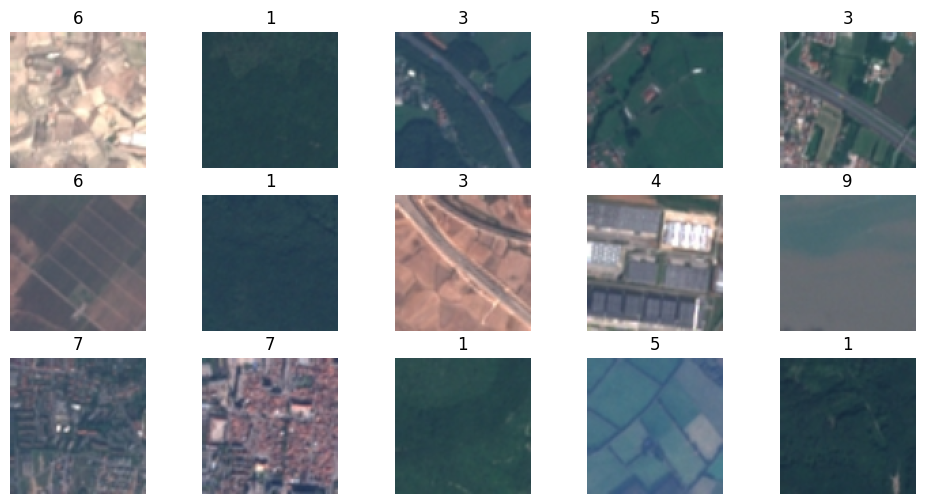

In [3]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
for i, (image, label) in enumerate(train_ds.take(15)):
    ax = plt.subplot(3, 5, i + 1)
    plt.imshow(image[i])
    plt.title(str(label[i].numpy()))
    plt.axis("off")

In [4]:
base_model = keras.applications.ResNet50V2(
    input_shape=input_shape,
    weights="imagenet",
    include_top=False,
)

# obtemos a camada de saída do modelo carregado (última camada pois não incluímos o topo da rede)
base_output = base_model.layers[-1].output
# camada extratora
feat_layer = keras.layers.GlobalMaxPooling2D()(base_output)

# montamos um novo modelo com a entrada do pré-treinado, e saída criada acima
model_features = keras.models.Model(base_model.inputs, feat_layer)

94668760/94668760 [==============================] - 3s 0us/step


In [5]:
features_train = np.array(model_features.predict(train_ds))
print('\tDados x features obtidas treinamento: ', features_train.shape)

85/85 [==============================] - 13s 50ms/step
	Dados x features obtidas treinamento:  (5400, 2048)


In [6]:
from sklearn.decomposition import PCA

# pca com dados da ImageNet - InceptionV3
pca = PCA(n_components=200)
pca.fit(features_train)
pca_train_imagenet = pca.transform(features_train)

In [7]:
print(f'Variancia retida nos 200 componentes principais: {np.sum(pca.explained_variance_ratio_)*100:.1f}')

Variancia retida nos 200 componentes principais: 83.9


## <span style="color:darkred">Módulo IV - Estratégias de Treinamento e Transferência de Aprendizado</span>
### <span style="color:darkred">Exercícios (com soluções)</span>

## Parte 1 - Exercícios Essenciais

---

### Exercício 1)

Modelos de redes neurais com alta capacidade, isso é, com grande quantidade de parâmetros, são capazes de:

(a) Generalizar muito bem sempre, para qualquer tipo de dados futuros<br>
(b) Gerar underfitting pois podem não conseguir convergir e portanto não se ajustam aos dados de treinamento<br>
<font color='red'>(c) Memorizar o conjunto de treinamento, ajustando até mesmo rótulos aleatórios<br></font>
(d) Obter robustez com relação à possíveis ataques<br>

**Justificativa:** se possuirem capacidade suficiente, podem memorizar o conjunto de treinamento completo com rótulos aleatórios. Modelos com muitos parâmetros podem falhar em generalizar, comumente não geram underfitting - pelo contrário, tendem a obter overfitting nos dados de treinamento, e não há garantia de robustez à ataques.

---
### Exercício 2)

Métodos diretamente relacionados a evitar que redes neurais profundas convirjam para o modelo "memorizador" incluem:

 <font color='red'>(a) Evitar treinar por número de épocas excessivas, técnicas de regularização e obtenção de conjuntos de treinamento maiores</font><br>
 (b) Regularização, transferência de aprendizado e emprego de maior número de neurônios por camada<br>
 (c) Ajustar corretamente o tamanho do batch, utilizar dropout e evitar o uso da função de ativação softmax<br>
 (d) Regularização, aumento da quantidade de dados de treinamento e uso de funções de ativação do tipo ReLU<br>

 **Justificativa**: as técnicas: transferência de aprendizado, ajuste do tamanho do batch, aumento de quantidade de neurônios por camada, função de ativação softmax ou relu não estão diretamente relacionadas ao efeito de memorização ou overfitting de modelos.

---
### Exercício 3)


Considerando as funções de perda: entropia cruzada categórica e perda quadrática, qual é o valor das perdas para um exemplo arbitrário no caso o modelo considere as classes equiprováveis numa tarefa de classificação de 5 classes?

 (a) <font color='red'>Entropia Cruzada = 1.6; Quadrática = 0.8</font><br>
 (b) Entropia Cruzada = 2.3; Quadrática = 0.8<br>
 (c) Entropia Cruzada = 1.6; Quadrática = 0.16<br>
 (d) Entropia Cruzada = 0.32; Quadrática = 0.8<br>
  
DICA: compare dois vetores de probabilidade, um com a classe real em *one-hot-encoding* e o outro exemplificando o caso equiprovável.

 **Justificativa**: veja código abaixo. Na média, numa inicialização aleatória, teríamos um classificador gerando um vetor de probabilidade com a distribuição aproximadamente uniforme, ou seja, todos os valores 0.2=1/5. Computando a entropia cruzada categórica, temos apenas o -log do valor predito para a classe verdadeira, enquanto que na quadrática, a soma dos erros cometidos ao longo do vetor.

In [ ]:
import numpy as np

y = np.array([.0, .0, .0, .0, 1.0])
yh = np.array([0.2, 0.2, 0.2, 0.2, 0.2])

loss_ec = -np.sum((y*np.log(yh)))

loss_qu = np.sum(np.power(y-yh,2))
print(loss_ec)
print(loss_qu)

1.6094379124341003
0.8000000000000002


---

### Exercício 4)

A projeção e visualização das saídas das camadas intermediárias da rede neural tem a função de

(a) Extrair melhores características a partir da rede neural<br>
(b) Evitar underfitting gerando magnitudes de gradientes mais extremas<br>
<font color='red'>(c) Melhor interpretar o espaço de características aprendido pela rede neural<br></font>
(d) Prevenir sobreposição entre as classes mesmo quando temos poucos dados<br>

 **Justificativa**: a visualização das projeções auxilia na interpretação do que é aprendido com base nos dados de entrada. Essa projeção é uma forma de entender se o espaço de característica tem coerência com relação à tarefa alvo, a ser executada sob esse espaço.

---

### Exercício 5)

Carregue a base de dados Boston Housing, e padronize os dados (conforme código abaixo).

A seguir, considere as seguintes arquitetura de rede neural com camadas densas, todas com **6** neurônios nas camadas intenas/ocultas:

Arquitetura A (12 camadas):
* 12 camadas densas com ativação `relu`
* 1 camada densa com 1 neurônio e ativação `relu`

Arquitetura B (12 camadas com normalização em batch):
* 2 camadas densas com ativação `relu`
* 1 camada de normalização em batch
* 2 camadas densas com ativação `relu`
* 1 camada de normalização em batch
* 2 camadas densas com ativação `relu`
* 1 camada de normalização em batch
* 2 camadas densas com ativação `relu`
* 1 camada de normalização em batch
* 2 camadas densas com ativação `relu`
* 1 camada de normalização em batch
* 2 camadas densas com ativação `relu`
* 1 camada densa com 1 neurônio e ativação `relu`

Faremos 7 experimentos de treinamento, a partir de 7 configurações de sementes distintas. Dica: monte cada arquitetura em uma função do Python e retorne o modelo para facilitar o processo.

Cada experimento deve configurar os métodos seed() e set_seed() com os valores de 1 a 7.

Você deverá inicializar as sementes antes de criar cada modelo (A e B) na memória. Logo a seguir, compilar e treinar com a função de custo `mse`, o otimizador AdamW com taxa de aprendizado 0.004, 15 épocas, e tamanho de batch 32. Salve os históricos por época para cada experimento com relação à função de custo no treinamento e na validação.

Após os 5 experimentos, trace o gráfico do custo médio em cada época para os modelos A e B tanto do treinamento quanto da validação. Observando os gráficos, podemos dizer sobre o processo de convergência do custo, ou seja, seus valores ao longo das épocas:

(a) A: convergiu para um valor baixo de erro com erro na validação instável; B: convergiu para um valor baixo de erro com boa generalização<br>
(b) A: convergiu para um valor alto de erro com boa generalização; B: convergiu para valor mais baixo de erro com erro na validação estável mas diferente do erro no treinamento<br>
(c) A: convergiu para um valor alto de erro com boa generalização; B: convergiu para valor de erro similar à A, mas com erro na validação instável<br>
<font color='red'>(d) A: convergiu para um valor mais alto de erro com boa generalização; B: convergiu para valor mais baixo de erro, mas com maior diferença entre treinamento e validação<br></font>

 **Justificativa**: Ver código abaixo.

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.datasets import boston_housing
from numpy.random import seed
from tensorflow.random import set_seed

(x_train, y_train), (x_test, y_test) = boston_housing.load_data()

#normalizacao max-min 0-1
maxv = x_train.max(axis=0)
minv = x_train.min(axis=0)
x_train = (x_train - minv)/(maxv-minv)
x_test = (x_test - minv)/(maxv-minv)

In [21]:
def model_A(neurons, layers):
    model1 = keras.Sequential()
    model1.add(keras.layers.Dense(neurons, activation="relu", input_shape=(x_train.shape[1],)))
    for l in np.arange(layers-1):
        model1.add(keras.layers.Dense(neurons, activation="relu"))
    model1.add(keras.layers.Dense(1, activation="relu"))
    return model1

def model_B(neurons, layers):
    model2 = keras.Sequential()
    model2.add(keras.layers.Dense(neurons, activation="relu", input_shape=(x_train.shape[1],)))

    for l in np.arange((layers//2)-1):
        model2.add(keras.layers.Dense(neurons, activation="relu"))
        model2.add(keras.layers.BatchNormalization())
        model2.add(keras.layers.Dense(neurons, activation="relu"))

    model2.add(keras.layers.Dense(neurons, activation="relu"))
    model2.add(keras.layers.Dense(1, activation="relu"))
    return model2

In [22]:
epochs = 15
batch_size = 32

trainA = []
valA = []
trainB = []
valB = []

for i in np.arange(1,8):
    print(i, " - modelo A", end="")
    seed(i)
    set_seed(i)
    modelA = model_A(6,12)
    modelA.compile(optimizer=keras.optimizers.AdamW(0.002),
                   loss='mse')
    historyA = modelA.fit(x_train, y_train, epochs=epochs, validation_data=(x_test,y_test), batch_size=batch_size, verbose=0)
    trainA.append(historyA.history['loss'])
    valA.append(historyA.history['val_loss'])

    print(f" ({historyA.history['loss'][-1]:.2f}), modelo B", end="")
    seed(i)
    set_seed(i)
    modelB = model_B(6,12)
    modelB.compile(optimizer=keras.optimizers.AdamW(0.002),
                   loss='mse')
    historyB = modelB.fit(x_train, y_train, epochs=epochs, validation_data=(x_test,y_test), batch_size=batch_size, verbose=0)
    trainB.append(historyB.history['loss'])
    valB.append(historyB.history['val_loss'])
    print(f" ({historyB.history['loss'][-1]:.2f})")


1  - modelo A (586.16), modelo B (218.52)
2  - modelo A (64.93), modelo B (61.50)
3  - modelo A (56.36), modelo B (89.90)
4  - modelo A (586.16), modelo B (65.50)
5  - modelo A (586.16), modelo B (78.32)
6  - modelo A (81.58), modelo B (55.73)
7  - modelo A (586.16), modelo B (81.80)


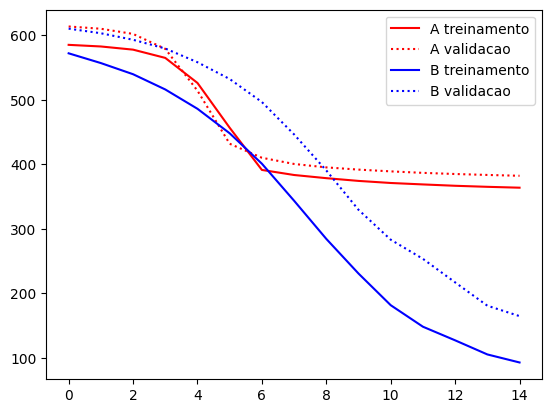

In [23]:
plt.plot(np.mean(trainA, axis=0), '-r', label="A treinamento")
plt.plot(np.mean(valA, axis=0), ':r', label="A validacao")
plt.plot(np.mean(trainB, axis=0), '-b', label="B treinamento")
plt.plot(np.mean(valB, axis=0), ':b', label="B validacao")
plt.legend()

---

### Exercício 6)

Carregue a base de dados "eurosat" do tensorflow-datasets conforme código abaixo usando 20% dos dados iniciais como treinamento e os seguintes 10% para validação.

A seguir carregue um modelo `DenseNet121` pré-treinado na ImageNet. Iremos conectar a camada de número -11 desse modelo a uma camada de Global Average Pooling para realizar extração de características da base de dados. Devem ser 32 características no total.

OBS: para isso use: `layers[-11].output`

Obtenha um array com as características extraídas (sem treinar a rede) e treine um classificador SVM utilizando essas características.

Utilize o sklearn e o classificador no seguinte formato: `SVC(C=100, kernel="linear")`

O resultado de classificação (acurácia) no conjunto de validação está em qual intervalo?

(a) 11 a 16%<br>
(b) 26 a 31%<br>
(c) 40 a 46%<br>
<font color='red'>(d) 57 a 63%<br></font>

**Justificativa**: Ver código abaixo.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from numpy.random import seed
from tensorflow.random import set_seed

import tensorflow_datasets as tfds

(train_ds, validation_ds) = tfds.load(
    "eurosat",
    split=["train[0%:20%]", "train[20%:30%]"],
    as_supervised=True,
)

def normalize_img(image, label):
  """Normalizes images: `uint8` -> `float32`."""
  return tf.cast(image, tf.float32) / 255., label

# redimensionando exemplos e normalizando entre 0-1 tipo float32
img_size = (64, 64)
train_ds = train_ds.map(lambda x, y: (tf.image.resize(x, img_size), y))
train_ds = train_ds.map(normalize_img, num_parallel_calls=tf.data.experimental.AUTOTUNE)

validation_ds = validation_ds.map(lambda x, y: (tf.image.resize(x, img_size), y))
validation_ds = validation_ds.map(normalize_img, num_parallel_calls=tf.data.experimental.AUTOTUNE)

input_shape = img_size+(3,)

batch_size = 32
train_ds = train_ds.cache().batch(batch_size).prefetch(buffer_size=10)
validation_ds = validation_ds.cache().batch(batch_size).prefetch(buffer_size=10)

# obtem rotulos no formato para uso no SVM do sklearn
train_labels = list(np.concatenate([y for x, y in train_ds], axis=0))
val_labels = list(np.concatenate([y for x, y in validation_ds], axis=0))

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/27000 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/eurosat/rgb/2.0.0.incompleteQGSJG4/eurosat-train.tfrecord*...:   0%|      …

Dataset eurosat downloaded and prepared to /root/tensorflow_datasets/eurosat/rgb/2.0.0. Subsequent calls will reuse this data.


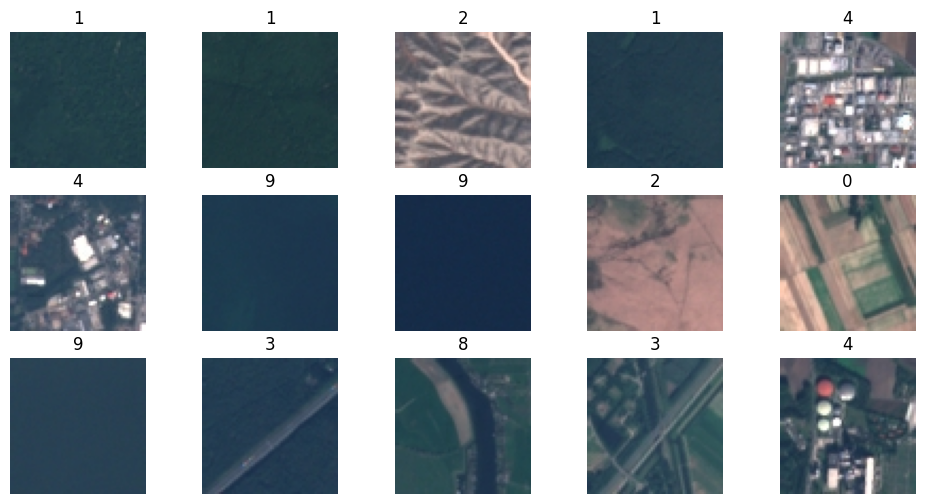

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
for i, (image, label) in enumerate(train_ds.take(15)):
    ax = plt.subplot(3, 5, i + 1)
    plt.imshow(image[i])
    plt.title(str(label[i].numpy()))
    plt.axis("off")

In [ ]:
base_model = keras.applications.DenseNet121(
    input_shape=input_shape,
    weights="imagenet",
    include_top=False,
)

# obtemos a camada de saída do modelo carregado (obtendo a camada -11)
base_output = base_model.layers[-11].output
# camada extratora
feat_layer = keras.layers.GlobalAveragePooling2D()(base_output)
# montamos um novo modelo com a entrada do pré-treinado, e saída criada acima
model_features = keras.models.Model(base_model.inputs, feat_layer)
#model_features.summary()

In [ ]:
# passando os exemplos de treinamento pela rede sem treinamento
# o "predict" vai nos dar a saída programada, obtida da GlobalAveragePooling2D
features_train = np.array(model_features.predict(train_ds))
features_val = np.array(model_features.predict(validation_ds))

print('\tDados x features obtidas treinamento: ', features_train.shape)
print('\tDados x features obtidas validacao: ', features_val.shape)

85/85 [==============================] - 1s 11ms/step
	Dados x features obtidas treinamento:  (5400, 32)
	Dados x features obtidas validacao:  (2700, 32)


In [ ]:
from sklearn.svm import SVC

svm_feat1 = SVC(C=100, kernel="linear", random_state=0)
svm_feat1.fit(features_train, train_labels)

SVC(C=100, kernel='linear', random_state=0)

In [ ]:
print('Acurácia Treinamento: %.1f%%' % (svm_feat1.score(features_train, train_labels)*100))
print('Acurácia Validacao: %.1f%%' % (svm_feat1.score(features_val, val_labels)*100))

Acurácia Treinamento: 62.8%
Acurácia Validacao: 61.7%


---

### Exercício 7)


Utilizando a biblioteca Keras, investige os hiperparâmetros relacionadas a learning rate na base de dados Boston Housing. Carregue a base de dados e normalize os atributos com z-score. Crie uma rede com camadas densas: 16, 8 e 1 (de saída), todas com ativação `relu`, função de custo `mse`, medindo também a `mae` como avaliação adicional.

Iremos investigar o uso de decaimento de learning rate, a partir de um valor inicial estabelecido. Para isso vamos usar um conjunto de validação de 20% retirado a partir do conjunto de testes, e repetir 5 vezes, cada vez utilizando uma semente, de 1 até 5, conforme código base abaixo.

Treine por 20 épocas com batchsize 24 e com o otimizador AdamW, 2 arquiteturas diferentes:

*A*. Uso dos parâmetros padrão<br>
*B*. Iniciando com learning rate 0.01 e decaimento exponencial de 0.075 a partir da época 3

Posteriormente, treine os dois modelos, porém agora com o conjunto de treinamento completo e avalie no conjunto de teste.

Considerando a média dos valores de erro (MSE e MAE) obtidos na validação arredondados para um número inteiro (ou seja, sem considerar as casas decimais), e posteriormente os mesmos erros quando treinado com o conjunto completo e avaliados no teste:

(a) B obteve menores valores de erro (MSE e MAE) do que A na validação, B também tem MAE menor do que A no teste, mas ambos foram similares no MSE do teste<br>
<font color='red'>(b) B obteve menores valores de erro (MSE e MAE) do que A na validação e no teste<br></font>
(c) A obteve valores de erro MAE menores do que B, mas valores MSE maiores do que B na validação e no teste.<br>
(d) A obteve valores de erro MAE e MSE similares com B validação e no teste<br>

**Justificativa**: Notar no código abaixo que A obteve no treinamento MSE e MAE maiores do que o modelo B, sendo que o modelo B também tem uma generalizacao ligeiramente melhor (menor diferenca entre as medidas no treinamento e validacao).

In [24]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.datasets import boston_housing
from numpy.random import seed
from tensorflow.random import set_seed
from sklearn.model_selection import train_test_split

(x_train, y_train), (x_test, y_test) = boston_housing.load_data()

mean = x_train.mean(axis=0)
std = x_train.std(axis=0)

x_train -= mean
x_train /= std

x_test -= mean
x_test /= std

def my_dnn(input_shape):
    model = keras.Sequential()
    model.add(keras.layers.Dense(16, activation="relu", input_shape=input_shape))
    model.add(keras.layers.Dense(8, activation="relu"))
    model.add(keras.layers.Dense(1, activation="relu"))
    return model

def scheduler(epoch, lr):
    if epoch >= 3:
        lr = np.round(lr * tf.math.exp(-0.075),8)
    return lr

callbacklr = keras.callbacks.LearningRateScheduler(scheduler)

In [25]:
epochs = 20

# arrays para conter os erros
mses = []
maes = []

# para cada semente
for sd in range(1,6):
    x_trains, x_val, y_trains, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state=sd)

    print("Seed", sd)
    seed(sd)
    set_seed(sd)
    modelA = my_dnn((x_trains.shape[1],))
    modelA.compile(optimizer=keras.optimizers.AdamW(), loss='mse', metrics=['mae'])
    modelA.fit(x_trains, y_trains, epochs=epochs, batch_size=24, verbose=0)

    seed(sd)
    set_seed(sd)
    modelB = my_dnn((x_trains.shape[1],))
    modelB.compile(optimizer=keras.optimizers.AdamW(0.01), loss='mse', metrics=['mae'])
    modelB.fit(x_trains, y_trains, epochs=epochs, batch_size=24, callbacks=[callbacklr], verbose=0)

    score = modelA.evaluate(x_val, y_val, verbose = 0)
    mses.append(score[0])
    maes.append(score[1])

    score = modelB.evaluate(x_val, y_val, verbose = 0)
    mses.append(score[0])
    maes.append(score[1])

# converte em array e refaz o formato para que fiquem 5 execucoes (linhas) e 2 modelos (A e B)
mses = np.array(mses)
mses = mses.reshape((5,2))

maes = np.array(maes)
maes = maes.reshape((5,2))

mean_mses = np.mean(mses, axis=0)
mean_maes = np.mean(maes, axis=0)
print('Validacao\tMSE\tMAE')
for met,mse1,mae1  in zip(['Default LR', 'Scheduling'], mean_mses, mean_maes):
       print("%s\t%.0f\t%.0f" % (met, mse1,mae1))

Seed 1
Seed 2


Seed 3


Seed 4
Seed 5
Validacao	MSE	MAE
Default LR	89	7
Scheduling	17	3


In [26]:
# avalia novamentem agora no teste!
seed(sd)
set_seed(sd)
modelA = my_dnn((x_train.shape[1],))
modelA.compile(optimizer=keras.optimizers.Adam(), loss='mse', metrics=['mae'])
modelA.fit(x_train, y_train, epochs=epochs, batch_size=32, verbose=0)

seed(sd)
set_seed(sd)
modelB = my_dnn((x_train.shape[1],))
modelB.compile(optimizer=keras.optimizers.Adam(0.01), loss='mse', metrics=['mae'])
modelB.fit(x_train, y_train, epochs=epochs, batch_size=32, callbacks=[callbacklr], verbose=0)

score = modelA.evaluate(x_test, y_test, verbose = 0)
print('Default LR', score)

score = modelB.evaluate(x_test, y_test, verbose = 0)
print('Scheduling', score)

Default LR [131.33001708984375, 9.529081344604492]
Scheduling [29.592296600341797, 3.6924495697021484]


----
### Parte 2 - Exercícios Complementares/Opcionais

---

### Exercício 8)

Vamos utilizar imagens da base de dados `cifar10` carregada do TensorFlow Datasets. Considere o código abaixo que carrega essa base de dados (utilizamos um subconjunto de treinamento e validação), e seu posterior processamento. Redimensionamos as imagens para $96\times 96$ para facilitar uso em CNNs pré-treinadas. Note também que é preciso obter codificação one-hot-encoding para as classes pois essa base de dados não é binária. Utilizaremos essa mesma base de dados nos exercícios subsequentes.

Vamos simular um cenário de poucos dados, utilizando apenas as 10% primeiras imagens da base de dados. Usando pre-fetch do tensorflow criaremos batches de 64 instâncias.

Crie uma rede neural com a seguinte arquitetura:

1. Camada de entrada para as imagens de 96 x 96 pixels
3. Modelo MobileNetV2 sem o topo (top=False) e sem carregar pesos (weight=None). Ver:
https://keras.io/api/applications/mobilenet/#mobilenetv2-function
4. GlobalAveragePooling2D
5. Dropout com 25% de probabilidade
6. Camada Densa adequada à base de dados para classificação e função de custo entropia cruzada categórica

Deixe o modelo MobileNetV2 **não treinável**.

Faça um experimento variando as sementes numpy e tensorflow 0, 1, 2 e 3, treinando e avaliando portanto 4 vezes e obtendo a média da entropia cruzada no treinamento e na validação. Cada modelo deve ser instanciado, compilado e treinado logo após a definição das sementes. Qual foi o intervalo do custo encontrado após obtidas as médias?

<font color='red'>(a) Treinamento=[0.45,0.65]; Val=[0.65,0.85]<br></font>
(b) Treinamento=[0.45,0.65]; Val=[0.65,0.85]<br>
(c) Treinamento=[0.1,0.4]; Val=[0.45,0.65]<br>
(d) Treinamento=[0.1,0.4]; Val=[0.45,0.65]<br>

**Justificativa**: Notar no código abaixo a comparação.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from numpy.random import seed
from tensorflow.random import set_seed
import tensorflow_datasets as tfds

tfds.disable_progress_bar()

(train_ds, validation_ds), info = tfds.load(
    "cifar10",
    split=["train[0%:10%]", "train[10%:20%]"],
    as_supervised=True,
    with_info=True
)

num_classes = info.features["label"].num_classes
print("Classes: ", num_classes)

def normalize_img(image, label):
  """Normalizes images: `uint8` -> `float32`."""
  return tf.cast(image, tf.float32) / 255., label

img_size = (96, 96)
train_ds = train_ds.map(lambda x, y: (tf.image.resize(x, img_size), y))
train_ds = train_ds.map(normalize_img, num_parallel_calls=tf.data.experimental.AUTOTUNE)

validation_ds = validation_ds.map(lambda x, y: (tf.image.resize(x, img_size), y))
validation_ds = validation_ds.map(normalize_img, num_parallel_calls=tf.data.experimental.AUTOTUNE)

input_shape = img_size + (3,)

Classes:  10


2021-10-24 10:24:16.002251: W tensorflow/core/kernels/data/cache_dataset_ops.cc:768] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


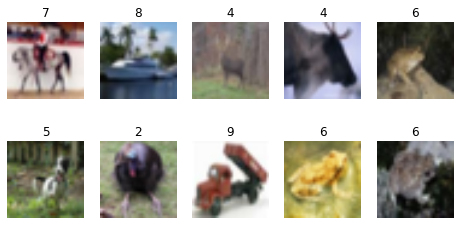

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 4))
for i, (image, label) in enumerate(train_ds.take(10)):
    ax = plt.subplot(2, 5, i + 1)
    plt.imshow(image)
    plt.title(int(label))
    plt.axis("off")

In [ ]:
def label_preprocess(image, label):
    label = tf.one_hot(label, num_classes)
    return image, label

if (num_classes > 2):
    train_ds = train_ds.map(
        label_preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE
    )
    validation_ds = validation_ds.map(
        label_preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE
    )

In [ ]:
batch_size = 64
train_ds = train_ds.cache().batch(batch_size).prefetch(buffer_size=10)
validation_ds = validation_ds.cache().batch(batch_size).prefetch(buffer_size=10)

In [ ]:
####################
data_augmentation = keras.Sequential(
    [
        layers.experimental.preprocessing.RandomFlip("horizontal"),
        layers.experimental.preprocessing.RandomContrast(0.3),
        layers.experimental.preprocessing.RandomRotation(0.2),
    ]
)

In [ ]:
def mycnn(augmentation=True, show_summary=False):
    base_model = keras.applications.MobileNetV2(
        weights="imagenet",
        include_top=False,
        input_shape=input_shape,
    )
    base_model.trainable = False

    inputs = keras.Input(shape=input_shape)
    if augmentation:
        x = data_augmentation(inputs)
        x = base_model(x, training=False)
    else:
        x = base_model(inputs, training=False)

    x = keras.layers.GlobalAveragePooling2D()(x)
    x = keras.layers.Dropout(0.25)(x)
    outputs = keras.layers.Dense(num_classes, "softmax")(x) # essa será a única camada treinável
    model = keras.Model(inputs, outputs)
    if show_summary: model.summary()
    return model

In [ ]:
epochs = 5
trainLoss = []
valLoss = []

for sd in range(4):
    seed(sd)
    set_seed(sd)

    print(sd, end=' ')
    model = mycnn(augmentation=False)
    model.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.Adam(learning_rate=0.001),
              metrics=['accuracy'])

    model.fit(train_ds, batch_size=batch_size, epochs=epochs, verbose=0)
    scoresT = model.evaluate(train_ds, verbose=0)
    scoresV = model.evaluate(validation_ds, verbose=0)
    trainLoss.append(scoresT[0])
    valLoss.append(scoresV[0])

print()

0 1 2 3 


In [ ]:
print('Loss: %.4f Val Loss: %.4f' % (np.mean(trainLoss),np.mean(valLoss)))

Loss: 0.5092 Val Loss: 0.7328


---

### Exercício 9)

Utilize a mesma base de dados, conforme carregada e pré-processada no exercício anterior.

Você deve agora criar uma camada, logo após a entrada, contendo aumento de dados:
* RandomFlip("horizontal"),
* RandomContrast(0.3),
* RandomRotation(0.2),

Qual foi o intervalo de custo médio no treinamento e validação?

(a) Treinamento=[0.7, 0.9]; Val=[0.55, 0.75]<br>
(b) Treinamento=[0.45, 0.65]; Val=[0.8, 1.0]<br>
(c) Treinamento=[0.1, 0.4]; Val=[0.55, 0.75]<br>
<font color='red'>(d) Treinamento=[0.7, 0.9]; Val=[0.8, 1.0]<br></font>

**Justificativa**: Notar no código abaixo a comparação. Veja que apesar de um custo maior os valores estão mais próximos. Seria preciso rodar por mais épocas pois temos maior diversidade nos dados.

In [ ]:
epochs = 5

trainLoss = []
valLoss = []
for sd in range(4):
    seed(sd)
    set_seed(sd)
    print(sd, end=' ')
    model = mycnn(augmentation=True)
    model.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.Adam(learning_rate=0.001),
              metrics=['accuracy'])

    model.fit(train_ds, epochs=epochs, verbose=0)
    scoresT = model.evaluate(train_ds, verbose=0)
    scoresV = model.evaluate(validation_ds, verbose=0)
    trainLoss.append(scoresT[0])
    valLoss.append(scoresV[0])

print()

0 1 2 3 


In [ ]:
print('Com aumento de dados')
print('\tLoss: %.4f Val Loss: %.4f' % (np.mean(trainLoss),np.mean(valLoss)))

Com aumento de dados
	Loss: 0.8122 Val Loss: 0.9234


---

### Exercício 10)

Similar ao exercício anterior,  agora descongele os pesos das últimas 4 camadas da MobileNet e treine por 5 épocas. *Não utilize aumento de dados*. *Não reutilize os modelos anteriores*, recarregue o modelo pré-treinado e refaça o treinamento agora permitindo que as últimas 4 camadas da MobileNet também se adaptem (além da camada de saída que foi inserida como classificadora).

Qual foi o intervalo de custo médio no treinamento e validação?

<font color='red'>(a) Treinamento=[0.05, 0.3]; Val=[0.8, 1.0]<br></font>
(b) Treinamento=[0.4, 0.7]; Val=[0.5, 0.7]<br>
(c) Treinamento=[0.4, 0.7]; Val=[0.8, 1.0]<br>
(d) Treinamento=[0.05, 0.3]; Val=[0.5, 0.7]<br>

**Justificativa**: Notar no código abaixo a comparação.

In [ ]:
def mycnn(augmentation=True, show_summary=False, trainable_top_layers=0):
    base_model = keras.applications.MobileNetV2(
        weights="imagenet",
        include_top=False,
        input_shape=input_shape,
    )
    base_model.trainable = True

    # congelando as primeiras camadas, deixando apenas as ultimas treinaveis
    for layer in base_model.layers[:-trainable_top_layers]:
        layer.trainable = False
        # congela tambem camadas de BN
        if isinstance(layer, keras.layers.BatchNormalization):
            layer._per_input_updates = {}

    inputs = keras.Input(shape=input_shape)
    if augmentation:
        x = data_augmentation(inputs)
        x = base_model(x)
    else:
        x = base_model(inputs)

    x = keras.layers.GlobalAveragePooling2D()(x)
    x = keras.layers.Dropout(0.25)(x)
    outputs = keras.layers.Dense(num_classes, "softmax")(x) # essa será a única camada treinável
    model = keras.Model(inputs, outputs)
    if show_summary: model.summary()
    return model


In [ ]:
epochs = 5

trainLoss = []
valLoss = []
for sd in range(4):
    seed(sd)
    set_seed(sd)
    print(sd, end=' ')
    model = mycnn(augmentation=False, trainable_top_layers=4)
    model.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.Adam(learning_rate=0.001),
              metrics=['accuracy'])

    model.fit(train_ds, epochs=epochs, verbose=0)

    scoresT = model.evaluate(train_ds, verbose=0)
    scoresV = model.evaluate(validation_ds, verbose=0)
    trainLoss.append(scoresT[0])
    valLoss.append(scoresV[0])

print()

0 1 2 3 


In [ ]:
print('Com ajuste fino das últimas camadas')
print('\tLoss: %.4f Val Loss: %.4f' % (np.mean(trainLoss),np.mean(valLoss)))

Com ajuste fino das últimas camadas
	Loss: 0.1544 Val Loss: 0.9376


## Módulo 4 - Treinamento de Redes Profundas
### Entendendo a função de custo entropia cruzada (cross-entropy)

A **entropia cruzada** é amplamente utilizada, mas, ao contrário da **perda quadrática**, mais conhecida e de fácil interpretação, não é tão intuitiva.

Há dois formatos básicos dessa função:

* Entropia cruzada binária: utilizada para duas classes
$$-\frac{1}{N} \sum_{i=1}^N y_i \log \hat{y}_i + (1-y_i) \log (1-\hat{y}_i)$$

* Entropia cruzada categórica: problemas multiclasse
$$-\frac{1}{N} \sum_{i=1}^N y_i \log \hat{y}_i$$


In [1]:
import numpy as np
import matplotlib.pyplot as plt

[0.     0.0526 0.1053 0.1579 0.2105 0.2632 0.3158 0.3684 0.4211 0.4737
 0.5263 0.5789 0.6316 0.6842 0.7368 0.7895 0.8421 0.8947 0.9474 1.    ]


Text(0.5, 0, 'em relaçao a 1.0')

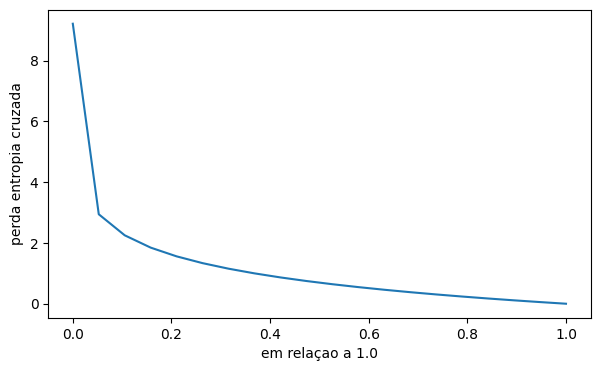

In [2]:
y = 1
y_hat = np.linspace(0,1,20)

print(np.round(y_hat,4))

loss_ec = -(y*np.log(y_hat+.0001) + (1-y)*np.log(1-y_hat +.0001))

plt.figure(figsize=(7,4))
plt.plot(y_hat, loss_ec)
plt.ylabel('perda entropia cruzada')
plt.xlabel('em relaçao a %.1f' % (y))

Vamos comparar com a perda quadrática, por ilustração

Text(0.5, 0, 'em relaçao a 1.0')

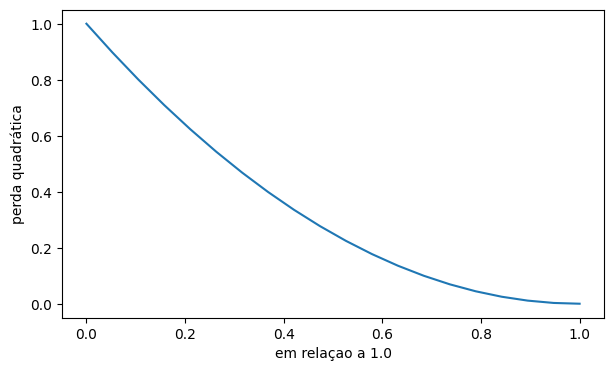

In [3]:
loss_q = np.power(y-y_hat,2)
plt.figure(figsize=(7,4))
plt.plot(y_hat, loss_q)
plt.ylabel('perda quadrática')
plt.xlabel('em relaçao a %.1f' % (y))

Vamos estudar um exemplo em 1D

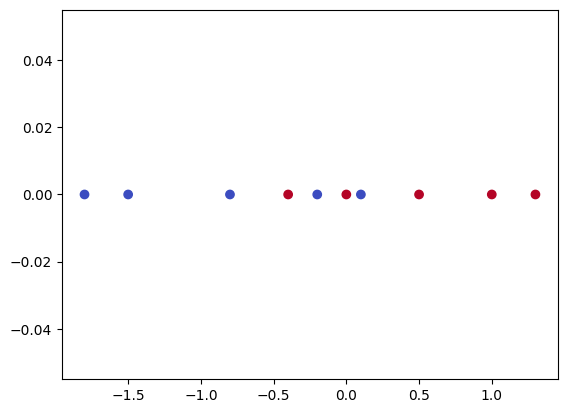

In [4]:
x = np.array([-1.8,-1.5,-0.8,-0.4,-0.2, 0.0, 0.1, 0.5, 1.0, 1.3])
y = np.array([ 0.0, 0.0, 0.0, 1.0, 0.0, 1.0, 0.0,  1.0, 1.0, 1.0])

plt.scatter(x,np.zeros(10), c=y,cmap=plt.cm.coolwarm)

Treinando um classificador para diferenciar as duas classes (0 e 1)

In [5]:
from sklearn.linear_model import LogisticRegression

logr = LogisticRegression(solver='lbfgs')
logr.fit(x.reshape(-1, 1), y)

# vamos pegar as probabilidades de cada elemento pertencer a classe 1
y_hat = logr.predict_proba(x.reshape(-1, 1))[:, 1].ravel()

# para obter as classes, fazemos uma limiarizacao das probabilidades
y_clas = y_hat.copy()
y_clas[y_clas>=0.5] = 1
y_clas[y_clas<0.5] = 0
print('classes       = {}'.format(np.round(y_clas, 3)))
print('p(y)          = {}'.format(np.round(y_hat, 3)))


classes       = [0. 0. 0. 0. 0. 1. 1. 1. 1. 1.]
p(y)          = [0.133 0.178 0.325 0.433 0.49  0.547 0.576 0.682 0.792 0.843]


In [6]:
celoss_ind = -(y*np.log(y_hat+.00001) + (1-y)*np.log(1-y_hat +.00001))
print('p(y)          = {}'.format(np.round(y_hat, 3)))
print('Por instancia = {}'.format(np.round(celoss_ind,3)))

print('Cross Entropy (média) = %.3f' % (np.mean(celoss_ind)))

p(y)          = [0.133 0.178 0.325 0.433 0.49  0.547 0.576 0.682 0.792 0.843]
Por instancia = [0.142 0.195 0.394 0.837 0.674 0.603 0.857 0.382 0.233 0.17 ]
Cross Entropy (média) = 0.449


---
Adicionando uma nova classe ao problema, note que a função:
$$-\frac{1}{N} \sum_{i=1}^N y_i \log \hat{y}_i + (1-y_i) \log (1-\hat{y}_i)$$
não seria mais possível calcular como antes.

Assim, adotamos a entropia cruzada categórica, somando as divergências para cada classe
$$-\frac{1}{N} \sum_{i=1}^N y_i \log \hat{y}_i$$

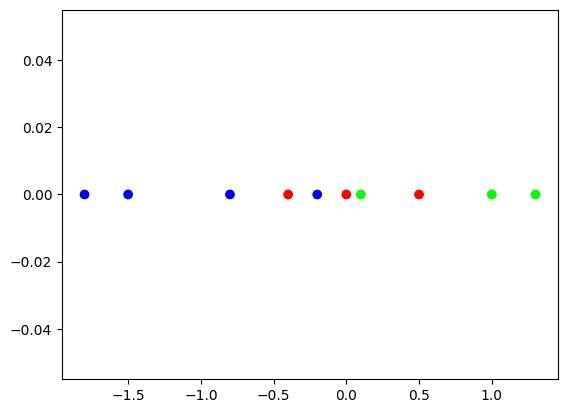

In [7]:
x2 = np.array([-1.8,-1.5,-0.8,-0.4,-0.2, 0.0, 0.1, 0.5, 1.0, 1.3])
y2 = np.array([ 0.0, 0.0, 0.0, 1.0, 0.0, 1.0, 2.0,  1.0, 2.0, 2.0])
plt.scatter(x2,np.zeros(10), c=y2,cmap=plt.cm.brg)

In [8]:
logr = LogisticRegression(solver='lbfgs')
logr.fit(x2.reshape(-1, 1), y2)

# agora as probabilidades são para 3 classes
# então uma única probabilidade não é suficiente para obter a resposta
y2_hat = logr.predict_proba(x2.reshape(-1, 1))
print(np.round(y2_hat,4))

[[0.856  0.1229 0.0211]
 [0.7999 0.1636 0.0364]
 [0.6033 0.2821 0.1146]
 [0.4587 0.3441 0.1971]
 [0.3851 0.3659 0.2489]
 [0.3149 0.379  0.3061]
 [0.282  0.3819 0.3362]
 [0.1704 0.3701 0.4595]
 [0.0806 0.3162 0.6032]
 [0.0491 0.2742 0.6768]]


Como os rótulos estão em formato discreto, vamos obter one-hot-encodings para computar o custo

In [9]:
from tensorflow import keras
y2_onehot = keras.utils.to_categorical(y2, 3)

print('y one-hot-enc.= \n', np.round(y2_onehot, 3))
print('p(y)          = \n', np.round(y2_hat, 3))

celoss_ind2 = -(y2_onehot*np.log(y2_hat+.0001))
print('Por instancia = \n', np.round(celoss_ind2,3))

print('Cross Entropy (média) = %.3f' % (np.mean(celoss_ind2[:])))

ModuleNotFoundError: No module named 'tensorflow'

## *Módulo 4 - Treinamento de Redes Profundas*
### Taxa de aprendizado

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow import keras

# 1. Preparando Dataset

In [3]:
# Carregando dataset a partir de TensorFlow Datasets
(ds_train, ds_test), ds_info = tfds.load('cifar10', split=['train[:12%]', 'test[:20%]'], 
                                         as_supervised=True, with_info=True)
num_classes = ds_info.features['label'].num_classes

In [4]:
# Get the image resolution
input_shape = ds_info.features['image'].shape

# Get the size of each set
num_train_examples = tf.data.experimental.cardinality(ds_train).numpy()
num_test_examples = tf.data.experimental.cardinality(ds_test).numpy()

# Get the number of classes
num_classes = ds_info.features['label'].num_classes

# Print the obtained information
print(f"Resolução: {input_shape}")
print(f"Training Set: {num_train_examples} exemplos")
print(f"Testing Set: {num_test_examples} exemplos")
print(f"Classes: {num_classes}")

Resolução: (32, 32, 3)
Training Set: 6000 exemplos
Testing Set: 2000 exemplos
Classes: 10


Temos portando 60 mil exemplos de treinamento

Imagens de tamanho $28\times 28$ e 10 classes.

Agora, o passo ideal é pré-processar as imagens para facilitar o processo de otimização das redes neurais:

1. Normalizar seus valores (para o intervalo 0-1)
2. Alterar a codificação das classes (para one-hot-encoding): teremos 10 neurônios na saída, não apenas 1

2023-10-08 17:38:56.727355: W tensorflow/core/kernels/data/cache_dataset_ops.cc:854] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


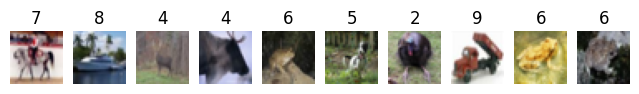

In [5]:
def show_images(images, labels):
    fig, axes = plt.subplots(1, len(images), figsize=(8, 3))
    for i, (image, label) in enumerate(zip(images, labels)):
        axes[i].imshow(image, cmap='gray')
        axes[i].axis('off')
        axes[i].set_title(f"{label}")
    plt.show()

# extrai primeiras 10 imagens para exibir
list_images = []
list_labels = []
for example in ds_train.take(10):
    image = example[0].numpy()
    label = example[1].numpy()
    list_images.append(image)
    list_labels.append(label)
    
show_images(list_images, list_labels)

In [6]:
def one_hot_label(image, label):
    label = tf.one_hot(label, num_classes)
    return image, label
    
# Pre-processa imagens
def preprocess_image(image, label):
    # converte imagem para float32
    image = tf.image.convert_image_dtype(image, tf.float32)
    return image, label

ds_train = ds_train.map(preprocess_image)
ds_test = ds_test.map(preprocess_image)

ds_train = ds_train.map(one_hot_label)
ds_test = ds_test.map(one_hot_label)

# 2. Definindo Rede Neural


In [34]:
def XceptionCNN(input_shape, num_classes, n_filters=32, blocks=3):
    
    input_tensor = keras.layers.Input(shape=input_shape)
    x = input_tensor

    #x = keras.layers.Conv2D(n_filters, kernel_size=3, strides=1, activation='relu', padding='same')(x)
    
    # Blocos separaveis em profundidade + MaxPooling
    x = keras.layers.DepthwiseConv2D(kernel_size=3, strides=1, padding='same')(x)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Activation('relu')(x)
    x = keras.layers.MaxPooling2D(pool_size=(2,2), strides=(2,2))(x)
    
    x = keras.layers.DepthwiseConv2D(kernel_size=3, strides=1, padding='same')(x)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Activation('relu')(x)
    x = keras.layers.MaxPooling2D(pool_size=(2,2), strides=(2,2))(x)
    
    # Achatar a saída do bloco residual
    x = keras.layers.Flatten()(x)
    
    # Camada densa/fully connected
    x = keras.layers.Dense(128, activation='relu')(x)
    x = keras.layers.Dropout(0.325)(x)
    
    output_tensor = keras.layers.Dense(num_classes, activation='softmax')(x)  
    
    # Cria o modelo com base na entrada e saída
    model = keras.Model(inputs=input_tensor, outputs=output_tensor)

    return model


Definindo sementes e um subconjunto menor para testarmos


In [8]:
epochs = 16
batch_size = 32

ds_train = ds_train.batch(batch_size)
ds_test = ds_test.batch(batch_size)

# 3. Explorando Diferentes Estratégias para o Learning Rate

## 3.1 - Learning Rate Fixo

In [42]:
CNN1 = XceptionCNN(input_shape, 10)
CNN1.summary()
CNN1.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.Adam(learning_rate=0.0001),
              metrics=['accuracy'])

Model: "model_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_15 (InputLayer)       [(None, 32, 32, 3)]       0         
                                                                 
 depthwise_conv2d_28 (Depth  (None, 32, 32, 3)         30        
 wiseConv2D)                                                     
                                                                 
 batch_normalization_28 (Ba  (None, 32, 32, 3)         12        
 tchNormalization)                                               
                                                                 
 activation_28 (Activation)  (None, 32, 32, 3)         0         
                                                                 
 max_pooling2d_28 (MaxPooli  (None, 16, 16, 3)         0         
 ng2D)                                                           
                                                          

In [43]:
hist1 = CNN1.fit(ds_train,
                 batch_size=batch_size,
                 epochs=epochs, validation_data=(ds_test))

Epoch 1/16
188/188 [==============================] - 7s 29ms/step - loss: 2.6806 - accuracy: 0.1115 - val_loss: 2.3075 - val_accuracy: 0.0965
Epoch 2/16
188/188 [==============================] - 5s 26ms/step - loss: 2.3494 - accuracy: 0.1613 - val_loss: 2.2634 - val_accuracy: 0.1470
Epoch 3/16
188/188 [==============================] - 5s 25ms/step - loss: 2.2162 - accuracy: 0.2002 - val_loss: 2.1395 - val_accuracy: 0.2340
Epoch 4/16
188/188 [==============================] - 5s 25ms/step - loss: 2.1368 - accuracy: 0.2278 - val_loss: 2.0783 - val_accuracy: 0.2600
Epoch 5/16
188/188 [==============================] - 5s 28ms/step - loss: 2.0757 - accuracy: 0.2627 - val_loss: 2.0253 - val_accuracy: 0.2830
Epoch 6/16
188/188 [==============================] - 5s 26ms/step - loss: 2.0192 - accuracy: 0.2715 - val_loss: 1.9841 - val_accuracy: 0.2975
Epoch 7/16
188/188 [==============================] - 5s 27ms/step - loss: 1.9769 - accuracy: 0.2968 - val_loss: 1.9553 - val_accuracy: 0.3155

## 3.2 - Learning Rate Alto 
- **(muito alto)**

In [44]:
print("Modelo 2 - Learning Rate Alto (Adam)")
CNN2 = XceptionCNN(input_shape, 10)
CNN2.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.Adam(learning_rate=0.09),
              metrics=['accuracy'])

hist2 = CNN2.fit(ds_train,
                 batch_size=batch_size,
                 epochs=epochs, validation_data=(ds_test))

Modelo 2 - Learning Rate Alto (Adam)
Epoch 1/16
188/188 [==============================] - 7s 27ms/step - loss: 2.5831 - accuracy: 0.1048 - val_loss: 2.3101 - val_accuracy: 0.1025
Epoch 2/16
188/188 [==============================] - 5s 25ms/step - loss: 2.3137 - accuracy: 0.1013 - val_loss: 2.3105 - val_accuracy: 0.1025
Epoch 3/16
188/188 [==============================] - 5s 25ms/step - loss: 2.3139 - accuracy: 0.1020 - val_loss: 2.3108 - val_accuracy: 0.1025
Epoch 4/16
188/188 [==============================] - 5s 26ms/step - loss: 2.3140 - accuracy: 0.1020 - val_loss: 2.3111 - val_accuracy: 0.1025
Epoch 5/16
188/188 [==============================] - 5s 26ms/step - loss: 2.3141 - accuracy: 0.1020 - val_loss: 2.3112 - val_accuracy: 0.1025
Epoch 6/16
188/188 [==============================] - 5s 27ms/step - loss: 2.3141 - accuracy: 0.1020 - val_loss: 2.3113 - val_accuracy: 0.1025
Epoch 7/16
188/188 [==============================] - 5s 25ms/step - loss: 2.3141 - accuracy: 0.1020 - va

## 3.2 - SGD + Momentum com peso 0.9


In [45]:
print("Modelo 3- Momentum")
CNN3 = XceptionCNN(input_shape, 10)
CNN3.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.SGD(learning_rate=0.005, momentum=0.95),
              metrics=['accuracy'])

hist3 = CNN3.fit(ds_train,
                 batch_size=batch_size,
                 epochs=epochs, validation_data=(ds_test))

Modelo 3- Momentum
Epoch 1/16
188/188 [==============================] - 6s 27ms/step - loss: 2.1598 - accuracy: 0.2215 - val_loss: 2.0331 - val_accuracy: 0.2850
Epoch 2/16
188/188 [==============================] - 5s 27ms/step - loss: 1.9048 - accuracy: 0.3102 - val_loss: 1.8176 - val_accuracy: 0.3470
Epoch 3/16
188/188 [==============================] - 5s 26ms/step - loss: 1.8008 - accuracy: 0.3553 - val_loss: 1.7466 - val_accuracy: 0.3620
Epoch 4/16
188/188 [==============================] - 5s 26ms/step - loss: 1.7346 - accuracy: 0.3733 - val_loss: 1.6851 - val_accuracy: 0.3915
Epoch 5/16
188/188 [==============================] - 5s 26ms/step - loss: 1.6840 - accuracy: 0.3892 - val_loss: 1.7836 - val_accuracy: 0.3545
Epoch 6/16
188/188 [==============================] - 5s 26ms/step - loss: 1.6455 - accuracy: 0.4058 - val_loss: 1.7370 - val_accuracy: 0.3645
Epoch 7/16
188/188 [==============================] - 5s 26ms/step - loss: 1.6037 - accuracy: 0.4262 - val_loss: 1.6472 - v

## 3.3 - Decaimento de Learning Rate
- com learning Rate inicial um pouco mais alto

In [46]:
print("Modelo 4 - Decaimento de Learning Rate ")
CNN4 = XceptionCNN(input_shape, 10)
CNN4.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.Adam(learning_rate=0.002),
              metrics=['accuracy'])


print("Taxa inicial = ", round(CNN4.optimizer.lr.numpy(), 4))

Modelo 4 - Decaimento de Learning Rate 
Taxa inicial =  0.002


Criando uma função "callback" para definir uma modificação no learning rate ao longo das épocas

In [47]:
def scheduler(epoch, lr):
  #print("Learning rate atual = ", lr)
  if epoch < 2:
    return lr
  else:
    return np.round(lr * tf.math.exp(-0.1), 6)

callbacklr = tf.keras.callbacks.LearningRateScheduler(scheduler)

hist4 = CNN4.fit(ds_train,
                 batch_size=batch_size, epochs=epochs, 
                 callbacks=[callbacklr],
                 validation_data=(ds_test))


Epoch 1/16
188/188 [==============================] - 7s 27ms/step - loss: 2.0835 - accuracy: 0.2352 - val_loss: 2.1174 - val_accuracy: 0.2090 - lr: 0.0020
Epoch 2/16
188/188 [==============================] - 5s 26ms/step - loss: 1.8632 - accuracy: 0.3082 - val_loss: 1.9776 - val_accuracy: 0.2685 - lr: 0.0020
Epoch 3/16
188/188 [==============================] - 5s 28ms/step - loss: 1.7697 - accuracy: 0.3605 - val_loss: 1.7392 - val_accuracy: 0.3625 - lr: 0.0018
Epoch 4/16
188/188 [==============================] - 5s 26ms/step - loss: 1.7072 - accuracy: 0.3782 - val_loss: 1.6782 - val_accuracy: 0.3905 - lr: 0.0016
Epoch 5/16
188/188 [==============================] - 5s 26ms/step - loss: 1.6697 - accuracy: 0.3892 - val_loss: 1.6710 - val_accuracy: 0.3825 - lr: 0.0015
Epoch 6/16
188/188 [==============================] - 5s 26ms/step - loss: 1.6176 - accuracy: 0.4177 - val_loss: 1.6588 - val_accuracy: 0.3915 - lr: 0.0013
Epoch 7/16
188/188 [==============================] - 5s 27ms/st

In [48]:
print("Modelo 5 - Decaimento de Learning Rate + AdamW")
CNN5 = XceptionCNN(input_shape, 10)
CNN5.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.AdamW(learning_rate=0.002),
              metrics=['accuracy'])

callbacklr = tf.keras.callbacks.LearningRateScheduler(scheduler)

hist5 = CNN5.fit(ds_train,
                 batch_size=batch_size, epochs=epochs, 
                 callbacks=[callbacklr],
                 validation_data=(ds_test))

Modelo 5 - Decaimento de Learning Rate + AdamW
Epoch 1/16
188/188 [==============================] - 7s 29ms/step - loss: 2.1631 - accuracy: 0.2218 - val_loss: 2.2652 - val_accuracy: 0.1515 - lr: 0.0020
Epoch 2/16
188/188 [==============================] - 5s 28ms/step - loss: 1.9461 - accuracy: 0.3022 - val_loss: 1.9179 - val_accuracy: 0.3365 - lr: 0.0020
Epoch 3/16
188/188 [==============================] - 6s 30ms/step - loss: 1.8087 - accuracy: 0.3563 - val_loss: 1.7408 - val_accuracy: 0.3885 - lr: 0.0018
Epoch 4/16
188/188 [==============================] - 6s 30ms/step - loss: 1.7280 - accuracy: 0.3790 - val_loss: 1.6957 - val_accuracy: 0.4025 - lr: 0.0016
Epoch 5/16
188/188 [==============================] - 5s 28ms/step - loss: 1.6563 - accuracy: 0.4158 - val_loss: 1.6630 - val_accuracy: 0.4055 - lr: 0.0015
Epoch 6/16
188/188 [==============================] - 5s 26ms/step - loss: 1.6063 - accuracy: 0.4282 - val_loss: 1.6443 - val_accuracy: 0.4210 - lr: 0.0013
Epoch 7/16
188/18

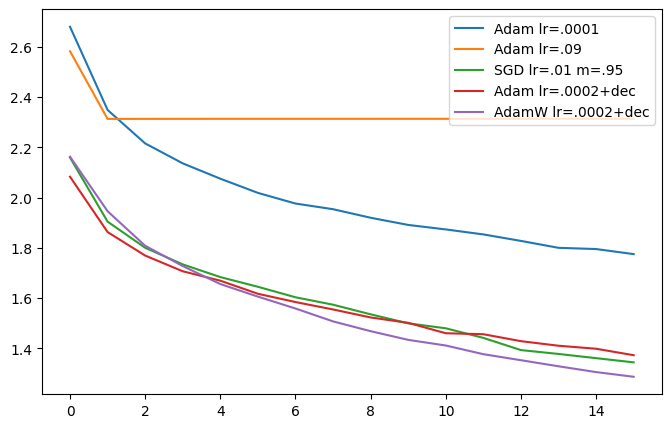

In [49]:
plt.figure(figsize=(8,5))
plt.plot(hist1.history['loss'])
plt.plot(hist2.history['loss'])
plt.plot(hist3.history['loss'])
plt.plot(hist4.history['loss'])
plt.plot(hist5.history['loss'])
plt.legend(["Adam lr=.0001", "Adam lr=.09", "SGD lr=.01 m=.95","Adam lr=.0002+dec","AdamW lr=.0002+dec"], loc="upper right")

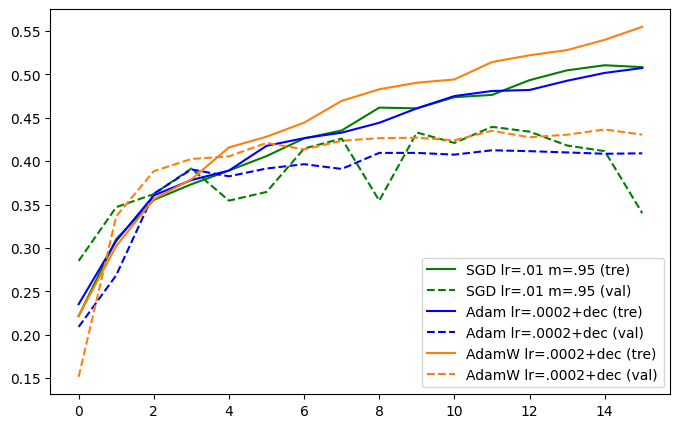

In [57]:
plt.figure(figsize=(8,5))
plt.plot(hist3.history['accuracy'], 'g')
plt.plot(hist3.history['val_accuracy'], 'g--')
plt.plot(hist4.history['accuracy'], 'b')
plt.plot(hist4.history['val_accuracy'], 'b--')
plt.plot(hist5.history['accuracy'], color='tab:orange')
plt.plot(hist5.history['val_accuracy'], color='tab:orange', linestyle='--')
plt.legend(["SGD lr=.01 m=.95 (tre)","SGD lr=.01 m=.95 (val)","Adam lr=.0002+dec (tre)","Adam lr=.0002+dec (val)","AdamW lr=.0002+dec (tre)","AdamW lr=.0002+dec (val)"], loc="lower right")

## <span style="color:darkred">Módulo 5 - Redes neurais para dados sequenciais</span>
### <span style="color:darkred">Avaliação (com soluções)</span>

---

### Questão 1)

Considere as seguintes características de instâncias de um conjunto de treinamento:<br>

I - Podem ser observadas/analisadas em qualquer ordem, inclusive aleatória, e manter a coerência da sua interpretação<br>
II - Podem possuir ruído ou um componente estocástico<br>
III - Considerando que são do tipo numérico, seus valores originais estão sempre no intervalo entre 0 e 1<br>
IV - Comumente uma instância está correlacionada com a próxima instância, em uma determinada ordem<br>
V - Dados do tipo string em formato texto livre<br>

Quais características estão relacionadas a dados sequenciais, utilizados tipicamente em redes neurais recorrentes e suas variantes?


(a) I, II<br>
(b) I, II, IV<br>
(c) II, III<br>
(d) II, IV<br>
<font color='red'>(e) II, IV, V<br></font>

**Justificativa**: dados sequenciais usados em redes recorrentes possuem uma sequência que deve ser observada para que os dados possam ser interpretados, como uma sequência de dados organizados no tempo, ou uma sequência de texto ordenada, dessa forma, I é inválida, enquanto que IV é válida. Esses dados podem possuir ruído e continuar sendo sequenciais, portanto II é válida. Os seus valores originais não estão concentrados sempre entre 0 e 1, apesar de poderem ser normalizados para esse intervalo ou outros como entre -1 e 1. Finalmente, textos também são dados sequenciais, e são do tipo string validando a V.

---

### Questão 2)

Qual o mecanismo que unidades recorrentes do tipo RNN clássica e GRU usam para considerar a sequência dos dados durante o aprendizado dos parâmetros do modelo?

(a) Gerar como saída o escalar referente ao produto interno entre as features da entrada anterior $t-1$ com a entrada atual $t$<br>
<font color='red'>(b) Utilizar a saída do neurônio na entrada atual $s$ e utilizá-la em conjunto com a entrada da próxima observação $s+1$ para gerar a saída do neurônio relativa a essa última observação</font><br>
(c) A saída de cada neurônio recorrente é combinada com a de outros neurônios na mesma camada, formando uma memória paralela da camada<br>
(d) Realizar a combinação linear entre as features da entrada por meio de uma matriz de pesos $W$, um parâmetro bias $b$ e utilizando uma função de ativação para gerar a saída<br>
(e) Possuir um estado de célula $C_t$ que é responsável por manter ou eliminar partes dos sumários anteriores e gerar a nova saída<br>

 **Justificativa**: a alternativa (b) indica o mecanismo correto de sumário ou memória da unidade recorrente que utiliza a saída de um neurônio em conjunto com a entrada seguinte. As alternativas incorretas são (a) pois não é realizado um produto interno entre duas entradas subsequentes, (c) pois os neurônios de cada camada, em paralelo, não usam as saídas dos outros neurônios como entrada, nem mesmo é formada uma memória combinada da camada, (d) descreve uma camada densa convencional, (e) indica a memória/sumário extra da LSTM, e não das unidades RNN ou GRU.

### Questão 3)

Quais das alternativas descreve a saída de uma camada de atenção para uma entrada com um conjunto de valores de dados sequenciais?

(a) Define quais valores, ao longo de uma sequência de dados em diferentes iterações, serão processados, e quais serão ignorados, para produzir cada saída da camada de atenção, similar a uma camada de "dropout".<br>
(b) Um vetor contendo scores entre 0 e 1 para ponderar os valores da entrada.<br>
(c) Um vetor memória acumulado ao longo das iterações de forma que um histórico de todos dados anteriores influencia na saída atual.<br>
<font color='red'>(d) Uma representação vetorial contextual, a qual é ponderada de acordo com a importância relativa, aprendida pela camada, entre os valores da entrada.<br></font>
(e) A similaridade entre cada par de valores da entrada.<br>

**Justificativa:** O mecanismo de atenção, captura relações entre os valores de entrada de forma a entender o contexto em que estão relacionados e gera como saída uma representação contextual que está ponderada pela importância relativa entre os dados de entrada a qual é aprendida por meio de uma função softmax - estando correta a alternativa (d).

As alternativas incorretas são (a) o mecanismo não define entradas a serem usadas ou ignoradas ao longo de iterações pois não possui memória, (b) apesar de aprender scores por meio de uma função softmax, essa não é a saída da camada, (c) a memória aprendida ao longo de iterações define a saída de camadas recorrentes, (e) a similaridade entre cada par de valores de entrada é calculada pela camada de atenção, sobre a qual é aplicada a função softmax, mas essa não é a saída da camada.

---
### Questão 4)

Considere os seguintes casos de entrada e saída no contexto de redes neurais que processam dados sequenciais:

I - Entrada: texto livre de até 1000 caracteres contendo a reclamação de um cliente sobre um determinado, Saída: categoria do produto reclamado entre 1000 categorias possíveis<br>
II - Entrada: um espectrograma (imagem formada a partir de um áudio) representando uma frase proferida por uma pessoa. Saída: transcrição, palavra por palavra, da frase proferida<br>
III - Entrada: uma série temporal contendo valores numéricos do instante T1 até um instante TN. Saída: uma série temporal contendo a predição futura para os mesmos valores relativa aos instantes TN+1 até TN+10.<br>
IV - Entrada: frase no idioma Inglês. Saída: frase traduzida para o idioma Português<br>

Quais dos casos acima representam o cenário implementado por meio de Sequence-to-Sequence?

 (a) I, III<br>
 (b) II, III, IV<br>
 <font color='red'>(c) III, IV<br></font>
 (d) IV<br>
 (e) todos os casos<br>

  **Justificativa**: I - possui como saída uma única categoria e não uma sequência; II - possui como entrada um único objeto (imagem espectrograma), não sendo uma sequência; III - entrada e saída são dados sequenciais, organizados temporalmente; IV - entrada e saída são dados sequenciais textuais.

---

### Questão 5)

Execute um experimento para predição de valores futuros de uma série temporal. Use o código fornecido no notebook e complete para obter o resultado necessário.

A arquitetura a usar possui:    
- Camada LSTM com 20 neuronios, retornando sequencias, ativação relu
- Camada LSTM com 20 neuronios, sem retornar sequencias, ativação relu
- Camada Dropout 0.2
- Camada Densa de saída para predição univariada do próximo valor da série, ativação relu.

Treinar com batch_size=1, por 10 épocas, usando Adam e learning_rate fixo = 0.00025.

Vamos explorar o treinamento com dados usando 3 time steps diferentes [1, 3, 6]. Para cada time step, gere os conjuntos de treinamento e validação correspondentes, e execute 10 treinamentos com as mesmas configurações e a use como semente 42. Veja código inicial, e complemente com os passos necessários.

Compute o mean squared error (MSE) para cada execução no conjunto de validação. Depois, excluindo o maior e o menor valor de MSE das 10 execuções, calcule e armazene a média e desvio padrão do MSE ao longo das diferentes seeds para cada configuração de time steps. Ou seja, a média e desvio serão calculados sobre 8 valores.

OBS: devido às várias repetições o experimento completo pode demorar até 10 minutos.

Considerando 3 casas decimais, qual(is) configuração de time steps gerou a menor média, e a maior média, respectivamente? Caso haja empate use o desvio padrão para desempatar (configuração com menor desvio padrão para desempatar a menor média, e com maior desvio padrão para desempatar maior média).

(a) Menor média = 1, Maior média = 6<br>
(b) Menor média = 3, Maior média = 1<br>
(c) Menor média = 3, Maior média = 6<br>
<font color='red'>(d) Menor média = 6, Maior média = 1<br></font>
(e) Menor média = 6, Maior média = 3<br>

 **Justificativa**: Ver código abaixo.

In [ ]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import tensorflow as tf

from numpy.random import seed
from tensorflow.random import set_seed
from tensorflow.keras import layers, models, optimizers

from sklearn.metrics import mean_squared_error
from math import sqrt

import seaborn as sns
import warnings

warnings.filterwarnings('ignore')
sns.set()

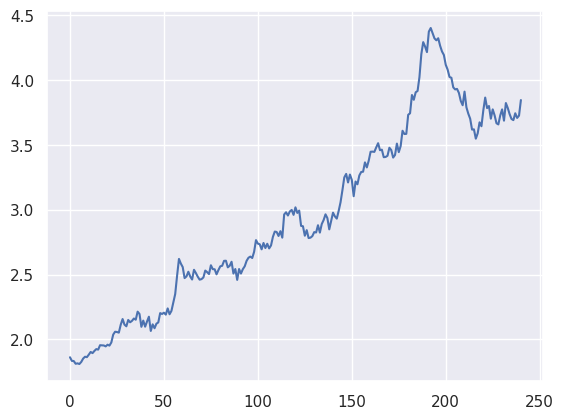

In [ ]:
df = pd.read_csv("price_of_ground_chuck.csv")

# pega segunda coluna do dataframe
var = df.columns.values[1]
series = np.array(df[var])
plt.plot(series)

In [ ]:
# variaveis que definem divisao em treinamento e teste e controlam adição de ruído
porc_treinamento = 60
porc_validacao = 15

# calcula tamanhos dos dados de treinamento (n_train) e teste (n_test)
n_train = int(len(series)*(porc_treinamento/100.0))
n_val = int(len(series)*(porc_validacao/100.0))
n_test = len(series)-(n_train+n_val)

train_x = series[:n_train]
val_x = series[n_train-1:n_train+n_val]
test_x = series[n_train+n_val-1:]

# normalização min-max com base no treinamento
vmax = train_x.max()
vmin = train_x.min()

train_x_norm = (train_x - vmin)/(vmax - vmin)
val_x_norm = (val_x - vmin)/(vmax - vmin)
test_x_norm = (test_x - vmin)/(vmax - vmin)

print("Exemplos de Treinamento: ", n_train)
print("Exemplos de Validacao: ", n_val)
print("Exemplos de Teste: ", n_test)

Exemplos de Treinamento:  144
Exemplos de Validacao:  36
Exemplos de Teste:  61


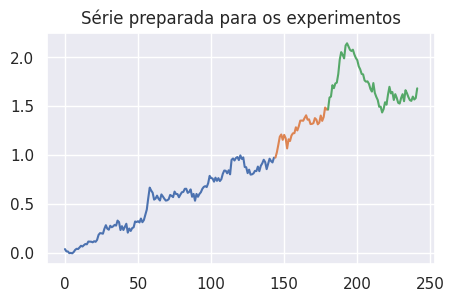

In [ ]:
fig = plt.figure(figsize=(5,3))
plt.plot(np.arange(0, n_train), train_x_norm)
plt.plot(np.arange(n_train, n_train+n_val+1), val_x_norm)
plt.plot(np.arange(n_train+n_val,n_train+n_val+n_test+1), test_x_norm)
ax = plt.title('Série preparada para os experimentos')

In [ ]:
# formato deve ser [samples, time steps, features]
def recurrent_array(train_x, time_steps=1):

    array = np.array(np.reshape(train_x, (-1, 1)), copy=True)

    train_y_ts = array[time_steps:]
    train_x_ts = []
    for i in range(0, len(array) - time_steps):
        train_x_ts.append(array[i:i+time_steps])

    train_x_ts = np.array(train_x_ts)

    #rec_array = np.reshape(array, (array.shape[0], time_steps, array.shape[1]))
    return train_x_ts, train_y_ts

In [ ]:
def model_LSTM(time_steps):
    modelLSTM = models.Sequential()
    modelLSTM.add(layers.LSTM(20, return_sequences=True, activation='relu', input_shape=(time_steps,1)))
    modelLSTM.add(layers.LSTM(20, activation='relu'))
    modelLSTM.add(layers.Dropout(0.2))
    modelLSTM.add(layers.Dense(1, activation='relu'))
    return modelLSTM

In [ ]:
batch_size = 1
epochs = 10
learning_rate = 0.00025

n_exp = 10
time_steps_expr = [1, 3, 6]

ts_models_mse_mu = dict({(ts,0) for ts in time_steps_expr})
ts_models_mse_sd = dict({(ts,0) for ts in time_steps_expr})
print(50*'=')

for time_steps in time_steps_expr:

    print(f'Time step = {time_steps}:')

    train_x_rec, train_y_rec = recurrent_array(train_x_norm, time_steps=time_steps)
    val_x_rec, val_y_rec = recurrent_array(val_x_norm, time_steps=time_steps)

    models_mse = []

    for i in range(n_exp):
        seed(42)
        set_seed(42)

        model = model_LSTM(time_steps)
        model.compile(loss='mean_squared_error',
                        optimizer=optimizers.Adam(learning_rate=learning_rate))

        hist = model.fit(train_x_rec, train_y_rec, epochs=epochs,
                        batch_size=batch_size,
                        verbose=0, shuffle=False)

        pred_v = model.predict(val_x_rec, verbose=0, batch_size=1).reshape(-1)
        mse_v = mean_squared_error(val_y_rec, pred_v)

        print(f"\texp {i}, mse = {mse_v:.4f}")
        models_mse.append(mse_v)

    ts_models_mse_mu[time_steps] = np.mean(sorted(models_mse)[1:-1])
    ts_models_mse_sd[time_steps] = np.std(sorted(models_mse)[1:-1])
    print(50*'-')



Time step = 1:
	exp 0, mse = 0.0107
	exp 1, mse = 0.0513
	exp 2, mse = 0.0739
	exp 3, mse = 0.0248
	exp 4, mse = 0.0390
	exp 5, mse = 0.0150
	exp 6, mse = 0.0422
	exp 7, mse = 0.0497
	exp 8, mse = 0.0110
	exp 9, mse = 0.0312
--------------------------------------------------
Time step = 3:
	exp 0, mse = 0.0045
	exp 1, mse = 0.0055
	exp 2, mse = 0.0183
	exp 3, mse = 0.0233
	exp 4, mse = 0.0080
	exp 5, mse = 0.0488
	exp 6, mse = 0.0069
	exp 7, mse = 0.0269
	exp 8, mse = 0.0035
	exp 9, mse = 0.0090
--------------------------------------------------
Time step = 6:
	exp 0, mse = 0.0073
	exp 1, mse = 0.0100
	exp 2, mse = 0.0118
	exp 3, mse = 0.0057
	exp 4, mse = 0.0077
	exp 5, mse = 0.0085
	exp 6, mse = 0.0265
	exp 7, mse = 0.0077
	exp 8, mse = 0.0083
	exp 9, mse = 0.0052
--------------------------------------------------


In [ ]:
print(50*'=')
print('MSE  em validação')
for ts in sorted(ts_models_mse_mu.keys()):
    print(f'Time Step {ts}, media = {ts_models_mse_mu[ts]:.3f} +- {ts_models_mse_sd[ts]:.3f}')
print(50*'=')

MSE  em validação
Time Step 1, media = 0.033 +- 0.014
Time Step 3, media = 0.013 +- 0.008
Time Step 6, media = 0.008 +- 0.002


## Módulo 5 - Redes neurais para dados sequenciais</span>
### <span style="color:darkred">**LSTMs e GRUs** para predição de séries temporais</span>

In [1]:
import numpy as np
from pandas import read_csv

import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras

from numpy.random import seed
from tensorflow.random import set_seed

from sklearn.metrics import mean_squared_error
from math import sqrt

# outros
df = read_csv('Alcohol_Sales.csv')
#df = read_csv('data/Miles_Traveled.csv')
#df = read_csv('data/starbucks.csv')
#df = read_csv('data/passengers.csv')
#df = read_csv('data/price_of_ground_chuck.csv')

# pega segunda coluna do dataframe
var = df.columns.values[1]

Série:  S4248SM144NCEN
Tamanho da série:  325


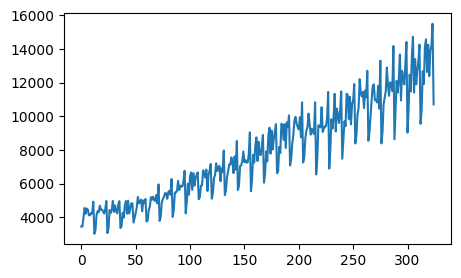

In [2]:
series = np.array(df[var])
fig = plt.figure(figsize=(5,3))
plt.plot(series)
N = series.shape[0]

print("Série: ", var)
print("Tamanho da série: ", N)

## Parte 1: Preparando os dados

1. **Separação em treinamento e teste**: o treinamento sempre deve vir antes do teste no caso de dados sequenciais
2. **Normalização**: aqui utilizaremos a normalização Min-Max para 0-1
3. **Inserção de ruído opcional**: no treinamento e teste para avaliação da robustez dos modelos
4. **Formulação como aprendizado supervisionado**: adequando os arrays de forma a permitir uso nas redes neurais

In [4]:
# variaveis que definem divisao em treinamento e teste e
# controlam adição de ruído
porc_treinamento = 70
inserir_ruido_serie = False
inserir_ruido_teste = False
porc_ruido = 1

In [5]:
# calcula tamanhos dos dados de treinamento (n_train) e teste (n_test)
n_train = int(len(series)*(porc_treinamento/100.0))
n_test = len(series)-n_train+1

train_x = series[:n_train]
test_x = series[n_train-1:]

# normalização min-max com base no treinamento
vmax = train_x.max()
vmin = train_x.min()

train_x_norm = (train_x - vmin)/(vmax - vmin)
test_x_norm = (test_x - vmin)/(vmax - vmin)

print("Exemplos de Treinamento: ", n_train)
print("Exemplos de Teste: ", n_test)

Exemplos de Treinamento:  227
Exemplos de Teste:  99


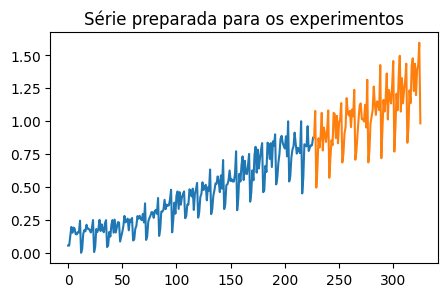

In [6]:
seed(1)
set_seed(1)

# insere ruido na serie
if (inserir_ruido_serie):
    train_x_norm = train_x_norm + \
                  np.random.randn(n_train)*(porc_ruido/100.0)

# insere ruido apenas no teste
if (inserir_ruido_teste):
    test_x_norm = test_x_norm + \
                  np.random.randn(n_test)*(porc_ruido/100.0)

fig = plt.figure(figsize=(5,3))
plt.plot(np.arange(0, n_train), train_x_norm)
plt.plot(np.arange(n_train,n_train+n_test), test_x_norm)
ax = plt.title('Série preparada para os experimentos')

#### Formulação para aprendizado supervisionado: adequação dos arrays

Podemos cumprir essa etapa utilizando a observação do último passo $t-1$ como entrada e a observação atual $t$ como saída.

Podemos alcançar isso deslocando todos os valores da série por um número específico de posições. Aqui vamos deslocar 1 posição para trás, que se tornarão as variáveis de entrada, sendo que a série temporal original será considerada como a variável de saída.

In [7]:
# modifica a serie temporal tornando-a um problema de aprendizado supervisionado
# retornando array de entrada x e de saída y
def timeseries_to_supervised_dense(series, look_back=1):
    # o reshape com -1 preenche a dimensão conforme necessário, nesse caso teremos (num_valores, 1)
    x = np.reshape(np.array(series[:-look_back]), (-1, 1))
    y = np.reshape(np.array(series[look_back:]), (-1, 1))
    return x, y

In [26]:
look_back = 1
train_x_dense, train_y_dense = timeseries_to_supervised_dense(train_x_norm,
                                                      look_back=look_back)

# numero de features na série
no_features = train_x_dense.shape[1]

print('Tamanho dos arrays de treinamento x e y')
print(train_x_dense.shape)
print(train_y_dense.shape)

print('\nPrimeiros elementos de x e y')
print(train_x_dense[:2])
print()
print(train_y_dense[:2])

Tamanho dos arrays de treinamento x e y
(226, 1)
(226, 1)

Primeiros elementos de x e y
[[0.05478751]
 [0.0546595 ]]

[[0.0546595 ]
 [0.12429595]]


## Parte 2: Utilizando unidades Densas para predição

Vamos tentar aprender a partir da série para obter um tipo de regressão

In [ ]:
seed(1)
set_seed(1)

MLP = keras.Sequential()
MLP.add(keras.layers.InputLayer((None, no_features)))
MLP.add(keras.layers.Dense(16, activation='relu'))
MLP.add(keras.layers.Dense(32, activation='relu'))
MLP.add(keras.layers.Dropout(0.2))
MLP.add(keras.layers.Dense(1, activation='relu'))
MLP.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, None, 16)          32        
                                                                 
 dense_1 (Dense)             (None, None, 32)          544       
                                                                 
 dropout (Dropout)           (None, None, 32)          0         
                                                                 
 dense_2 (Dense)             (None, None, 1)           33        
                                                                 
Total params: 609 (2.38 KB)
Trainable params: 609 (2.38 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [17]:
batch_size = 1
epochs = 80

# decaimento de learning rate
def scheduler(epoch, lr):
    if (epoch >= 5):
      lr = np.round(lr * tf.math.exp(-0.01),9)
    if (epoch % 10 == 0):
      print("Época %04d - learning rate %.9f" % (epoch, lr))

    return lr


callbacklr = tf.keras.callbacks.LearningRateScheduler(scheduler)


In [ ]:
# compilacao e treinamento
MLP.compile(loss='mean_squared_error',
            optimizer=keras.optimizers.Adam(learning_rate=0.0001),
            metrics=['mae'])

histMLP = MLP.fit(train_x_dense, train_y_dense,
                  batch_size=batch_size, epochs=epochs,
                  callbacks=[callbacklr],
                  verbose=0)

Época 0000 - learning rate 0.000100000
Época 0020 - learning rate 0.000085215
Época 0040 - learning rate 0.000069766
Época 0060 - learning rate 0.000057120


Scores treinamento
MSE: 0.0144
MAE: 0.0864


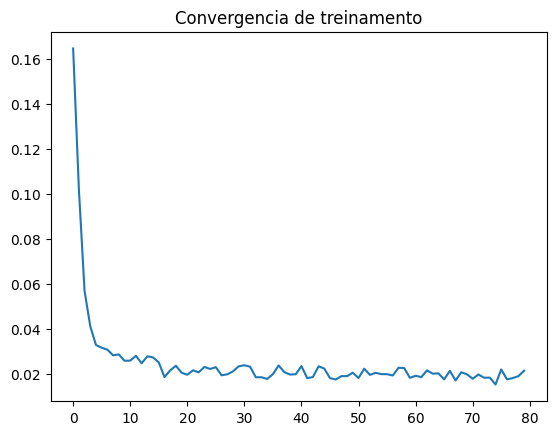

In [ ]:
scores = MLP.evaluate(train_x_dense, train_y_dense, verbose=0)
print('Scores treinamento')
print('MSE: %.4f' % (scores[0]))
print('MAE: %.4f' % (scores[1]))

plt.plot(histMLP.history['loss'])
ax = plt.title('Convergencia de treinamento')

In [ ]:
test_x_dense, test_y_dense = timeseries_to_supervised_dense(test_x_norm,
                                                        look_back=look_back)

print('Tamanho dos arrays de teste x e y')
print(test_x_dense.shape)
print(test_y_dense.shape)

print('\nPrimeiros elementos de teste x e y')
print(test_x_dense[:4])
print()
print(test_y_dense[:4])

Tamanho dos arrays de teste x e y
(98, 1)
(98, 1)

Primeiros 4 elementos de teste x e y
[[0.874936  ]
 [1.07834101]
 [0.49539171]
 [0.63786482]]
[[1.07834101]
 [0.49539171]
 [0.63786482]
 [0.87058372]]


In [ ]:
# realiza predicoes com os dados de treinamento e teste
train_y_pred = MLP.predict(train_x_dense)
train_y_pred = np.reshape(train_y_pred, (-1, 1))[1:]

test_y_pred = MLP.predict(test_x_dense)
test_y_pred = np.reshape(test_y_pred, (-1, 1))[1:]

4/4 [==============================] - 0s 2ms/step


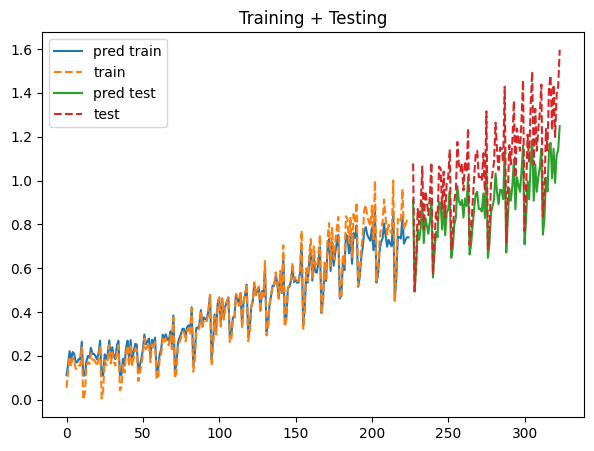

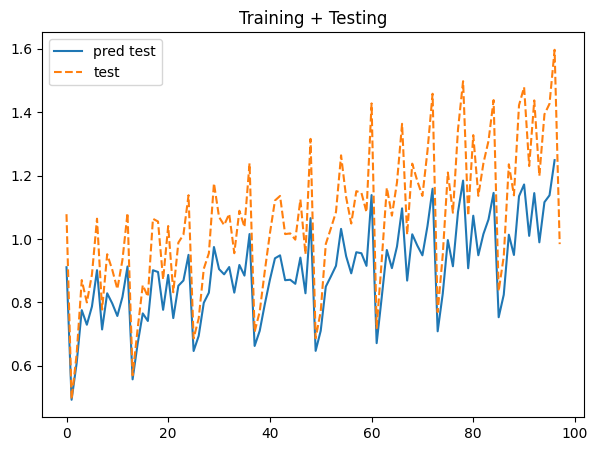

In [ ]:
fig = plt.figure(figsize=(7,5))
plt.plot(train_y_pred, label='pred train')
plt.plot(train_y_dense[:-1],'--', label ='train')
plt.plot(np.arange(n_train,n_train+n_test-2), test_y_pred, label='pred test')
plt.plot(np.arange(n_train,n_train+n_test-2), test_y_dense[:-1], '--', label='test')
plt.legend()
axt = plt.title('Training + Testing')
plt.show()

fig = plt.figure(figsize=(7,5))
plt.plot(test_y_pred, label='pred test')
plt.plot(test_y_dense, '--', label='test')
plt.legend()
axt = plt.title('Training + Testing')
plt.show()


## Parte 3 : Utilizando LSTMs para predição

Agora utilizaremos uma rede neural baseada em camada recorrente, permitindo aprender a sequência.

Uma camada LSTM espera como entrada um tensor com as seguintes dimensões:

samples x time_steps x features

* *Samples* são as observações independentes do domínio, tipicamente colunas de dados, consideradas no batch

* *Time steps* são os passos temporais separados de uma dada variável para uma dada observação - quantas observações serão dadas como entrada antes de que a primeira saída seja obtida

* *Features* são as medidas separadas observada em cada tempo da observação - quantos valores são considerados em cada entrada

No caso dessa base de dados, podemos usar diferentes configurações. Para manter simples, consideramos que o problema em cada passo de tempo é uma amostra individual, com um time step e uma feature apenas.


In [11]:
# formato deve ser [samples, time steps, features]
def recurrent_array(train_x, time_steps=1):

    array = np.array(np.reshape(train_x, (-1, 1)), copy=True)

    train_y_ts = array[time_steps:]
    train_x_ts = []
    for i in range(0, len(array) - time_steps):
        train_x_ts.append(array[i:i+time_steps])

    train_x_ts = np.array(train_x_ts)

    return train_x_ts, train_y_ts

In [29]:
time_steps = 2

train_x_rec, train_y_rec = recurrent_array(train_x_norm,
                                           time_steps=time_steps)

test_x_rec, test_y_rec = recurrent_array(test_x_norm,
                                         time_steps=time_steps)

In [30]:
print('Dados de treinamento para rede recorrente')
print('Tamanho dos arrays de teste x e y')
print(train_x_rec.shape)
print(train_y_rec.shape)

print('\nPrimeiros 4 elementos de treinamento x e y')
print(train_x_rec[:4])
print()
print(train_y_rec[:4])

Dados de treinamento para rede recorrente
Tamanho dos arrays de teste x e y
(225, 2, 1)
(225, 1)

Primeiros 4 elementos de treinamento x e y
[[[0.05478751]
  [0.0546595 ]]

 [[0.0546595 ]
  [0.12429595]]

 [[0.12429595]
  [0.19623656]]

 [[0.19623656]
  [0.15232975]]]

[[0.12429595]
 [0.19623656]
 [0.15232975]
 [0.19175627]]


In [ ]:
train_x_dense[:6]

array([[0.05478751],
       [0.0546595 ],
       [0.12429595],
       [0.19623656],
       [0.15232975],
       [0.19175627]])

#### Rede com unidades LSTM

In [ ]:
batch_size = 1

seed(1)
set_seed(1)

modelLSTM = keras.models.Sequential()
modelLSTM.add(keras.layers.InputLayer((None, no_features)))
modelLSTM.add(keras.layers.LSTM(16, return_sequences=True, activation='relu')) # 32
modelLSTM.add(keras.layers.LSTM(32, activation='relu'))
modelLSTM.add(keras.layers.Dropout(0.2))
modelLSTM.add(keras.layers.Dense(1, activation='relu'))
modelLSTM.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, None, 16)          1152      
                                                                 
 lstm_1 (LSTM)               (None, 32)                6272      
                                                                 
 dropout_1 (Dropout)         (None, 32)                0         
                                                                 
 dense_3 (Dense)             (None, 1)                 33        
                                                                 
Total params: 7457 (29.13 KB)
Trainable params: 7457 (29.13 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
epochs = 80

# compilacao e treinamento
modelLSTM.compile(loss='mean_squared_error',
            optimizer=keras.optimizers.Adam(learning_rate=0.0001),
            metrics=['mae'])

histLSTM = modelLSTM.fit(train_x_rec, train_y_rec,
                  batch_size=batch_size, epochs=epochs,
                  callbacks=[callbacklr], shuffle=False,
                  verbose=0)

Época 0000 - learning rate 0.000100000
Época 0020 - learning rate 0.000085215
Época 0040 - learning rate 0.000069766
Época 0060 - learning rate 0.000057120


Scores treinamento
MSE: 0.0134
MAE: 0.0888


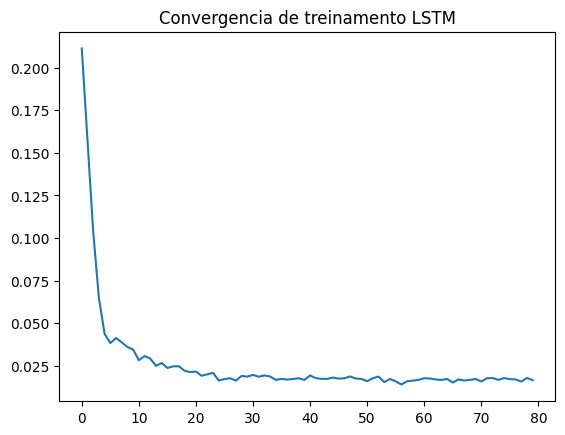

In [ ]:
scores = modelLSTM.evaluate(train_x_rec, train_y_rec, verbose=0)
print('Scores treinamento')
print('MSE: %.4f' % (scores[0]))
print('MAE: %.4f' % (scores[1]))

plt.plot(histLSTM.history['loss'])
ax = plt.title('Convergencia de treinamento LSTM')

In [ ]:
# realiza predicoes com os dados de treinamento e teste
train_y_predL = modelLSTM.predict(train_x_rec)
train_y_predL = np.reshape(train_y_predL, (-1, 1))[time_steps:]

test_y_predL = modelLSTM.predict(test_x_rec)
test_y_predL = np.reshape(test_y_predL, (-1, 1))[time_steps:]

4/4 [==============================] - 0s 2ms/step


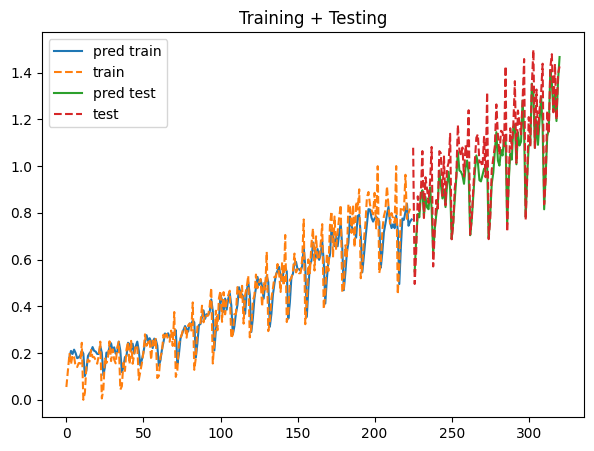

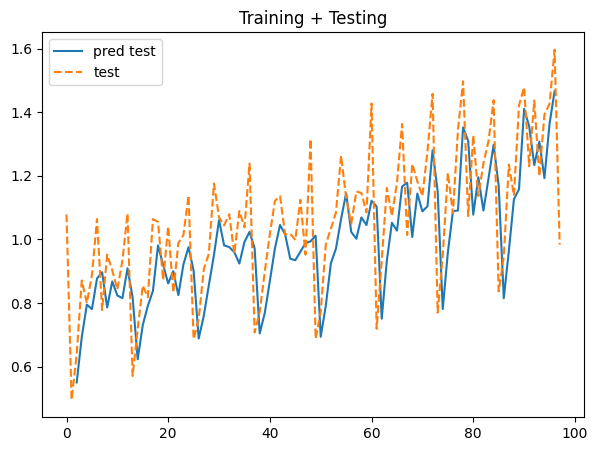

In [ ]:
fig = plt.figure(figsize=(7,5))
plt.plot(np.arange(time_steps,len(train_y_predL)+time_steps), train_y_predL, label='pred train')
plt.plot(train_y_dense[:-time_steps],'--', label ='train')
plt.plot(np.arange(len(train_y_predL)+time_steps+1, len(train_y_predL)+time_steps+len(test_y_predL)+1), test_y_predL, label='pred test')
plt.plot(np.arange(len(train_y_predL)+time_steps, len(train_y_predL)+time_steps+len(test_y_dense[:-time_steps])), test_y_dense[:-time_steps], '--', label='test')
plt.legend()
axt = plt.title('Training + Testing')
plt.show()

fig = plt.figure(figsize=(7,5))
plt.plot(np.arange(time_steps, len(test_y_predL)+time_steps), test_y_predL, label='pred test')
plt.plot(test_y_dense, '--', label='test')
plt.legend()
axt = plt.title('Training + Testing')
plt.show()

#### GRU como forma alternativa à LSTM

In [21]:
batch_size = 1

seed(1)
set_seed(1)
GRU = keras.models.Sequential()
GRU.add(keras.layers.InputLayer((None, no_features)))
GRU.add(keras.layers.GRU(24, return_sequences=True, activation='relu')) # 32
GRU.add(keras.layers.GRU(32, activation='relu'))
GRU.add(keras.layers.Dropout(0.2))
GRU.add(keras.layers.Dense(1, activation='relu'))
GRU.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_4 (GRU)                 (None, None, 24)          1944      
                                                                 
 gru_5 (GRU)                 (None, 32)                5568      
                                                                 
 dropout_2 (Dropout)         (None, 32)                0         
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 7545 (29.47 KB)
Trainable params: 7545 (29.47 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [22]:
epochs = 80

# compilacao e treinamento
GRU.compile(loss='mean_squared_error',
            optimizer=keras.optimizers.Adam(learning_rate=0.0001),
            metrics=['mae'])

histGRU = GRU.fit(train_x_rec, train_y_rec,
                  batch_size=batch_size, epochs=epochs,
                  callbacks=[callbacklr], shuffle=False,
                  verbose=0)

Época 0000 - learning rate 0.000100000
Época 0010 - learning rate 0.000094177
Época 0020 - learning rate 0.000085215
Época 0030 - learning rate 0.000077104
Época 0040 - learning rate 0.000069766
Época 0050 - learning rate 0.000063128
Época 0060 - learning rate 0.000057120
Época 0070 - learning rate 0.000051684


Scores treinamento
MSE: 0.0128
MAE: 0.0840


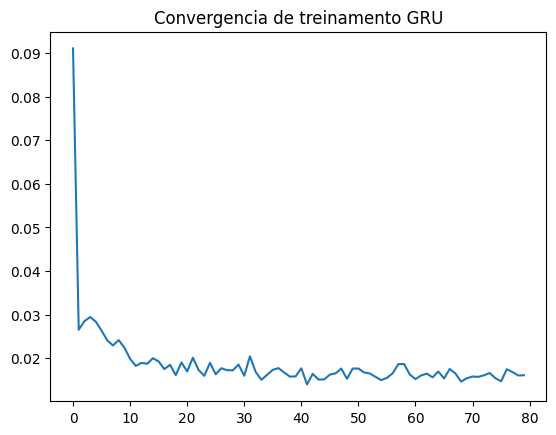

In [ ]:
scores = GRU.evaluate(train_x_rec, train_y_rec, verbose=0)
print('Scores treinamento')
print('MSE: %.4f' % (scores[0]))
print('MAE: %.4f' % (scores[1]))

plt.figure(figsize=(5,4))
plt.plot(histGRU.history['loss'])
ax = plt.title('Convergencia de treinamento GRU')

In [ ]:
# realiza predicoes com os dados de treinamento e teste
train_y_predG = GRU.predict(train_x_rec)
train_y_predG = np.reshape(train_y_predG, (-1, 1))[time_steps:]

test_y_predG = GRU.predict(test_x_rec)
test_y_predG = np.reshape(test_y_predG, (-1, 1))[time_steps:]

4/4 [==============================] - 0s 3ms/step


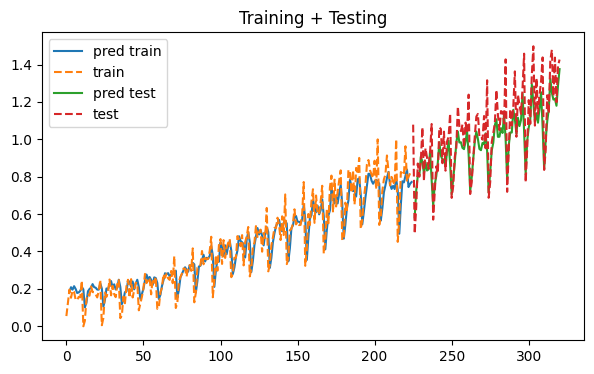

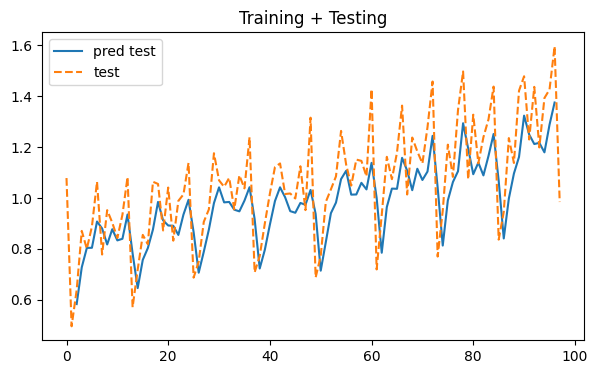

In [ ]:
fig = plt.figure(figsize=(7,4))

plt.plot(np.arange(time_steps,len(train_y_predG)+time_steps), train_y_predL, label='pred train')
plt.plot(train_y_dense[:-time_steps],'--', label ='train')
plt.plot(np.arange(len(train_y_predG)+time_steps+1, len(train_y_predG)+time_steps+len(test_y_predG)+1), test_y_predG, label='pred test')
plt.plot(np.arange(len(train_y_predG)+time_steps, len(train_y_predG)+time_steps+len(test_y_dense[:-time_steps])), test_y_dense[:-time_steps], '--', label='test')
plt.legend()
axt = plt.title('Training + Testing')
plt.show()

fig = plt.figure(figsize=(7,4))
plt.plot(np.arange(time_steps,len(test_y_predG)+time_steps),test_y_predG, label='pred test')
plt.plot(test_y_dense, '--', label='test')
plt.legend()
axt = plt.title('Training + Testing')
plt.show()

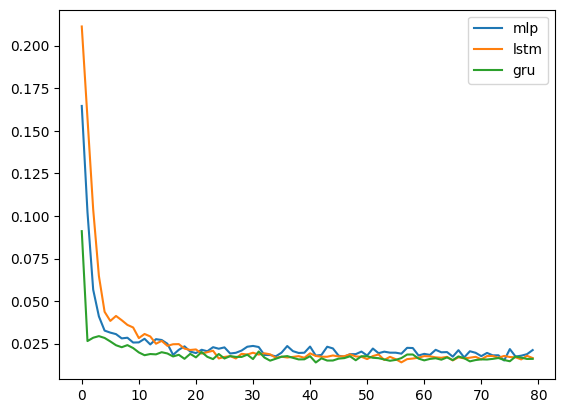

In [ ]:
plt.plot(histMLP.history['loss'])
plt.plot(histLSTM.history['loss'])
plt.plot(histGRU.history['loss'])
plt.legend(['mlp', 'lstm', 'gru'])

In [ ]:
# avaliacao da predição ponto a ponto
print("Erro no teste com predição a cada ponto:")
scoreMLP = MLP.evaluate(test_x_dense, test_y_dense, verbose=0)
print("MLP: %.5f" % (scoreMLP[0]))
scoreLSTM = modelLSTM.evaluate(test_x_rec, test_y_rec, verbose=0)
print("LSTM: %.5f" % (scoreLSTM[0]))
scoreGRU = GRU.evaluate(test_x_rec, test_y_rec, verbose=0)
print("GRU: %.5f" % (scoreGRU[0]))

Erro no teste com predição a cada ponto:
MLP: 0.07012
LSTM: 0.05254
GRU: 0.04837


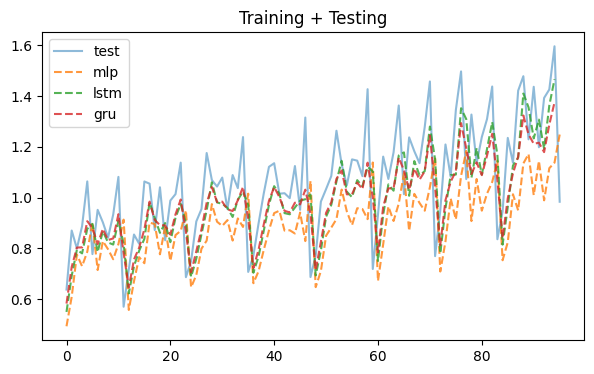

In [ ]:
fig = plt.figure(figsize=(7,4))
plt.plot(test_y_dense[time_steps:], '-', alpha=0.5, label='test')
plt.plot(test_y_pred[time_steps-1:], '--', alpha=0.8, label='mlp')
plt.plot(test_y_predL, '--', alpha=0.8, label='lstm')
plt.plot(test_y_predG, '--', alpha=0.8, label='gru')
plt.legend()
axt = plt.title('Training + Testing')
plt.show()

## Módulo 5 - Redes neurais para dados sequenciais
### <span style="color:darkred">**Mecanismo de atenção**</span>

In [ ]:
import numpy as np
from pandas import read_csv
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from numpy.random import seed
from tensorflow.random import set_seed
import random

In [ ]:
def modelo_denso(input_shape):
    inputs = layers.Input(shape=(input_shape,))

    # Atenção baseada em softmax
    attention_probs = layers.Dense(input_shape, activation='softmax',
                                   name='attention_vec')(inputs)

    attention_mul = layers.Multiply(name='attention_mul')([inputs,
                                                           attention_probs])
    # Fim da camada de atencao

    attention_mul = layers.Dense(16)(attention_mul)
    output = layers.Dense(1, activation='sigmoid')(attention_mul)
    model = keras.models.Model(inputs=[inputs], outputs=output)
    return model

In [ ]:
def dados_atencao(N, dim, atencao=(1, 3)):
    x = (np.random.randn(N*dim)*0.25).reshape([N,dim])
    y = np.random.randint(low=0, high=2, size=(N, 1))
    for i,at in enumerate(atencao):
      x[:, at] = ((y[:, 0]*0.5)-0.25) + (np.random.randn(N)*0.1)

    return x, y

Text(0.5, 1.0, '[0]')

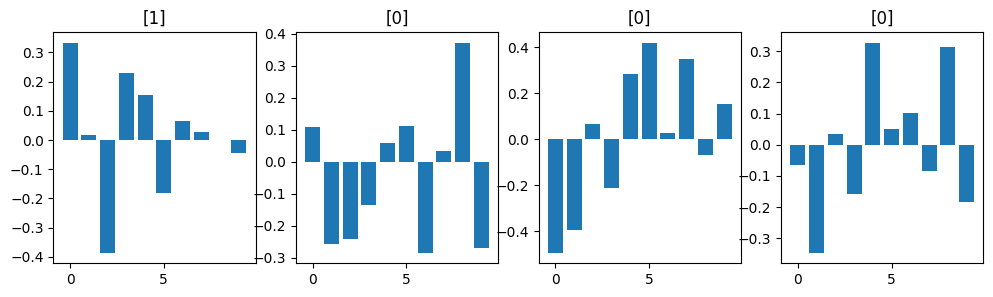

In [ ]:
N = 100
d = 10

seed(10)
train_x, train_y = dados_atencao(N, d)
test_x, test_y = dados_atencao(5, d)
plt.figure(figsize=(12,3))
plt.subplot(141); plt.bar(np.arange(d), train_x[0]); plt.title(train_y[0])
plt.subplot(142); plt.bar(np.arange(d), train_x[1]); plt.title(train_y[1])
plt.subplot(143); plt.bar(np.arange(d), train_x[2]); plt.title(train_y[2])
plt.subplot(144); plt.bar(np.arange(d), train_x[3]); plt.title(train_y[3])

In [ ]:
modelD = modelo_denso(d)
modelD.compile(optimizer='adam', loss='binary_crossentropy',
               metrics=['accuracy'])
print(modelD.summary())

output_att = keras.models.Model(inputs=modelD.input,
                                outputs=modelD.get_layer('attention_vec').output)

output_mul = keras.models.Model(inputs=modelD.input,
                                outputs=modelD.get_layer('attention_mul').output)

1/1 [==============================] - 0s 48ms/step
Vetor de "atencao" = [0.07313    0.12323563 0.11441259 0.09396052 0.07890335 0.11104407
 0.08578157 0.10759716 0.09634164 0.11559344]


<BarContainer object of 10 artists>

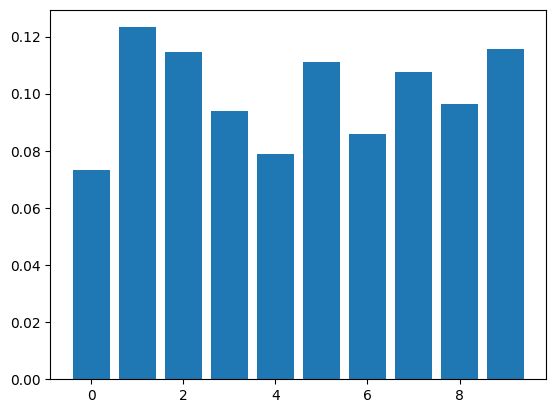

In [ ]:
attention_vector = output_att.predict(test_x)[0]
print('Vetor de "atencao" =', attention_vector)
plt.bar(np.arange(d), attention_vector)

1/1 [==============================] - 0s 53ms/step
Vetor de "atencao" * features = [-0.01122643  0.03469804  0.03551516  0.02143101 -0.00125266  0.01334104
  0.00439272  0.05334779  0.01269396 -0.0312859 ]


<BarContainer object of 10 artists>

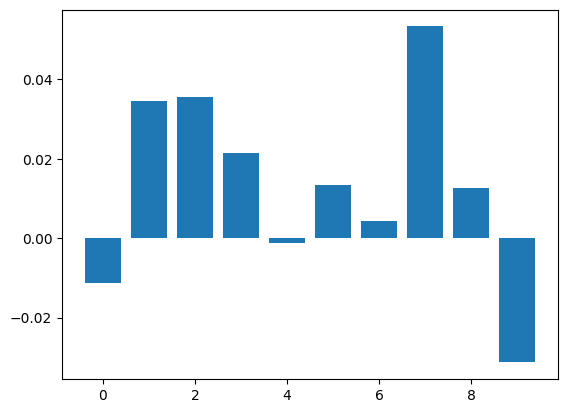

In [ ]:
attention_mul = output_mul.predict(test_x)[0]
print('Vetor de "atencao" * features =', attention_mul)
plt.bar(np.arange(d), attention_mul)

In [ ]:
modelD.fit(train_x, train_y, epochs=100, batch_size=10, verbose=0)
score1 = modelD.evaluate(train_x, train_y,  verbose=0)
print("Acurácia treinamento:", score1[1]*100)

Acurácia treinamento: 100.0


1/1 [==============================] - 0s 39ms/step


Text(0.5, 1.0, 'Vetor atencao ponderado classe [1]')

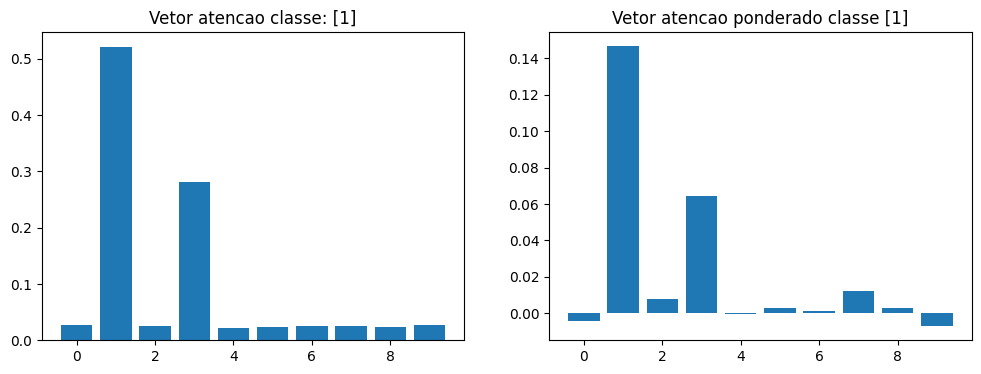

In [ ]:
i = 0
attention_vector = output_att.predict(test_x)[i]
#print('Vetor de "atencao" =', attention_vector)
plt.figure(figsize=(12,4))
plt.subplot(121); plt.bar(np.arange(d), attention_vector); plt.title(f"Vetor atencao classe: {test_y[i]}")
attention_mul = output_mul.predict(test_x)[i]
#print('Vetor de "atencao" ponderado =', attention_mul)
plt.subplot(122); plt.bar(np.arange(d), attention_mul); plt.title(f"Vetor atencao ponderado classe {test_y[i]}")

1/1 [==============================] - 0s 37ms/step


Text(0.5, 1.0, 'Vetor atencao ponderado classe [0]')

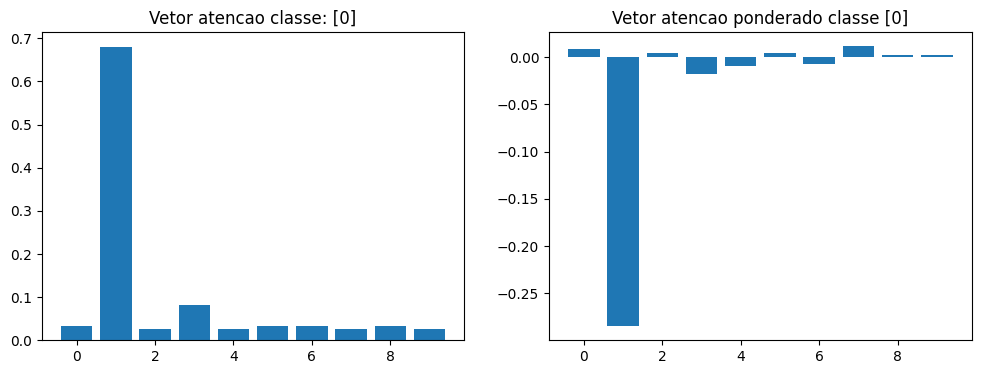

In [ ]:
i = 2
attention_vector = output_att.predict(test_x)[i]
#print('Vetor de "atencao" =', attention_vector)
plt.figure(figsize=(12,4))
plt.subplot(121); plt.bar(np.arange(d), attention_vector); plt.title(f"Vetor atencao classe: {test_y[i]}")
attention_mul = output_mul.predict(test_x)[i]
#print('Vetor de "atencao" ponderado =', attention_mul)
plt.subplot(122); plt.bar(np.arange(d), attention_mul); plt.title(f"Vetor atencao ponderado classe {test_y[i]}")

In [ ]:
score2 = modelD.evaluate(test_x, test_y,  verbose=0)
print("Acurácia teste:", score2[1]*100)

Acurácia teste: 100.0


### Redes Neurais e Aprendizado Profundo
#### **MBA em Ciências de Dados**

### Módulo 5 - Redes neurais para dados sequenciais </span>

#### <span style="color:darkred">**Camada Self-Attention** combinada com LSTM</span>

Moacir Antonelli Ponti

---

In [ ]:
import numpy as np
from pandas import read_csv

import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.layers import Layer
from tensorflow.keras import backend as K

from numpy.random import seed
from tensorflow.random import set_seed

from sklearn.metrics import mean_squared_error
from math import sqrt

# outros
df = read_csv('Alcohol_Sales.csv')
#df = read_csv('data/Miles_Traveled.csv')
#df = read_csv('data/starbucks.csv')
#df = read_csv('data/passengers.csv')
#df = read_csv('data/price_of_ground_chuck.csv')

# pega segunda coluna do dataframe
var = df.columns.values[1]

Série:  S4248SM144NCEN
Tamanho da série:  325


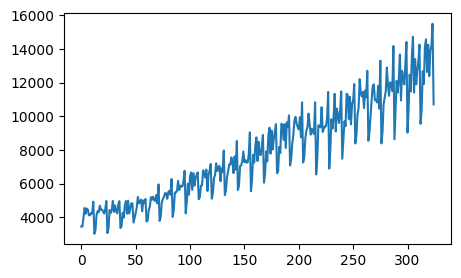

In [ ]:
series = np.array(df[var])
fig = plt.figure(figsize=(5,3))
plt.plot(series)
N = series.shape[0]

print("Série: ", var)
print("Tamanho da série: ", N)

## Parte 1: Preparando os dados

1. **Separação em treinamento e teste**: o treinamento sempre deve vir antes do teste no caso de dados sequenciais
2. **Normalização**: aqui utilizaremos a normalização Min-Max para 0-1
3. **Inserção de ruído opcional**: no treinamento e teste para avaliação da robustez dos modelos
4. **Formulação como aprendizado supervisionado**: adequando os arrays de forma a permitir uso nas redes neurais

In [ ]:
# calcula tamanhos dos dados de treinamento (n_train) e teste (n_test)
porc_treinamento = 70

n_train = int(len(series)*(porc_treinamento/100.0))
n_test = len(series)-n_train+1

train_x = series[:n_train]
test_x = series[n_train-1:]

# normalização min-max com base no treinamento
vmax = train_x.max()
vmin = train_x.min()

train_x_norm = (train_x - vmin)/(vmax - vmin)
test_x_norm = (test_x - vmin)/(vmax - vmin)

print("Exemplos de Treinamento: ", n_train)
print("Exemplos de Teste: ", n_test)

Exemplos de Treinamento:  227
Exemplos de Teste:  99


In [ ]:
inserir_ruido_serie = False
inserir_ruido_teste = False
porc_ruido = 10.0

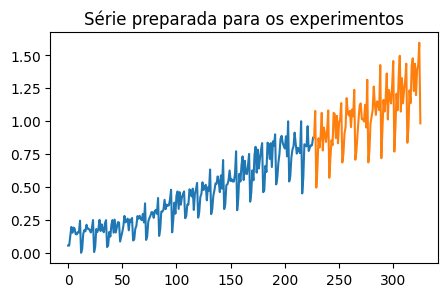

In [ ]:
seed(1)
set_seed(1)

# insere ruido na serie
if (inserir_ruido_serie):
    train_x_norm = train_x_norm + np.random.randn(n_train)*(porc_ruido/100.0)

# insere ruido apenas no teste
if (inserir_ruido_teste):
    test_x_norm = test_x_norm + np.random.randn(n_test)*(porc_ruido/100.0)

fig = plt.figure(figsize=(5,3))
plt.plot(np.arange(0, n_train), train_x_norm)
plt.plot(np.arange(n_train,n_train+n_test), test_x_norm)
ax = plt.title('Série preparada para os experimentos')

#### Formulação para aprendizado supervisionado: adequação dos arrays

Podemos cumprir essa etapa utilizando a observação do último passo $t-1$ como entrada e a observação atual $t$ como saída.

Podemos alcançar isso deslocando todos os valores da série por um número específico de posições. Aqui vamos deslocar 1 posição para trás, que se tornarão as variáveis de entrada, sendo que a série temporal original será considerada como a variável de saída.

In [ ]:
# modifica a serie temporal tornando-a um problema de aprendizado supervisionado
# retornando array de entrada x e de saída y
def timeseries_to_supervised_dense(series, look_back=1):
    # o reshape com -1 preenche a dimensão conforme necessário, nesse caso teremos (num_valores, 1)
    x = np.reshape(np.array(series[:-look_back]), (-1, 1))
    y = np.reshape(np.array(series[look_back:]), (-1, 1))
    return x, y

In [ ]:
look_back = 1
train_x_dense, train_y_dense = timeseries_to_supervised_dense(train_x_norm, look_back=look_back)

# numero de features na série
no_features = train_x_dense.shape[1]

print('Tamanho dos arrays de treinamento x e y')
print(train_x_dense.shape)
print(train_y_dense.shape)

print('\nPrimeiros 4 elementos de x e y')
print(train_x_dense[:4])
print(train_y_dense[:4])

Tamanho dos arrays de treinamento x e y
(226, 1)
(226, 1)

Primeiros 4 elementos de x e y
[[0.05478751]
 [0.0546595 ]
 [0.12429595]
 [0.19623656]]
[[0.0546595 ]
 [0.12429595]
 [0.19623656]
 [0.15232975]]


## Parte 2 : Utilizando LSTMs para predição

Agora utilizaremos uma rede neural baseada em camada recorrente, permitindo aprender a sequência.

Uma camada LSTM espera como entrada um tensor com as seguintes dimensões:

samples x time_steps x features

* *Samples* são as observações independentes do domínio, tipicamente colunas de dados, consideradas no batch

* *Time steps* são os passos temporais separados de uma dada variável para uma dada observação - quantas observações serão dadas como entrada antes de que a primeira saída seja obtida

* *Features* são as medidas separadas observada em cada tempo da observação - quantos valores são considerados em cada entrada

No caso dessa base de dados, podemos usar diferentes configurações. Para manter simples, consideramos que o problema em cada passo de tempo é uma amostra individual, com um time step e uma feature apenas.


In [ ]:
# formato deve ser [samples, time steps, features]
def recurrent_array(train_x, time_steps=1):

    array = np.array(np.reshape(train_x, (-1, 1)), copy=True)

    train_y_ts = array[time_steps:]
    train_x_ts = []
    for i in range(0, len(array) - time_steps):
        train_x_ts.append(array[i:i+time_steps])

    train_x_ts = np.array(train_x_ts)

    #rec_array = np.reshape(array, (array.shape[0], time_steps, array.shape[1]))
    return train_x_ts, train_y_ts

In [ ]:
time_steps = 2

train_x_rec, train_y_rec = recurrent_array(train_x_norm, time_steps=time_steps)

test_x_rec, test_y_rec = recurrent_array(test_x_norm,time_steps=time_steps)

In [ ]:
print('Dados de treinamento para rede recorrente')
print('Tamanho dos arrays de teste x e y')
print(train_x_rec.shape)
print(train_y_rec.shape)

print('\nPrimeiros 4 elementos de treinamento x e y')
print(train_x_rec[:4])
print(train_y_rec[:4])

Dados de treinamento para rede recorrente
Tamanho dos arrays de teste x e y
(225, 2, 1)
(225, 1)

Primeiros 4 elementos de treinamento x e y
[[[0.05478751]
  [0.0546595 ]]

 [[0.0546595 ]
  [0.12429595]]

 [[0.12429595]
  [0.19623656]]

 [[0.19623656]
  [0.15232975]]]
[[0.12429595]
 [0.19623656]
 [0.15232975]
 [0.19175627]]


In [ ]:
train_x_dense[:6]

array([[0.05478751],
       [0.0546595 ],
       [0.12429595],
       [0.19623656],
       [0.15232975],
       [0.19175627]])

#### Rede com unidades LSTM

In [ ]:
batch_size = 1

seed(1)
set_seed(1)

def create_LSTM(no_features, time_steps, hidden_units=10, activation='relu', do_rate=0.2):

    x = layers.Input(shape=(time_steps, no_features))

    lstm_x = layers.LSTM(hidden_units, return_sequences=True, activation=activation)(x)
    lstm_x = layers.LSTM(hidden_units, activation=activation)(lstm_x)

    drop = layers.Dropout(do_rate)(lstm_x)
    outputs = layers.Dense(1, trainable=True, activation=activation)(drop)
    model = tf.keras.models.Model(x, outputs)
    return model

modelLSTM = create_LSTM(no_features, time_steps, hidden_units=16, do_rate=0.25)
modelLSTM.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 2, 1)]            0         
                                                                 
 lstm (LSTM)                 (None, 2, 16)             1152      
                                                                 
 lstm_1 (LSTM)               (None, 16)                2112      
                                                                 
 dropout (Dropout)           (None, 16)                0         
                                                                 
 dense (Dense)               (None, 1)                 17        
                                                                 
Total params: 3281 (12.82 KB)
Trainable params: 3281 (12.82 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
epochs = 35

# decaimento de learning rate
def scheduler(epoch, lr):
    #if (epoch % 20 == 0): print("Época %04d - learning rate %.9f" % (epoch, lr))
    if (epoch+1 < 5):
        return lr
    else:
        return np.round(lr * tf.math.exp(-0.02),9)

callbacklr = tf.keras.callbacks.LearningRateScheduler(scheduler)

modelLSTM = create_LSTM(no_features, time_steps, hidden_units=16, do_rate=0.25)

# compilacao e treinamento
modelLSTM.compile(loss='mean_squared_error',
            optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0002),
            metrics=['mae'])

histLSTM = modelLSTM.fit(train_x_rec, train_y_rec,
                  batch_size=batch_size, epochs=epochs,
                  callbacks=[callbacklr], shuffle=False,
                  verbose=1)

Epoch 1/35
225/225 [==============================] - 13s 11ms/step - loss: 0.2035 - mae: 0.3960 - lr: 2.0000e-04
Epoch 2/35
225/225 [==============================] - 2s 10ms/step - loss: 0.1400 - mae: 0.3084 - lr: 2.0000e-04
Epoch 3/35
225/225 [==============================] - 2s 10ms/step - loss: 0.0909 - mae: 0.2335 - lr: 2.0000e-04
Epoch 4/35
225/225 [==============================] - 3s 11ms/step - loss: 0.0605 - mae: 0.1966 - lr: 2.0000e-04
Epoch 5/35
225/225 [==============================] - 3s 12ms/step - loss: 0.0549 - mae: 0.1944 - lr: 1.9604e-04
Epoch 6/35
225/225 [==============================] - 3s 13ms/step - loss: 0.0523 - mae: 0.1883 - lr: 1.9216e-04
Epoch 7/35
225/225 [==============================] - 3s 12ms/step - loss: 0.0441 - mae: 0.1777 - lr: 1.8835e-04
Epoch 8/35
225/225 [==============================] - 2s 7ms/step - loss: 0.0485 - mae: 0.1824 - lr: 1.8462e-04
Epoch 9/35
225/225 [==============================] - 2s 10ms/step - loss: 0.0430 - mae: 0.1717 

Scores treinamento
MSE: 0.0146
MAE: 0.0930


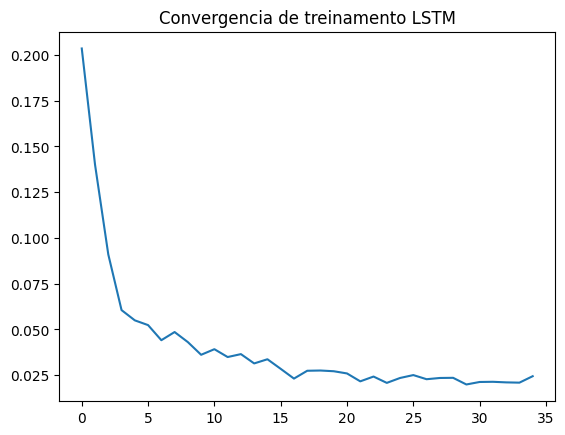

In [ ]:
scores = modelLSTM.evaluate(train_x_rec, train_y_rec, verbose=0)
print('Scores treinamento')
print('MSE: %.4f' % (scores[0]))
print('MAE: %.4f' % (scores[1]))

plt.plot(histLSTM.history['loss'])
ax = plt.title('Convergencia de treinamento LSTM')

In [ ]:
# realiza predicoes com os dados de treinamento e teste
train_y_predL = modelLSTM.predict(train_x_rec)
train_y_predL = np.reshape(train_y_predL, (-1, 1))[time_steps:]

test_y_predL = modelLSTM.predict(test_x_rec)
test_y_predL = np.reshape(test_y_predL, (-1, 1))[time_steps:]

4/4 [==============================] - 0s 3ms/step


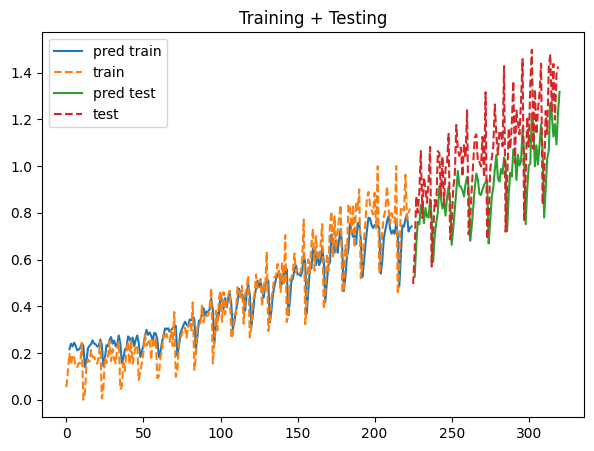

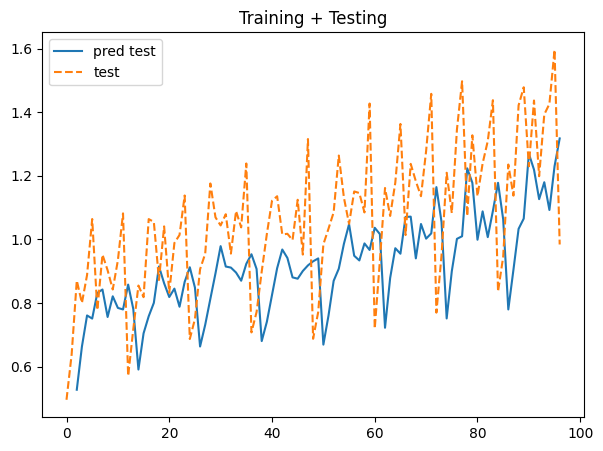

In [ ]:
fig = plt.figure(figsize=(7,5))
plt.plot(np.arange(time_steps,len(train_y_predL)+time_steps), train_y_predL, label='pred train')
plt.plot(train_y_dense[:-time_steps],'--', label ='train')
plt.plot(np.arange(len(train_y_predL)+time_steps+1, len(train_y_predL)+time_steps+len(test_y_predL)+1), test_y_predL, label='pred test')
plt.plot(np.arange(len(train_y_predL)+time_steps, len(train_y_predL)+time_steps+len(test_y_rec[:-time_steps])), test_y_rec[:-time_steps], '--', label='test')
plt.legend()
axt = plt.title('Training + Testing')
plt.show()

fig = plt.figure(figsize=(7,5))
plt.plot(np.arange(time_steps, len(test_y_predL)+time_steps), test_y_predL, label='pred test')
plt.plot(test_y_rec, '--', label='test')
plt.legend()
axt = plt.title('Training + Testing')
plt.show()

## Parte 3: Camada Self-Attention


In [ ]:
class SelfAttentionLayer(layers.Layer):
    def __init__(self, return_sequences=False):
        super(SelfAttentionLayer, self).__init__()
        self.return_sequences = return_sequences

    def build(self, input_shape):
        # Create a trainable weight variable for this layer.
        self.W_q = self.add_weight(name="W_q", shape=(input_shape[-1], input_shape[-1]), trainable=True)
        self.W_k = self.add_weight(name="W_k", shape=(input_shape[-1], input_shape[-1]), trainable=True)
        self.W_v = self.add_weight(name="W_v", shape=(input_shape[-1], input_shape[-1]), trainable=True)

    def call(self, inputs):
        q = tf.matmul(inputs, self.W_q)
        k = tf.matmul(inputs, self.W_k)
        v = tf.matmul(inputs, self.W_v)

        # Calculate attention scores using dot product
        attn_score = tf.matmul(q, k, transpose_b=True)

        # Apply softmax activation to get attention weights
        attn_score = tf.nn.softmax(attn_score, axis=-1)

        # Weighted sum using the attention scores
        output = tf.matmul(attn_score, v)

        if self.return_sequences:
            return output
        else:
            return tf.reduce_sum(output, axis=1)

In [ ]:
batch_size = 1

def create_LSTM_with_attention(no_features, time_steps, hidden_units=10, activation='relu', do_rate=0.2):

    x = layers.Input(shape=(time_steps, no_features))

    lstm_x = layers.LSTM(hidden_units, return_sequences=True, activation=activation)(x)
    #lstm_x = layers.LSTM(hidden_units, return_sequences=True, activation=activation)(lstm_x)
    attention = SelfAttentionLayer()(lstm_x)

    attention_drop = layers.Dropout(do_rate)(attention)
    outputs = layers.Dense(1, trainable=True, activation=activation)(attention_drop)
    model = tf.keras.models.Model(x, outputs)
    return model

modelAtt = create_LSTM_with_attention(no_features, time_steps, hidden_units=16, do_rate=0.25)
modelAtt.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 2, 1)]            0         
                                                                 
 lstm_6 (LSTM)               (None, 2, 16)             1152      
                                                                 
 self_attention_layer_2 (Se  (None, 16)                768       
 lfAttentionLayer)                                               
                                                                 
 dropout_4 (Dropout)         (None, 16)                0         
                                                                 
 dense_4 (Dense)             (None, 1)                 17        
                                                                 
Total params: 1937 (7.57 KB)
Trainable params: 1937 (7.57 KB)
Non-trainable params: 0 (0.00 Byte)
___________________________

In [ ]:
modelAtt = create_LSTM_with_attention(no_features, time_steps, hidden_units=16, do_rate=0.25)

# compilacao e treinamento
modelAtt.compile(loss='mean_squared_error',
            optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0002),
            metrics=['mae'])

histAtt = modelAtt.fit(train_x_rec, train_y_rec,
                  batch_size=batch_size, epochs=epochs,
                  callbacks=[callbacklr], shuffle=False,
                  verbose=1)

Epoch 1/35
225/225 [==============================] - 2s 3ms/step - loss: 0.0914 - mae: 0.2671 - lr: 2.0000e-04
Epoch 2/35
225/225 [==============================] - 1s 3ms/step - loss: 0.0248 - mae: 0.1243 - lr: 2.0000e-04
Epoch 3/35
225/225 [==============================] - 1s 3ms/step - loss: 0.0243 - mae: 0.1255 - lr: 2.0000e-04
Epoch 4/35
225/225 [==============================] - 1s 3ms/step - loss: 0.0268 - mae: 0.1291 - lr: 2.0000e-04
Epoch 5/35
225/225 [==============================] - 1s 5ms/step - loss: 0.0236 - mae: 0.1222 - lr: 1.9604e-04
Epoch 6/35
225/225 [==============================] - 1s 3ms/step - loss: 0.0239 - mae: 0.1214 - lr: 1.9216e-04
Epoch 7/35
225/225 [==============================] - 1s 3ms/step - loss: 0.0242 - mae: 0.1207 - lr: 1.8835e-04
Epoch 8/35
225/225 [==============================] - 1s 3ms/step - loss: 0.0218 - mae: 0.1176 - lr: 1.8462e-04
Epoch 9/35
225/225 [==============================] - 1s 3ms/step - loss: 0.0221 - mae: 0.1165 - lr: 1.8

Scores treinamento
MSE: 0.0141
MAE: 0.0899


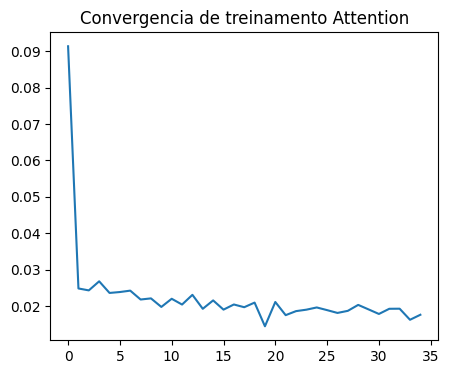

In [ ]:
scores = modelAtt.evaluate(train_x_rec, train_y_rec, batch_size=batch_size, verbose=0)
print('Scores treinamento')
print('MSE: %.4f' % (scores[0]))
print('MAE: %.4f' % (scores[1]))

plt.figure(figsize=(5,4))
plt.plot(histAtt.history['loss'])
ax = plt.title('Convergencia de treinamento Attention')

In [ ]:
# realiza predicoes com os dados de treinamento e teste
train_y_predG = modelAtt.predict(train_x_rec,batch_size=batch_size)
train_y_predG = np.reshape(train_y_predG, (-1, 1))[time_steps:]

test_y_predG = modelAtt.predict(test_x_rec,batch_size=batch_size)
test_y_predG = np.reshape(test_y_predG, (-1, 1))[time_steps:]

97/97 [==============================] - 0s 2ms/step


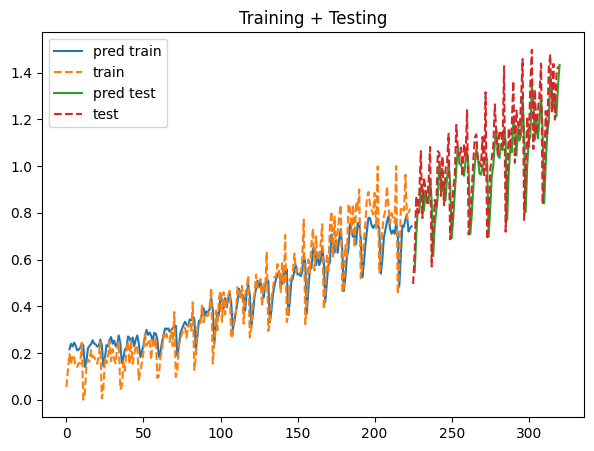

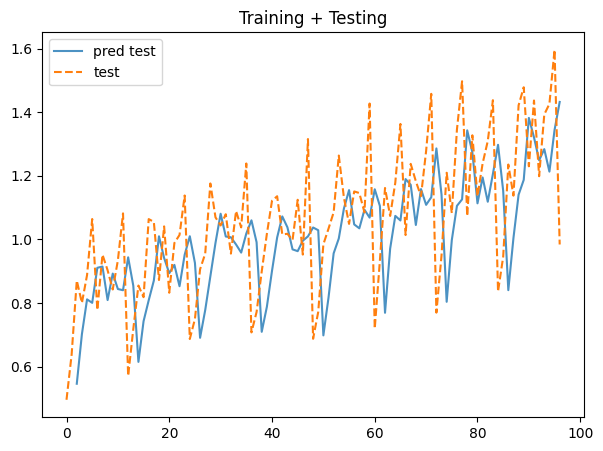

In [ ]:
fig = plt.figure(figsize=(7,5))

plt.plot(np.arange(time_steps,len(train_y_predG)+time_steps), train_y_predL, label='pred train')
plt.plot(train_y_dense[:-time_steps],'--', label ='train')
plt.plot(np.arange(len(train_y_predG)+time_steps+1, len(train_y_predG)+time_steps+len(test_y_predG)+1), test_y_predG, label='pred test')
plt.plot(np.arange(len(train_y_predG)+time_steps, len(train_y_predG)+time_steps+len(test_y_rec[:-time_steps])), test_y_rec[:-time_steps], '--', label='test')
plt.legend()
axt = plt.title('Training + Testing')
plt.show()

fig = plt.figure(figsize=(7,5))
plt.plot(np.arange(time_steps,len(test_y_predG)+time_steps),test_y_predG, alpha=0.8, label='pred test')
plt.plot(test_y_rec, '--', label='test')
plt.legend()
axt = plt.title('Training + Testing')
plt.show()

In [ ]:
# avaliacao da predição ponto a ponto
print("Erro no teste com predição a cada ponto:")
scoreLSTM = modelLSTM.evaluate(test_x_rec, test_y_rec, batch_size = batch_size, verbose=0)
print(f"LSTM    : MSE={scoreLSTM[0]:.4f}, MAE={scoreLSTM[1]:.4f})")
scoreAtt = modelAtt.evaluate(test_x_rec, test_y_rec, batch_size = batch_size, verbose=0)
print(f"LSTM+Att: MSE={scoreAtt[0]:.4f}, MAE={scoreAtt[1]:.4f})")

Erro no teste com predição a cada ponto:
LSTM    : MSE=0.0626, MAE=0.2195)
LSTM+Att: MSE=0.0494, MAE=0.1871)


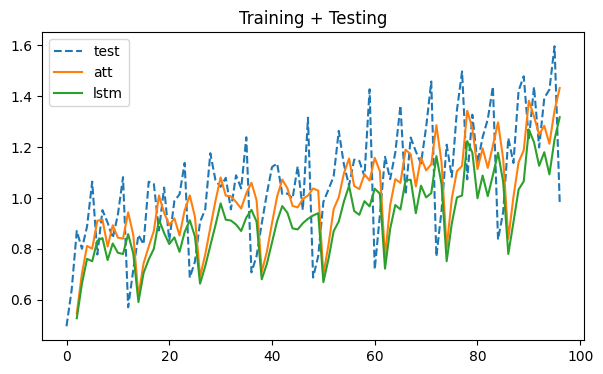

In [ ]:
fig = plt.figure(figsize=(7,4))
plt.plot(test_y_rec, '--', label='test')
# plt.plot(test_y_predL, '--', alpha=0.8, label='lstm')
# plt.plot(test_y_predG, '--', alpha=0.8, label='att')
plt.plot(np.arange(time_steps,len(test_y_predG)+time_steps),test_y_predG, label='att')
plt.plot(np.arange(time_steps,len(test_y_predL)+time_steps),test_y_predL, label='lstm')
plt.legend()
axt = plt.title('Training + Testing')
plt.show()

## Módulo 5 - Redes neurais para dados sequenciais</span>
#### <span style="color:darkred">**Séries Multivariadas e Statefulness**</span>

Utilizaremos a base de dados 3W (Petrobrás) que possui séries multivariadas medidas em poços de petróleo

In [1]:
import numpy as np
from pandas import read_csv
import pandas as pd

import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.layers import Layer
from tensorflow.keras import backend as K

from numpy.random import seed
from tensorflow.random import set_seed

from sklearn.metrics import mean_squared_error
from math import sqrt

# outros
df1 = pd.read_csv("WELL-00001_20140124213136.csv")
df1.dropna(subset=['class'], inplace = True)

In [2]:
series = np.array(df1.iloc[:,2:6])

In [3]:
N = series.shape[0]
print("Tamanho da série: ", N)

Tamanho da série:  12440


## Parte 1: Preparando os dados

1. **Separação em treinamento e teste**: o treinamento sempre deve vir antes do teste no caso de dados sequenciais
2. **Normalização**: aqui utilizaremos a normalização Min-Max para 0-1
3. **Inserção de ruído opcional**: no treinamento e teste para avaliação da robustez dos modelos
4. **Formulação como aprendizado supervisionado**: adequando os arrays de forma a permitir uso nas redes neurais

In [39]:
# variaveis que definem divisao em treinamento e teste e controlam adição de ruído
porc_treinamento = 46
inserir_ruido_serie = False
inserir_ruido_teste = False
porc_ruido = 1

In [40]:
# calcula tamanhos dos dados de treinamento (n_train) e teste (n_test)
n_train = int(len(series)*(porc_treinamento/100.0))
n_test = len(series)-n_train+1

train_x = series[:n_train]
test_x = series[n_train-1:]

train_x_norm = np.zeros(train_x.shape)
test_x_norm = np.zeros(test_x.shape)

for i in range(series.shape[1]):
    vmin = train_x[:,i].min()
    vmax = train_x[:,i].max()
    train_x_norm[:,i] = (train_x[:,i] - vmin)/(vmax - vmin)
    test_x_norm[:,i] = (test_x[:,i] - vmin)/(vmax - vmin)

print("Exemplos de Treinamento: ", n_train)
print("Exemplos de Teste: ", n_test)

Exemplos de Treinamento:  5722
Exemplos de Teste:  6719


In [41]:
seed(1)
set_seed(1)

# insere ruido na serie
if (inserir_ruido_serie):
    train_x_norm = train_x_norm + np.random.randn(n_train)*(porc_ruido/100.0)

# insere ruido apenas no teste
if (inserir_ruido_teste):
    test_x_norm = test_x_norm + np.random.randn(n_test)*(porc_ruido/100.0)

## Parte 2: problema regressão com entrada multivariada

Vamos usar as séries 1, 2 e 3 para prever a série 0.

In [42]:
train_y_norm = np.array(train_x_norm[:,0], copy=True)
test_y_norm = np.array(test_x_norm[:,0], copy=True)

train_x_norm = np.delete(train_x_norm, 0, 1)
test_x_norm = np.delete(test_x_norm, 0, 1)

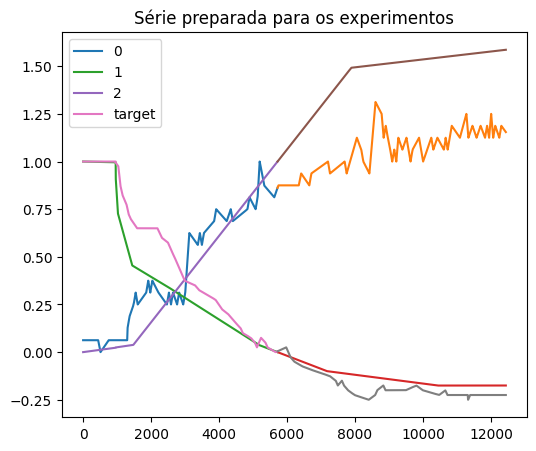

In [43]:
plt.figure(figsize=(6,5))
for i in range(train_x_norm.shape[1]):
    plt.plot(np.arange(0, n_train), train_x_norm[:,i], label=str(i))
    plt.plot(np.arange(n_train,n_train+n_test), test_x_norm[:,i])

plt.plot(np.arange(0, n_train), train_y_norm, label='target')
plt.plot(np.arange(n_train,n_train+n_test), test_y_norm)
ax = plt.title('Série preparada para os experimentos')
plt.legend()

In [44]:
test_x_norm[:4]

array([[ 8.61920000e-01,  0.00000000e+00,  1.00000000e+00],
       [ 8.62560000e-01, -6.88846986e-05,  1.00022317e+00],
       [ 8.63040000e-01, -1.37769397e-04,  1.00045055e+00],
       [ 8.63520000e-01, -2.05824160e-04,  1.00067793e+00]])

In [45]:
test_y_norm[:4]

array([0.00443615, 0.00452387, 0.00459906, 0.00468678])

In [46]:
# formato deve ser [samples, time steps, features]
def recurrent_array(data, target, time_steps=1):

    array_in = np.array(np.reshape(data, (-1, data.shape[1])), copy=True)
    array_out= np.array(np.reshape(target, (-1, 1)), copy=True)

    train_y_ts = array_out[time_steps:]
    train_x_ts = []
    for i in range(0, len(array_in) - time_steps):
        train_x_ts.append(array_in[i:i+time_steps])

    train_x_ts = np.array(train_x_ts)

    #rec_array = np.reshape(array, (array.shape[0], time_steps, array.shape[1]))
    return train_x_ts, train_y_ts

In [47]:
time_steps = 2

train_x_rec, train_y_rec = recurrent_array(train_x_norm, train_y_norm, time_steps=time_steps)
test_x_rec, test_y_rec = recurrent_array(test_x_norm, test_y_norm, time_steps=time_steps)

In [48]:
print('Dados de treinamento para rede recorrente')
print('Tamanho dos arrays de teste x e y')
print(train_x_rec.shape)
print(train_y_rec.shape)

print('\nPrimeiros 5 elementos de teste x e y')
print(test_x_rec[:5])
print(test_y_rec[:5])

no_features = train_x_rec.shape[2]
print('\nNúmero de features:', no_features)

Dados de treinamento para rede recorrente
Tamanho dos arrays de teste x e y
(5720, 2, 3)
(5720, 1)

Primeiros 5 elementos de teste x e y
[[[ 8.61920000e-01  0.00000000e+00  1.00000000e+00]
  [ 8.62560000e-01 -6.88846986e-05  1.00022317e+00]]

 [[ 8.62560000e-01 -6.88846986e-05  1.00022317e+00]
  [ 8.63040000e-01 -1.37769397e-04  1.00045055e+00]]

 [[ 8.63040000e-01 -1.37769397e-04  1.00045055e+00]
  [ 8.63520000e-01 -2.05824160e-04  1.00067793e+00]]

 [[ 8.63520000e-01 -2.05824160e-04  1.00067793e+00]
  [ 8.64000000e-01 -2.74708858e-04  1.00090531e+00]]

 [[ 8.64000000e-01 -2.74708858e-04  1.00090531e+00]
  [ 8.64640000e-01 -3.43593557e-04  1.00112848e+00]]]
[[0.00459906]
 [0.00468678]
 [0.00476196]
 [0.00484968]
 [0.00492487]]

Número de features: 3


## Statefullness

Ao considerar uma unidade recorrente como "*stateful*" estamos indicando que cada seleção de batch é a continuação da anterior.

Isso só é possível se usarmos batches sequenciais e sem embaralhamento (shuffle) por isso a recomendação anterior de usar batchsize 1 para predição do próximo instante de tempo.

O *stateful* também permite que a LSTM mantenha a memória mesmo quando usamos time_step=1, desde que os batches sejam sequenciais, de forma que cada posição do batch na iteração $j$ é uma continuação da mesma posição do batch $j-1$

Além disso:
* é preciso especificar na própria arquitetura o batch size
* o **batch_size tem que ser divisível** pelo total de exemplos de treinamento para não haver sobras no final da época
* **LayerNormalization** passa a ser necessário para evitar problemas com a magnitude do gradiente. Ao retirá-lo obtemos `nan` como valor de custo após algumas épocas

In [64]:
# decaimento de learning rate
def scheduler(epoch, lr):
    if (epoch >= 2):
        lr = np.round(lr * tf.math.exp(-0.02),8)
    print("%02d - learning rate %.8f" % (epoch+1, lr))
    return lr

callbacklr = tf.keras.callbacks.LearningRateScheduler(scheduler)

In [53]:
# checando batch size
print(train_x_rec.shape[0])
batch_size = 10
print(train_x_rec.shape[0]/batch_size)

5720
572.0


In [54]:
def model_LSTM_stateful(input_shape, stateful=True, hidden_units=16, do_rate=0.25):

    x = layers.Input(batch_input_shape=input_shape)

    lstm_1 = layers.LSTM(hidden_units, return_sequences=True,
                         activation='tanh', stateful=stateful)(x)
    lstm_1 = layers.LSTM(hidden_units,
                         activation='tanh', stateful=stateful)(lstm_1)
    feats = layers.LayerNormalization()(lstm_1)

    drop = layers.Dropout(do_rate)(feats)
    outputs = layers.Dense(1, trainable=True, activation='linear')(drop)
    model = tf.keras.models.Model(x, outputs)
    return model

In [72]:
modelStat = model_LSTM_stateful(input_shape=(batch_size, train_x_rec.shape[1], train_x_rec.shape[2]),
                                do_rate=0.25)
modelStat.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(10, 2, 3)]              0         
                                                                 
 lstm_8 (LSTM)               (10, 2, 16)               1280      
                                                                 
 lstm_9 (LSTM)               (10, 16)                  2112      
                                                                 
 layer_normalization_4 (Lay  (10, 16)                  32        
 erNormalization)                                                
                                                                 
 dropout_4 (Dropout)         (10, 16)                  0         
                                                                 
 dense_4 (Dense)             (10, 1)                   17        
                                                           

Nesse tipo de modelo, é mais indicado resetar os estados das unidades LSTM a cada época.
- caso queiramos fazer decrescer o learning rate, então também é preciso re-compilar o modelo com o valor a cada época

In [56]:
epochs = 8
no_features = 3

seed(1)
set_seed(1)

modelStat = model_LSTM_stateful(input_shape=(batch_size, train_x_rec.shape[1], train_x_rec.shape[2]),
                                do_rate=0.25)
# compilacao e treinamento
lr = 0.0001
hist_all = []
for i in range(epochs):
    lr = scheduler(i, lr)
    modelStat.compile(loss='mean_squared_error',
            optimizer=tf.keras.optimizers.AdamW(learning_rate=lr),
            metrics=['mae'])
    hist = modelStat.fit(train_x_rec, train_y_rec,
                  batch_size=batch_size, epochs=1,
                  shuffle=False,
                  verbose=1)
    modelStat.reset_states()

    hist_all.append(hist.history['loss'])

00 - learning rate 0.00010000
572/572 [==============================] - 7s 7ms/step - loss: 0.1684 - mae: 0.3114
01 - learning rate 0.00010000
572/572 [==============================] - 7s 6ms/step - loss: 0.0894 - mae: 0.2053
02 - learning rate 0.00010000
572/572 [==============================] - 8s 6ms/step - loss: 0.0317 - mae: 0.1221
03 - learning rate 0.00009802
572/572 [==============================] - 7s 6ms/step - loss: 0.0174 - mae: 0.0888
04 - learning rate 0.00009608
572/572 [==============================] - 7s 5ms/step - loss: 0.0123 - mae: 0.0748
05 - learning rate 0.00009418
572/572 [==============================] - 10s 10ms/step - loss: 0.0103 - mae: 0.0684
06 - learning rate 0.00009232
572/572 [==============================] - 13s 9ms/step - loss: 0.0093 - mae: 0.0652
07 - learning rate 0.00009049
572/572 [==============================] - 7s 7ms/step - loss: 0.0088 - mae: 0.0633


In [57]:
scores = modelStat.evaluate(train_x_rec, train_y_rec, batch_size=batch_size, verbose=0)
print('Scores treinamento')
print('MSE: %.4f' % (scores[0]))
print('MAE: %.4f' % (scores[1]))

Scores treinamento
MSE: 0.0121
MAE: 0.0861


In [58]:
# ERRO - batchsize foi fixado no modelo e ao tentar usar o padrao, falhará
#scoresT = modelStat.evaluate(test_x_rec, test_y_rec, verbose=0)
#print('Scores test')
#print('MSE: %.4f' % (scoresT[0]))
#print('MAE: %.4f' % (scoresT[1]))

Como o modelo foi criado com batch_size fixo e relacionado ao conjunto de treinamento, depois não conseguimos usá-lo para outras inferências e testes

Assim é preciso criar um novo modelo com batch_size=1 e setar os pesos do modelo treinado

In [59]:
new_batch_size = 1

inference_model = model_LSTM_stateful(input_shape=(new_batch_size, train_x_rec.shape[1], train_x_rec.shape[2]),
                                      do_rate=0.25)

inference_model.compile(loss='mean_squared_error',
            optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001),
            metrics=['mae'])

# copia pesos do modelo anterior
pesos_modelo = modelStat.get_weights()
inference_model.set_weights(pesos_modelo)

In [83]:
scoresT = inference_model.evaluate(test_x_rec, test_y_rec,
                                   batch_size=new_batch_size, verbose=0)
print('Scores test')
print('MSE: %.4f' % (scoresT[0]))
print('MAE: %.4f' % (scoresT[1]))

Scores test
MSE: 0.0040
MAE: 0.0571


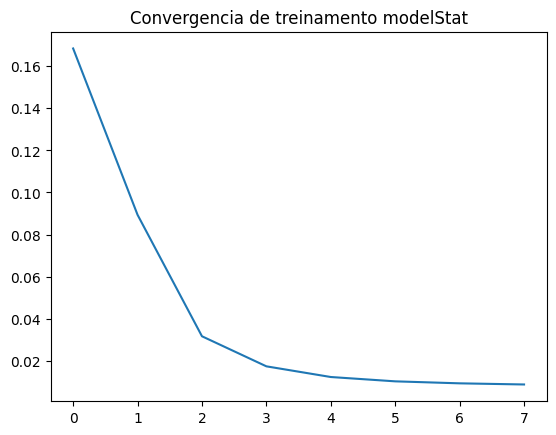

In [61]:
plt.plot(hist_all)
ax = plt.title('Convergencia de treinamento modelStat')

In [62]:
# realiza predicoes com os dados de treinamento e teste
train_y_predS = inference_model.predict(train_x_rec, batch_size=new_batch_size)
train_y_predS = np.reshape(train_y_predS, (-1, 1))[time_steps:]

test_y_predS = inference_model.predict(test_x_rec, batch_size=new_batch_size)
test_y_predS = np.reshape(test_y_predS, (-1, 1))[time_steps:]

6717/6717 [==============================] - 20s 3ms/step


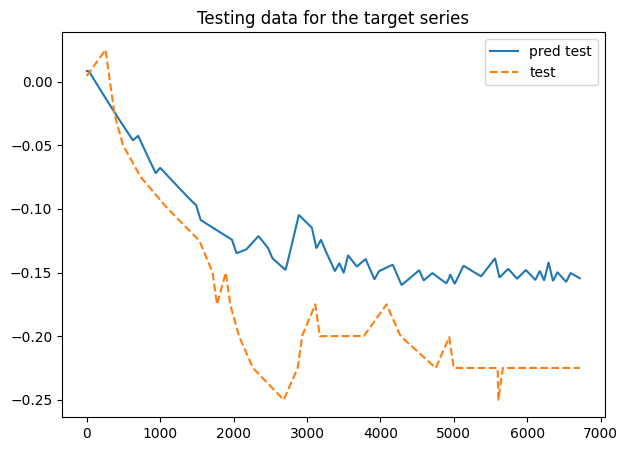

In [65]:
fig = plt.figure(figsize=(7,5))
plt.plot(np.arange(time_steps,len(test_y_predS)+time_steps),
         test_y_predS, label='pred test')
plt.plot(test_y_norm, '--', label='test')
plt.legend()
axt = plt.title('Testing data for the target series')
plt.show()

In [74]:
seed(1)
set_seed(1)

modelL = model_LSTM_stateful(input_shape=(batch_size, train_x_rec.shape[1], train_x_rec.shape[2]),
                                stateful=False,  do_rate=0.25)
epochs = 8
no_features = 3

# compilacao e treinamento
lr = 0.0001

modelL.compile(loss='mean_squared_error',
            optimizer=tf.keras.optimizers.AdamW(learning_rate=lr),
            metrics=['mae'])
hist_all2 = modelL.fit(train_x_rec, train_y_rec,
                  batch_size=batch_size, epochs=epochs,
                  callbacks=[callbacklr],
                  shuffle=False,
                  verbose=1)

00 - learning rate 0.00010000
Epoch 1/8
572/572 [==============================] - 7s 6ms/step - loss: 0.2249 - mae: 0.3146 - lr: 1.0000e-04
01 - learning rate 0.00010000
Epoch 2/8
572/572 [==============================] - 3s 6ms/step - loss: 0.0379 - mae: 0.1309 - lr: 1.0000e-04
02 - learning rate 0.00009802
Epoch 3/8
572/572 [==============================] - 3s 6ms/step - loss: 0.0225 - mae: 0.1045 - lr: 9.8020e-05
03 - learning rate 0.00009608
Epoch 4/8
572/572 [==============================] - 4s 6ms/step - loss: 0.0162 - mae: 0.0896 - lr: 9.6080e-05
04 - learning rate 0.00009418
Epoch 5/8
572/572 [==============================] - 3s 6ms/step - loss: 0.0135 - mae: 0.0821 - lr: 9.4180e-05
05 - learning rate 0.00009232
Epoch 6/8
572/572 [==============================] - 3s 6ms/step - loss: 0.0109 - mae: 0.0743 - lr: 9.2320e-05
06 - learning rate 0.00009049
Epoch 7/8
572/572 [==============================] - 4s 6ms/step - loss: 0.0102 - mae: 0.0712 - lr: 9.0490e-05
07 - learning

In [82]:
scores2 = modelL.evaluate(train_x_rec, train_y_rec, batch_size=batch_size, verbose=0)
scoresT2 = modelL.evaluate(test_x_rec, test_y_rec,
                                   batch_size=batch_size, verbose=0)
print('Scores treinamento')
print('MSE: %.4f' % (scores2[0]))
print('MAE: %.4f' % (scores2[1]))

print('Scores test')
print('MSE: %.4f' % (scoresT2[0]))
print('MAE: %.4f' % (scoresT2[1]))

Scores treinamento
MSE: 0.0054
MAE: 0.0601
Scores test
MSE: 0.0072
MAE: 0.0764


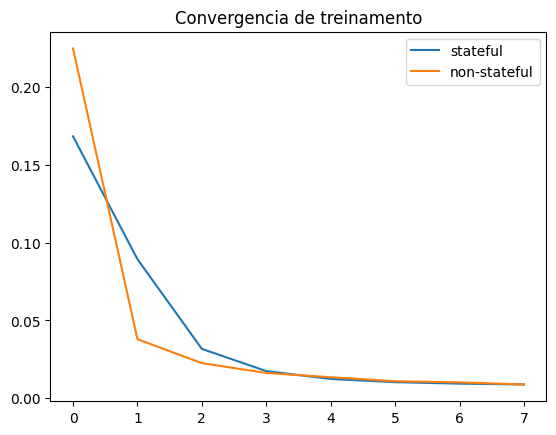

In [78]:
plt.plot(hist_all, label='stateful')
plt.plot(hist_all2.history['loss'], label='non-stateful')
plt.legend()
ax = plt.title('Convergencia de treinamento')

In [79]:
# realiza predicoes com os dados de treinamento e teste
train_y_predL = modelL.predict(train_x_rec, batch_size=batch_size)
train_y_predL = np.reshape(train_y_predL, (-1, 1))[time_steps:]

test_y_predL = modelL.predict(test_x_rec, batch_size=batch_size)
test_y_predL = np.reshape(test_y_predL, (-1, 1))[time_steps:]

672/672 [==============================] - 2s 3ms/step


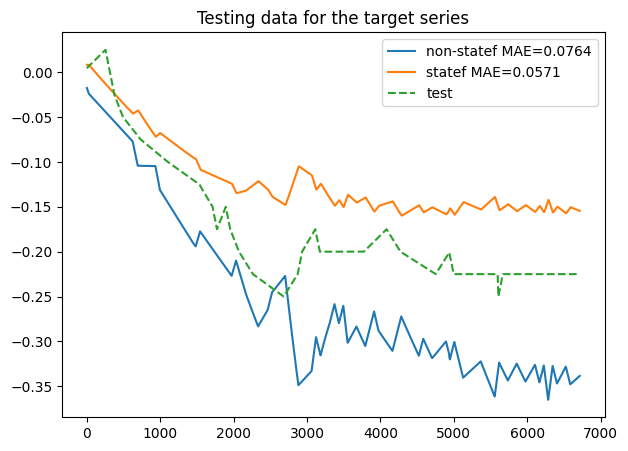

In [85]:
fig = plt.figure(figsize=(7,5))
plt.plot(np.arange(time_steps,len(test_y_predL)+time_steps),
         test_y_predL, label=f'non-statef MAE={scoresT2[1]:.4f}')
plt.plot(np.arange(time_steps,len(test_y_predS)+time_steps),
         test_y_predS, label=f'statef MAE={scoresT[1]:.4f}')
plt.plot(test_y_norm, '--', label='testing')
plt.legend()
axt = plt.title('Testing data for the target series')
plt.show()

## <span style="color:darkred">Módulo 6 - Redes neurais para texto</span>
### <span style="color:darkred">Avaliação (com soluções)</span>

---
### Questão 1)

A abordagem word2vec gera um vetor numérico para cada palavra, permitindo processar texto com redes neurais. Essa abordagem resulta em representações vetoriais como por exemplo Glove e FastText, cujo espaço de característica apresenta qual característica principal?

 (a) Palavras que ocorrem com maior frequência no texto onde foram aprendidas possuem maior valor na representação final<br>
 (b) Palavras estão organizadas no espaço de forma associada à classe do documento em que foram obtidas no conjunto de treinamento, ou seja, formam grupos com outras palavras de acordo com o rótulo do texto de origem.<br>
 (c) Palavras que aparecem em uma determinada ordem no texto em que forem treinadas, considerando uma janela de palavras, estarão na mesma ordem em cada direção vetorial do espaço de características do word2vec.<br>
 (d) Palavras que são classificadas corretamente com relação à análise morfológica (ex. substantivos, verbos, adjetivos, etc.), aparecem próximas no espaço de caracerísticas<br>
 <font color='red'>(e) Palavras que aparecem próximas uma das outras nas sentenças dos textos em que foram treinados, estarão também próximas no espaço de características do word2vec<br></font>


  **Justificativa**: A abordagem tem como principal característica capturar o contexto linguístico de forma não supervisionada, ou seja palavras que aparecem próximas nas sentenças também serão próximas. A alternativa (a) é incorreta pois define o método TF-IDF, a alternativa (b) é incorreta pois abordagens word-embedding baseadas em skipgrams não utilizam rotulação, e a alternativa (c) é incorreta pois o objetivo do word2vec não é aprender a mesma ordenação nas direções vetoriais e sim aproximar (independente da ordem) palavras que aparecem em contextos similares, (d) pelo mesmo motivo que a alternativa (b) não há dependência de rótulo ou tarefa de classificação.

---

### Questão 2)

O que o mecanismo de atenção aprende com base em uma entrada no caso de dados de texto?

(a) Define quais palavras, individualmente, ao longo de uma sequência serão processadas, e quais serão ignoradas, para produzir cada saída da camada de atenção, similar a uma camada de "dropout" aplicada numa entrada composta por palavras.<br>
(b) Uma representação vetorial única para cada palavra de um determinado vocabulário<br>
<font color='red'>(c) Uma representação vetorial que captura o contexto entre as palavras de forma que é possível saber quais palavras estão mais relacionadas à outras.<br></font>
(d) Uma memória que é aprendida ao longo das iterações (dados sequenciais) de forma que um histórico de todas as iterações anteriores é usada em cada iteração para computar as saídas.<br>
(e) Uma combinação linear da palavra atual de uma sentença com as palavras anteriores utilizando uma codificação posicional (positional encoding).<br>

**Justificativa:** O mecanismo de atenção, no caso de um texto, captura relações entre as palavras de forma a entender o contexto mesmo quando as palavras não estejam imediatamente próximas. As alternativas incorretas são (a) o mecanismo não define palavras a ser ignoradas como em um dropout, (b) não há relação com a taxa de amostragem dos tokens, (d) a memória aprendida está relacionada com camadas recorrentes, (e) a combinação linear com positional encoding faz parte da arquitetura Transformer mas não é parte do mecanismo de atenção em si.

---

### Questão 3)

Qual o papel do Positional Encoding em arquiteturas do tipo Transformer?<br>

<font color='red'>(a) Modificar os valores de entrada de forma que a rede neural tenha uma informação sobre sua posição relativa, visto que as camadas de atenção não possuem recorrência<br></font>
(b) Determinar a posição correta das palavras em uma sentença embaralhada, visto que nas arquiteturas Transformer é comum aleatorizar a ordem dos tokens de entrada<br>
(c) Gerar o word embedding individual de cada palavra ou token de entrada, que irá ser transformado pela camada de atenção para gerar um embedding contextual<br>
(d) Processar os dados de entrada de forma a gerar uma combinação linear dos mesmos e passar à camada de atenção<br>
(e) Determinar qual cabeça de atenção irá processar cada palavra ou token de entrada, de forma que seja possível paralelizar o processamento de toda a sentença<br>

**Justificativa**:

---

### Questão 4)

Qual alternativa melhor descreve e compara os métodos GPT (Generative Pretrained Transformer) e BERT (Bidirectional Encoder Representations from Transformers)?<br>

<font color='red'>(a) O BERT permite o pré-treinamento de encoders transformer para posterior uso em aplicações gerais, enquanto o GPT permite o pré-treinamento de decoders transformer para posterior uso em tarefas de predição do próximo token de texto de forma autoregressiva<br></font>
(b) O BERT permite o pré-treinamento de encoders transformer para posterior uso unicamente em tarefas de classificação, enquanto o GPT permite o pré-treinamento de encoders transformer para posterior uso unicamente na extração autoregressiva de embeddings de palavras<br>
(c) O BERT permite o pré-treinamento de encoders transformer para posterior uso unicamente em tarefas de classificação, enquanto o GPT permite o pré-treinamento de decoders transformer para posterior uso unicamente em aplicações de perguntas e respostas<br>
(d) O BERT permite o pré-treinamento de encoders transformer para posterior uso para tarefas de tradução entre idiomas, enquanto o GPT permite o pré-treinamento de decoders transformer para posterior uso unicamente em tarefas de classificação<br>
(e) O BERT permite o pré-treinamento de decoders transformer autoregressivos para posterior uso em aplicações gerais, enquanto o GPT permite o pré-treinamento de encoders transformer bidirecionais para posterior em tarefas de predição de próximo token de texto.<br>

**Justificativa**:

In [ ]:
,

---

### Questão 5)

Carregue o word embedding `skip_s50` (do tipo Fasttext Skipgram) em Português do NILC, conforme visto em aula, e obtenha os word embeddings das palavras:
'ventilador', 'ar-condicionado', 'geladeira', 'liquidificador', 'batedeira', 'celular', 'computador', 'lavadora', 'panela'

Produza uma projeção em 2 dimensões utilizando o algoritmo TSNE com os parâmetros:  n_components=2 learning_rate="auto", perplexity=4,init="random" random_state=1, e visualize os embeddings das palavras em um scatterplot. A seguir, utilize a distância do Cosseno para computar as palavras mais próximas da palavra 'ventilador' (excluindo a própria palavra) utilizando (1) o espaço word embedding original de 50 dimensões e (2) o espaço reduzido pelo TNSE com 2 dimensões. Quais são essas palavras, em ordem (iniciando pela menor distância)?

OBS: lembrar que a distância do cosseno observa o ângulo entre os vetores

(a) Espaço 50-d: geladeira, ar-condicionado; Espaço 2-d: ar-condicionado, geladeira <br>
(b) Espaço 50-d: ar-condicionado, geladeira; Espaço 2-d: ar-condicionado, geladeira<br>
(c) Espaço 50-d: ar-condicionado, liquidificador; Espaço 2-d: geladeira, liquidificador <br>
(d) Espaço 50-d: geladeira, liquidificador; Espaço 2-d: liquidificador, computador<br>
<font color='red'>(e) Espaço 50-d: ar-condicionado, geladeira; Espaço 2-d: ar-condicionado, computador<br></font>

 **Justificativa**: Ver código abaixo.

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import pandas as pd

from tensorflow import keras
from tensorflow.keras import layers
from numpy.random import seed
from tensorflow.random import set_seed

In [2]:
# descomente a linha abaixo para baixar o arquivo na primeira vez (demora um pouco)
!wget http://143.107.183.175:22980/download.php?file=embeddings/fasttext/skip_s50.zip

--2023-11-01 08:36:47--  http://143.107.183.175:22980/download.php?file=embeddings/fasttext/skip_s50.zip
Connecting to 143.107.183.175:22980... connected.
HTTP request sent, awaiting response... 200 OK
Length: 162531753 (155M) [application/octet-stream]
Saving to: ‘download.php?file=embeddings%2Ffasttext%2Fskip_s50.zip’

download.php?file=e 100%[===================>] 155.00M  7.60MB/s    in 23s     

2023-11-01 08:37:10 (6.81 MB/s) - ‘download.php?file=embeddings%2Ffasttext%2Fskip_s50.zip’ saved [162531753/162531753]



In [3]:
# descomente abaixo para a primeira execucao (renomear arquivo + realizar unzip)
!mv download.php?file=embeddings%2Ffasttext%2Fskip_s50.zip skip_s50.zip
!unzip -q skip_s50.zip

In [4]:
path_to_glove_file = "./skip_s50.txt"

embeddings_index = {}
with open(path_to_glove_file) as f:
    for line in f:
        word, coefs = line.split(maxsplit=1)
        coefs = np.fromstring(coefs, "f", sep=" ")
        embeddings_index[word] = coefs

print("Encontrados %s word vectors." % len(embeddings_index))

<ipython-input-4-ab062c2068ae>:7: DeprecationWarning: string or file could not be read to its end due to unmatched data; this will raise a ValueError in the future.
  coefs = np.fromstring(coefs, "f", sep=" ")


Encontrados 929594 word vectors.


In [5]:
palavras = ['ventilador', 'ar-condicionado',
            'geladeira', 'liquidificador', 'batedeira',
            'celular', 'computador', 'lavadora', 'panela']

embedd = []
for p in palavras:
    embedd.append(embeddings_index[p])

embedd = np.array(embedd)

In [6]:
from sklearn.manifold import TSNE
from sklearn.metrics.pairwise import cosine_distances

In [7]:
t_sne = TSNE(
    n_components=2,
    learning_rate="auto",
    perplexity=4,
    init="random",
    random_state=1
)

tnse_words = t_sne.fit_transform(embedd)

(-140.0, 140.0)

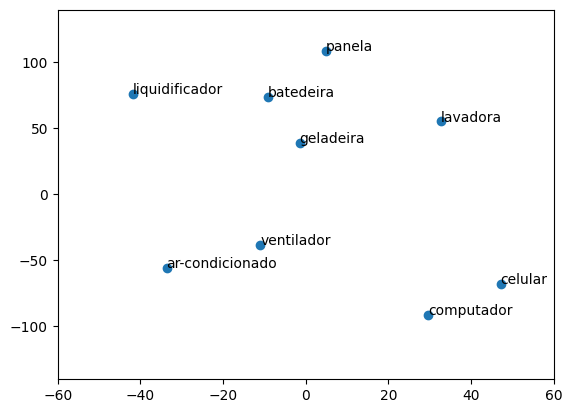

In [8]:
fig, ax = plt.subplots()
scatter = ax.scatter(tnse_words[:,0], tnse_words[:,1])
for i, txt in enumerate(palavras):
    ax.annotate(txt, (tnse_words[i,0], tnse_words[i,1]))

plt.xlim(-60, 60)
plt.ylim(-140, 140)

In [9]:
dmat = cosine_distances(embedd)
np.fill_diagonal(dmat, np.inf)

dmatemb = cosine_distances(tnse_words)
np.fill_diagonal(dmatemb, np.inf)

palavras_base = [0]
n_vizinhos = 2

for p in palavras_base:
    print('-', palavras[p])
    print('\tfasttext 50d : ', end='')
    for i in range(n_vizinhos):
        prox = np.argmin(dmat[p,:])
        print('%d. %s (d=%.3f)\t' % (i+1,palavras[prox],dmat[p,prox]), end='')
        dmat[p, prox] = np.inf
    print('\n\ttnse 2d      : ', end='')
    for i in range(n_vizinhos):
        prox = np.argmin(dmatemb[p,:])
        print('%d. %s (d=%.3f)\t' % (i+1,palavras[prox],dmatemb[p,prox]), end='')
        dmatemb[p,prox] = np.inf
    print()

- ventilador
	fasttext 50d : 1. ar-condicionado (d=0.149)	2. geladeira (d=0.224)	
	tnse 2d      : 1. ar-condicionado (d=0.035)	2. computador (d=0.171)	


## <span style="color:darkred">Módulo 6 - Redes neurais para texto</span>
### <span style="color:darkred">Exercícios (com soluções)</span>

---

### Exercício 1)


Com relação ao processamento de dados sequenciais, ou seja, em que a ordem das observações importa e dá sentido aos dados, considere as seguintes premissas realizadas por diferentes camadas de redes neurais.

I - com base na similaridade cruzada entre elementos sequenciais da entrada, aprendendo uma ponderação para cada elemento que leva à uma representação contextual dos mesmos na saída de cada posição<br>
II - assume que os dados de entrada não estão ordenados e aprende a partir de qualquer permutação dos dados sequenciais<br>
III - utiliza uma memória para armazenar valores das ativações de todos os dados anteriores (ao longo das iterações) e com isso considerar a sequência dos dados na saída de cada posição<br>
IV - realiza uma combinação ponderada das features de cada entrada, produzindo valores de  saída para cada elemento individualmente ao longo das iterações<br>

Associe as premissas acima às camadas do tipo densa (D), recorrente (R), baseada em atenção (A).


 (a) I - A; II - R; III - D; IV - D<br>
 <font color='red'>(b) I - A; II - D; III - R; IV - D<br></font>
 (a) I - A; II - A; III - R; IV - D<br>
 (d) I - R; II - D; III - A; IV - D<br>

 **Justificativa**: D: camadas densas combinam (uma ponderação entre as features) as observações de entrada sem considerar sua ordem, aprendendo a partir de qualquer permutação observações de cada instância, estando relacionadas às premissas II e IV. R: unidades recorrentes são capazes de manter uma memória relativa a sequência (ou ordenação) dos dados, de forma que os pesos/parâmetros serão computados de forma a serem influenciados por dados observados anteriormente, relacionada à premissa III. A: utiliza o produto interno entre uma sequencia de elementos da entrada, e aprende um score de atenção que permite gerar uma representação contextualizada de cada elemento da sequencia com relação à todos os outros, relacionado à premissa I.


---

### Exercício 2)

O que assumimos ao usar um word-embedding pré-treinado (Skipgrams ou CBOWs como FastText, Glove) para uma nova tarefa de classificação como entrada para uma rede neural de classificação, em contraste com o uso de modelo pré-treinado do tipo BERT, para a mesma nova tarefa (diferente da usada no pré-treinamento)?

 (a) Word-embedding possui representações fixas (e individuais) por palavra as quais permanecerão fixas durante o treinamento da rede neural, enquanto que o BERT produz representações contextuais das palavras, as quais também permanecerão fixas durante o treinamento.<br>
 (b) Word-embedding possui representações fixas (e individuais) por palavra as quais permanecerão fixas durante o treinamento da rede neural, enquanto que o BERT produz representações contextuais das palavras, as quais podem ser opcionamente ajustadas durante o treinamento.<br>
 <font color='red'>(c) Word-embedding possui representações fixas (e individuais) por palavra as quais podem ser opcionamente ajustadas durante o treinamento da rede neural, enquanto que o BERT produz representações contextuais das palavras, as quais podem ser opcionamente ajustadas durante o treinamento.<br></font>
 (d) Word-embedding possui representações contextuais  das palavras, as quais podem ser opcionamente ajustadas durante o treinamento da rede neural, enquanto que o BERT produz representações fixas (e individuais) por palavra, as quais podem ser opcionamente ajustadas durante o treinamento.<br>

 **Justificativa**: Word-embeddings aprendem representações fixas e individuais por palavras, em contraste com o BERT cujas representações das palavras de entrada mudam a depender do contexto. Além disso, ao usar esses modelos pré-treinados, em ambos casos podemos opcionalmente permitir a adaptação da matriz de embeddings (no caso do Word Embedding), e das camadas de atenção (no caso do BERT) durante o treinamento de um classificador.

---

### Exercício 3)

Como se comparam os modelos BERT e GPT, considerando os modos autoregressivo vs bidirecional, sendo o texto é dividido em tokens (que podem ser por exemplo palavras ou trechos de palavras)?

 (a) Ambos permitem que o modelo analise todo o texto de entrada durante o processo de treinamento, porém durante inferência, enquanto o BERT segue utilizando todo o texto de entrada para produzir uma saída, o GPT utiliza cada saída atual como entrada para predizer o próximo token<br>
 (b) Ambos permitem que o modelo analise todo o texto de entrada durante o processo de treinamento, porém durante inferência, enquanto o GPT segue utilizando todo o texto de entrada para produzir uma saída, o BERT utiliza cada saída atual como entrada para predizer o próximo token<br>
 <font color='red'>(c) O BERT é treinado bidirecional utilizando todo o texto de entrada para produzir uma saída, e o GPT é autoregressivo, permite usar apenas os tokens anteriores para predizer o próximo. Ambos funcionam assim tanto em treinamento quanto em inferência.<br></font>
 (d) O BERT é treinado bidirecional utilizando todo o texto de entrada para produzir uma saída, e em inferência é autoregressivo, e o GPT é autoregressivo, utilizando cada saída atual como entrada para predizer o próximo token tanto em treinamento quanto em inferência.<br>

 **Justificativa**: O BERT usa o encoder do Transformer, o qual é bi-direcional e aplica o mecanismo de atenção sobre todos os tokens de entrada para permitir produzir a saída, para tarefas como classificação e perguntas/respostas. O GPT usa o decoder do Transformer, o qual é auto-regressivo e permite ver apenas os tokens anteriores para predizer o próximo.

---

### Exercício 4)

Carregue o arquivo `livro1.txt` conforme indicado abaixo, bem como o word embedding Glove com 50 dimensões em português utilizado em aula. Obtenha uma vetorização de texto com número máximo de tokens 5000 e tamanho da sentença com no máximo 30 tokens. A seguir obtenha a matriz de embeddings a partir das palavras desse arquivo e imprima palavras não convertidas. Qual a natureza da maior parte das palavras em que houveram falhas?

<font color='red'>(a) Palavras com hífens, números e em outro idioma<br></font>
(b) Nomes próprios e caracteres especiais isolados<br>
(c) Palavras com caracteres não codificados corretamente no UTF-16<br>
(d) Palavras em outro idioma e caracteres isolados<br>

 **Justificativa**: Veja abaixo. As palavras que usam hífens como em "queixava-se" deveriam ter sido pré-processadas e usando o vectorizer não foram reconhecidas. Também números e palavras em outros idiomas foram encontradas e não existem no vocabulário utilizado.

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import pandas as pd
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import models
from numpy.random import seed
from tensorflow.random import set_seed

In [ ]:
# colab ou execucao uma unica vez local
!wget http://143.107.183.175:22980/download.php?file=embeddings/glove/glove_s50.zip
!mv download.php?file=embeddings%2Fglove%2Fglove_s50.zip glove_s50.zip

--2023-11-01 08:52:14--  http://143.107.183.175:22980/download.php?file=embeddings/glove/glove_s50.zip
Connecting to 143.107.183.175:22980... connected.
HTTP request sent, awaiting response... 200 OK
Length: 181356545 (173M) [application/octet-stream]
Saving to: ‘download.php?file=embeddings%2Fglove%2Fglove_s50.zip’

download.php?file=e 100%[===================>] 172.96M  11.2MB/s    in 16s     

2023-11-01 08:52:31 (10.6 MB/s) - ‘download.php?file=embeddings%2Fglove%2Fglove_s50.zip’ saved [181356545/181356545]



In [ ]:
!unzip -q glove_s50.zip

In [ ]:
# codigo colab
path_to_glove_file = os.path.join(
    os.path.expanduser("~"), "/content/glove_s50.txt" # colab
)

# codigo local
#path_to_glove_file = "./glove_s50.txt"

embeddings_index = {}
with open(path_to_glove_file, encoding='utf8', mode='r') as f:
    for line in f:
        word, coefs = line.split(maxsplit=1)
        coefs = np.fromstring(coefs, "f", sep=" ")
        embeddings_index[word] = coefs

print("Encontrados %s word vectors." % len(embeddings_index))

<ipython-input-4-b412cc99fba8>:13: DeprecationWarning: string or file could not be read to its end due to unmatched data; this will raise a ValueError in the future.
  coefs = np.fromstring(coefs, "f", sep=" ")


Encontrados 929594 word vectors.


In [ ]:
df = pd.read_csv("livro1.txt", delimiter='[\n\r]+', header=None, engine='python')
df

,0
0,Os curiosos acontecimentos que são o objeto de...
1,"Segundo a opinião geral, estavam deslocados, j..."
2,"À primeira vista, Oran é, na verdade, uma cida..."
3,"A própria cidade, vamos admiti-lo, é feia"
4,"com seu aspecto tranquilo, é preciso algum tem..."
...,...
538,"Queimava, na verdade, mas nem mais nem menos d..."
539,Toda a cidade estava com febre
540,Era essa pelo menos a impressão que perseguia ...
541,Mas essa impressão parecia-lhe insensata


In [ ]:
texto = np.array(df)
print(texto[:5])
print(texto.shape)

[['Os curiosos acontecimentos que são o objeto desta crônica ocorreram em 194x, em Oran']
 ['Segundo a opinião geral, estavam deslocados, já que saíam um pouco do comum']
 ['À primeira vista, Oran é, na verdade, uma cidade comum e não passa de uma prefeitura francesa na costa argelina']
 ['A própria cidade, vamos admiti-lo, é feia']
 ['com seu aspecto tranquilo, é preciso algum tempo para se perceber o que a torna diferente de tantas outras cidades comerciais em todas as latitudes']]
(543, 1)


In [ ]:
seed(1)
set_seed(2)

from tensorflow.keras.layers.experimental.preprocessing import TextVectorization

vectorizer = TextVectorization(max_tokens=5000, output_sequence_length=30)
text_ds = tf.data.Dataset.from_tensor_slices(texto).batch(16)
vectorizer.adapt(text_ds)

voc = vectorizer.get_vocabulary()
word_index = dict(zip(voc, range(len(voc))))

In [ ]:
num_tokens = len(voc) + 2
print("Número de tokens: ", num_tokens)
embedding_dim = 50
convertidas = 0
falhas = 0

embedding_matrix = np.zeros((num_tokens, embedding_dim))
print(embedding_matrix.shape)
for word, i in word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        if (embedding_vector.shape[0] != embedding_dim):
            falhas += 1
        else:
            embedding_matrix[i] = embedding_vector
            convertidas += 1
    else:
        falhas += 1
        print(word)

print("Palavras convertidas: %d / não convertidas: %d)" % (convertidas, falhas))

Número de tokens:  2194
(2194, 50)

[UNK]
à
É
tarrou
às
À
paneloux
cottard
vigiálo
tinhamno
respondilhe
ransdoc
queixavase
ocupouse
acompanhouo
18
voltavalhe
veiolhe
veemse
têlos
tratarao
tinhamlhe
sentilo
sentiamse
sentase
saintjust
ríchard
reúnemse
purgava
proíboo
preparavase
perdiase
percebese
pareceralhe
parecelhe
ouviamse
olhavaos
ocupamse
obrigavao
leválas
lançarse
jogouse
isolálo
interrogálo
interessamse
instalavaa
instalamse
inquietarse
inclinavase
gracejadores
fungosidades
frontdemer
fixarase
fechála
faziao
explicarlhe
exigiamse
esperouos
escarrara
encontrálos
encontrála
encontravamnos
empoleirarse
dãolhe
distraise
dirseia
detevese
desconhecese
desateio
demorouse
deitese
darmes
curvavamse
cuidese
contemplouo
consolálo
compreendiase
carroleito
boulomanes
bemeducados
bemeducada
aviseme
atribuíaa
atirálos
atirouse
assuou
apressavamse
apoiavase
apertoulhe
amicales
alastravamse
agravouse
agitouse
afligiase
afastase
adormecese
admitilo
acusavamse
acalmese
abraçoua
abateramse
30
28
2

---

### Exercício 5)


A matriz de embedding  (`embedding_matrix`) contém a mesma representação para uma dada palavra do que o índice de embedding  (`embedding_index`), mas a quantidade de elementos da matriz é limitada ao vocabulário da base de dados que estamos trabalhando. Imprima a quantidade de elementos em ambos para conferir a diferença.

Utilize a configuração obtida no exercício anterior (base de texto e word embedding carregados), e obtenha os índices das palavras: `rato`, `médico`, `cidade` e `febre` calculados pelo vetorizador.

A seguir, obtenha a soma da diferença absoluta (ou distância L1) entre as representações da palavra `rato` e aqueles obtidos por meio dos índices encontrados das palavras `médico`, `ouro`, `cidade` e `febre` na matriz de embedding (`embedding_matrix`), ou seja, dentre as palavras convertidas.

Qual palavra, das citadas acima dentro do vocabulário, é mais próxima de `rato` segundo o word embedding utilizado?

<font color='red'>(a) Febre<br></font>
(b) Ouro<br>
(c) Médico<br>
(d) Médico e Febre empatados<br>

 **Justificativa**: Veja abaixo, a palavra "ouro" não está no vocabulário, sendo atribuído o índice 1. Assim, a palavra mais próxima dentro do vocabulário é "Febre"

In [ ]:
print("Tamanho do índice: ", len(embeddings_index))
print("Tamanho da matriz: ", embedding_matrix.shape[0])

Tamanho do índice:  929594
Tamanho da matriz:  2194


In [ ]:
output = vectorizer([["rato médico ouro cidade febre"]])
output

<tf.Tensor: shape=(1, 30), dtype=int64, numpy=
array([[ 82,  33,   1,  27, 110,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0]])>

In [ ]:
print("Médico: ", np.sum(np.abs(embedding_matrix[33]-embedding_matrix[82])))
print("Cidade: ", np.sum(np.abs(embedding_matrix[27]-embedding_matrix[82])))
print("Ouro: ", np.sum(np.abs(embedding_matrix[1]-embedding_matrix[82])))
print("Febre: ", np.sum(np.abs(embedding_matrix[110]-embedding_matrix[82])))

Médico:  33.421877262182534
Cidade:  39.917805386241525
Ouro:  22.207107034511864
Febre:  31.358608989976346


---

### Exercício 6)

Word2Vec com aprendizado de uma rede recorrente para classificação de sentenças.

Iremos treinar uma rede neural capaz de diferenciar frases de dois livros diferentes, contidos nos arquivos `livro1.txt` e `livro2.txt`.

Com base no processo realizado nos exercícios anteriores, carregue os arquivos citados. Gere o vetorizador com máximo de tokens 5000 e sequência com máximo de 60 elementos/tokens e realize a conversão com os textos de ambos os livros em conjunto.

Depois crie o conjunto de treinamento e teste da seguinte forma:
* o conjunto de treinamento terá as 75% primeiras frases do livro1 seguida das 75% primeiras frases do livro2
* o conjunto de teste terá as 25% frases restantes do livro1 seguida das 25% frases restantes do livro 2
* monte vetores com os rótulos de treinamento e teste de forma que livro 1 seja a classe 0 e livro 2 seja a classe 1.

Projete uma rede Recorrente com as seguintes camadas (todas com ativação ReLU exceto especificado outra)
* Embedding layer
* GRU com 64 unidades e ativação relu
* Dropout com taxa 25%
* Densa com 1 unidade e ativação sigmoide

Configure as sementes com seed(1) e set_seed(2), depois compile com a função entropia cruzada binária, otimizador adam (com seus parâmetros padrão) e compute a acurácia. Treine por 20 épocas com batch size 16.

Após o treinamento, o valor da acurácia no conjunto de teste (use o método `evaluate`) estão em qual intervalo?

(a) [95, 100]<br>
<font color='red'>(c) [85, 91]<br></font>
(b) [72, 79]<br>
(d) [60, 67]<br>

 **Justificativa**: Veja abaixo o código

In [ ]:
df1 = pd.read_csv("livro1.txt", delimiter='[\n\r]+', header=None, engine='python')
df1

,0
0,Os curiosos acontecimentos que são o objeto de...
1,"Segundo a opinião geral, estavam deslocados, j..."
2,"À primeira vista, Oran é, na verdade, uma cida..."
3,"A própria cidade, vamos admiti-lo, é feia"
4,"com seu aspecto tranquilo, é preciso algum tem..."
...,...
538,"Queimava, na verdade, mas nem mais nem menos d..."
539,Toda a cidade estava com febre
540,Era essa pelo menos a impressão que perseguia ...
541,Mas essa impressão parecia-lhe insensata


In [ ]:
df2 = pd.read_csv("livro2.txt", delimiter='[\n\r]+', header=None, engine='python')
df2

,0
0,No princípio era o Verbo e o Verbo estava junt...
1,Ele estava no princípio junto a Deus e dever d...
2,Mas videmus nunc per speculum et in aenigmate ...
3,"Chegando ao fim desta minha vida de pecador, e..."
4,Conceda-me o Senhor a graça de ser testemunha ...
...,...
96,"Pela mole, e pela forma, o Edifício me pareceu..."
97,"E é sorte que, sendo uma límpida manhã de inve..."
98,Não direi de modo algum que ela sugerisse sent...
99,"Trouxe-me espanto, e uma inquietação sutil"


In [ ]:
texto1 = np.array(df1)
print(texto1[:5])
print(texto1.shape)

texto2 = np.array(df2)
print(texto2[:5])
print(texto2.shape)

[['Os curiosos acontecimentos que são o objeto desta crônica ocorreram em 194x, em Oran']
 ['Segundo a opinião geral, estavam deslocados, já que saíam um pouco do comum']
 ['À primeira vista, Oran é, na verdade, uma cidade comum e não passa de uma prefeitura francesa na costa argelina']
 ['A própria cidade, vamos admiti-lo, é feia']
 ['com seu aspecto tranquilo, é preciso algum tempo para se perceber o que a torna diferente de tantas outras cidades comerciais em todas as latitudes']]
(543, 1)
[['No princípio era o Verbo e o Verbo estava junto a Deus, e o Verbo era Deus']
 ['Ele estava no princípio junto a Deus e dever do monge fiel seria repetir cada dia com salmodiante humildade o único evento imodificável do qual se pode confirmar a incontrovertível verdade']
 ['Mas videmus nunc per speculum et in aenigmate e a verdade, em vez de cara a cara, manifesta-se deixando às vezes rastros (ai, quão ilegíveis) no erro do mundo, tanto que precisamos calculá-lo, soletrando os verdadeiros sinais

In [ ]:
texto_integrado = np.vstack((texto1, texto2))

In [ ]:
seed(1)
set_seed(2)

from tensorflow.keras.layers.experimental.preprocessing import TextVectorization

vectorizer2 = TextVectorization(max_tokens=5000, output_sequence_length=60)
text_ds2 = tf.data.Dataset.from_tensor_slices(texto_integrado).batch(16)
vectorizer2.adapt(text_ds2)

voc2 = vectorizer2.get_vocabulary()
word_index2 = dict(zip(voc2, range(len(voc2))))

In [ ]:
num_tokens = len(voc2) + 2
print("Número de tokens: ", num_tokens)
embedding_dim = 50
convertidas = 0
falhas = 0

embedding_matrix2 = np.zeros((num_tokens, embedding_dim))
print(embedding_matrix2.shape)
for word, i in word_index2.items():
    embedding_vector2 = embeddings_index.get(word)
    if embedding_vector2 is not None:
        if (embedding_vector2.shape[0] != embedding_dim):
            falhas += 1
        else:
            embedding_matrix2[i] = embedding_vector2
            convertidas += 1
    else:
        falhas += 1

print("Palavras convertidas: %d / não convertidas: %d)" % (convertidas, falhas))

Número de tokens:  3200
(3200, 50)
Palavras convertidas: 3025 / não convertidas: 173)


In [ ]:
from tensorflow.keras.layers import Embedding

embedding_layer = Embedding(
    num_tokens,
    embedding_dim,
    embeddings_initializer=keras.initializers.Constant(embedding_matrix2),
    trainable=False,
)

In [ ]:
validation_split = 0.25

# texto 1
num_validation1 = int(validation_split * len(texto))
num_train1 = int((1-validation_split) * len(texto))

x_train1 = texto[:-num_validation1]
y_train1 = np.zeros(num_train1+1)
x_val1 = texto[-num_validation1:]
y_val1 = np.zeros(num_validation1)
print("Texto 1:")
print("train (x,y): %d,%d" % (x_train1.shape[0], y_train1.shape[0]))
print("val (x,y): %d,%d" % (x_val1.shape[0], y_val1.shape[0]))

# texto 2
num_validation2 = int(validation_split * len(texto2))
num_train2 = int((1-validation_split) * len(texto2))
x_train2 = texto2[:-num_validation2]
y_train2 = np.ones(num_train2+1)
x_val2 = texto2[-num_validation2:]
y_val2 = np.ones(num_validation2)
print("Texto 2:")
print("train (x,y): %d,%d" % (x_train2.shape[0], y_train2.shape[0]))
print("val (x,y): %d,%d" % (x_val2.shape[0], y_val2.shape[0]))

Texto 1:
train (x,y): 408,408
val (x,y): 135,135
Texto 2:
train (x,y): 76,76
val (x,y): 25,25


In [ ]:
# juntando textos
x_train = np.vstack((x_train1, x_train2))
x_val = np.vstack((x_val1, x_val2))
print(x_train.shape)
print(x_val.shape)

y_train = np.concatenate((y_train1, y_train2))
y_val = np.concatenate((y_val1, y_val2))

(484, 1)
(160, 1)


In [ ]:
# vetorizacao dos dados
x_train_net = vectorizer2(np.array([s for s in x_train])).numpy()
x_val_net = vectorizer2(np.array([s for s in x_val])).numpy()

print(x_train_net.shape)
print(x_val_net.shape)

(484, 60)
(160, 60)


In [ ]:
def GRU_texto():
    int_sequences_input = keras.Input(shape=(None,), dtype="int64")
    embedded_sequences = embedding_layer(int_sequences_input)
    x = layers.GRU(32, activation="relu")(embedded_sequences)
    x = layers.Dense(32, activation="relu")(x)
    x = layers.Dropout(0.25)(x)
    predsGRUout = layers.Dense(1, activation="sigmoid")(x)
    modelGRU = keras.Model(inputs=int_sequences_input, outputs=predsGRUout)
    return modelGRU

In [ ]:
seed(1)
set_seed(2)
modelGRU = GRU_texto()
modelGRU.summary()

modelGRU.compile(
    loss="binary_crossentropy", optimizer="adam", metrics=["acc"]
)
modelGRU.fit(x_train_net, y_train, batch_size=16, epochs=15,
             validation_data=(x_val_net, y_val))

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None)]            0         
                                                                 
 embedding (Embedding)       (None, None, 50)          160000    
                                                                 
 gru (GRU)                   (None, 32)                8064      
                                                                 
 dense (Dense)               (None, 32)                1056      
                                                                 
 dropout (Dropout)           (None, 32)                0         
                                                                 
 dense_1 (Dense)             (None, 1)                 33        
                                                                 
Total params: 169153 (660.75 KB)
Trainable params: 9153 (35.7

In [ ]:
scores = modelGRU.evaluate(x_val_net, y_val, verbose=0)
print("Perda validação: %f" % (scores[0]))
print("Acurácia validação: %f" % (scores[1]))

Perda validação: 0.368015
Acurácia validação: 0.862500


---

### Exercício 7)

Word2Vec com aprendizado de uma rede totalmente convolucional, com convoluções dilatadas para classificação de sentenças.

Considere o mesmo problema anteriormente abordado no exercício anterior. Agora vamos utilizar uma redes com convoluções dilatadas que é um método para ampliar o campo receptivo local e reduzir número de operações, utilizada por exemplo para aplicações com áudio (como a WaveNet) de forma a combinar regiões cada vez mais amplas dos dados de entrada. No entanto é também aplicável para outros dados sequenciais como texto.

Veja uma explicação em: https://www.paperswithcode.com/method/dilated-convolution

Projete uma rede neural, a qual chamaremos Conv, com as seguintes camadas
* Embedding layer
* Conv1D com 32 filtros de tamanho 3, zeropadding e parâmetro `dilation_rate=2`, ativação relu
* Camada Flatten: *como temos a entrada representada por (batch_size, seq_len, 1), a saída será (batch_size, seq_len, 1), por isso precisamos de uma camada flatten para achatar as dimensões e permitir uma saída (batch_size, 1)*
* Densa com 32 unidades e ativação relu
* Dropout com taxa 25%
* Densa com 1 unidade e ativação sigmoide

Projete também uma segunda rede, que substitua a camada densa de 64 neurônios, logo antes da Camada Dropout, por uma camada GRU contendo 64 neurônios e ativação relu. Chamaremos essa rede de Conv+GRU.

Para cada rede, configure as sementes com seed(2) e set_seed(2), depois instancie o modelo, compile com a função entropia cruzada binária, otimizador adam (com seus parâmetros padrão). Treine por 20 épocas com batch size 16.

Considere a perda e a acurácia no conjunto de teste (use o método `evaluate`). Qual dos modelos teve menor perda? Compare os resultados. Caso haja empate, use a maior acurácia para desempatar.

OBS: se possível execute algumas vezes para ver como varia a performance em diferentes inicializações

 **Justificativa**: Veja abaixo o código


In [ ]:
def Conv_texto(input_shape_size):
    # na arquitetura totalmente convolucional precisamos definir o shape fixo para depois ter uma camada Flatten
    int_sequences_input = keras.Input(shape=(input_shape_size,), dtype="int64")
    embedded_sequences = embedding_layer(int_sequences_input)
    x = layers.Conv1D(32, 2, activation="relu", dilation_rate=2, padding="same")(embedded_sequences)
    x = layers.Conv1D(32, 3, activation="relu", dilation_rate=4, padding="same")(x)
    # como temos a entrada representada por (batch_size, seq_len, 1), a saída será (batch_size, seq_len, 1)
    # por isso precisamos de uma camada flatten para achatar as dimensões e permitir uma saída (batch_size, 1)
    x = layers.Flatten()(x)
    x = layers.Dense(32, activation="relu")(x)
    x = layers.Dropout(0.25)(x)
    predsConvout = layers.Dense(1, activation="sigmoid")(x)
    modelConv = keras.Model(inputs=int_sequences_input, outputs=predsConvout)
    return modelConv

def ConvGRU_texto():
    int_sequences_input = keras.Input(shape=(None,), dtype="int64")
    embedded_sequences = embedding_layer(int_sequences_input)
    x = layers.Conv1D(32, 2, activation="relu", dilation_rate=2, padding="same")(embedded_sequences)
    x = layers.Conv1D(32, 3, activation="relu", dilation_rate=4, padding="same")(x)
    x = layers.GRU(32, activation="relu")(x)
    x = layers.Dropout(0.25)(x)
    predsConvout = layers.Dense(1, activation="sigmoid")(x)
    modelConv = keras.Model(inputs=int_sequences_input, outputs=predsConvout)
    return modelConv

In [ ]:
seed(2); set_seed(2)
modelConv = Conv_texto(x_train_net.shape[1])
modelConv.summary()

modelConv.compile(
    loss="binary_crossentropy", optimizer="adam", metrics=["acc"]
)
modelConv.fit(x_train_net, y_train, batch_size=16, epochs=20,
              validation_data=(x_val_net, y_val), verbose=0)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 60)]              0         
                                                                 
 embedding (Embedding)       multiple                  160000    
                                                                 
 conv1d_2 (Conv1D)           (None, 60, 32)            3232      
                                                                 
 conv1d_3 (Conv1D)           (None, 60, 32)            3104      
                                                                 
 flatten_1 (Flatten)         (None, 1920)              0         
                                                                 
 dense_4 (Dense)             (None, 32)                61472     
                                                                 
 dropout_2 (Dropout)         (None, 32)                0   

In [ ]:
seed(2); set_seed(2)
modelConvGRU = ConvGRU_texto()
modelConvGRU.summary()

modelConvGRU.compile(
    loss="binary_crossentropy", optimizer="adam", metrics=["acc"]
)
modelConvGRU.fit(x_train_net, y_train, batch_size=16, epochs=20,
                 validation_data=(x_val_net, y_val), verbose=0)

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, None)]            0         
                                                                 
 embedding (Embedding)       multiple                  160000    
                                                                 
 conv1d_4 (Conv1D)           (None, None, 32)          3232      
                                                                 
 conv1d_5 (Conv1D)           (None, None, 32)          3104      
                                                                 
 gru_1 (GRU)                 (None, 32)                6336      
                                                                 
 dropout_3 (Dropout)         (None, 32)                0         
                                                                 
 dense_6 (Dense)             (None, 1)                 33  

In [ ]:
scoresC = modelConv.evaluate(x_val_net,y_val, verbose=0)
scoresG = modelConvGRU.evaluate(x_val_net,y_val, verbose=0)
print("Convolucional")
print(f"Perda teste: {scoresC[0]:.4f}")
print(f"Acurácia teste: {scoresC[1]*100:.1f}%")
print()
print("Convolucional+GRU")
print(f"Perda teste: {scoresG[0]:.4f}")
print(f"Acurácia teste: {scoresG[1]*100:.1f}%")

Convolucional
Perda teste: 0.9274
Acurácia teste: 81.2%

Convolucional+GRU
Perda teste: 0.7847
Acurácia teste: 91.9%


---

### Exercício 8)

Considere o mesmo problema anteriormente abordado no exercício anterior. Agora vamos utilizar uma camada do tipo Self-Attention substituindo a Flatten do modelo Conv. Chamaremos esse modelo de Conv+Att.

Para cada rede, configure as sementes com seed(2) e set_seed(2), depois instancie o modelo, compile com a função entropia cruzada binária, otimizador adam (com seus parâmetros padrão). Treine por 20 épocas com batch size 16.

Compute acurácia e perda no conjunto de teste (use o método `evaluate` após o treinamento), considere a acurácia em porcentagem e sem casas decimais (ex. 35%, 100%, 1%) e a perda com 4 casas decimais (ex. 0.9999, 0.6929, 0.4101).

Considerando a maior acurácia (e menor perda para desempatar), como se comparam os métodos Conv+ATT, Conv+GRU e Conv?

OBS: se possível execute algumas vezes para ver como varia a performance em diferentes inicializações

 **Justificativa**: Veja abaixo o código


In [ ]:
class SelfAttentionLayer(layers.Layer):
    def __init__(self, return_sequences=False):
        super(SelfAttentionLayer, self).__init__()
        self.return_sequences = return_sequences

    def build(self, input_shape):
        # Create a trainable weight variable for this layer.
        self.W_q = self.add_weight(name="W_q", shape=(input_shape[-1], input_shape[-1]), trainable=True)
        self.W_k = self.add_weight(name="W_k", shape=(input_shape[-1], input_shape[-1]), trainable=True)
        self.W_v = self.add_weight(name="W_v", shape=(input_shape[-1], input_shape[-1]), trainable=True)

    def call(self, inputs):
        q = tf.matmul(inputs, self.W_q)
        k = tf.matmul(inputs, self.W_k)
        v = tf.matmul(inputs, self.W_v)

        # Calculate attention scores using dot product
        attn_score = tf.matmul(q, k, transpose_b=True)

        # Apply softmax activation to get attention weights
        attn_score = tf.nn.softmax(attn_score, axis=-1)

        # Weighted sum using the attention scores
        output = tf.matmul(attn_score, v)

        if self.return_sequences:
            return output
        else:
            return tf.reduce_sum(output, axis=1)

In [ ]:
def ConvAtt_texto():
    int_sequences_input = keras.Input(shape=(None,), dtype="int64")
    embedded_sequences = embedding_layer(int_sequences_input)
    x = layers.Conv1D(32, 2, activation="relu", dilation_rate=2, padding="same")(embedded_sequences)
    x = layers.Conv1D(32, 3, activation="relu", dilation_rate=4, padding="same")(x)
    x = SelfAttentionLayer()(x)
    x = layers.Dense(32, activation="relu")(x)
    x = layers.Dropout(0.25)(x)
    predsConvout = layers.Dense(1, activation="sigmoid")(x)
    modelConvAtt = keras.Model(inputs=int_sequences_input, outputs=predsConvout)
    return modelConvAtt

In [ ]:
seed(2); set_seed(2)
modelConvATT = ConvAtt_texto()
modelConvATT.summary()

modelConvATT.compile(
    loss="binary_crossentropy", optimizer="adam", metrics=["acc"]
)
modelConvATT.fit(x_train_net, y_train, batch_size=16, epochs=20,
                 validation_data=(x_val_net, y_val), verbose=0)

scoresA = modelConvATT.evaluate(x_val_net, y_val, verbose=0)

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, None)]            0         
                                                                 
 embedding (Embedding)       multiple                  160000    
                                                                 
 conv1d_6 (Conv1D)           (None, None, 32)          3232      
                                                                 
 conv1d_7 (Conv1D)           (None, None, 32)          3104      
                                                                 
 self_attention_layer (Self  (None, 32)                3072      
 AttentionLayer)                                                 
                                                                 
 dense_7 (Dense)             (None, 32)                1056      
                                                           

In [ ]:
print("Convolucional")
print(f"-Perda teste: {scoresC[0]:.4f}")
print(f"-Acurácia teste: {scoresC[1]*100:.0f}%")
print()
print("Convolucional+GRU")
print(f"-Perda teste: {scoresG[0]:.4f}")
print(f"-Acurácia teste: {scoresG[1]*100:.0f}%")
print()
print("Convolucional+Att")
print(f"-Perda teste: {scoresA[0]:.4f}")
print(f"-Acurácia teste: {scoresA[1]*100:.0f}%")

Convolucional
-Perda teste: 0.9274
-Acurácia teste: 81%

Convolucional+GRU
-Perda teste: 0.7847
-Acurácia teste: 92%

Convolucional+Att
-Perda teste: 0.8076
-Acurácia teste: 89%


## <span style="color:darkred">Módulo 6 - Redes neurais para texto</span>
#### <span style="color:darkred">**Parte 1: Word Embeddings**</span>

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import pandas as pd

from tensorflow import keras
from keras import layers
from numpy.random import seed
from tensorflow.random import set_seed

INFO:tensorflow:Enabling eager execution
INFO:tensorflow:Enabling v2 tensorshape
INFO:tensorflow:Enabling resource variables
INFO:tensorflow:Enabling tensor equality
INFO:tensorflow:Enabling control flow v2


## Carregando representações pré-treinadas em português

Após salvar, vamos montar um dicionário com palavra/vetor

In [ ]:
#!wget http://143.107.183.175:22980/download.php?file=embeddings/glove/glove_s50.zip

In [ ]:
#!mv download.php?file=embeddings%2Fglove%2Fglove_s50.zip glove_s50.zip
#!unzip -q glove_s50.zip

In [ ]:
# codigo arquivo Colab
#path_to_glove_file = os.path.join(
#    os.path.expanduser("~"), "/content/glove_s50.txt" # colab
#)

# codigo arquivo Local
path_to_glove_file = "./glove_s50.txt"

embeddings_index = {}
with open(path_to_glove_file, encoding='utf-8', mode='r') as f:
    header = next(f).strip().split(' ')
    tot = int(header[0])
    dim = int(header[1])
    print('Arquivo: total de linhas %d, dimensoes %d' % (tot,dim))
    il = 0
    for line in f:
        word, coefs = line.split(maxsplit=1)
        try:
            coefs = np.array([float(s) for s in coefs.split(' ')])
            if word not in embeddings_index:
                embeddings_index[word] = coefs
            il += 1
        except:
            print('\tProblema ao processar', end=' ')
            print(il, word)
            # remover chave com problema
            if word in embeddings_index:
                embeddings_index.pop(word)
                il -= 1

print("Encontrados %s word vectors distintos." % len(embeddings_index))
print("Processadas %d linhas." % il)

Arquivo: total de linhas 929605, dimensoes 50
	Problema ao processar 593019 r$
	Problema ao processar 638481 00
	Problema ao processar 748942 三藏法師玄奘奉
	Problema ao processar 821680 r$
Encontrados 929591 word vectors distintos.
Processadas 929599 linhas.


In [ ]:
print(embeddings_index['aprovação'])
print(len(embeddings_index['aprovação']))

[ 6.984870e-01  1.938170e-01  1.839920e-01 -2.590166e+00 -3.155430e-01
 -1.469410e-01  1.290320e-01  3.814410e-01 -4.846610e-01  3.721310e-01
  6.471990e-01 -1.248160e+00 -3.151210e-01  3.676890e-01 -7.965720e-01
  2.589710e-01 -1.260200e-02 -6.782460e-01 -4.735670e-01  3.739230e-01
  1.437597e+00  2.001800e-02  9.999200e-02 -1.829620e-01  2.779400e-01
  1.222500e-01 -2.345070e-01 -7.791430e-01  6.422940e-01  3.167230e-01
 -3.914640e-01  3.333300e-01  2.291640e-01 -9.465310e-01 -2.157560e-01
 -3.246800e-02 -3.029230e-01  9.146800e-02 -1.788646e+00 -2.995630e-01
 -3.183580e-01 -7.586490e-01  2.524000e-03 -6.656960e-01  7.843900e-01
  1.341660e-01  6.273990e-01  3.014050e-01 -4.354190e-01  1.121057e+00]
50


## Base de dados: rumor Brazil 2018

Base de dados de texto para classificação em frases "falsas" ou "verdadeiras" conforme checado por agências

In [ ]:
df = pd.read_csv("data/rumor-election-brazil-2018.csv", delimiter=';')
texto = df['texto']
rotulos = (df['rotulo']=='VERDADE').astype(int)

class_names = ["FALSO", "VERDADEIRO"]

print(texto[:10])
print(rotulos[:10])

0    Salário Mínimo: R$ 950,00. Bolsa Presidiário: ...
1    Empresa contratada pelo TSE para apuração dos ...
2    O Aloizio Mercadante, ministro da Educação, mo...
3    Há um complô espalhando fake news descaradas e...
4    Somente em 2017, mais de 800 milhões de tonela...
5    Nunca vi o Lula pronunciar essa palavra fascis...
6    O Mourão, por exemplo, foi ele próprio tortura...
7    O PSB, todos os seus governadores e o seu pres...
8    Bolsonaro Nunca aprovou um projeto de seguranç...
9    Ele Lula não pode aparecer mais que 25% no hor...
Name: texto, dtype: object
0    0
1    0
2    0
3    0
4    1
5    0
6    0
7    0
8    1
9    1
Name: rotulo, dtype: int64


In [ ]:
counts = np.bincount(rotulos)
print(counts)

[239 221]


In [ ]:
rng = np.random.RandomState(1)
rng.shuffle(texto)
rng = np.random.RandomState(1)
rng.shuffle(rotulos)

validation_split = 0.1
num_validation = int(validation_split * len(texto))
x_train = texto[:-num_validation]
x_val = texto[-num_validation:]
y_train = rotulos[:-num_validation]
y_val = rotulos[-num_validation:]

<ipython-input-14-87b77ae273f0>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rng.shuffle(texto)


Vocabulário irá considerar até 20 mil palavras, e irá truncar sequências com mais de 32 tokens

In [ ]:
from tensorflow.keras.layers.experimental.preprocessing import TextVectorization

vectorizer = TextVectorization(max_tokens=20000, output_sequence_length=32)
text_ds = tf.data.Dataset.from_tensor_slices(x_train).batch(16)
vectorizer.adapt(text_ds)

voc = vectorizer.get_vocabulary()
word_index = dict(zip(voc, range(len(voc))))

Podemos ver o resultado do vetorizador, que exibe 1 para palavras fora do vocabulário

Assim, o token 1 será atribuído a qualquer palavra que seja desconhecida

In [ ]:
output = vectorizer([["um dois one two three"]])
output.numpy()[0, :5]

array([19, 92,  1,  1,  1])

Abaixo, considerando o número de tokens (palavras) da base de dados, vamos tentar gerar seus embedding vectors.

Palavras fora do vocabulário não são convertidas. Comumente artigos, números e outros.

In [ ]:
num_tokens = len(voc) + 2
print("Número de tokens: ", num_tokens)
embedding_dim = 50
convertidas = 0
falhas = 0

# Prepare embedding matrix
embedding_matrix = np.zeros((num_tokens, embedding_dim))
print(embedding_matrix.shape)
for word, i in word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        if (embedding_vector.shape[0] != embedding_dim):
            falhas += 1
        else:
            # Words not found in embedding index will be all-zeros.
            # This includes the representation for "padding" and "OOV"
            embedding_matrix[i] = embedding_vector
            convertidas += 1
    else:
        falhas += 1

print("Palavras convertidas: %d / não convertidas: %d)" % (convertidas, falhas))

Número de tokens:  1944
(1944, 50)
Palavras convertidas: 1786 / não convertidas: 156)


Montando a base de dados para o treinamento, no formato numpy array

In [ ]:
x_train = vectorizer(np.array([[s] for s in x_train])).numpy()
x_val = vectorizer(np.array([[s] for s in x_val])).numpy()

y_train = np.array(y_train)
y_val = np.array(y_val)

print(x_train.shape)
print(x_val.shape)

(414, 32)
(46, 32)


## Camada de "Word Embedding"

Para isso devemos informar o número de palavras, a dimensionalidade e passar a matrix com pesos pré-treinados.

Caso não utilizemos os parâmetros `embeddings_initializer`, os pesos serão aleatórios.

Também deixamos essa camada não treinável pois não queremos modificar as representações

In [ ]:
from tensorflow.keras.layers import Embedding

embedding_layer = Embedding(
    num_tokens,
    embedding_dim,
    # define a inicializacao com a matriz obtida
    embeddings_initializer=keras.initializers.Constant(embedding_matrix),
    trainable=False, # nao será treinavel
)

In [ ]:
# decaimento de learning rate
def scheduler(epoch, lr):
    if (epoch+1 < 5):
        return lr
    else:
        return np.round(lr * tf.math.exp(-0.005),9)

callbacklr = tf.keras.callbacks.LearningRateScheduler(scheduler)

### Modelo baseado em Convoluções

In [ ]:
from tensorflow.keras import layers

seed(1)
set_seed(2)

int_sequences_input = keras.Input(shape=(None,), dtype="int64")
embedded_sequences = embedding_layer(int_sequences_input)
x = layers.Conv1D(64, 2, activation="tanh", padding="same")(embedded_sequences)
x = layers.Conv1D(128, 3, strides=2, activation="relu", padding="same")(x)
x = layers.GlobalMaxPooling1D()(x)
x = layers.Dense(64, activation="relu")(x)
x = layers.Dropout(0.5)(x)
preds = layers.Dense(1, activation="sigmoid")(x)
modelConv = keras.Model(int_sequences_input, preds)
modelConv.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, None)]            0         
_________________________________________________________________
embedding (Embedding)        (None, None, 50)          97200     
_________________________________________________________________
conv1d_2 (Conv1D)            (None, None, 64)          6464      
_________________________________________________________________
conv1d_3 (Conv1D)            (None, None, 128)         24704     
_________________________________________________________________
global_max_pooling1d_1 (Glob (None, 128)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 64)                8256      
_________________________________________________________________
dropout_1 (Dropout)          (None, 64)                0   

In [ ]:
modelConv.compile(
    loss="binary_crossentropy", optimizer=keras.optimizers.Adam(),
    metrics=["acc"]
)
modelConv.fit(x_train, y_train, batch_size=16, epochs=20,
                  callbacks=[callbacklr], validation_data=(x_val, y_val))

Epoch 1/20
Época 0000 - learning rate 0.001000000
26/26 [==============================] - 1s 12ms/step - loss: 0.7649 - acc: 0.4741 - val_loss: 0.6875 - val_acc: 0.5000
Epoch 2/20
26/26 [==============================] - 0s 4ms/step - loss: 0.6745 - acc: 0.5874 - val_loss: 0.6622 - val_acc: 0.6739
Epoch 3/20
26/26 [==============================] - 0s 4ms/step - loss: 0.6181 - acc: 0.6632 - val_loss: 0.6583 - val_acc: 0.5435
Epoch 4/20
26/26 [==============================] - 0s 4ms/step - loss: 0.5357 - acc: 0.7762 - val_loss: 0.6289 - val_acc: 0.5435
Epoch 5/20
26/26 [==============================] - 0s 4ms/step - loss: 0.4919 - acc: 0.7897 - val_loss: 0.6313 - val_acc: 0.6739
Epoch 6/20
Época 0005 - learning rate 0.000995012
26/26 [==============================] - 0s 4ms/step - loss: 0.4180 - acc: 0.8334 - val_loss: 0.6319 - val_acc: 0.5652
Epoch 7/20
26/26 [==============================] - 0s 4ms/step - loss: 0.3445 - acc: 0.8767 - val_loss: 0.6547 - val_acc: 0.6957
Epoch 8/20


Podemos agora testar frases novas!

Para isso vou criar uma camada de entrada que passa por um vetorizador, e depois alimenta o modelo.

In [ ]:
# a entrada é uma string
string_input = keras.Input(shape=(1,), dtype="string")
# a string é passada ao vetorizador
x = vectorizer(string_input)
# as predicoes sao obtidas do modelo Convolucional
preds = modelConv(x)

# definimos o modelo end-to-end cuja entrada é uma string
# e depois passa por nosso modelo treinado gerando predicoes como saida
end_to_end_model = keras.Model(string_input, preds)

frase = "Na pós graduação, as mulheres são maioria"
classe = (end_to_end_model.predict([[frase]])[0] > 0.5).astype(int)
print(frase, ': ', class_names[classe[0]])

frase = "As queimadas esse ano são equivalentes a uma área do tamanho do Reino Unido"
classe = (end_to_end_model.predict([[frase]])[0] > 0.5).astype(int)
print(frase, ': ', class_names[classe[0]])

frase = "Acabou a corrupção no Brasil"
classe = (end_to_end_model.predict([[frase]])[0] > 0.5).astype(int)
print(frase, ': ', class_names[classe[0]])

frase = "Para poder ganhar eleições, presidente faz aliança com partidos grandes"
classe = (end_to_end_model.predict([[frase]])[0] > 0.5).astype(int)
print(frase, ': ', class_names[classe[0]])

frase = "São Paulo é a cidade com os piores índices educacionais"
classe = (end_to_end_model.predict([[frase]])[0] > 0.5).astype(int)
print(frase, ': ', class_names[classe[0]])

Na pós graduação, as mulheres são maioria :  VERDADEIRO
As queimadas esse ano são equivalentes a uma área do tamanho do Reino Unido :  VERDADEIRO
Acabou a corrupção no Brasil :  VERDADEIRO
Para poder ganhar eleições, presidente faz aliança com partidos grandes :  VERDADEIRO
São Paulo é a cidade com os piores índices educacionais :  FALSO


### Modelo utilizando GRU

Vamos substituir uma camada convolucional por uma GRU (poderia ser uma LSTM também)

In [ ]:
seed(1)
set_seed(2)

int_sequences_input = keras.Input(shape=(None,), dtype="int64")
embedded_sequences = embedding_layer(int_sequences_input)
x = layers.Conv1D(64, 2, activation="tanh", padding="same")(embedded_sequences)
x = layers.GRU(64, activation="tanh")(x)
x = layers.Dense(64, activation="relu")(x)
x = layers.Dropout(0.5)(x)
predsGRUout = layers.Dense(1, activation="sigmoid")(x)
modelGRU = keras.Model(inputs=int_sequences_input, outputs=predsGRUout)
modelGRU.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, None)]            0         
_________________________________________________________________
embedding (Embedding)        (None, None, 50)          97200     
_________________________________________________________________
conv1d_4 (Conv1D)            (None, None, 64)          6464      
_________________________________________________________________
gru (GRU)                    (None, 64)                24960     
_________________________________________________________________
dense_4 (Dense)              (None, 64)                4160      
_________________________________________________________________
dropout_2 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 65  

In [ ]:
modelGRU.compile(
    loss="binary_crossentropy", optimizer=keras.optimizers.Adam(),
    metrics=["acc"]
)
modelGRU.fit(x_train, y_train, batch_size=16, epochs=20,
                  callbacks=[callbacklr], validation_data=(x_val, y_val))

Epoch 1/20
Época 0000 - learning rate 0.001000000
26/26 [==============================] - 3s 29ms/step - loss: 0.6937 - acc: 0.4940 - val_loss: 0.7017 - val_acc: 0.5435
Epoch 2/20
26/26 [==============================] - 0s 15ms/step - loss: 0.6853 - acc: 0.4620 - val_loss: 0.7001 - val_acc: 0.4783
Epoch 3/20
26/26 [==============================] - 1s 31ms/step - loss: 0.6801 - acc: 0.5673 - val_loss: 0.7048 - val_acc: 0.5435
Epoch 4/20
26/26 [==============================] - 1s 45ms/step - loss: 0.6779 - acc: 0.4919 - val_loss: 0.7051 - val_acc: 0.4783
Epoch 5/20
26/26 [==============================] - 1s 44ms/step - loss: 0.6779 - acc: 0.4996 - val_loss: 0.7020 - val_acc: 0.4348
Epoch 6/20
Época 0005 - learning rate 0.000995012
26/26 [==============================] - 1s 38ms/step - loss: 0.6646 - acc: 0.5270 - val_loss: 0.7021 - val_acc: 0.4348
Epoch 7/20
26/26 [==============================] - 1s 43ms/step - loss: 0.6625 - acc: 0.5464 - val_loss: 0.7021 - val_acc: 0.4565
Epoch

In [ ]:
string_input = keras.Input(shape=(1,), dtype="string")
x = vectorizer(string_input)
predsGRU = modelGRU(x)
end_to_end_modelGRU = keras.Model(string_input, predsGRU)

frase = "Na pós graduação, as mulheres são maioria"
classe = (end_to_end_modelGRU.predict([[frase]])[0] > 0.5).astype(int)
print(frase, ': ', class_names[classe[0]])

frase = "As queimadas esse ano são equivalentes a uma área do tamanho do Reino Unido"
classe = (end_to_end_modelGRU.predict([[frase]])[0] > 0.5).astype(int)
print(frase, ': ', class_names[classe[0]])

frase = "Acabou a corrupção no Brasil"
classe = (end_to_end_modelGRU.predict([[frase]])[0] > 0.5).astype(int)
print(frase, ': ', class_names[classe[0]])

frase = "Para poder ganhar eleições, presidente faz aliança com partidos grandes"
classe = (end_to_end_modelGRU.predict([[frase]])[0] > 0.5).astype(int)
print(frase, ': ', class_names[classe[0]])

frase = "São Paulo é a cidade com os piores índices educacionais"
classe = (end_to_end_model.predict([[frase]])[0] > 0.5).astype(int)
print(frase, ': ', class_names[classe[0]])

Na pós graduação, as mulheres são maioria :  VERDADEIRO
As queimadas esse ano são equivalentes a uma área do tamanho do Reino Unido :  VERDADEIRO
Acabou a corrupção no Brasil :  FALSO
Para poder ganhar eleições, presidente faz aliança com partidos grandes :  VERDADEIRO
São Paulo é a cidade com os piores índices educacionais :  FALSO


## <span style="color:darkred">Módulo 6 - Redes neurais para texto</span>
### **Parte 2: Transformer-based Network**</span>

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import pandas as pd

from tensorflow import keras
from keras import layers
from numpy.random import seed
from tensorflow.random import set_seed

INFO:tensorflow:Enabling eager execution
INFO:tensorflow:Enabling v2 tensorshape
INFO:tensorflow:Enabling resource variables
INFO:tensorflow:Enabling tensor equality
INFO:tensorflow:Enabling control flow v2


In [ ]:
#!wget http://143.107.183.175:22980/download.php?file=embeddings/glove/glove_s50.zip

--2020-10-18 00:09:58--  http://143.107.183.175:22980/download.php?file=embeddings/glove/glove_s50.zip
Connecting to 143.107.183.175:22980... connected.
HTTP request sent, awaiting response... 200 OK
Length: 181356545 (173M) [application/octet-stream]
Saving to: ‘download.php?file=embeddings%2Fglove%2Fglove_s50.zip’

download.php?file=e 100%[===================>] 172.96M  9.32MB/s    in 27s     

2020-10-18 00:10:26 (6.37 MB/s) - ‘download.php?file=embeddings%2Fglove%2Fglove_s50.zip’ saved [181356545/181356545]



In [ ]:
#!mv download.php?file=embeddings%2Fglove%2Fglove_s50.zip glove_s50.zip
#!unzip -q glove_s50.zip

In [ ]:
# codigo arquivo Colab
#path_to_glove_file = os.path.join(
#    os.path.expanduser("~"), "/content/glove_s50.txt" # colab
#)

# codigo arquivo Local
path_to_glove_file = "./glove_s50.txt"

embeddings_index = {}
with open(path_to_glove_file, encoding='utf-8', mode='r') as f:
    header = next(f).strip().split(' ')
    tot = int(header[0])
    dim = int(header[1])
    print('Arquivo: total de linhas %d, dimensoes %d' % (tot,dim))
    il = 0
    for line in f:
        word, coefs = line.split(maxsplit=1)
        try:
            coefs = np.array([float(s) for s in coefs.split(' ')])
            if word not in embeddings_index:
                embeddings_index[word] = coefs
            il += 1
        except:
            print('\tProblema ao processar', end=' ')
            print(il, word)
            # remover chave com problema
            if word in embeddings_index:
                embeddings_index.pop(word)
                il -= 1

print("Encontrados %s word vectors distintos." % len(embeddings_index))
print("Processadas %d linhas." % il)

Arquivo: total de linhas 929605, dimensoes 50
	Problema ao processar 593019 r$
	Problema ao processar 638481 00
	Problema ao processar 748942 三藏法師玄奘奉
	Problema ao processar 821680 r$
Encontrados 929591 word vectors distintos.
Processadas 929599 linhas.


In [ ]:
print(embeddings_index['aprovação'])
print(len(embeddings_index['aprovação']))

[ 6.984870e-01  1.938170e-01  1.839920e-01 -2.590166e+00 -3.155430e-01
 -1.469410e-01  1.290320e-01  3.814410e-01 -4.846610e-01  3.721310e-01
  6.471990e-01 -1.248160e+00 -3.151210e-01  3.676890e-01 -7.965720e-01
  2.589710e-01 -1.260200e-02 -6.782460e-01 -4.735670e-01  3.739230e-01
  1.437597e+00  2.001800e-02  9.999200e-02 -1.829620e-01  2.779400e-01
  1.222500e-01 -2.345070e-01 -7.791430e-01  6.422940e-01  3.167230e-01
 -3.914640e-01  3.333300e-01  2.291640e-01 -9.465310e-01 -2.157560e-01
 -3.246800e-02 -3.029230e-01  9.146800e-02 -1.788646e+00 -2.995630e-01
 -3.183580e-01 -7.586490e-01  2.524000e-03 -6.656960e-01  7.843900e-01
  1.341660e-01  6.273990e-01  3.014050e-01 -4.354190e-01  1.121057e+00]
50


In [ ]:
df = pd.read_csv("data/rumor-election-brazil-2018.csv", delimiter=';')
texto = df['texto']
rotulos = (df['rotulo']=='VERDADE').astype(int)

class_names = ["FALSO", "VERDADEIRO"]

print(texto[:10])
print(rotulos[:10])

0    Salário Mínimo: R$ 950,00. Bolsa Presidiário: ...
1    Empresa contratada pelo TSE para apuração dos ...
2    O Aloizio Mercadante, ministro da Educação, mo...
3    Há um complô espalhando fake news descaradas e...
4    Somente em 2017, mais de 800 milhões de tonela...
5    Nunca vi o Lula pronunciar essa palavra fascis...
6    O Mourão, por exemplo, foi ele próprio tortura...
7    O PSB, todos os seus governadores e o seu pres...
8    Bolsonaro Nunca aprovou um projeto de seguranç...
9    Ele Lula não pode aparecer mais que 25% no hor...
Name: texto, dtype: object
0    0
1    0
2    0
3    0
4    1
5    0
6    0
7    0
8    1
9    1
Name: rotulo, dtype: int64


In [ ]:
rng = np.random.RandomState(1)
rng.shuffle(texto)
rng = np.random.RandomState(1)
rng.shuffle(rotulos)

validation_split = 0.1
num_validation = int(validation_split * len(texto))
x_train = texto[:-num_validation]
x_val = texto[-num_validation:]
y_train = rotulos[:-num_validation]
y_val = rotulos[-num_validation:]

<ipython-input-8-87b77ae273f0>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rng.shuffle(texto)


Vocabulário irá considerar até 20 mil palavras, e irá truncar sequências com mais de 32 tokens

In [ ]:
vocab_size = 20000
maxlen = 32

from tensorflow.keras.layers.experimental.preprocessing import TextVectorization

vectorizer = TextVectorization(max_tokens=vocab_size, output_sequence_length=maxlen)
text_ds = tf.data.Dataset.from_tensor_slices(x_train).batch(16)
vectorizer.adapt(text_ds)

voc = vectorizer.get_vocabulary()
word_index = dict(zip(voc, range(len(voc))))

In [ ]:
num_tokens = len(voc) + 2
print("Número de tokens: ", num_tokens)
embedding_dim = 50
convertidas = 0
falhas = 0

# Prepare embedding matrix
embedding_matrix = np.zeros((num_tokens, embedding_dim))
print(embedding_matrix.shape)
for word, i in word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        if (embedding_vector.shape[0] != embedding_dim):
            falhas += 1
        else:
            # Words not found in embedding index will be all-zeros.
            # This includes the representation for "padding" and "OOV"
            embedding_matrix[i] = embedding_vector
            convertidas += 1
    else:
        falhas += 1

print("Palavras convertidas: %d / não convertidas: %d)" % (convertidas, falhas))


Número de tokens:  1944
(1944, 50)
Palavras convertidas: 1786 / não convertidas: 156)


In [ ]:
x_train = vectorizer(np.array([[s] for s in x_train])).numpy()
x_val = vectorizer(np.array([[s] for s in x_val])).numpy()

y_train = np.array(y_train)
y_val = np.array(y_val)

print(x_train.shape)
print(x_val.shape)

(414, 32)
(46, 32)


---
## Implementação de Transformer

Apoorv Nandan

https://keras.io/examples/nlp/text_classification_with_transformer/

Camada Multi-head Self-attention

In [ ]:
class MultiHeadSelfAttention(layers.Layer):
    def __init__(self, embed_dim, num_heads=8):
        super(MultiHeadSelfAttention, self).__init__()
        self.embed_dim = embed_dim
        self.num_heads = num_heads
        if embed_dim % num_heads != 0:
            raise ValueError(
                f"embedding dimension = {embed_dim} should be divisible by number of heads = {num_heads}"
            )
        self.projection_dim = embed_dim // num_heads
        self.query_dense = layers.Dense(embed_dim)
        self.key_dense = layers.Dense(embed_dim)
        self.value_dense = layers.Dense(embed_dim)
        self.combine_heads = layers.Dense(embed_dim)

    def attention(self, query, key, value):
        score = tf.matmul(query, key, transpose_b=True)
        dim_key = tf.cast(tf.shape(key)[-1], tf.float32)
        scaled_score = score / tf.math.sqrt(dim_key)
        weights = tf.nn.softmax(scaled_score, axis=-1)
        output = tf.matmul(weights, value)
        return output, weights

    def separate_heads(self, x, batch_size):
        x = tf.reshape(x, (batch_size, -1, self.num_heads, self.projection_dim))
        return tf.transpose(x, perm=[0, 2, 1, 3])

    def call(self, inputs):
        # x.shape = [batch_size, seq_len, embedding_dim]
        batch_size = tf.shape(inputs)[0]
        query = self.query_dense(inputs)  # (batch_size, seq_len, embed_dim)
        key = self.key_dense(inputs)  # (batch_size, seq_len, embed_dim)
        value = self.value_dense(inputs)  # (batch_size, seq_len, embed_dim)
        query = self.separate_heads(
            query, batch_size
        )  # (batch_size, num_heads, seq_len, projection_dim)
        key = self.separate_heads(
            key, batch_size
        )  # (batch_size, num_heads, seq_len, projection_dim)
        value = self.separate_heads(
            value, batch_size
        )  # (batch_size, num_heads, seq_len, projection_dim)
        attention, weights = self.attention(query, key, value)
        attention = tf.transpose(
            attention, perm=[0, 2, 1, 3]
        )  # (batch_size, seq_len, num_heads, projection_dim)
        concat_attention = tf.reshape(
            attention, (batch_size, -1, self.embed_dim)
        )  # (batch_size, seq_len, embed_dim)
        output = self.combine_heads(
            concat_attention
        )  # (batch_size, seq_len, embed_dim)
        return output

Bloco Transformer com Atenção + combinação residual + normalização + dropout

In [ ]:
class TransformerBlock(layers.Layer):
    def __init__(self, embed_dim, num_heads, ff_dim, rate=0.1):
        super(TransformerBlock, self).__init__()
        self.att = MultiHeadSelfAttention(embed_dim, num_heads)
        self.ffn = keras.Sequential(
            [layers.Dense(ff_dim, activation="relu"), layers.Dense(embed_dim),]
        )
        self.layernorm1 = layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = layers.LayerNormalization(epsilon=1e-6)
        self.dropout1 = layers.Dropout(rate)
        self.dropout2 = layers.Dropout(rate)

    def call(self, inputs, training):
        attn_output = self.att(inputs)
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        ffn_output = self.dropout2(ffn_output, training=training)
        return self.layernorm2(out1 + ffn_output)



#### Camada de Embedding, contendo word embedding e vetor com posições das palavras

In [ ]:
class TokenAndPositionEmbedding(layers.Layer):
    def __init__(self, maxlen, vocab_size, embed_dim, embedding_matrix):
        super(TokenAndPositionEmbedding, self).__init__()
        self.token_emb = layers.Embedding(
            input_dim=maxlen,
            output_dim=embed_dim,
            embeddings_initializer=keras.initializers.Constant(embedding_matrix),
            trainable=False)
        self.pos_emb = layers.Embedding(
            input_dim=maxlen,
            output_dim=embed_dim)

    def call(self, x):
        maxlen = tf.shape(x)[-1]
        positions = tf.range(start=0, limit=maxlen, delta=1)
        positions = self.pos_emb(positions)
        x = self.token_emb(x)
        return x + positions

### Montando a rede Transformer

In [ ]:
num_heads = 2  # Number of attention heads
ff_dim = 32  # Hidden layer size in feed forward network inside transformer

embedding_layer = TokenAndPositionEmbedding(num_tokens, vocab_size, embedding_dim, embedding_matrix)
transformer_block = TransformerBlock(embedding_dim, num_heads, ff_dim)

inputs = layers.Input(shape=(maxlen,))
x = embedding_layer(inputs)
x = transformer_block(x)
x = layers.GlobalAveragePooling1D()(x)
x = layers.Dense(64, activation="relu")(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(1, activation="sigmoid")(x)

modelT = keras.Model(inputs=inputs, outputs=outputs)
modelT.summary()

Model: "model_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Total params: 211,411
Trainable params: 114,211
Non-trainable params: 97,200
_________________________________________________________________


In [ ]:
modelT.compile("adam", "binary_crossentropy", metrics=["accuracy"])
history = modelT.fit(
    #x_train, y_train, batch_size=32, epochs=20, validation_data=(x_val, y_val)
    x_train, y_train, batch_size=8, epochs=25, validation_data=(x_val, y_val)
)

Epoch 1/25
52/52 [==============================] - 2s 13ms/step - loss: 0.7006 - accuracy: 0.5263 - val_loss: 0.6653 - val_accuracy: 0.6739
Epoch 2/25
52/52 [==============================] - 0s 5ms/step - loss: 0.6355 - accuracy: 0.6046 - val_loss: 0.6668 - val_accuracy: 0.6522
Epoch 3/25
52/52 [==============================] - 0s 5ms/step - loss: 0.6258 - accuracy: 0.6104 - val_loss: 0.7202 - val_accuracy: 0.5870
Epoch 4/25
52/52 [==============================] - 0s 5ms/step - loss: 0.5547 - accuracy: 0.6890 - val_loss: 0.7440 - val_accuracy: 0.4565
Epoch 5/25
52/52 [==============================] - 0s 5ms/step - loss: 0.5769 - accuracy: 0.6797 - val_loss: 0.6599 - val_accuracy: 0.5652
Epoch 6/25
52/52 [==============================] - 0s 5ms/step - loss: 0.5543 - accuracy: 0.7248 - val_loss: 0.6848 - val_accuracy: 0.5652
Epoch 7/25
52/52 [==============================] - 0s 5ms/step - loss: 0.4809 - accuracy: 0.7589 - val_loss: 0.7122 - val_accuracy: 0.6304
Epoch 8/25
52/52 [=

In [ ]:
string_input = keras.Input(shape=(1,), dtype="string")
x = vectorizer(string_input)
preds = modelT(x)
end_to_end_model = keras.Model(string_input, preds)

frase = "Na pós graduação, as mulheres são maioria"
classe = (end_to_end_model.predict([[frase]])[0] > 0.5).astype(int)
print(frase, ': ', class_names[classe[0]])

frase = "As queimadas esse ano são equivalentes a uma área do tamanho do Reino Unido"
classe = (end_to_end_model.predict([[frase]])[0] > 0.5).astype(int)
print(frase, ': ', class_names[classe[0]])

frase = "Acabou a corrupção no Brasil"
classe = (end_to_end_model.predict([[frase]])[0] > 0.5).astype(int)
print(frase, ': ', class_names[classe[0]])

frase = "Para poder ganhar eleições, presidente faz aliança com partidos grandes"
classe = (end_to_end_model.predict([[frase]])[0] > 0.5).astype(int)
print(frase, ': ', class_names[classe[0]])

frase = "São Paulo é a cidade com os piores índices educacionais"
classe = (end_to_end_model.predict([[frase]])[0] > 0.5).astype(int)
print(frase, ': ', class_names[classe[0]])

Na pós graduação, as mulheres são maioria :  VERDADEIRO
As queimadas esse ano são equivalentes a uma área do tamanho do Reino Unido :  VERDADEIRO
Acabou a corrupção no Brasil :  FALSO
Para poder ganhar eleições, presidente faz aliança com partidos grandes :  VERDADEIRO
São Paulo é a cidade com os piores índices educacionais :  FALSO


## <span style="color:darkred">Módulo 6 - Redes neurais para texto</span>
### **Parte 3: DistilBERT: transferência de aprendizado**</span>

<font size=2>Baseado no material de: Ray William (Rice University)
https://towardsdatascience.com/hugging-face-transformers-fine-tuning-distilbert-for-binary-classification-tasks-490f1d192379</font>

In [1]:
%%capture
!pip install transformers

In [2]:
import pandas as pd
import numpy as np

from transformers import TFDistilBertModel, DistilBertConfig
from transformers import DistilBertTokenizerFast
import tensorflow as tf

# 1. Carregando Dataset de texto

Assumindo que há as colunas:
- text: contendo o texto a ser classificado
- label contendo o rótulo do texto

Aqui usarei um subconjunto do IMDB dataset

In [6]:
df = pd.read_csv("Train.csv")
print(df.shape)
df.head()

y_train = df.label.values

(5000, 2)


In [7]:
df_test = pd.read_csv("Test.csv")

print(df_test.shape)
df_test.head()

y_test = df_test.label.values

(5000, 2)


## 2.1 Preparando o dataset para uso na rede neural

In [8]:
# Número máximo de palavras a tokenizar em uma instancia
# (DistilBERT aceita até 512)
MAX_LENGTH = 128

# Funcao para realizar encoding do texto em batches
def batch_encode(tokenizer, texts, batch_size=256, max_length=MAX_LENGTH):
    """""""""
    Input:
        - tokenizer:   Objeto de uma classe PreTrainedTokenizer
        - texts:       Lista de strings
        - batch_size:  inteiro com número de textos num batch
        - max_length:  máximo número de palavras para tokenizar num texto
    Output:
        - input_ids:      sequencia de textos codificados como objeto tf.Tensor
        - attention_mask: máscaras de atenção dos textos como objeto tf.Tensor
    """""""""

    input_ids = []
    attention_mask = []

    for i in range(0, len(texts), batch_size):
        batch = texts[i:i+batch_size]
        inputs = tokenizer.batch_encode_plus(batch,
                                             max_length=max_length,
                                             padding='longest',
                                             truncation=True,
                                             return_attention_mask=True,
                                             return_token_type_ids=False
                                             )
        input_ids.extend(inputs['input_ids'])
        attention_mask.extend(inputs['attention_mask'])


    return tf.convert_to_tensor(input_ids), tf.convert_to_tensor(attention_mask)


# tokenizador do modelo que desejamos usar
tokenizer = DistilBertTokenizerFast.from_pretrained('distilbert-base-uncased')

# Codificar treinamento
X_train_ids, X_train_attention = batch_encode(tokenizer, df.text.tolist())

# Codificar teste
X_test_ids, X_test_attention = batch_encode(tokenizer, df_test.text.tolist())

# 3. Carregar modelo pré-treinado e configurá-lo

In [9]:
DISTILBERT_DROPOUT = 0.2
DISTILBERT_ATT_DROPOUT = 0.2

# Configurar inicializacao do DistilBERT
config = DistilBertConfig(dropout=DISTILBERT_DROPOUT,
                          attention_dropout=DISTILBERT_ATT_DROPOUT,
                          output_hidden_states=True)

# pre-trained DistilBERT com saída baseada nos hidden_states do modelo
distilBERT = TFDistilBertModel.from_pretrained('distilbert-base-uncased', config=config)

# congelar backbone distilBERT
for layer in distilBERT.layers:
    layer.trainable = False

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFDistilBertModel: ['vocab_layer_norm.weight', 'vocab_transform.weight', 'vocab_projector.bias', 'vocab_layer_norm.bias', 'vocab_transform.bias']
- This IS expected if you are initializing TFDistilBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFDistilBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFDistilBertModel for predictions without further training.


## 3.1 Criar modelo para realizar transferência de aprendizado para a tarefa alvo (downstream task) de classificação

In [10]:
MAX_LENGTH = 128
LAYER_DROPOUT = 0.2
LEARNING_RATE = 3e-5
RANDOM_STATE = 42

def build_model(transformer, max_length=MAX_LENGTH):
    """
    Input:
      - transformer:  objeto Hugging Face transformer (BERT, DistilBERT)
                      sem a camada finald e classificação.
      - max_length:   máximo de tokens a codificar

    Output:
      - model:        tf.keras.Model compilado com camadas finais adicionadas
                      para classificação binária
    """

    # inicializador usando Glorot
    weight_initializer = tf.keras.initializers.GlorotNormal(seed=RANDOM_STATE)

    # input layers (ids e attention)
    input_ids_layer = tf.keras.layers.Input(shape=(max_length,),
                                            name='input_ids',
                                            dtype='int32')
    input_attention_layer = tf.keras.layers.Input(shape=(max_length,),
                                                  name='input_attention',
                                                  dtype='int32')

    # DistilBERT gera uma tupla na qual o primeiro elemento (0) é o
    # hidden_state na saída do modelo
    # é um tf.Tensor de tamanho=(batch_size, sequence_length, hidden_size=768).
    last_hidden_state = transformer([input_ids_layer, input_attention_layer])[0]

    # vamos usar apenas o [CLS] token, localizado no índice 0
    cls_token = last_hidden_state[:, 0, :]

    ## Camadas novas

    # camada oculta
    hidden_layer = tf.keras.layers.Dense(128,
                                         activation='gelu',
                                         kernel_initializer=weight_initializer,
                                         bias_initializer='zeros')(cls_token)

    # camada de classificação
    output = tf.keras.layers.Dense(1,
                                   activation='sigmoid',
                                   kernel_initializer=weight_initializer,
                                   kernel_constraint=None,
                                   bias_initializer='zeros'
                                   )(hidden_layer)

    # definição do modelo
    model = tf.keras.Model([input_ids_layer, input_attention_layer], output)

    # compilação do modelo
    model.compile(tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE),
                  loss="binary_crossentropy",
                  metrics=['accuracy'])

    return model

## 3.2 Treinamento das camadas novas (transfer learning)

**Backbone DistilBERT congelado**

In [11]:
EPOCHS = 8
BATCH_SIZE = 64
NUM_STEPS = len(df.index) // BATCH_SIZE

model = build_model(distilBERT)

train_history1 = model.fit(
    x = [X_train_ids, X_train_attention],
    y = y_train,
    epochs = EPOCHS,
    batch_size = BATCH_SIZE,
    steps_per_epoch = NUM_STEPS,
    verbose=2
)

Epoch 1/8
78/78 - 28s - loss: 0.6998 - accuracy: 0.5086 - 28s/epoch - 358ms/step
Epoch 2/8
78/78 - 20s - loss: 0.6690 - accuracy: 0.6078 - 20s/epoch - 256ms/step
Epoch 3/8
78/78 - 20s - loss: 0.6406 - accuracy: 0.6860 - 20s/epoch - 259ms/step
Epoch 4/8
78/78 - 21s - loss: 0.6147 - accuracy: 0.7103 - 21s/epoch - 265ms/step
Epoch 5/8
78/78 - 22s - loss: 0.5894 - accuracy: 0.7287 - 22s/epoch - 278ms/step
Epoch 6/8
78/78 - 21s - loss: 0.5648 - accuracy: 0.7389 - 21s/epoch - 272ms/step
Epoch 7/8
78/78 - 21s - loss: 0.5490 - accuracy: 0.7415 - 21s/epoch - 268ms/step
Epoch 8/8
78/78 - 21s - loss: 0.5383 - accuracy: 0.7508 - 21s/epoch - 273ms/step


In [12]:
scores = model.evaluate(x = [X_test_ids, X_test_attention], y = y_test, verbose=0)
print('Transfer Learning')
print(f'Loss: {scores[0]:.4f}')
print(f'Acc.: {scores[1]*100:.1f}%')

157/157 [==============================] - 25s 149ms/step - loss: 0.5024 - accuracy: 0.7772
Transfer Learning
Loss: 0.5024
Acc.: 77.7


## 3.3 Fine-tuning do DistilBERT

**descongelando camadas e abaixando learning rate**

In [13]:
FT_EPOCHS = 4
BATCH_SIZE = 64
NUM_STEPS = len(df.index) // BATCH_SIZE
LEARNING_RATE = 1e-5

# descongelando camadas do distilBERT para permitir seu ajuste
for layer in distilBERT.layers:
    layer.trainable = True

# recompilando modelo
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE),
              loss="binary_crossentropy",
              metrics=['accuracy'])

# fine-tuning
train_history2 = model.fit(
    x = [X_train_ids, X_train_attention],
    y = y_train,
    epochs = FT_EPOCHS,
    batch_size = BATCH_SIZE,
    steps_per_epoch = NUM_STEPS,
    verbose=2
)

Epoch 1/4
78/78 - 95s - loss: 0.4365 - accuracy: 0.7933 - 95s/epoch - 1s/step
Epoch 2/4
78/78 - 60s - loss: 0.3419 - accuracy: 0.8481 - 60s/epoch - 764ms/step
Epoch 3/4
78/78 - 59s - loss: 0.2970 - accuracy: 0.8695 - 59s/epoch - 762ms/step
Epoch 4/4
78/78 - 60s - loss: 0.2447 - accuracy: 0.8985 - 60s/epoch - 765ms/step


In [14]:
scores2 = model.evaluate(x = [X_test_ids, X_test_attention], y = y_test, verbose=0)
print('Fine Tuning')
print(f'Loss: {scores2[0]:.4f}')
print(f'Acc.: {scores2[1]*100:.1f}%')

157/157 [==============================] - 24s 139ms/step - loss: 0.3949 - accuracy: 0.8488
Fine Tuning
Loss: 0.3949
Acc.: 84.9


## <span style="color:darkred">Módulo 7 - Auto-encoders e Redes geradoras</span>
### <span style="color:darkred">Exercícios (com soluções)</span>

## Parte 1 - Exercícios Essenciais

### Exercício 1)

Auto-encoders são apropriados para tarefas de aprendizado não supervisionado, em que os dados de entrada são reconstruídos e uma representação compacta destes dados é aprendida. Em relação a esse método, qual afirmação está incorreta?

a) A função de custo Mean Square Error deve ser utilizada com o propósito de medir a eficiência do aprendizado da rede, em que se considera seu potencial de obter imagens com alto grau de similaridade em relação às imagens de entrada.

b) Podemos utilizar um auto-encoder para ser treinado com exemplos não rotulados e reaproveitar somente o Encoder para formar uma CNN com adição de novas camadas para a predição com posterior fine-tuning.

<font color='red'>c) Auto-encoders overcomplete obtém naturalmente códigos compactos e de baixa dimensionalidade, similar a projeção PCA nos principais componentes considerando dimensionalidade menor do que a da entrada.</font>

d) Denoising auto-encoderes são arquiteturas que podem ser utilizadas para duas tarefas simultaneamente após o seu treinamento. O primeiro deles é fornecer espaço de características que representam um conjunto de dados. O segundo propósito é funcionar como um filtro para remoção de ruídos.

**Justificativa:** A única alternativa incorreta é a de que autoencoders overcomplete obtem naturalmente códigos de baixa dimensionalidade. Ao contrário, aprendem uma transformação para dimensionalidades igual ou superior à da entrada.

---

### Exercício 2)

É correto afirmar sobre a principal tarefa realizada pela família de métodos do tipo Autoencoder

(a) Mapeia os dados de entrada em um espaço latente que melhor permita uma boa classificação dos dados de treinamento, sendo o foco principal do aprendizado aumento de acurácia<br>
<font color='red'>(b) Mapeia os dados de entrada em um espaço latente, e posteriormente aprende uma reconstrução desse espaço latente novamente no espaço de entrada, sendo o foco principal do aprendizado obter um espaço latente compacto e representativo.<br></font>
(c) Mapeia os dados de entrada no espaço de saída num problema similar à regressão, em que temos informações a priori sobre como reconstruir os dados de entrada<br>
(d) Mapeia os dados de entrada com principal objetivo de eliminar o ruído dos dados e portanto é útil para tarefas de limpeza de dados. <br>

**Justificativa:** (a) é incorreta pois não é possível garantir acurácia, já que esses métodos não possuem acesso a rótulos de classes. (c) é incorreta pois o método não possui informações a priori sobre como reconstruir os dados de entrada, finalmente (d) é incorreta pois o objetivo principal dos métodos autoencoder não é eliminar ruído, ainda que isso seja um efeito colateral especificamente do método denoising autoencoder, mas não de toda a família de métodos.

---

### Exercício 3)

Autoencoders do tipo Overcomplete possuem dimensão latente superior a da entrada. Como garantir o aprendizado sem que haja uma cópia simples dos dados?

(a) Utilizando mais camadas, projetando um Autoencoder Overcomplete Profundo que permita obter uma camada latente com maior qualidade<br>
(b) Substituindo a função de custo de perda ou erro quadrático pela função de custo de entropia cruzada<br>
(d) Utilizando normalização do tipo Batch ou Layer para que os dados sejam modificados ao longo da rede neural, assim evitando que haja uma cópia direta da entrada para o código<br>
<font color='red'>(d) Impondo uma restrição na projeção do código que penalize o uso de todas as dimensões do espaço latente e privilegie projeções esparsas para uma dada instância.<br></font>

**Justificativa:** O aprendizado de autoencoder em geral funciona impondo uma restrição no código. No caso dos overcomplete isso funciona impondo restrições no aprendizado do código como por exemplo a de esparsidade via regularização e/ou dropout.


---

### Exercício 4)

Qual a diferença da forma como os métodos Variational Autoencoder (VAE) ou Generative Adversarial Network (GAN) aprendem a gerar exemplos artificiais (X) com relação ao espaço latente (Z)?

a) GANs aprendem a gerar dados $x \in X$ amostrando dados $z$ de forma implícita, enquanto VAEs aprendem $Z$ por meio de distribuiçõs de probabilidades $P(Z)$, amostrando dados $z$ de $P(Z)$ para gerar $x$<br>
b) GANs aprendem a gerar dados $x \in X$ amostrando dados $z$ a partir de uma distribuição $P(Z|X)$, enquanto VAEs aprendem $Z$ por meio de distribuiçõs de probabilidade explícitas<br>
c) GANs aprendem a gerar dados $x \in X$ amostrando dados $z$ a partir de uma distribuição $P(Z|X)$, enquanto VAEs aprendem $Z$ por meio de distribuiçõs de probabilidade implícitas<br>
<font color='red'>d) GANs aprendem a gerar dados $x \in X$ amostrando aleatoriamente a partir de uma distribuição arbitrária $P(Z)$, enquanto VAEs aprendem $Z$ por meio de distribuiçõs de probabilidade explícitas<br></font>

**Justificativa**: A alternativa (a) está correta, muitas garantias teóricas que temos dos nossos otimizadores simplesmente desaparecem no cenário de 2 modelos oponentes sendo otimizados ao mesmo tempo, na verdade o mero fato dos dados de entrada do discriminador mudarem ao longo do treino já aumenta a complexidade e instabilidade do treinamento dos modelos. A alternativa (b) está errada pois a perda do VAE não é particularmente complexa ou custosa de calcular. Já na (c) enquanto a área do uso de Data Augmentation em GANs está sendo muito estudada, sabemos com certeza que não é necessário DA para otimizar GANs, e que DA demais pode piorar o treino. Por fim na letra (d) esse fato não é sozinho um grande problema para a convergência de VAEs e enquanto GANs não têm que aprender a distribuição explicitamente, elas terminam tendo que aprendê-la de maneira implícita, com o gerador tendendo a conseguir amostrar a distribuição e o discriminador tendo que aprender a diferenciar se um dado faz ou não parte daquela distribuição. Como uma nota adicional, em aprendizado por reforço alguns algoritmos ficam mais estáveis ao serem modificados para aprender uma distribuição em vez de aprender uma única saída.

---

### Exercício 5)

Carregue a base de dados `smartphone_activity_dataset.csv`, que possui 6 classes, conforme abaixo. Utilizaremos os primeiros 70% exemplos como treinamento e o restante como teste.

Defina as sementes `seed(1)` e `set_seed(2)`. Logo após, projete e instancie um Encoder (apenas encoder, não é necessário um AE aqui) com as seguintes camadas, sendo que, após a entrada, todas terão ativação tangente hiperbólica:
* Entrada
* Densa com metade das dimensões da entrada (use a divisão inteira //2)
* Densa com um quarto das dimensões da entrada (use a divisão inteira //4)
* Densa com 32 dimensões (use name="code" nessa camada para facilitar)

Sem realizar treinamento, passe os dados de treinamento e teste pela rede, obtendo as ativações da última camada, com 32 dimensões. Isso gera uma projeção aleatória.

Carregue o classificador SVC da biblioteca sklearn, e treine com parâmetros C=1, random_state=1, kernel="linear" com as características obtidas da rede neural de treinamento, realizando a predição no teste a seguir, medindo a acurácia por meio da função score.

Qual foi o resultado de acurácia obtido?

(a) Acurácia de um classificador aleatório<br>
(b) Acurácia abaixo de 5%<br>
(c) Acurácia no intervalo entre 45% e 65%<br>
<font color='red'>(d) Acurácia acima de 75%<br></font>

 **Justificativa**: ver código abaixo. Como as características de entrada são bem discriminativas, ao projetá-las de forma aleatória com as camadas densas, ainda mantemos esse poder discriminativo.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import pandas as pd
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import models
from numpy.random import seed
from tensorflow.random import set_seed
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

In [ ]:
df = pd.read_csv("smartphone_activity_dataset.csv").dropna()
df

,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,...,feature_553,feature_554,feature_555,feature_556,feature_557,feature_558,feature_559,feature_560,feature_561,activity
0,0.289,-0.0203,-0.1330,-0.995,-0.9830,-0.914,-0.995,-0.983,-0.924,-0.93500,...,-0.2990,-0.710,-0.1130,0.03040,-0.465,-0.0184,-0.841,0.180,-0.0586,5
1,0.278,-0.0164,-0.1240,-0.998,-0.9750,-0.960,-0.999,-0.975,-0.958,-0.94300,...,-0.5950,-0.861,0.0535,-0.00743,-0.733,0.7040,-0.845,0.180,-0.0543,5
2,0.280,-0.0195,-0.1130,-0.995,-0.9670,-0.979,-0.997,-0.964,-0.977,-0.93900,...,-0.3910,-0.760,-0.1190,0.17800,0.101,0.8090,-0.849,0.181,-0.0491,5
3,0.279,-0.0262,-0.1230,-0.996,-0.9830,-0.991,-0.997,-0.983,-0.989,-0.93900,...,-0.1170,-0.483,-0.0368,-0.01290,0.640,-0.4850,-0.849,0.182,-0.0477,5
4,0.277,-0.0166,-0.1150,-0.998,-0.9810,-0.990,-0.998,-0.980,-0.990,-0.94200,...,-0.3510,-0.699,0.1230,0.12300,0.694,-0.6160,-0.848,0.185,-0.0439,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10294,0.310,-0.0534,-0.0991,-0.288,-0.1410,-0.215,-0.356,-0.149,-0.232,0.18500,...,-0.3760,-0.751,-0.3370,0.34600,0.885,-0.6990,-0.652,0.275,0.1850,2
10295,0.363,-0.0392,-0.1060,-0.305,0.0281,-0.196,-0.374,-0.030,-0.270,0.18500,...,-0.3200,-0.700,-0.7370,-0.37300,-0.657,0.3230,-0.655,0.274,0.1820,2
10296,0.350,0.0301,-0.1160,-0.330,-0.0421,-0.250,-0.388,-0.133,-0.347,0.00747,...,-0.1190,-0.467,-0.1820,0.08860,0.697,0.3630,-0.655,0.274,0.1810,2
10297,0.238,0.0185,-0.0965,-0.323,-0.2300,-0.208,-0.392,-0.280,-0.289,0.00747,...,-0.2050,-0.618,0.4450,-0.81900,0.929,-0.0084,-0.660,0.265,0.1880,2


In [ ]:
rotulos = np.array(df['activity'])
features = np.array(df.iloc[:, :-1])

x_train, x_test, y_train, y_test = train_test_split(features, rotulos, test_size=0.30, random_state=0)
print("Exemplos de treinamento:", len(x_train))
print("Exemplos de teste:", len(x_test))

Exemplos de treinamento: 7209
Exemplos de teste: 3090


In [ ]:
def deep_encoder(input_dim, code_dim):

    input_data = keras.layers.Input(shape=(input_dim,))
    x = keras.layers.Dense(input_dim//2, activation='tanh')(input_data)
    x = keras.layers.Dense(input_dim//4, activation='tanh')(x)

    z = keras.layers.Dense(code_dim, activation='tanh', name='code')(x)
    encoder = keras.models.Model(input_data, z)

    return encoder

In [ ]:
code_dim = 32

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 561)]             0         
                                                                 
 dense (Dense)               (None, 280)               157360    
                                                                 
 dense_1 (Dense)             (None, 140)               39340     
                                                                 
 code (Dense)                (None, 32)                4512      
                                                                 
Total params: 201212 (785.98 KB)
Trainable params: 201212 (785.98 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
97/97 [==============================] - 0s 4ms/step
Calculando score...

score: 0.88 


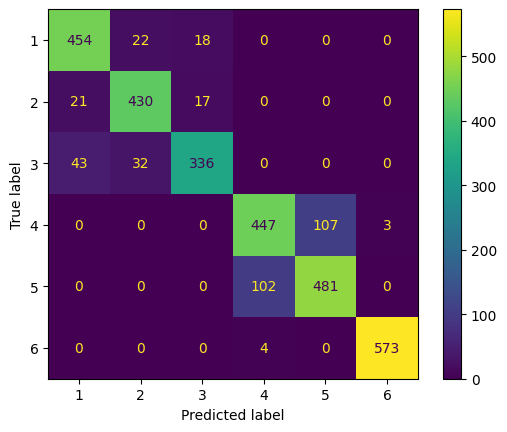

In [ ]:
seed(1)
set_seed(2)
autoencoder_1 = deep_encoder(input_dim=x_train.shape[1], code_dim=code_dim)
autoencoder_1.summary()

code_modelenc = keras.models.Model(inputs=autoencoder_1.input, outputs=autoencoder_1.get_layer('code').output)
code_train = np.asarray(code_modelenc.predict(x_train))

from sklearn import svm
from sklearn.metrics import ConfusionMatrixDisplay

clf2 = svm.SVC(C=1, kernel="linear", random_state=1)
clf2.fit(code_train, y_train)
code_test = np.asarray(code_modelenc.predict(x_test))

print('Calculando score...')
score = clf2.score(code_test, y_test)
print('\nscore: %.2f ' % (score))

disp =  ConfusionMatrixDisplay.from_estimator(clf2, code_test, y_test)

---

### Exercício 6)

Interpolação utilizando código autoencoder.

Crie um Autoencoder profundo do tipo Denoising Undercomplete para imagens da base de dados MNIST.

Para tornar o treinamento mais rápido utilizaremos apenas as 3000 primeiras imagens da base de dados de treinamento. Crie uma versão ruidosa do conjunto de treinamento conforme indicado no código.

O Autoencoder deve possuir a seguinte arquitetura no encoder (todas as camadas com ativação relu):

* Conv2D com 32 filtros 3x3, strides 2, zeropadding
* Conv2D com 32 filtros 3x3, strides 2, sem zeropadding
* MaxPooling2D com poolsize=2
* Densa com 32 dimensões (utilize name='code' para facilitar)

A seguir, deve possuir um decoder espelhado (com convoluções transpostas e upsampling), resultando na saida de mesma dimensão da entrada.

Antes de instanciar o modelo, inicialize as sementes com seed(1), set_seed(2). Depois, compile e treine com perda MSE, Otimizador SGD, taxa 0.01, momentum 0.95, por 25 épocas com batchsize 32.

Vamos agora obter interpolações de imagens utilizando os seus códigos. Para isso crie dois modelos, com base no treinado:

1. Encoder, que permite recuperar o código de uma imagem (camada 'code')
2. Decoder, que permite receber um código e retornar uma imagem

O segundo pode ser feito de formas distintas:
- pegando o `input` da primeira camada do decoder, desde que esteja nomeada
ex: `keras.models.Model(inputs=modelo.get_layer('camada').input, outputs=modelo.output)`
- ou feita a montagem das camadas utilizando a seguinte instrução (estude com calma para entender):

In [ ]:
## cria nova camada de entrada para receber dimensionalidade do código
#input_code_layer = keras.layers.Input(shape=(code_dim))

## encadeia camadas a partir de 'inicio', nesse caso 6 - ajuste conforme necessário
#inicio = 6
#x = input_code_layer
#for layer in convae.layers[inicio:]:
#    x = layer(x)

#decoder = keras.models.Model(inputs=input_code_layer, outputs=x)

Obtenha as imagens de teste de índice 128 e 198, e então:
1. calcule seus códigos pelo encoder: code128 e code198;
2. gere interpolações 10 lineares entre code128 e code198 combinando linearmente cada dimensão do vetor com ponderações entre 0 (que resulta apenas na imagem 128) e 1 (que resulta apenas na imagem 198);
3. passe cada vetor interpolado pelo decoder, obtendo imagens intermediárias;

OBS: os modelos esperam arrays em formatos específicos para predição, para passar uma única imagem use `model.predict(np.array([x_test[indice_imagem],]))`

Quais das imagens abaixo representa a saída da interpolação?

(a) <img src="ex7_6_alternativa_a.png" width=620></img><br>
(b) <img src="ex7_6_alternativa_b.png" width=620></img><br>
<font color='red'>(c)</font> <img src="ex7_6_alternativa_c.png" width=620></img><br>
(d) <img src="ex7_6_alternativa_d.png" width=620></img><br>

Dataset size:
60000 train samples
10000 test samples


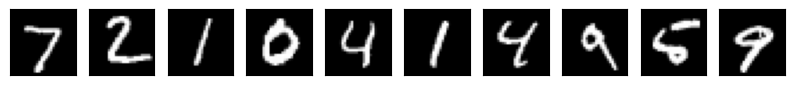

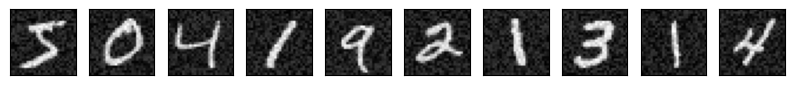

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from numpy.random import seed
from tensorflow.random import set_seed
from tensorflow.keras.datasets import mnist
(x_train, y_train), (x_test, y_test) = mnist.load_data()

# os pixels das imagens sao reescalados para melhor processamento
# em particular divide-se por 255 para que os valores fiquem entre 0 e 1
x_train = x_train.astype('float32') / 255.0
x_test = x_test.astype('float32') / 255.0
print('Dataset size:')
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')

img_rows, img_cols = x_train.shape[1], x_train.shape[2]
input_shape = (img_rows, img_cols, 1, )
n_classes = 10

n=10
plt.figure(figsize=(10, 5))
for i in range(n):
    ax = plt.subplot(2, n, i+1)
    plt.imshow(x_test[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.show()

seed(1)
set_seed(2)

## gerando dados ruidosos a serem oferecidos na entrada (a saída deve ser x_train[:3000])
noisy_train = x_train[:3000] + np.random.random(x_train[:3000].shape)*0.3

n=10
plt.figure(figsize=(10, 5))
for i in range(n):
    ax = plt.subplot(2, n, i+1)
    plt.imshow(noisy_train[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.show()

In [ ]:
def conv_autoencoder(input_shape, code_dim=10):
    input_img = keras.layers.Input(shape=(input_shape))

    # encoder
    ## conv.layers
    x1 = keras.layers.Conv2D(32, kernel_size=(3,3), strides=(2, 2), padding='same', activation='relu')(input_img)
    x2 = keras.layers.Conv2D(32, kernel_size=(3,3), padding='valid', activation='relu')(x1)
    x2p = keras.layers.MaxPooling2D(pool_size=(2, 2))(x2)
    ## achatando
    x2f = keras.layers.Flatten()(x2p)
    #código
    z = keras.layers.Dense(code_dim, activation='relu', name='code')(x2f)

    # decoder
    ## projetando num espaco de maior dimensionalidade e redimensionando
    x2f_hat = keras.layers.Dense(1152, activation='relu', name='input_decoder')(z)
    x2r_hat = keras.layers.Reshape((6, 6, 32))(x2f_hat)
    ## invertendo o pooling
    x2p_hat = keras.layers.UpSampling2D((2,2))(x2r_hat)
    ## convolucao transpostas (inversas)
    x2_hat = keras.layers.Conv2DTranspose(32, kernel_size=(3,3), padding='valid', activation='relu')(x2p_hat)
    x1_hat = keras.layers.Conv2DTranspose(1, kernel_size=(3,3), strides=(2, 2), padding='same', activation='relu')(x2_hat)

    autoencoder = keras.models.Model(input_img, x1_hat)
    autoencoder.summary()
    return autoencoder

In [ ]:
epochs= 25
batch_size=32
code_dim= 32

seed(1)
set_seed(2)

convae = conv_autoencoder(input_shape, code_dim)
convae.compile(loss='mse',
              optimizer=keras.optimizers.SGD(learning_rate=0.01, momentum=0.95))

hist_ae = convae.fit(noisy_train, x_train[:3000], batch_size=batch_size, epochs=epochs)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d (Conv2D)             (None, 14, 14, 32)        320       
                                                                 
 conv2d_1 (Conv2D)           (None, 12, 12, 32)        9248      
                                                                 
 max_pooling2d (MaxPooling2  (None, 6, 6, 32)          0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 1152)              0         
                                                                 
 code (Dense)                (None, 32)                36896     
                                                           

In [ ]:
encoder = keras.models.Model(inputs=convae.input, outputs=convae.get_layer('code').output)

In [ ]:
input_code_layer = keras.layers.Input(shape=(code_dim))
x = input_code_layer
for layer in convae.layers[6:]:
    x = layer(x)
decoder = keras.models.Model(inputs=input_code_layer, outputs=x)

1/1 [==============================] - 0s 17ms/step


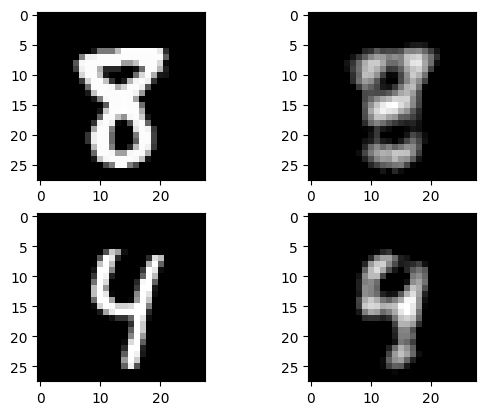

1/1 [==============================] - 0s 16ms/step
[0.         2.3220105  5.1895194  0.4804806  1.9626539  0.
 0.02358731 0.48622996 0.         1.5874826  3.2502344  0.53344774
 1.2369108  0.         0.         1.0387987  0.6137252  0.
 1.7129406  3.1968465  0.66188353 0.         0.         0.
 1.7708288  3.055439   3.4412606  1.1560148  0.92297864 0.7041049
 1.7045676  0.        ]
[0.         1.4370214  4.0565705  0.08960172 0.89008677 0.
 0.         0.5812293  0.         1.8392336  1.7945033  0.
 2.0300841  0.         0.         0.35933727 0.64194244 0.
 1.1470132  0.69930786 0.         0.         0.         0.
 0.798034   2.5386863  1.6609128  0.8022421  0.06090127 1.2777855
 1.0896007  0.        ]


In [ ]:
img1 = 128
x_test_dec1 = convae.predict(np.array([x_test[img1],]))
img2 = 198
x_test_dec2 = convae.predict(np.array([x_test[img2],]))

plt.subplot(221); plt.imshow(x_test[img1].reshape(28, 28), cmap="gray")
plt.subplot(222); plt.imshow(x_test_dec1[0].reshape(28, 28), cmap="gray")
plt.subplot(223); plt.imshow(x_test[img2].reshape(28, 28), cmap="gray")
plt.subplot(224); plt.imshow(x_test_dec2[0].reshape(28, 28), cmap="gray")
plt.show()

code_img1 = encoder.predict(np.array([x_test[img1],]))[0]
code_img2 = encoder.predict(np.array([x_test[img2],]))[0]
print(code_img1)
print(code_img2)

1/1 [==============================] - 0s 17ms/step


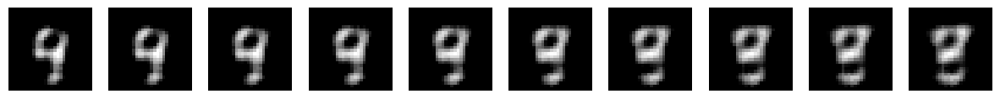

In [ ]:
values = np.linspace(0,1,10)

plt.figure(figsize=(15, 4))
j = 0
for x in values:
    j = j + 1
    alt_code = np.array(code_img1, copy=True)
    alt_code = (alt_code*(x))  + (code_img2*(1-x))
    alt_img = decoder.predict(np.array([alt_code,]))
    plt.subplot(1,10,j)
    # a depender da forma como foi implementado talvez necessite inserir dimensao 0
    #plt.imshow(alt_img[0][:,:,0], cmap="gray"); plt.axis('off')
    plt.imshow(alt_img[0][:,:,0], cmap="gray"); plt.axis('off')

### Parte 2 - Exercícios complementares

---

### Exercício 8)

Uso de GANs para aprendizado de representações. Utilizando a mesma base de dados do exercício anterior, projete e treine uma GAN para gerar exemplos artificiais da base de dados `smartphone_activity_dataset.csv`. Utilizaremos todos os exemplos para treinamento da GAN.

Para isso, utilize a GAN similar à proposta em aula, alterada conforme o código abaixo, com as seguintes configurações:
* discriminador com uma camada oculta com 32 dimensões (utilize o parâmetro `name='embedding'` nessa camada para facilitar seu uso posterior), deve ser treinado com Adam e taxa de aprendizado 0.0001 (apenas para o discriminador)
* gerador com 2 camadas ocultas com 256 neurônios
* dimensão de z = 256
* dimensão de entrada igual a da base de dados
* função de distribuição alvo deve amostrar da base de dados

Todas as camadas serão `tanh` exceto a camada de saída do discriminador que é `sigmoid`.

Treine a GAN por 1000 épocas com batch size 32 e otimizador Adam com lr=0.001.

Após, utilize a camada "embedding" do discriminador como extratora de características, passando os dados da base de treinamento e teste (na mesma divisão feita na questão anterior) para o discriminador, e pegando a projeção feita pela camada densa.

Treine classificadores SVM com parâmetros C=1, kernel="linear" e random_state=1, um na base de dados com suas características originais, e o outro nas característias do "embedding" do discriminador. Obtenha o score nos respectivos conjuntos de teste. Os resultados estão em qual intervalo?

(a) Original = [80,100], Embedding 32d GAN = [50,75], a GAN não foi capaz de aprender uma representação compacta com acurácia similar ao uso dos dados originais<br>
(b) Original = [50,75], Embedding 32d GAN = [80,100], a GAN produz representação melhor que dados originais<br>
(c) Original = [50,75], Embedding 32d GAN = [50,75], a GAN gera uma representação compacta com resultado similar, porém ambas geram resultados baixos de acurácia<br>
<font color='red'>(d)  Original = [80,100], Embedding 32d GAN = [80,100], a GAN gera uma representação compacta com resultado similar, porém de forma absoluta inferior ao uso da base original<br></font>

 **Justificativa**: Ver código abaixo.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import pandas as pd
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import models
from numpy.random import seed
from tensorflow.random import set_seed

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

In [ ]:
df = pd.read_csv("smartphone_activity_dataset.csv").dropna()

rotulos = np.array(df['activity'])
features = np.array(df.iloc[:, :-1])

x_train, x_test, y_train, y_test = train_test_split(features, rotulos, test_size=0.30, random_state=0)
print("Exemplos de treinamento:", len(x_train))
print("Exemplos de teste:", len(x_test))

Exemplos de treinamento: 7209
Exemplos de teste: 3090


In [ ]:
# modelo discriminador base : classificador
def discriminator(dim_input=2, embedding_size=128):
    model = models.Sequential()
    model.add(layers.Dense(embedding_size, activation='tanh', name='embedding', input_dim=dim_input))
    model.add(layers.Dense(1, activation='sigmoid'))
    model.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(learning_rate=0.0001), metrics=['accuracy'])
    return model

def distribuicao_alvo(n, x_train):
    labels_reais = np.ones((n,1))
    return x_train[np.random.choice(x_train.shape[0], n, replace=False), :], labels_reais

# modelo gerador, cuja entrada tem dimensão do espaço latente
# sua saída tem dimensão igual a dos exemplos da distribuição alvo
def generator(z_dim, dim_output=2, embedding_size1=256, embedding_size2=256):
    model = models.Sequential()
    model.add(layers.Dense(embedding_size1, activation='tanh', name='embedding1', input_dim=z_dim))
    model.add(layers.Dense(embedding_size2, activation='tanh', name='embedding2'))
    model.add(layers.Dense(dim_output, activation='tanh'))
    return model

# funcao para gerar uma amostra com n exemplos da distribuicao latente
def amostra_distribuicao_latente(z_dim, n):
    exemplos_z = np.random.randn(z_dim * n)
    return exemplos_z.reshape(n, z_dim)

# funcao para gerar exemplos "falsos", aleatorios a partir da
# saída do gerador G(z)
def gera_exemplos_falsos(model_g, z_dim, n):
    exemplos_z = amostra_distribuicao_latente(z_dim, n)
    exemplos_falsos = model_g.predict(exemplos_z, verbose=0)
    labels_falsos = np.zeros((n,1))
    return exemplos_falsos, labels_falsos

In [ ]:
def GAN(model_gen, model_dis):
    # o discriminador sera treinado separadamente, entao marcamos como
    # nao treinável dentro desse modelo
    model_dis.trainable = False

    # criamos modelo que gera exemplos, depois os passa ao discriminador
    model_gan = models.Sequential()
    model_gan.add(model_gen)
    model_gan.add(model_dis)
    model_gan.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(learning_rate=0.001), metrics=['accuracy'])
    return model_gan

def fit_GAN(model_gen, model_dis, model_GAN, z_dim, x_train, epochs=1000, batch_size=32, verbose=False):
    histR = np.zeros(epochs)
    histF = np.zeros(epochs)
    for i in range(epochs):
        # amostra exemplos para o discriminador
        x_real, y_real = distribuicao_alvo(batch_size//2, x_train)
        x_falso, y_falso = gera_exemplos_falsos(model_gen, z_dim, batch_size//2)
        # treina modelo em meio batch
        model_dis.train_on_batch(x_real, y_real)
        model_dis.train_on_batch(x_falso, y_falso)

        # exemplos da distribuicao latente
        z_batch = amostra_distribuicao_latente(z_dim, batch_size)
        # invertemos os labels aqui para treinar de forma a enganar o discriminador
        z_labels = np.ones((batch_size,1))
        model_GAN.train_on_batch(z_batch, z_labels)

        # avalia modelo discriminador atual
        loss_real, acc_real = model_dis.evaluate(x_real, y_real, verbose=0)
        loss_falso, acc_falso = model_dis.evaluate(x_falso, y_falso, verbose=0)
        histR[i] = loss_real
        histF[i] = loss_falso
        if (verbose and (i % 100 == 0)):
            print("Epoch: %d, Accuracy- real: %.2f falso: %.2f" % (i, acc_real, acc_falso))

    return histR, histF

In [ ]:
seed(1)
set_seed(2)

z_dim = 256
model_dis = discriminator(features.shape[1], embedding_size=32)
model_gen = generator(z_dim,features.shape[1], embedding_size1=256, embedding_size2=256)

model_GAN = GAN(model_gen, model_dis)

histR, histF = fit_GAN(model_gen, model_dis, model_GAN, z_dim, features, epochs=800, batch_size=32, verbose=True)

Epoch: 0, Accuracy- real: 0.88 falso: 0.38
Epoch: 100, Accuracy- real: 1.00 falso: 0.00
Epoch: 200, Accuracy- real: 1.00 falso: 0.25
Epoch: 300, Accuracy- real: 1.00 falso: 0.06
Epoch: 400, Accuracy- real: 1.00 falso: 0.50
Epoch: 500, Accuracy- real: 1.00 falso: 0.31
Epoch: 600, Accuracy- real: 1.00 falso: 0.75
Epoch: 700, Accuracy- real: 1.00 falso: 0.56


In [ ]:
code_GAN = keras.models.Model(inputs=model_dis.input, outputs=model_dis.get_layer('embedding').output)
code_trainGAN = np.asarray(code_GAN.predict(x_train))
code_testGAN = np.asarray(code_GAN.predict(x_test))

97/97 [==============================] - 0s 2ms/step


Calculando score embedding GAN...

score: 0.84


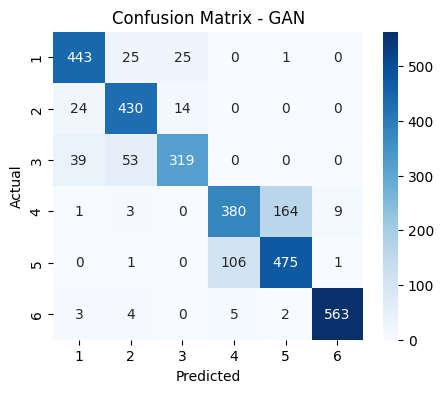

In [ ]:
from sklearn import svm
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

clf = svm.SVC(C=1, random_state=1, kernel="linear")
clf.fit(code_trainGAN, y_train)

print('Calculando score embedding GAN...')
score = clf.score(code_testGAN, y_test)
print('\nscore: %.2f' % (score))

# Make predictions on the testing set
y_pred = clf.predict(code_testGAN)

# Generate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plotting the confusion matrix using seaborn
plt.figure(figsize=(5, 4))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - GAN')
plt.show()

Calculando score dados originais...

score: 0.9883495145631068


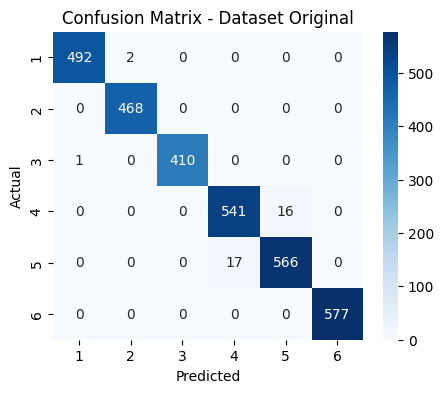

In [ ]:
clf_orig = svm.SVC(C=1, random_state=1, kernel="linear")
clf_orig.fit(x_train, y_train)

print('Calculando score dados originais...')
score = clf_orig.score(x_test, y_test)
print('\nscore: ' + str(score))

y_pred_orig = clf_orig.predict(x_test)

# Generate the confusion matrix
cm = confusion_matrix(y_test, y_pred_orig)

# Plotting the confusion matrix using seaborn
plt.figure(figsize=(5, 4))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Dataset Original')
plt.show()

## <span style="color:darkred">Módulo 7 - Auto-encodes e Redes Geradoras</span>
### <span style="color:darkred">**Parte 1: Autoencoders para Aprendizado de Representações**</span>

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from numpy.random import seed
from tensorflow.random import set_seed
from tensorflow import keras
from tensorflow.keras import layers

from keras.datasets import fashion_mnist

Carregando a base de dados "Fashion MNIST"


In [2]:
(x_train, y_train), (x_test, y_test) = fashion_mnist.load_data()

4422102/4422102 [==============================] - 1s 0us/step


In [3]:
# os pixels das imagens sao reescalados para melhor processamento
# em particular divide-se por 255 para que os valores fiquem entre 0 e 1
x_train = x_train.astype('float32') / 255.0
x_test = x_test.astype('float32') / 255.0
print('Dataset size:')
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')

img_rows, img_cols = x_train.shape[1], x_train.shape[2]
input_shape = (img_rows, img_cols, 1, )
n_classes = 10

Dataset size:
60000 train samples
10000 test samples


---

### Autoencoder convolucional

Projetaremos de forma que Encoder e Decoder sejam simétricos

Escolhemos a dimensionalidade latente como sendo 256

Note que após o código, buscamos inverter as operações do encoder:
* camada de projeção para maior dimensiondlidade
* reshape para o formato de feature maps
* upsampling (inverso de pooling)
* convoluções transpostas farão o papel de inversão

In [14]:
input_img = keras.layers.Input(shape=(input_shape))

# encoder
## conv.layers
x1 = keras.layers.Conv2D(32, kernel_size=(3,3), strides=(2, 2), padding='same', activation='relu')(input_img)
x2 = keras.layers.Conv2D(16, kernel_size=(3,3), padding='valid', activation='relu')(x1)
x2p = keras.layers.MaxPooling2D(pool_size=(2, 2))(x2)
## achatando
x2f = keras.layers.Flatten()(x2p)
x2f = keras.layers.Dropout(0.2)(x2f)
#código
z = keras.layers.Dense(256, activation='relu', name='code')(x2f)

# decoder
## projetando num espaco de maior dimensionalidade e redimensionando
x2f_hat = keras.layers.Dense(576, activation='relu')(z)
x2r_hat = keras.layers.Reshape((6, 6, 16))(x2f_hat)
## invertendo o pooling
x2p_hat = keras.layers.UpSampling2D((2,2))(x2r_hat)
## convolucao transpostas (inversas)
x2_hat = keras.layers.Conv2DTranspose(32, kernel_size=(3,3), padding='valid', activation='relu')(x2p_hat)
x1_hat = keras.layers.Conv2DTranspose(1, kernel_size=(3,3), strides=(2, 2), padding='same', activation='relu')(x2_hat)

autoencoder = keras.models.Model(input_img, x1_hat)
autoencoder.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_10 (Conv2D)          (None, 14, 14, 32)        320       
                                                                 
 conv2d_11 (Conv2D)          (None, 12, 12, 16)        4624      
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 6, 6, 16)          0         
 g2D)                                                            
                                                                 
 flatten_5 (Flatten)         (None, 576)               0         
                                                                 
 dropout_5 (Dropout)         (None, 576)               0         
                                                           

### Treinando o autoencoder

In [15]:
seed(1)
set_seed(2)

epochs = 20
batch_size = 32

autoencoder.compile(loss='mse',
              optimizer=keras.optimizers.SGD(learning_rate=0.01,
                                             momentum=0.95))

hist_ae = autoencoder.fit(x_train, x_train,
                          batch_size=batch_size,
                          epochs=epochs)

Epoch 1/20
1875/1875 [==============================] - 12s 6ms/step - loss: 0.0449
Epoch 2/20
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0290
Epoch 3/20
1875/1875 [==============================] - 8s 4ms/step - loss: 0.0251
Epoch 4/20
1875/1875 [==============================] - 9s 5ms/step - loss: 0.0229
Epoch 5/20
1875/1875 [==============================] - 9s 5ms/step - loss: 0.0215
Epoch 6/20
1875/1875 [==============================] - 8s 4ms/step - loss: 0.0205
Epoch 7/20
1875/1875 [==============================] - 9s 5ms/step - loss: 0.0198
Epoch 8/20
1875/1875 [==============================] - 9s 5ms/step - loss: 0.0192
Epoch 9/20
1875/1875 [==============================] - 8s 5ms/step - loss: 0.0187
Epoch 10/20
1875/1875 [==============================] - 9s 5ms/step - loss: 0.0183
Epoch 11/20
1875/1875 [==============================] - 9s 5ms/step - loss: 0.0179
Epoch 12/20
1875/1875 [==============================] - 9s 5ms/step - loss: 0.0176

In [16]:
# obtem as reconstrucoes para o conjunto de teste
decoded_imgs = autoencoder.predict(x_test)

313/313 [==============================] - 1s 2ms/step


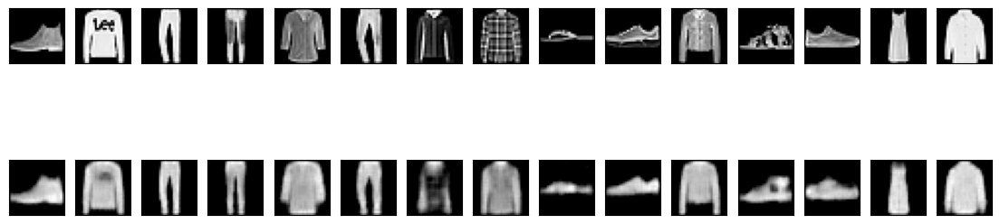

In [12]:
n=15
plt.figure(figsize=(14, 4))
for i in range(n):
    ax = plt.subplot(2, n, i+1)
    plt.imshow(x_test[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # display reconstruction
    ax = plt.subplot(2, n, i+n+1)
    plt.imshow(decoded_imgs[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.show()

---

Supondo um cenário em que tenhamos muitos exemplos não rotulados:
* aprendemos as características de forma não supervisionada
* utilizamos as características treinando um classificador externo com poucos exemplos rotulados

Para isso, fazemos com que a saída seja a camada do código, e obtemos as predições para o treinamento e o teste

Aqui vamos supor um subconjunto pequeno de dados rotulados

In [23]:
# quantidade de dados rotulados
n_treinamento = 500

code_model = keras.models.Model(inputs=autoencoder.input,
                                outputs=autoencoder.get_layer('code').output)
code_train = np.asarray(code_model.predict(x_train[:n_treinamento]))
code_test  = np.asarray(code_model.predict(x_test))
print("Training data size = ", code_train.shape)
print("Testing data size = ", code_test.shape)

313/313 [==============================] - 1s 3ms/step
Training data size =  (500, 256)
Testing data size =  (10000, 256)


In [24]:
from sklearn import svm

print('Treinando SVM com ~%d exemplos por classe...' % (n_treinamento//n_classes))
clf = svm.SVC(C=10)
clf.fit(code_train, y_train[:n_treinamento])

Treinando SVM com ~50 exemplos por classe...


SVC(C=10)

In [25]:
print('Calculando score...')
score = clf.score(code_test, y_test)
print('\nscore: ' + str(score))

Calculando score...

score: 0.7869


## <span style="color:darkred">Módulo 7 - Auto-encodes e Redes Geradoras</span>
### <span style="color:darkred">**Parte 2: Autoencoders para Redução de Dimensionalidade**</span>

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from numpy.random import seed
from tensorflow.random import set_seed
from tensorflow import keras
from tensorflow.keras import layers

Outra aplicação de auto-encoders é seu uso para **redução de dimensionalidade não supervisionada**

Vamos utilizar a base de dados Boston Housing e a tarefa de regressão

Essa base de dados possui 13 atributos originalmente, vamos aprender uma redução desse espaço.

In [2]:
(x_train, y_train), (x_test, y_test) = keras.datasets.boston_housing.load_data()

mean = x_train.mean(axis=0)
x_train -= mean
std = x_train.std(axis=0)
x_train /= std

x_test -= mean
x_test /= std
print(x_test.shape)

target_dimensions = 6

57026/57026 [==============================] - 0s 0us/step
(102, 13)


### O autoencoder será denso, com:

* uma camada de 10 dimensões intermediária (para o encoder e o decoder)
* a camada de projeção no espaco do código

In [17]:
input_data = keras.layers.Input(shape=(13,))

# encoder
e1 = keras.layers.Dense(10, activation='tanh')(input_data)
z = keras.layers.Dense(target_dimensions, activation='tanh',
                       name='code')(e1)

# decoder
d1 = keras.layers.Dense(10, activation='tanh')(z)
output = keras.layers.Dense(13, activation='tanh')(d1)

autoencoder = keras.models.Model(input_data, output)
autoencoder.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 13)]              0         
                                                                 
 dense_7 (Dense)             (None, 10)                140       
                                                                 
 code (Dense)                (None, 6)                 66        
                                                                 
 dense_8 (Dense)             (None, 10)                70        
                                                                 
 dense_9 (Dense)             (None, 13)                143       
                                                                 
Total params: 419 (1.64 KB)
Trainable params: 419 (1.64 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [18]:
seed(1)
set_seed(1)

epochs = 150
batch_size = 8

# definindo um decaimento para a taxa de aprendizado
def scheduler(epoch, lr):
  if epoch < 50:
    return lr
  else:
    return lr * tf.math.exp(-0.01)

callbacklr = tf.keras.callbacks.LearningRateScheduler(scheduler)

autoencoder.compile(loss='mse',
              optimizer=keras.optimizers.Adam(learning_rate=0.003))

hist_ae = autoencoder.fit(x_train, x_train,
                    callbacks=[callbacklr],
                    batch_size=batch_size, epochs=epochs,
                    verbose=2)

Epoch 1/150
51/51 - 1s - loss: 0.8801 - lr: 0.0030 - 868ms/epoch - 17ms/step
Epoch 2/150
51/51 - 0s - loss: 0.5754 - lr: 0.0030 - 94ms/epoch - 2ms/step
Epoch 3/150
51/51 - 0s - loss: 0.4932 - lr: 0.0030 - 96ms/epoch - 2ms/step
Epoch 4/150
51/51 - 0s - loss: 0.4448 - lr: 0.0030 - 91ms/epoch - 2ms/step
Epoch 5/150
51/51 - 0s - loss: 0.4129 - lr: 0.0030 - 88ms/epoch - 2ms/step
Epoch 6/150
51/51 - 0s - loss: 0.3925 - lr: 0.0030 - 95ms/epoch - 2ms/step
Epoch 7/150
51/51 - 0s - loss: 0.3776 - lr: 0.0030 - 89ms/epoch - 2ms/step
Epoch 8/150
51/51 - 0s - loss: 0.3654 - lr: 0.0030 - 90ms/epoch - 2ms/step
Epoch 9/150
51/51 - 0s - loss: 0.3553 - lr: 0.0030 - 104ms/epoch - 2ms/step
Epoch 10/150
51/51 - 0s - loss: 0.3463 - lr: 0.0030 - 90ms/epoch - 2ms/step
Epoch 11/150
51/51 - 0s - loss: 0.3377 - lr: 0.0030 - 90ms/epoch - 2ms/step
Epoch 12/150
51/51 - 0s - loss: 0.3311 - lr: 0.0030 - 90ms/epoch - 2ms/step
Epoch 13/150
51/51 - 0s - loss: 0.3252 - lr: 0.0030 - 84ms/epoch - 2ms/step
Epoch 14/150
51/51

---

### Uso em regressor externo

Com o AE treinado, podemos utilizá-lo para obter representações para instâncias do treinamento e do teste

Vamos compara esse novo espaço aprendido com o original e com uma projeção PCA

In [19]:
from sklearn.linear_model import Ridge
from sklearn.decomposition import PCA
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [20]:
code_model = keras.models.Model(inputs=autoencoder.input,
                                outputs=autoencoder.get_layer('code').output)
code_train = np.asarray(code_model.predict(x_train))
code_test  = np.asarray(code_model.predict(x_test))
print("Training data size = ", code_train.shape)
print("Testing data size = ", code_test.shape)

4/4 [==============================] - 0s 3ms/step
Training data size =  (404, 6)
Testing data size =  (102, 6)


Criando a projeção PCA para comparação

In [21]:
pca = PCA(n_components=target_dimensions)
pca.fit(x_train)
pca_train = pca.transform(x_train)
pca_test = pca.transform(x_test)

Treinando os regressores

In [22]:
print('Treinando Regressor com Código AE...')
clf_ae = Ridge()
clf_ae.fit(code_train, y_train)
code_pred = clf_ae.predict(code_test)

Treinando Regressor com Código AE...


In [23]:
print('Treinando Regressor com PCA...')
clf_pca = Ridge()
clf_pca.fit(pca_train, y_train)
pca_pred = clf_pca.predict(pca_test)

Treinando Regressor com PCA...


In [24]:
print('Treinando Regressor com Dados Originais...')
clf_ori = Ridge()
clf_ori.fit(x_train, y_train)
y_pred = clf_ori.predict(x_test)

Treinando Regressor com Dados Originais...


In [25]:
print('Calculando score...')
score_ae = mean_squared_error(code_pred, y_test)
score_ori = mean_squared_error(y_pred, y_test)
score_pca = mean_squared_error(pca_pred, y_test)
print('\nscore original: %.2f' % (score_ori))
print('\nscore PCA: %.2f' % (score_pca))
print('\nscore AE: %.2f ' % (score_ae))


Calculando score...

score original: 23.11

score PCA: 21.63

score AE: 20.67 


## <span style="color:darkred">Módulo 7 - Auto-encodes e Redes Geradoras</span>
### <span style="color:darkred">**Parte 3: Rede Geradora Adversarial (GAN)**</span>

In [1]:
import numpy as np
from numpy.random import seed

import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.random import set_seed
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import models

Vamos projetar uma rede adversária para gerar dados num plano.

Para isso utilizaremos uma função como referência, uma função Senoidal

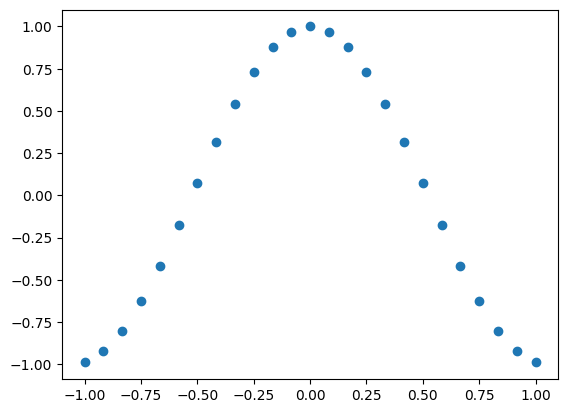

In [2]:
def distribuicao_dados(x):
    return np.cos(x*3)

amostragem = np.linspace(-1.0,1.0,25)
train_ds = [distribuicao_dados(x) for x in amostragem]
plt.plot(amostragem, train_ds, 'o')

In [3]:
# funcao que obtem amostras a partir a distribuicao de dados alvo
def distribuicao_alvo(n=32):
  amost_x = (np.random.rand(n)*2.0)-1.0
  amost_y = np.array([distribuicao_dados(x) for x in amost_x])
  dados_reais = np.stack((amost_x, amost_y),axis=1)
  labels = np.ones((n,1))
  return dados_reais, labels

In [4]:
# funcao que obtem amostras aleatórias no plano
def distribuicao_aleatoria(n=32):
  amost_x = (np.random.rand(n)*2.0)-1.0
  amost_y = (np.random.rand(n)*2.0)-1.0
  dados_aleatorios = np.stack((amost_x, amost_y),axis=1)
  labels = np.zeros((n, 1))
  return dados_aleatorios, labels

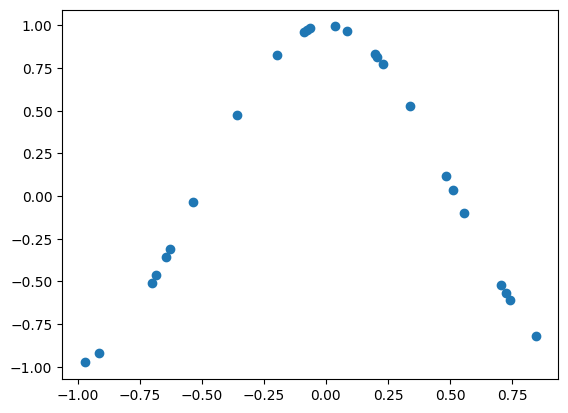

In [5]:
exemplos, labels = distribuicao_alvo(25)
plt.scatter(exemplos[:,0], exemplos[:,1])

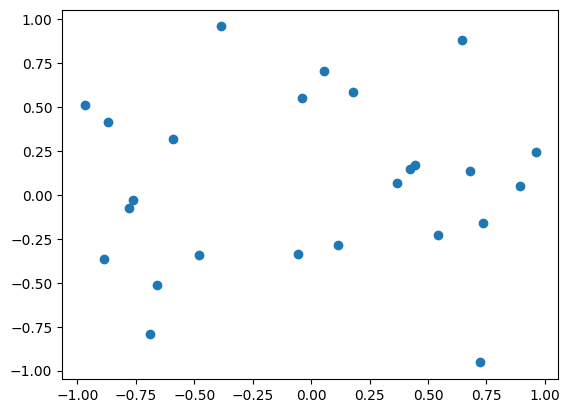

In [6]:
exemplos, labels = distribuicao_aleatoria(25)
plt.scatter(exemplos[:,0], exemplos[:,1])

### Discriminador

Componente que é responsável por identificar se um ponto foi produzido por uma distribuição original ou por outra distribuição.

In [7]:
# modelo discriminador base : classificador
def discriminator(dim_input=2):
    model = models.Sequential()
    model.add(layers.Dense(12, activation='tanh', input_dim=dim_input))
    model.add(layers.Dense(1, activation='sigmoid'))
    model.compile(loss='binary_crossentropy',
                  optimizer=keras.optimizers.Adam(learning_rate=0.001), metrics=['accuracy'])
    return model

Para treinar o discriminador, geramos exemplos reais e "falsos" criando rótulos para cada caso

Aqui fazemos um treinamento manual, com metade do batch de cada rótulo.

Não temos ainda uma GAN, aqui o discriminador aprende a classificar entre dados reais e aleatórios, não gerados por outra rede neural

In [21]:
# funcao de ajuste do discriminador
def fit_discriminator(model, epochs=100, batch_size=32, verbose=False):

    histR = np.zeros(epochs)
    histF = np.zeros(epochs)
    for i in range(epochs):
        x_real, y_real = distribuicao_alvo(batch_size//2)
        # treina modelo em meio batch
        model.train_on_batch(x_real, y_real)

        # gera exemplos falsos
        x_falso, y_falso = distribuicao_aleatoria(batch_size//2)
        # treina modelo em meio batch
        model.train_on_batch(x_falso, y_falso)
        loss_real, acc_real = model.evaluate(x_real, y_real, verbose=0)
        loss_falso, acc_falso = model.evaluate(x_falso, y_falso, verbose=0)
        histR[i] = loss_real
        histF[i] = loss_falso
        if (verbose):
          print("Epoch: %d, Accuracy- real: %.2f falso: %.2f" % (i, acc_real, acc_falso))

    return histR, histF

In [9]:
# define the discriminator model
model = discriminator()
model.summary()
# fit the model
histR, histF = fit_discriminator(model)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 12)                36        
                                                                 
 dense_1 (Dense)             (None, 1)                 13        
                                                                 
Total params: 49
Trainable params: 49
Non-trainable params: 0
_________________________________________________________________


Exibindo os gráficos da perda computada nos exemplos reais e aleatórios, fica claro como raramente elas vão bem ao mesmo tempo

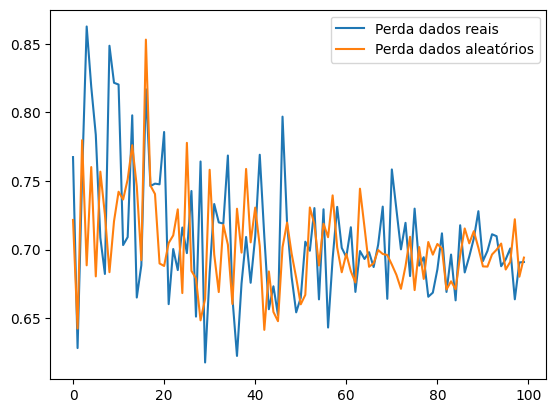

In [10]:
plt.plot(histR)
plt.plot(histF)
plt.legend(['Perda dados reais', 'Perda dados aleatórios'])

### Gerador

Modelo que, a partir de uma amostra da distribuição latente, aprende uma transformação desse em um exemplo candidato à distribuição alvo


In [11]:
# modelo gerador, cuja entrada tem dimensão do espaço latente
# sua saída tem dimensão igual a dos exemplos da distribuição alvo
def generator(z_dim, dim_output=2):
  model = models.Sequential()
  model.add(layers.Dense(10, activation='tanh', input_dim=z_dim))
  model.add(layers.Dense(dim_output, activation='linear'))
  return model

# funcao para gerar uma amostra com n exemplos da distribuicao latente
def amostra_distribuicao_latente(z_dim, n):
  exemplos_z = np.random.randn(z_dim * n)
  return exemplos_z.reshape(n, z_dim)

# funcao para gerar exemplos "falsos", aleatorios a partir da
# saída do gerador G(z)
def gera_exemplos_falsos(model_g, z_dim, n):
  exemplos_z = amostra_distribuicao_latente(z_dim, n)
  exemplos_falsos = model_g.predict(exemplos_z)
  labels_falsos = np.zeros((n,1))
  return exemplos_falsos, labels_falsos

1/1 [==============================] - 0s 98ms/step


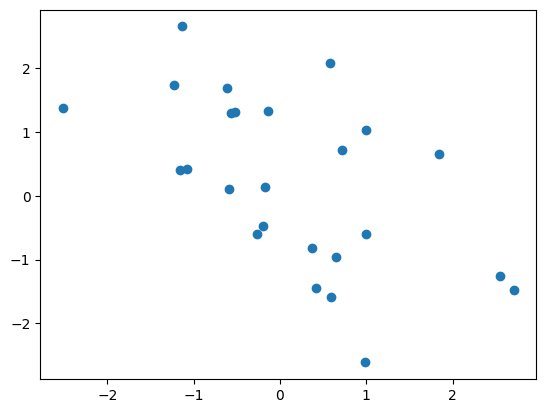

In [13]:
# gerador com dimensionalidade latente = 6
model_gen = generator(6)
# exemplos a partir do gerador aleatório (inicial)
exemplos_falsos, lab_falsos = gera_exemplos_falsos(model_gen, 6, 25)
plt.scatter(exemplos_falsos[:,0],exemplos_falsos[:,1])

### GAN

Tendo os dois componentes, vamos conectá-los para treinamento em conjunto, de forma adversarial

A GAN terá por objetivo treinar o **gerador** enquanto o *discriminador* será treinado de forma independente, e alternada.

In [14]:
def GAN(model_gen, model_dis):
    # o discriminador sera treinado separadamente, entao marcamos como
    # nao treinável dentro desse modelo
    model_dis.trainable = False

    # criamos modelo que gera exemplos, depois os passa ao discriminador
    model_gan = models.Sequential()
    model_gan.add(model_gen)
    model_gan.add(model_dis)
    model_gan.compile(loss='binary_crossentropy',
                      optimizer=keras.optimizers.Adam(learning_rate=0.001),
                      metrics=['accuracy'])
    return model_gan

A função para treinamento da GAN alterna treinamento do *discriminador*, por meio de exemplos falsos e verdadeiros gerados, seguido do treinamento do **gerador** o qual será otimizado para ganhar do discriminador.

In [28]:
def fit_GAN(model_gen, model_dis, model_GAN, z_dim, epochs=200, batch_size=32, verbose=False):
    histR = np.zeros(epochs)
    histF = np.zeros(epochs)
    for i in range(epochs):
        # treinamento do discriminador
        # amostra exemplos para o discriminador
        x_real, y_real = distribuicao_alvo(batch_size//2)
        x_falso, y_falso = gera_exemplos_falsos(model_gen, z_dim, batch_size//2)
        # treina modelo em meio batch
        model_dis.train_on_batch(x_real, y_real)
        model_dis.train_on_batch(x_falso, y_falso)

        # treinamento do gerador
        # exemplos da distribuicao latente
        z_batch = amostra_distribuicao_latente(z_dim, batch_size)
        # invertemos os labels aqui para treinar de forma a enganar o discriminador
        z_labels = np.ones((batch_size,1))
        model_GAN.train_on_batch(z_batch, z_labels)

        # avalia modelo discriminador atual
        loss_real, acc_real = model_dis.evaluate(x_real, y_real, verbose=0)
        loss_falso, acc_falso = model_dis.evaluate(x_falso, y_falso, verbose=0)
        histR[i] = loss_real
        histF[i] = loss_falso
        if (verbose):
            print("Epoch: %d, Accuracy- real: %.2f falso: %.2f" % (i, acc_real, acc_falso))

---
Vamos agora treinar a GAN

Escolhemos uma dimensionalidade latente de forma que $z \in R^4$

4/4 [==============================] - 0s 3ms/step


Text(0.5, 1.0, 'Antes do treinamento')

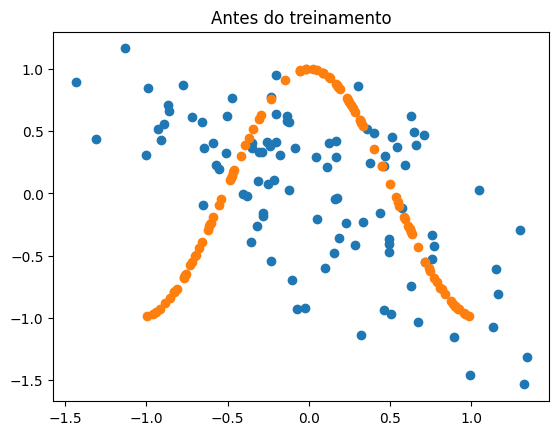

In [16]:
z_dim = 4
model_dis = discriminator()
model_gen = generator(z_dim)

x_falso, y_falso = gera_exemplos_falsos(model_gen, z_dim, 100)
x_real, y_real = distribuicao_alvo(100)

plt.scatter(x_falso[:,0],x_falso[:,1])
plt.scatter(x_real[:,0],x_real[:,1]); plt.title('Antes do treinamento')

In [29]:
model_GAN = GAN(model_gen, model_dis)

fit_GAN(model_gen, model_dis, model_GAN, z_dim, 100, 32, verbose=True)

1/1 [==============================] - 0s 23ms/step
Epoch: 0, Accuracy- real: 1.00 falso: 0.00
1/1 [==============================] - 0s 22ms/step
Epoch: 1, Accuracy- real: 1.00 falso: 0.00
1/1 [==============================] - 0s 25ms/step
Epoch: 2, Accuracy- real: 1.00 falso: 0.00
1/1 [==============================] - 0s 25ms/step
Epoch: 3, Accuracy- real: 1.00 falso: 0.00
1/1 [==============================] - 0s 26ms/step
Epoch: 4, Accuracy- real: 1.00 falso: 0.00
1/1 [==============================] - 0s 29ms/step
Epoch: 5, Accuracy- real: 1.00 falso: 0.00
1/1 [==============================] - 0s 22ms/step
Epoch: 6, Accuracy- real: 1.00 falso: 0.00
1/1 [==============================] - 0s 22ms/step
Epoch: 7, Accuracy- real: 1.00 falso: 0.00
1/1 [==============================] - 0s 23ms/step
Epoch: 8, Accuracy- real: 1.00 falso: 0.00
1/1 [==============================] - 0s 35ms/step
Epoch: 9, Accuracy- real: 1.00 falso: 0.00
1/1 [==============================] - 0s 23ms/ste

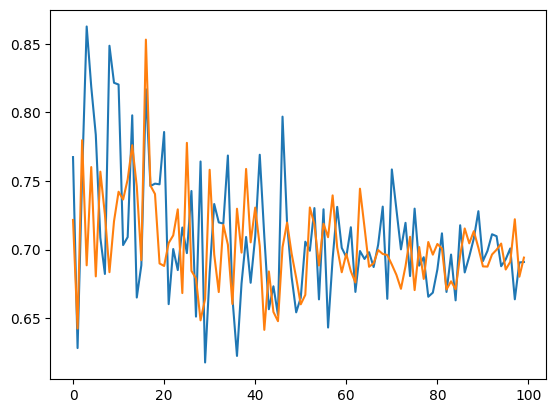

In [24]:
plt.plot(histR)
plt.plot(histF)

7/7 [==============================] - 0s 2ms/step


Text(0.5, 1.0, 'Após 200 épocas')

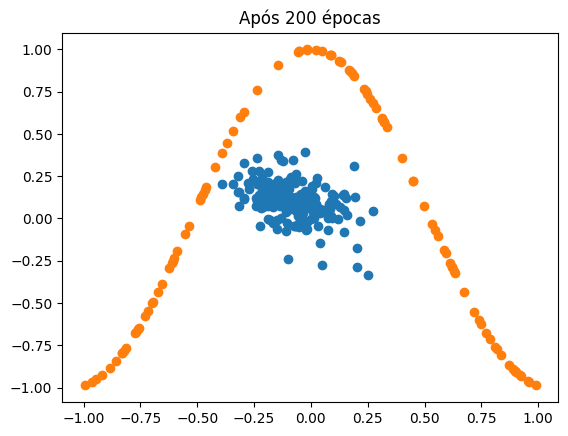

In [25]:
x_falso, y_falso = gera_exemplos_falsos(model_gen, z_dim, 200)
plt.scatter(x_falso[:,0],x_falso[:,1])
plt.scatter(x_real[:,0],x_real[:,1]); plt.title('Após 200 épocas')

In [26]:
fit_GAN(model_gen, model_dis, model_GAN, z_dim, 2800, 32, verbose=False)

1/1 [==============================] - 0s 33ms/step


KeyboardInterrupt: ignored

4/4 [==============================] - 0s 3ms/step


Text(0.5, 1.0, 'Após 3000 épocas')

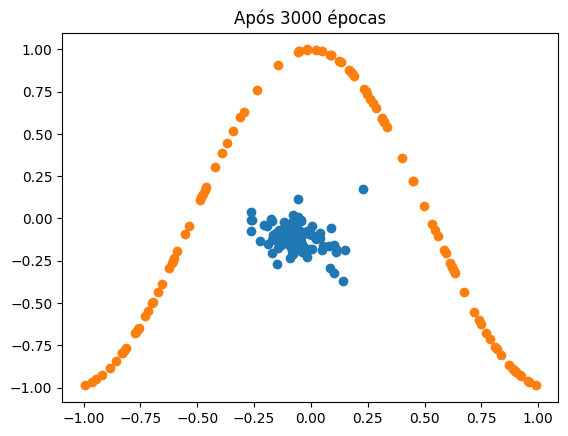

In [27]:
x_falso, y_falso = gera_exemplos_falsos(model_gen, z_dim, 100)
plt.scatter(x_falso[:,0],x_falso[:,1])
plt.scatter(x_real[:,0],x_real[:,1]); plt.title('Após 3000 épocas')

In [ ]:
fit_GAN(model_gen, model_dis, model_GAN, z_dim, 3000, 32, verbose=False)

Text(0.5, 1.0, 'Após 6000 épocas')

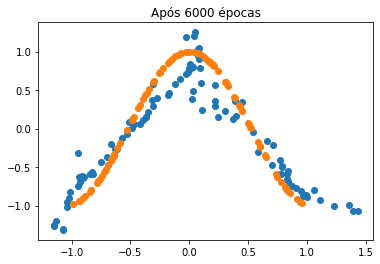

In [ ]:
x_falso, y_falso = gera_exemplos_falsos(model_gen, z_dim, 100)
plt.scatter(x_falso[:,0],x_falso[:,1])
plt.scatter(x_real[:,0],x_real[:,1]); plt.title('Após 6000 épocas')

In [ ]:
fit_GAN(model_gen, model_dis, model_GAN, z_dim, 4000, 32, verbose=False)

Text(0.5, 1.0, 'Após 10000 épocas')

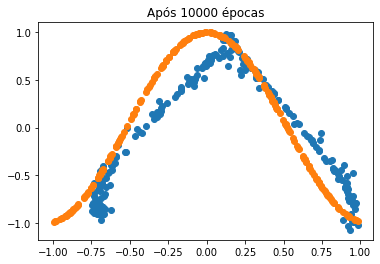

In [ ]:
x_falso, y_falso = gera_exemplos_falsos(model_gen, z_dim, 250)
x_real, y_real = distribuicao_alvo(250)
plt.scatter(x_falso[:,0],x_falso[:,1])
plt.scatter(x_real[:,0],x_real[:,1]); plt.title('Após 10000 épocas')

## <span style="color:darkred">Módulo 7 - Auto-encoders e Redes geradoras</span>
### <span style="color:darkred">Avaliação (com soluções)</span>

### Questão 1)

Qual é a principal utilidade do aprendizado de uma rede do tipo Denoising Autoencoder que recebe por entrada $x \in X$ e realiza as operações em sequência $z = f(x)$ e $\hat{x} = g(z)$, sendo $z \in Z$ um vetor num espaço latente $Z$?

<font color='red'>(a) Aprender a tarefa de reconstrução de dados do espaço $X$ adicionados de ruído, em uma representação não ruidosa, e como efeito colateral um espaço $Z$ contendo atributos relevantes de $X$<br></font>
(b) Aprender uma distribuição contínua dos dados de entrada $X$, ou seja $p(X)$, a partir da amostragem de ruído obtido pela distribuição Normal<br>
(c) Aprender a reconstruir um exemplo $\hat{x}$ com base na injeção de ruído na variável latente $z$, de forma a conter o maior número de atributos relevantes da entrada $x$, utilizando uma loss de remoção de ruído<br>
(d) Aprender a reconstruir uma representação ruidosa da entrada $x$ que contenha atributos relevantes do espaço $z$ <br>
(e) Aprender a gerar exemplos artificiais $\hat{x}$ sem ruído a partir de dados ruidosos na distribuição latente $Z$<br>

**Justificativa:** o denoising autoencoder aprende uma representação restrita $Z$ do espaço de entrada $X$ por meio da tarefa de reconstrução de dados ruidosos em dados sem ruído. As alternativas incorretas são: (b) o Autoencoder não aprende $p(X)$ mas uma relação entre o espaço X e o espaço latente Z e sua reconstrução de volta em $X$, (c) o Denoising Autoencoder não injeta ruído no espaço latente, (d) o Denoising Autoencoder não reconstrói dados ruidosos e sim dados sem ruído a partir da entrada ruidosa, (e) o autoencoder não é um bom modelo para geração de dados, e em particular não lida com uma distribuiçã latente ruidosa e sim uma entrada ruidosa.

---
### Questão 2)


Qual o motivo principal da dificuldade em treinar modelos do tipo Generative Adversarial Networks, na sua forma clássica?

 (a) Porque são redes semi-supervisionadas, e assim ao não conter rótulos explícitos para o cenário de geração, apenas para de discriminação, o aprendizado é mais difícil nesse cenário<br>
 (b) Porque aprende a distribuição dos dados de forma explícita, em contraste com outros métodos que possuem a distribuição de forma implícita<br>
 (c) Devido à dificuldade em encontrar uma distribuição latente aleatória que seja adequada para o problema<br>
 (d) É difícil de encontrar conjuntos de treinamento suficientemente grandes para essa tarefa<br>
 <font color='red'>(e) Devido à necessidade de otimizar dois componentes, um minimizando e o outro maximizando a mesma função objetivo</font><br>

 **Justificativa**: os dois componentes: gerador e discriminador, competem entre si e seu processo de otimização faz com que se alternem dificultando que o gerador aprenda a partir de um certo ponto. As alternativas incorretas: (a) GANS não são semi-supervisionadas pois não trabalham com bases de dados parcialmente rotuladas, (b) GANS não assumem aprendizado explícito da distribuição dos dados, e sim de forma implícita, (c) a distribuição latente aleatória não é o principal motivo da dificuldade, sendo possível escolher a partir de diversas distribuições, (d) a rede é não supervisionada assim não é difícil encontrar conjuntos de treinamento já que se podem usar dados não anotados.

---
### Questão 3)

A diferença entre o espaço latente ($Z$) aprendido por um Autoencoder convencional (AE) e um Variational Autoencoder (VAE) é:

 (a) O AE aprende um espaço a partir de distribuições de probabilidade aprendidas enquanto o VAE aproxima um espaço de projeções discretas de cada instância de treinamento<br>
 (b) O espaço do AE pode ser overcomplete ou undercomplete, enquanto o do VAE é apenas overcomplete<br>
 <font color='red'>(c) O AE aprende um espaço a partir de projeções discretas de cada instância de treinamento, enquanto o VAE aproxima um espaço contínuo por meio do aprendizado de parâmetros de distribuições</font><br>
 (d) O espaço do AE é não interpretável, já o espaço aprendido pelo VAE se pode interpretar a partir de cada variável independente<br>
 (e) O AE aprende um espaço contínuo a partir de projeções discretas de cada instância de treinamento, enquanto o VAE aproxima um espaço discreto por meio do aprendizado de parâmetros de distribuições<br>

  **Justificativa**: O encoder do AE convencional realiza uma operação discreta para cada ponto de entrada, sendo difícil interpolar entre esses pontos, já o VAE amostra a partir de distribuições o que facilita essa interpolação aproximando um espaço contínuo. As alternativas incorretas: (a) o VAE não aprende um espaço de projeções discretas, (b) ambos podem ser over ou undercomplete, (d) a interpretabilidade dos espaços não é distinta, (e) o AE não aprende um espaço contínuo, e o VAE não aprende um espaço discreto, e sim o contrário.

---

### Questão 4)

Nessa questão você deverá projetar e treinar um Autoencoder a partir do qual utilizaremos seu componente Decoder. Siga como base o código disponível no notebook, e preencha com seu código conforme necessário para cumprir as tarefas a seguir.

Carregue a base de dados `wine.csv`, com uma divisão hold-out utilizando os 80% exemplos iniciais para treinamento e os restantes para teste. Utilizaremos o StandardScaler para normalizar os dados.

Projete um Denoising Autoencoder (usaremos uma camada de dropout na entrada como "ruído" impulsivo) para produzir um espaço de características com 3 dimensões, com as seguinte arquitetura:

*Encoder*:
* Entrada (com as dimensões da base de dados)
* Dropout de 0.25
* Camada densa de 6 neurônios e ativação tangente hiperbólica
* Camada densa de 3 neurônios (camada de código) e ativação tangente hiperbólica

*Decoder*:
* Camada densa de 6 neurônios e ativação tangente hiperbólica (recebe como entrada o código do encoder)
* Camada densa de saída (com as dimensões da base de dados) e ativação tangente hiperbólica


OBS: código é o nome que se dá à camada latente do Autoencoder, geralmente aquela contendo a maior restrição de dimensionalidade, que fornece um espaço de características compacto para os dados de entrada. Também chamamos de código as características obtidas a partir dessa camada.

Inicialize as sementes `seed(1)` e `set_seed(2)` antes de instanciar o modelo, compilar e treinar.

Utilize a função de custo mean absolute error (mse), otimizador Adam com taxa 0.0001, batchsize 10 e treine por 250 épocas.

Após o treinamento, iremos utilizar o decoder para gerar um dataset artificial. Para isso:
1. Crie um array de tamanho 2000 x 3 com valores obtidos pela distribuição uniforme (`np.random.rand()`), e depois normalize os valores para o intervalo entre -1 e 1 usando o MinMaxScaler. Esses valores serão utilizados como amostras aleatórias do código.
2. Passe esse array pelo decoder e obtenha como saída um dataset artificial com 2000 instancias na dimensionalidade original dos dados da base wine.
3. Para rotular essas instâncias, iremos utilizar um classificador KNN treinado no conjunto de treinamento da base original wine, com K=5. Após treinar o classificador, aplicá-lo no dataset artificial, obtendo seus rótulos, ou seja consideraremos como rótulo o que o KNN classificar. A seguir selecionaremos apenas as instâncias e seus respectivos rótulos que receberam probabilidade igual ou superior a 0.99 pelo classificador, gerando um dataset mais reduzido. Esse será nosso dataset artificial final.
4. Treine dois classificadores SVM com C=1, random_state=1, e kernel="linear"
  - o primeiro usando os dados de treinamento originais
  - o segundo usando como treinamento os dados artificiais/sintéticos
5. Avalie ambos no conjunto de testes original usando a acurácia.

Em qual intervalo estão as acurácias dos classificadores considerando o uso de dados originais e artificiais?

(a) dados originais=[55,70], dados artificiais=[25,40]<br>
(b) dados originais=[55,70], dados artificiais=[55,70]<br>
(c) dados originais=[85,100], dados artificiais=[25,40]<br>
(d) dados originais=[85,100], dados artificiais=[55,70]<br>
<font color='red'>(e) dados originais=[85,100], dados artificiais=[85,100]<br></font>

 **Justificativa**: Ver código abaixo.

In [ ]:
%%capture
!pip install tensorflow tensorflow-datasets

In [ ]:
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

# Carregar os dados do conjunto de dados Wine da UCI
url = "https://archive.ics.uci.edu/ml/machine-learning-databases/wine/wine.data"
column_names = [
    'Class',
    'Alcohol',
    'Malic acid',
    'Ash',
    'Alcalinity of ash',
    'Magnesium',
    'Total phenols',
    'Flavanoids',
    'Nonflavanoid phenols',
    'Proanthocyanins',
    'Color intensity',
    'Hue',
    'OD280/OD315 of diluted wines',
    'Proline'
]
data = pd.read_csv(url, names=column_names)

# extrair features e labels
features = data.drop('Class', axis=1)
labels = data['Class']

# divisao treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42)

In [ ]:
X_train

,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280/OD315 of diluted wines,Proline
158,14.34,1.68,2.70,25.0,98,2.80,1.31,0.53,2.70,13.00,0.57,1.96,660
137,12.53,5.51,2.64,25.0,96,1.79,0.60,0.63,1.10,5.00,0.82,1.69,515
98,12.37,1.07,2.10,18.5,88,3.52,3.75,0.24,1.95,4.50,1.04,2.77,660
159,13.48,1.67,2.64,22.5,89,2.60,1.10,0.52,2.29,11.75,0.57,1.78,620
38,13.07,1.50,2.10,15.5,98,2.40,2.64,0.28,1.37,3.70,1.18,2.69,1020
...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,13.86,1.51,2.67,25.0,86,2.95,2.86,0.21,1.87,3.38,1.36,3.16,410
106,12.25,1.73,2.12,19.0,80,1.65,2.03,0.37,1.63,3.40,1.00,3.17,510
14,14.38,1.87,2.38,12.0,102,3.30,3.64,0.29,2.96,7.50,1.20,3.00,1547
92,12.69,1.53,2.26,20.7,80,1.38,1.46,0.58,1.62,3.05,0.96,2.06,495


In [ ]:
import numpy as np
import tensorflow as tf
import pandas as pd
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import models
from numpy.random import seed
from tensorflow.random import set_seed
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [ ]:
scaler = StandardScaler()
X_train_n = scaler.fit_transform(X_train)
X_test_n = scaler.transform(X_test)

In [ ]:
### Projetar modelo de autoencoder

In [ ]:
def autoencoder(input_dim, code_dim, dropout_rate=0.0):
    input_x = keras.layers.Input(shape=(input_dim,))
    xe = keras.layers.Dropout(dropout_rate)(input_x)
    xe = keras.layers.Dense(input_dim//2, activation='tanh')(xe)
    z = keras.layers.Dense(code_dim, activation='tanh', name='code')(xe)
    xd = keras.layers.Dense(input_dim//2, activation='tanh', name='decoder')(z)
    output_xd = keras.layers.Dense(input_dim, activation='tanh')(xd)
    autoencoder = keras.models.Model(input_x, output_xd)
    return autoencoder

In [ ]:
### definir sementes, instanciar AE, compilar e treinar

In [ ]:
X_train_n.shape

(142, 13)

In [ ]:
epochs = 250
batch_size = 10

seed(1)
set_seed(2)

code_dims = 3

# instanciar AE
# compilar AE
# treinar AE
autoencoder1 = autoencoder(X_train_n.shape[1], code_dims, dropout_rate=0.25)
autoencoder1.compile(loss='mse', optimizer=keras.optimizers.Adam(learning_rate=0.0001))
hist1 = autoencoder1.fit(X_train_n, X_train_n, batch_size=batch_size, epochs=epochs, verbose=0)

In [ ]:
# computa erro de treinamento
scores1 = autoencoder1.evaluate(X_train_n, X_train_n)

5/5 [==============================] - 0s 3ms/step - loss: 0.6275


In [ ]:
# montar decoder, gerar array com 2000 x 3 numeros aleatorios, e escalar para -1,1
# passar array pelo decoder, obtendo um dataset artificial

In [ ]:
decoder_ae = keras.models.Model(inputs=autoencoder1.get_layer('decoder').input, outputs=autoencoder1.output)
z_sample = np.random.rand(2000,3)
scaler = MinMaxScaler(feature_range=(-1, 1))
z_sample = scaler.fit_transform(z_sample)

train_aug = np.asarray(decoder_ae.predict(z_sample))

63/63 [==============================] - 0s 2ms/step


In [ ]:
# treinar KNN (K=5) com base de dados original
# usá-lo para rotular o dataset artificial
# selecionar apenas as instancias artificiais que receberam probabilidade maxima >= 0.99

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train_n, y_train)

# Predicting labels for the unlabeled data
y_augmented = knn.predict(train_aug)
prob_augmented = knn.predict_proba(train_aug)

In [ ]:
threshold = 0.99
max_probs = np.max(prob_augmented, axis=1)

selected_indices = np.where(max_probs >= threshold)[0]
train_aug_selected = train_aug[selected_indices]
y_augmented = y_augmented[selected_indices]
print(f'Total selected: {train_aug_selected.shape[0]}')

Total selected: 962


In [ ]:
# treinar classificadores SVM com a base original e artificial
# avaliar ambos no teste original, usando acuracia

In [ ]:
from sklearn import svm

In [ ]:
clf1 = svm.SVC(C=10, random_state=1, kernel="linear")
clf1.fit(X_train_n, y_train)
score1 = clf1.score(X_test_n, y_test)

In [ ]:
clf2 = svm.SVC(C=1, random_state=1, kernel="linear")
clf2.fit(train_aug_selected, y_augmented)
score2 = clf2.score(X_test_n, y_test)

print(f'Acc Original = {score1*100:.1f}%')
print(f'Acc Augmented = {score2*100:.1f}%')

Acc Original = 97.2%
Acc Augmented = 91.7%


In [ ]:
### Código complementar - para entendimento da base artificial

### Obter características a partir da camada de código do autoencoder
### - para a base original
### - para a base artificial selecionada

In [ ]:
code_model1 = keras.models.Model(inputs=autoencoder1.input, outputs=autoencoder1.get_layer('code').output)

In [ ]:
code_test = np.asarray(code_model1.predict(X_test_n))
code_augmented = np.asarray(code_model1.predict(train_aug_selected))

45/45 [==============================] - 0s 1ms/step


Text(0.5, 1.0, 'Espaço latente Teste')

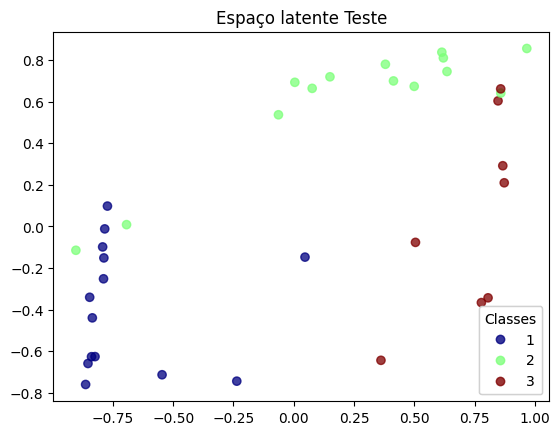

In [ ]:
### Exibir as duas primeiras caracerísticas para análise visual
size_sample = len(X_test)
fig, ax = plt.subplots()
scatter = ax.scatter(code_test[:size_sample,0], code_test[:size_sample,1], c=y_test[:size_sample], alpha=0.75, cmap="jet")
legend1 = ax.legend(*scatter.legend_elements(), loc="lower right", title="Classes")
ax.add_artist(legend1)
plt.title('Espaço latente Teste')

Text(0.5, 1.0, 'Espaço latente Dados Gerados')

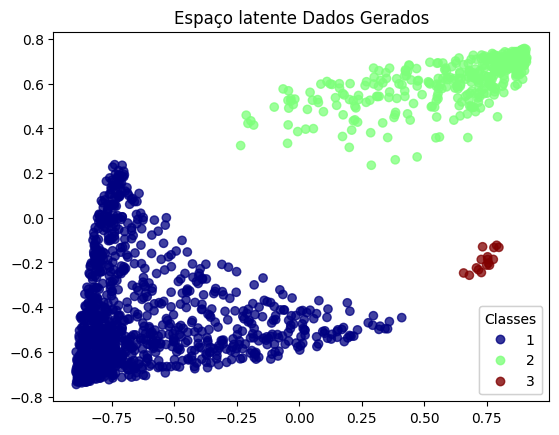

In [ ]:
### Exibir as duas primeiras caracerísticas para análise visual
size_sample = len(train_aug_selected)
fig, ax = plt.subplots()
scatter = ax.scatter(code_augmented[:size_sample,0], code_augmented[:size_sample,1], c=y_augmented[:size_sample], alpha=0.75, cmap="jet")
legend1 = ax.legend(*scatter.legend_elements(), loc="lower right", title="Classes")
ax.add_artist(legend1)
plt.title('Espaço latente Dados Gerados')

---

### Questão 5)

Nessa questão você deverá projetar e treinar um Autoencoder para posteriormente utilizar o seu Encoder como forma de reduzir dimensionalidade. Siga como base o código disponível no notebook, e preencha com seu código conforme necessário para cumprir as tarefas a seguir.

Carregue a base de dados `wine.csv`, com uma divisão hold-out utilizando os 80% exemplos iniciais para treinamento e os restantes para teste. Utilizaremos um StandardScaler para pré-processar os dados antes de utilizá-los no experimento.

Projete um Denoising Autoencoder (o dropout na camada de entrada irá gerar o ruído) para produzir uma projeção em 1 dimensão, com as seguintes camadas:
* Entrada (com as dimensões originais da base de dados)
* Dropout de 0.25
* Camada densas com 8 neurônios, ativação tangente hiperbólica
* Camada densa com 1 neurônio (camada de código), ativação tangente hiperbólica
* Camada densas com 8 neurônios, ativação tangente hiperbólica
* Camada densa de saída (com as dimensões originais da base de dados), ativação tangente hiperbólica

Realize 5 experimentos (treinamentos) com as sementes 1, 3, 5, 7 e 13. Inicialize as sementes `seed()` e `set_seed()` antes de instanciar o modelo, compilar e treinar (com o conjunto de treinamento).

Em todas as rodadas, utilize a função de custo mean squared error (MSE), otimizador Adam com taxa 0.001, batchsize 4 e treine por 300 épocas.

Após cada treinamento:
1. Calcule o MSE (do autoencoder) no conjunto de teste (use o método `evaluate`)
2. Obtenha as características a partir do código de 1 dimensões para o conjunto de treinamento e de teste. Treine um classificador SVM (utilizando `SVC(C=1, random_state=seed, kernel="linear")`, sendo `seed` a mesma do treinamento da rede neural, com o código de treinamento. Calcule a acurácia obtida pelo SVM no conjunto de teste (utilizando também as características obtidas a partir do autoencoder).

Os valores observados da média do MSE no teste do autoencoder, e média da acurácia de classificação SVM no teste estão em qual intervalo?

(a) MSE =[0.49, 0.60]; Acurácia = [0.65, 0.74] <br>
(b) MSE =[0.49, 0.60]; Acurácia = [0.78, 0.87] <br>
(c) MSE =[0.19, 0.30]; Acurácia = [0.78, 0.87] <br>
<font color='red'>(d) MSE =[0.49, 0.60]; Acurácia = [0.90, 0.99] <br></font>
(d) MSE =[0.19, 0.30]; Acurácia = [0.90, 0.99] <br>

 **Justificativa**: Ver código abaixo.

In [7]:
import numpy as np
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import models
from numpy.random import seed
from tensorflow.random import set_seed
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn import svm

# Carregar os dados do conjunto de dados Wine da UCI
url = "https://archive.ics.uci.edu/ml/machine-learning-databases/wine/wine.data"
column_names = [
    'Class',
    'Alcohol',
    'Malic acid',
    'Ash',
    'Alcalinity of ash',
    'Magnesium',
    'Total phenols',
    'Flavanoids',
    'Nonflavanoid phenols',
    'Proanthocyanins',
    'Color intensity',
    'Hue',
    'OD280/OD315 of diluted wines',
    'Proline'
]
df = pd.read_csv(url, names=column_names)

df.dropna(inplace=True)
print(df.head())
classif = np.array(df['Class'].astype("category").cat.codes)
df_features = df.drop('Class', axis=1)
print(f'Features: {list(df_features.columns)}')
features = df_features.values
print(features.shape)

X_train, X_test, y_train, y_test = train_test_split(features, classif, test_size=0.20, random_state=0)
print("Exemplos de treinamento:", len(X_train))
print("Exemplos de teste:", len(X_test))

scaler = StandardScaler()
X_train_n = scaler.fit_transform(X_train)
X_test_n = scaler.transform(X_test)

   Class  Alcohol  Malic acid   Ash  Alcalinity of ash  Magnesium  \
0      1    14.23        1.71  2.43               15.6        127   
1      1    13.20        1.78  2.14               11.2        100   
2      1    13.16        2.36  2.67               18.6        101   
3      1    14.37        1.95  2.50               16.8        113   
4      1    13.24        2.59  2.87               21.0        118   

   Total phenols  Flavanoids  Nonflavanoid phenols  Proanthocyanins  \
0           2.80        3.06                  0.28             2.29   
1           2.65        2.76                  0.26             1.28   
2           2.80        3.24                  0.30             2.81   
3           3.85        3.49                  0.24             2.18   
4           2.80        2.69                  0.39             1.82   

   Color intensity   Hue  OD280/OD315 of diluted wines  Proline  
0             5.64  1.04                          3.92     1065  
1             4.38  1.05  

In [3]:
def deep_autoencoder(neurons, input_dim, code_dim, n_layers=1, dropout_rate=0.0):

    input_data = keras.layers.Input(shape=(input_dim,))
    x = keras.layers.Dropout(dropout_rate)(input_data)
    x = keras.layers.Dense(neurons, activation='tanh')(x)
    z = keras.layers.Dense(code_dim, activation='tanh', name='code')(x)
    x = keras.layers.Dense(neurons, activation='tanh')(z)
    output = keras.layers.Dense(input_dim, activation='tanh')(x)
    autoencoder = keras.models.Model(input_data, output)

    return autoencoder

In [4]:
epochs = 250
batch_size = 4
code_dims = 1

def scheduler(epoch, lr):
    lr = lr * tf.math.exp(-0.0025)
    return lr

callbacklr = keras.callbacks.LearningRateScheduler(scheduler)

In [5]:
seeds_list = [1, 3, 5, 7, 13]

mse_list = []
acc_list = []

for sd in seeds_list:
    seed(sd)
    set_seed(sd)

    print(f'Seed: {sd}')

    autoencoder2 = deep_autoencoder(8, X_train_n.shape[1], code_dims, 3, dropout_rate=0.25)
    autoencoder2.compile(loss='mse', optimizer=keras.optimizers.Adam(learning_rate=0.001))
    hist2 = autoencoder2.fit(X_train_n, X_train_n, batch_size=batch_size, callbacks=[callbacklr],
                        epochs=epochs, verbose=0)

    scores2 = autoencoder2.evaluate(X_train_n, X_train_n, verbose=0)
    print(f'MSE treinamento: {scores2:.4f}')
    scores3 = autoencoder2.evaluate(X_test_n, X_test_n, verbose=0)
    print(f'MSE teste: {scores3:.4f}')

    mse_list.append(scores3)

    code_modelae = keras.models.Model(inputs=autoencoder2.input, outputs=autoencoder2.get_layer('code').output)
    code_train = np.asarray(code_modelae.predict(X_train_n, verbose=0))

    clf2 = svm.SVC(C=1, random_state=sd, kernel="linear")
    clf2.fit(code_train, y_train)

    code_test = np.asarray(code_modelae.predict(X_test_n, verbose=0))

    score = clf2.score(code_test, y_test)

    print(f'SVM accuracy: {score*100:.1f}\n')
    acc_list.append(score)

Seed: 1
MSE treinamento: 0.5352
MSE teste: 0.5502
SVM accuracy: 100.0

Seed: 3
MSE treinamento: 0.5681
MSE teste: 0.5922
SVM accuracy: 100.0

Seed: 5
MSE treinamento: 0.5855
MSE teste: 0.6089
SVM accuracy: 86.1

Seed: 7
MSE treinamento: 0.5594
MSE teste: 0.5804
SVM accuracy: 94.4

Seed: 13
MSE treinamento: 0.6018
MSE teste: 0.6316
SVM accuracy: 91.7



In [8]:
print(f'MSE médio: {np.mean(mse_list):.2f}')
print(f'Acurácia média: {np.mean(acc_list):.2f}')

MSE médio: 0.59
Acurácia média: 0.94


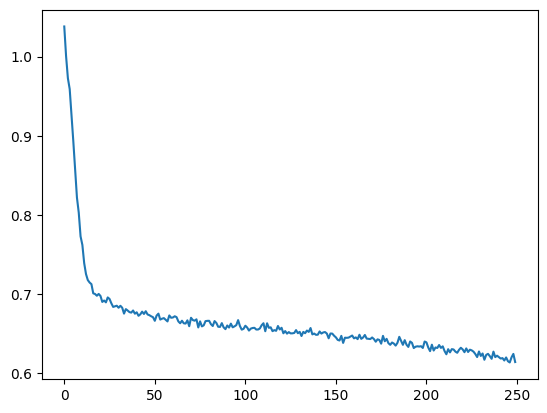

In [9]:
plt.plot(hist2.history['loss'])

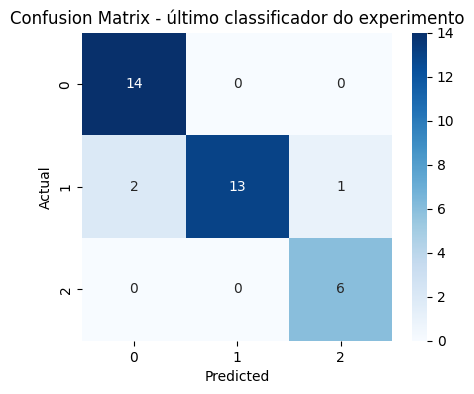

In [13]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Predicoes do último classificador
y_pred = clf2.predict(code_test)

# Matriz de confusão
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(5, 4))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - último classificador do experimento')
plt.show()


### <span style="color:darkred">Módulo 8 -  Introdução ao Aprendizado por Reforço</spa


### <span style="color:darkred">Avaliação<respostas

---

### Questão 1)

Qual das alternativas melhor descreve o processo de treinamento de um modelo de aprendizado por reforço?

(a) Aprender a classificar exemplos anotados de uma base de dados, de forma a  possibilitar inferir ações futuras para exemplos não vistos durante o treinamento<br>
<span style="color:red">(b) Aprender a selecionar as melhores ações em cada estado, estimando a maior recompensa futura com base em múltiplos experimentos simulados<br></span> 
(c) Buscar em uma base de ações disponíveis aquela que seja mais similar à ações anteriores de forma a ter maior estabilidade nas ações futuras<br>
(d) Encontrar similaridades em um espaço de ações e estados, de forma que seja possível entender como se agrupam as ações, ou seja, quais subconjuntos de ações e estados são similares, e quais são distintos, permitindo agrupá-los pelo nível de recompensa. <br>
(e) Aprender usando busca exaustiva, avaliando em cada estado todas as ações possíveis e, em cada episódio, caso uma ação gere baixa recompensa, voltar atrás nos estados anteriores para rever as ações tomadas e maximizar a recompensa naquele episódio.<br>


---
## Questão 2)

Quais algoritmos representam as duas principais abordagens no treinamento de modelos de aprendizado por reforço?

 <span style="color:red">(a) Aprendizado da função valor e Aprendizao de políticas de seleção de ações<br></span>
 (b) Otimização da Máxima Recompensa e Aprendizado por Agente-Estado-Ambiente<br>
 (c) Actor-Critic e Feed-forward network<br>
 (d) Adam e Momentum<br>
 (e) Backpropagation e Stochastic Gradient Descent<br>

---
### Questão 3)

Ao usar uma rede neural para otimizar algoritmos de aprendizado por reforço, considerando Policy Learning e Value Learning, dado como entrada um estado atual, como deve ser projetada a tarefa de forma a gerar uma saída da rede neural condizente com essas abordagens?

 a) Policy: classificação da ação que obterá a maior recompensa. Value: regressão do valor de recompensa de todas as ações disponíveis<br>
 (b) Policy: regressão do valor de recompensa de todas as ações disponíveis. Value: classificação selecionando a ação de maior valor futuro; <br>
 (c) Policy: classificação da ação que obterá a menor recompensa, de forma a evitá-la. Value: classificação da ação de maior recompensa selecionando-a diretamente<br>
 (d) Policy: classificação do próximo estado. Value: regressão do valor de recompensa de todas as ações disponíveis<br>
 <span style="color:red"> (e) Policy: classificação da política que gerará a melhor estratégia. Value: classificação da ação que obterá a maior recompensa<br></span>


---

### Questão 4)

Usando as biblioteca `gymnasium` carregue os ambientes "Blackjack-v1", "CliffWalking-v0" e "Pendulum-v1":

Como é o espaço de ações possíveis desses ambientes?

(a) Blackjack: discreto com 2 ações, CliffWalking: discreto com 2 ações, Pendulum: contínuo com valores entre -1.0, 1.0 <br>
(b) Blackjack: discreto com 3 ações, CliffWalking: discreto com 2 ações, Pendulum: contínuo com valores entre -1.0, 1.0<br>
(c) Blackjack: discreto com 2 ações, CliffWalking: discreto com 3 ações, Pendulum: contínuo com valores entre -1.0, 1.0<br>
<span style="color:red">(d) Blackjack: discreto com 2 ações, CliffWalking: discreto com 3 ações, Pendulum: contínuo com valores entre -2.0, 2.0<br> </span>
(e) Blackjack: discreto com 3 ações, CliffWalking: discreto com 3 ações, Pendulum: contínuo com valores entre -2.0, 2.0<br>

In [22]:
import gymnasium as gym

In [23]:
#Blackjack 

env1 = gym.make("Blackjack-v1")
print(env1.observation_space)
print(env1.action_space)

Tuple(Discrete(32), Discrete(11), Discrete(2))
Discrete(2)


In [24]:
#CliffWalking-v0 

env1 = gym.make("CliffWalking-v0")
print(env1.observation_space)
print(env1.action_space)

Discrete(48)
Discrete(4)


In [25]:
# Pendulum

env1 = gym.make("Pendulum-v1")
print(env1.observation_space)
print(env1.action_space)

Box([-1. -1. -8.], [1. 1. 8.], (3,), float32)
Box(-2.0, 2.0, (1,), float32)


---

### Questão 5)

Carregue o ambiente `FrozenLake-v1` conforme o código do notebook. Este ambiente faz parte dos ambientes Toy Text, que contêm informações gerais sobre o ambiente.

Frozen Lake envolve atravessar um lago congelado do início ao objetivo sem cair em nenhum buraco, andando sobre o lago congelado. O jogador pode nem sempre se mover na direção pretendida devido à natureza escorregadia do lago congelado.

Espaço de Ação: são possíveis as seguintes ações, indicando em que direção mover o jogador. <br>
    0: Mover para a esquerda <br>
    1: Mover para baixo <br>
    2: Mover para a direita <br>
    3: Mover para cima <br>

Espaço de Observação: a observação é um valor que representa a posição atual do jogador como `current_row * nrows + current_col` (onde tanto a linha quanto a coluna começam em 0). <br>
Por exemplo, a posição do objetivo em um mapa de tamanho 4x4 pode ser calculada da seguinte forma: `3 * 4 + 3 = 15`. O número de observações possíveis depende do tamanho do mapa. <br>

Recompensas: <br>
    - Alcançar o objetivo: +1 <br>
    - Chegar a um buraco: 0 <br>
    - Chegar a uma área congelada: 0 <br>

Estados de Fim do Episódio:<br>
- O jogador se move para um buraco.<br>
- O jogador alcança o objetivo (posição específica do mapa)<br>

Execute 100 mil episódios aleatórios, amostrando aleatoriamente (sample) do espaço de ações. Cada episódio deve executar até chegar ao fim.<br>

Calcule e indique a alternativa correta dentro ds intervalos de:<br>
- Média de ações por episódio (MA)<br>
- Porcentagem de episódios com sucesso (PS)<br>
- Porcentagem de episódios com falha (PF)<br>

Para as porcentagens, considere valores do tipo XXX%, arredondando casas decimais, por ex.: 5%, 100%.<br>

(a) MA = [5,10]; PS = [0%,2%]; PF = [98%,100%]<br>
(b) MA = [5,10]; PS = [10%,15%]; PF = [85%,90%]<br>
(c) MA = [5,10]; PS = [45%,50%]; PF = [50%,55%]<br>
(d) MA = [11,16]; PS = [10%,15%]; PF = [85%,90%]<br>
(e) MA = [11,16]; PS = [45%,50%]; PF = [50%,55%]<br>


In [26]:
import gymnasium as gym
import numpy as np

In [61]:
env = gym.make("FrozenLake-v1", map_name="4x4", is_slippery=True)
print(env.observation_space)
print(env.action_space)


Discrete(16)
Discrete(4)


In [67]:
n_episodios = 100000
episodios = np.empty((n_episodios,3))


for t in range(n_episodios):
    observation, info = env.reset()
    steps = 0
    terminated = False
    truncated = False
    while not terminated or truncated:
        action = env.action_space.sample()
        observation, reward, terminated, truncated, info = env.step(action)
        steps += 1
        
    episodios[t] = [observation, reward, steps]

    
env.close()



In [68]:
# Média de observações:
print('Média de observações', round(np.mean(episodios[:,0]),2) )

#Média de passos:
print('Média de passos', round(np.mean(episodios[:,2]),2) )


Média de observações 6.45
Média de passos 7.65


In [70]:
#Porcentagem de episódios com acertos e falhas
teste = np.array(episodios[:,1] == 1)
results = np.unique(teste, return_counts=True)
acertos = results[1][1] 
falhas = results[1][0]

print('Número de episódios com acertos:', acertos)
print("Percentual de episódios com acertos:" , round((acertos/n_episodios)*100,2), '%' )
print("Percentual de episódios com falhas:" , round((falhas/n_episodios)*100,2), '%' )



Número de episódios com acertos: 1362
Percentual de episódios com acertos: 1.36 %
Percentual de episódios com falhas: 98.64 %


## <span style="color:darkred">Módulo VII -  Introdução ao Aprendizado por Reforço</span>
### <span style="color:darkred">Exercícios (com soluções)</span>

## Parte 1: Exercícios essenciais

### Exercício 1)

Qual alternativa descreve a comparação entre os objetivos da análise de agrupamentos e o aprendizado por reforço?

 <font color='red'>(a) A análise de agrupamentos visa encontrar estrutura nos dados com base na similaridade ou diferença em suas características, enquanto que o aprendizado por reforço objetiva maximizar recompensa futura mapeando observações em ações por meio de uma política<br></font>
 (b) A análise de agrupamentos e aprendizado por reforço não possuem supervisão, possuindo algoritmos para treinamento similar, sua diferença está apenas na formulação do problema<br>
 (c) A análise de agrupamentos é não supervisionada, enquanto que o aprendizado por reforço é semi-supervisionado<br>
 (d) A análise de agrupamentos visa encontrar estrutura nos dados com base em suas características, enquanto que o por reforço visa encontrar um mapeamento entre características e as melhores ações possíveis segundo previamente rotuladas por um especialista<br>

 **Justificativa**: A análise de agrupamento é um método não supervisionado para encontrar (dis)similaridade entre exemplos. O aprendizado por reforço também pode ser considerado sem supervisão no sentido de não haver anotações ou rotulos manualmente definidos - assim não é supervisionado nem semi-supervisionado. Apesar de ambas não supervisionadas, aprendizado por reforço e agrupamentos são tarefas distintas e requerem algoritmos diferentes.

---

### Exercício 2)

São componentes fundamentais do aprendizado por reforço:

 (a) Policy learning, estados e redes neurais profundas<br>
 (b) Histórico, camadas convolucionais, agente e inicialização<br>
 <font color='red'>(c) Agente, ambiente, estado, política de ação e função valor</font><br>
 (d) Value learning, estados e redes neurais profundas<br>

 **Justificativa**: Redes neurais profundas e camadas convolucionais podem fazer parte de uma solução para aprendizado por reforço, mas não são compontentes fundamentais.

---
### Exercício 3)

Qual os passos básicos de um algoritmo de aprendizado de políticas (policy learning)?

 (a) Inicializar agente, com a política atual executar uma ação, obter uma recompensa, reforçar a política atual se essa produziu recompensa positiva nessa iteração.<br>
 (b) Inicializar agente, executar política até estado terminal, e repetir esse processo múltiplas vezes, selecionando o episódio com a maior recompensa total<br>
 <font color='red'>(c) Inicializar agente, executar política até estado terminal, armazenar: estados, ações e recompensas, reduzir probabilidade de ações com baixa recompensa, Aumentar probabilidade de ações com alta recompensa</font><br>
 (d) Inicializar agente, utilizar rede neural para otimizar a melhor política em cada ação realizada.<br>

 **Justificativa**: O Policy learning executa política até o estado terminal para determinar as recompensas, não sendo um método que adapta por passo/iteração, mesmo quando usando uma rede neural. O processo é repetido múltiplas vezes mas todos os episódios são usados para adaptação do modelo, não apenas o com maior recompensa

---
### Exercício 4)

Dado um problema, como projetá-lo para ser resolvido com aprendizado por reforço?

(a) Organizar os dados em pares $(x,y)$ sendo $x$ os dados de entrada e $y$ o espaço de saída ou alvo para que seja aprendido um mapeamento $X \rightarrow Y$<br>
<font color='red'>(b) Formular o problema como o de um agente que executa ações e maximiza a recompensa dessas ações com base na solução encontrada<br></font>
(c) Coletar dados e organizá-los em uma base dividida em instâncias $x \in X$ para que sejam inspecionadas por funções de distância e particionar o espaço $X$<br>
(d) Projetar o problema para funcionar com um agente que explora um ambiente e encontra o resultado por tentativa e erro com backtracking<br>

**Justificativa**: O problema é sempre colocado no sentido de ações realizadas por um agente a partir de uma política. Não há um espaço de saída explícito, nem divisão em instâncias para particionamento. Ainda, backtracking não é uma estratégia típica de aprendizado por reforço, sendo baseada em múltiplos episódios, ao invés de retornar a um ponto da execução.

---

### Exercício 5)

Carregue o ambiente `Pendulum-v1`. Procure mais obre esse ambiente em https://gymnasium.farama.org/environments/classic_control/pendulum/.

Como é formulado o espaço de ações e observação desse problema?

 a) Espaço de ações: contínuo entre -1 e 1; Espaço de Observações: 2 valores contínuos.<br>
 b) Espaço de ações: contínuo entre -1 e 1; Espaço de Observações: 3 valores contínuos.<br>
 c) Espaço de ações: contínuo entre -2 e 2; Espaço de Observações: 2 valores contínuos.<br>
<font color='red'> d) Espaço de ações: contínuo entre -2 e 2; Espaço de Observações: 3 valores contínuos.</font><br>

**Justificativa**: ver abaixo o código.

In [1]:
#%%capture
!pip install gymnasium

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.9/953.9 kB 11.3 MB/s eta 0:00:00


In [2]:
import gymnasium as gym

env1 = gym.make("Pendulum-v1")
print(env1.observation_space)

env2 = gym.make("Pendulum-v1")
print(env2.action_space)

Box([-1. -1. -8.], [1. 1. 8.], (3,), float32)
Box(-2.0, 2.0, (1,), float32)


---

### Exercício 6)

Retome o problema do taxi visto em aula. Sem realizar aprendizado, isso é, apenas usando ações aleatórias, defina a semente random.seed(1) e execute 10000 episódios até o fim, armazenando no final de cada episódio a recompensa total obtida e o número de passos necessários para finalizar o episódio. Calcule a média de passos por episódio e a média de recompensas por episódio.

Qual alternativa descreve o valor da média de recompensas e média de passos, sem considerar casas decimais?

<font color='red'>a) Média de recompensas é negativa, Média de passos é próxima a 200<br></font>
 b) Média de recompensas é negativa, Média de passos é próxima a 50<br>
 c) Média de recompensas é positiva, Média de passos é próxima a 200 <br>
 d) Média de recompensas é positiva, Média de passos é próxima a 50<br>

In [3]:
import gym
import numpy as np
import random
from IPython.display import clear_output

env = gym.make("Taxi-v3")

n_episodios = 10000

/usr/local/lib/python3.10/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.10/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(


In [4]:
# historico
episodios = []

random.seed(1)

recompensas = 0
passos = 0
# episodios
for t in range(1, n_episodios+1):
    s = env.reset()
    epochs = 0
    fim = False

    # episodio atual
    while not fim:
        a = env.action_space.sample()
        # realizar acao
        s_n, r, fim, info = env.step(a)
        s = s_n
        epochs += 1
        recompensas += r

    passos += epochs

    if (t % 250 == 0):
        clear_output(wait=True)
        print("Episódio: ", t)

print("Média de recompensas por episódio %.0f" % (recompensas/(n_episodios+1)))
print("Média de passos por episódio %.0f" % (passos/(n_episodios+1)))

Episódio:  10000
Média de recompensas por episódio -771
Média de passos por episódio 196


---
## Parte 2: Exercícios Complementares

---

### Exercício 7)

Retome o problema do taxi visto em aula, utilizando o mesmo algoritmo de Value Learning, no qual a cada passo utilizamos um método de "exploration" obtendo amostras do espaço de ações por meio do `env.action_space.sample()`. Nesse exercício, vamos executar também "exploitation". Para isso modifique o treinamento conforme abaixo:
1. Crie uma nova variável `tau` que definirá a chance do algoritmo realizar "exploration".
2. Carregue o pacote `random` e antes dos episódios defina `random.seed(1)`
3. Substitua a linha em que a ação é selecionada por um condicional:
    * Se `random.uniform(0, 1)` for menor ou igual a `tau`, então realize "exploration" (da mesma forma como estava no algoritmo dado em aula)
    * Caso contrário, então realize "exploitation", isso é, obtendo a ação não aleatória, mas a partir da tabela Q aprendida até agora com `np.argmax(q_table[s])`
    
Execute dois treinamentos, 1) com `tau=0.9`, 2) com `tau=0.3`, por 3000 episódios, e logo após teste com 50 episódios novos, medindo a média de recompensas totais e média de passos por episódio. Qual foi o resultado, comparativamente?

OBS: lembre-se de definer `random.seed(1)` antes de iniciar cada experimento. Use alpha = 0.1 e gamma = 0.4
    
 a) Maior taxa de *exploitation* beneficiou o treinamento, o agente alcançou uma política que resultou em menos passos e maior recompensa média, mas mesmo usando mais **exploration** o agente também aprendeu uma política significativamente melhor do que aleatória.<br>
 b) Maior taxa de **exploration** beneficiou o treinamento, tendo o agente alcançado uma política que resultou em menos passos e maior recompensa média, enquanto que com maior *exploitation* o agente não foi capaz de aprender uma política significativamente melhor do que aleatória.<br>
 c) Os resultados foram muito similares, não sendo possível dizer qual abordagem é melhor, ambas obtiveram alguma melhoria no sentido da política aprendida<br>
 <font color='red'>d) Maior taxa de **exploration** beneficiou o treinamento, o agente alcançou uma política que resultou em menos passos e maior recompensa média, mas mesmo usando mais *exploitation* o agente também aprendeu uma política significativamente melhor do que aleatória.<br></font>

 **Justificativa**: Notar que, ao menos nos primeiros 3000 episódios uma taxa baixa de exploration impede o agente de explorar novas ações, sendo benéfico uma taxa alta de exploration e baixa de exploitation. Uma opção é aumentar a taxa de exploitation conforme aumenta o número de episódios.

In [ ]:
import gymnasium as gym
import numpy as np
import random
from IPython.display import clear_output

env = gym.make("Taxi-v3")

n_episodios = 3000

/usr/local/lib/python3.10/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.10/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(


In [ ]:
# tabela Q
q_table1 = np.zeros([env.observation_space.n, env.action_space.n])

q_table1.shape

# hiperparametros
alpha = 0.1 # taxa de aprendizado
gamma = 0.4 # desconto de recompensas futuras
tau = 0.9 # taxa de exploration

# historico
episodios = []

random.seed(1)

# episodios
for t in range(1, n_episodios+1):
    s = env.reset()

    epochs, recompensas = 0, 0
    fim = False

    # episodio atual
    while not fim:
        if random.uniform(0, 1) <= tau:
            a = env.action_space.sample() # exploration
        else:
            a = np.argmax(q_table1[s]) # exploitation

        # realizar acao
        s_n, r, fim, info = env.step(a)
        # estado subsequente s_n

        # salvo o valor atual para (s,a) - Q(s,a)
        valor_ant = q_table1[s,a]

        # verifica proximo valor
        prox_max = np.max(q_table1[s_n])

        # combina com desconto na recompensa futura
        novo_valor = (1-alpha)*valor_ant + alpha*(r+gamma*prox_max)
        q_table1[s,a] = novo_valor

        # atualiza estado
        s = s_n
        epochs += 1

    if (t % 100 == 0):
        clear_output(wait=True)
        print("Episódio: ", t)

Episódio:  3000


In [ ]:
n_episodios_teste = 50
total_epochs = 0
total_recs = 0

for i in range(n_episodios_teste):
    s = env.reset()
    epochs, rec_total_i = 0,0
    fim = False
    while not fim:
        a = np.argmax(q_table1[s])
        s, r, fim, info = env.step(a)
        epochs += 1
        rec_total_i += r

    total_epochs += epochs
    total_recs += rec_total_i

print("Média de recompensas totais: %.2f" % (total_recs/n_episodios_teste))
print("Média de passos por episódio: %.2f" % (total_epochs/n_episodios_teste))

Média de recompensas totais: 0.12
Média de passos por episódio: 20.04


In [ ]:
env = gym.make("Taxi-v3")

# tabela Q
q_table2 = np.zeros([env.observation_space.n, env.action_space.n])

q_table2.shape

# hiperparametros
alpha = 0.1 # taxa de aprendizado
gamma = 0.4 # desconto de recompensas futuras
tau = 0.3 # taxa de exploration

# historico
episodios = []

random.seed(1)

# episodios
for t in range(1, n_episodios+1):
    s = env.reset()

    epochs, recompensas = 0, 0
    fim = False

    # episodio atual
    while not fim:
        if random.uniform(0, 1) <= tau:
            a = env.action_space.sample() # exploration
        else:
            a = np.argmax(q_table2[s]) # exploitation

        # realizar acao
        s_n, r, fim, info = env.step(a)
        # estado subsequente s_n

        # salvo o valor atual para (s,a) - Q(s,a)
        valor_ant = q_table2[s,a]

        # verifica proximo valor
        prox_max = np.max(q_table2[s_n])

        # combina com desconto na recompensa futura
        novo_valor = (1-alpha)*valor_ant + alpha*(r+gamma*prox_max)
        q_table2[s,a] = novo_valor

        # atualiza estado
        s = s_n
        epochs += 1

    if (t % 100 == 0):
        clear_output(wait=True)
        print("Episódio: ", t)

Episódio:  3000


In [ ]:
n_episodios_teste = 50
total_epochs = 0
total_recs = 0

for i in range(n_episodios_teste):
    s = env.reset()
    epochs, rec_total_i = 0,0
    fim = False
    while not fim:
        a = np.argmax(q_table2[s])
        s, r, fim, info = env.step(a)
        epochs += 1
        rec_total_i += r

    total_epochs += epochs
    total_recs += rec_total_i

print("Média de recompensas totais: %.2f" % (total_recs/n_episodios_teste))
print("Média de passos por episódio: %.2f" % (total_epochs/n_episodios_teste))

Média de recompensas totais: -116.00
Média de passos por episódio: 124.40


In [ ]:
from time import sleep

def animacao_episodio(frames):
    for i, frame in enumerate(frames):
        clear_output(wait=True)
        print(frame['frame'])
        print("t: ", (i + 1))
        print("Estado: ", frame['state'])
        print("Ação: ", frame['action'])
        print("Recompensa: ", frame['reward'])
        sleep(.5)

In [ ]:
# inicializacao
env.reset()
frames = [] # animacao
rec_total = 0
epochs = 0

s = env.reset()
epochs, rec_total_i = 0,0
fim = False
while not fim:
    a = np.argmax(q_table1[s])
    s, r, fim, info = env.step(a)
    epochs += 1
    rec_total += r

    frames.append({
        'frame': env.render(mode='ansi'),
        'state': s,
        'action': a,
        'reward': r
        }
    )

env.close()

animacao_episodio(frames)
print("\nRecompensa total: ", rec_total)
print("Passos até o estado terminal: ", epochs)

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (Dropoff)

t:  12
Estado:  85
Ação:  5
Recompensa:  20

Recompensa total:  9
Passos até o estado terminal:  12


---

### Exercício 8)

Tente utilizar o mesmo algoritmo anterior, agora para o ambiente `MountainCar-v0`. Logo ao definir a tabela Q surge um erro. Como interpretar esse erro?

 a) Esse problema é muito simples e contem poucas ações assim não conseguimos definir a tabela Q<br>
 b) O espaço de ações desse problema não é discreto. Assim, não é possível definir diretamente um número de colunas para a tabela<br>
 <font color='red'>c) O espaço de observações (ou quantidade de estados) desse problema não é discreto. Assim, não é possível definir diretamente um número de linhas para a tabela<br></font>
 d) O espaço de ações e de observações (ou quantidade de estados) são contínuos não permitindo encontrar diretamente um número de elementos para a tabela<br>

 **Justificativa**: O espaço de observações do problema tem valores contínuos, e portanto há um grande número de possíveis estados, não sendo possível definir uma tabela Q discreta diretamente.

In [ ]:
env = gym.make("MountainCar-v0")

n_episodios = 1000

print(env.observation_space, env.action_space)

# tabela Q
q_table2 = np.zeros([env.observation_space.n, env.action_space.n])

q_table2.shape

Box([-1.2  -0.07], [0.6  0.07], (2,), float32) Discrete(3)


AttributeError: ignored

In [ ]:
print("Tamanho do espaço de ações: ", env.action_space.n)
print("Tamanho do espaço de observacoes: ", env.observation_space.n)

Tamanho do espaço de ações:  3


AttributeError: ignored

---

### Exercício 9)

Para o caso em que não conseguimos definir uma tabela Q diretamente, considere as seguintes opções:

I - Projetar uma Deep Q-Network que receba o estado e dê como saída os valores preditos para cada ação<br>
II - Projetar um mecanismo basedo em Policy Learning, aprendendo diretamente probabilidades de selecionar ações a partir dos estados<br>
III - Criar múltiplas tabelas Q, uma para cada ação<br>
IV - Projetar um algoritmo de Value learning que aprenda as distribuições dos valores ao invés dos valores diretamente<br>

São viáveis as opções:

<font color='red'>a) I e II <br></font>
 b) I e IV<br>
 c) I e III <br>
 d) II e IV<br>


**Justificativa**: A opção I é válida pois uma rede neural é capaz de receber valores contínos e gerar como saída a predição do valor. Já a opção II também é válida pois Policy Learning não precisa de uma tabela Q, apenas otimizar probabilidades relacionadas à política. Finalmente III é inválida pois múltiplas tabelas Q também não dão conta do espaço contínuo, e um algoritmo de Value Learning para aprender distribuições também não resolveria o problema, já que o problema está ao estimar o valor de um estado que é contínuo.

## <span style="color:darkred">Módulo 8 - Introdução ao Aprendizado por Reforço</span>
### <span style="color:darkred">**Parte 1: Biblioteca Gym e Problemas Benchmark de Aprendizado por Reforço**</span>

A biblioteca `gym` criada pela OpenAI e a `gymnasium` (fork da biblioteca `gym`) permitem avaliar algoritmos de aprendizado por reforço.

Ela contem vários ambientes modelados nesse paradigma que podem servir para entender melhor como funciona esse tipo de aprendizado

In [1]:
# visualização no Colab
%%capture
!pip install renderlab

In [4]:
import gymnasium as gym2
import gym as gym
import numpy as np
import matplotlib.pyplot as plt
import renderlab as rl

In [5]:
env = gym2.make("MountainCar-v0")

print(env.action_space)
print(env.observation_space)

Discrete(3)
Box([-1.2  -0.07], [0.6  0.07], (2,), float32)


### Problema "Montain Car"

Versão discreta

**Observação**:<br>
0 : Posição: [-1.2, 0.6]<br>
1 : Velocidade: [-0.07, 0.07]

**Ações**:<br>
0 : Acelerar para Esquerda<br>
1 : Não acelerar<br>
2 : Acelerar para Direita

**Recompensas**:<br>
* 0 : se o agente atingir a bandeira (posição 0.5)<br>
* -1 : se a posição do agente é menor que 0.5

**Término**:
* Tamanho do episódio maior do que 1000
* Posição do carro maior ou igual a 0.5

In [6]:
# inicializacao e estado inicial
observ0 = env.reset()
print("Posicao, velocidade: ", observ0)

Posicao, velocidade:  (array([-0.5415739,  0.       ], dtype=float32), {})


In [15]:
# codigo visualizacao Colab
env = gym2.make("MountainCar-v0", render_mode = "rgb_array")
env = rl.RenderFrame(env, "./output")

# codigo local
# env = gym.make("MountainCar-v0")

obs, info = env.reset()

n_iteracoes = 1000

for t in range(n_iteracoes):
    # codigo para rodar localmente
    # env.render()

    # obtem acao aleatoriamente
    acao = env.action_space.sample()

    # executa acao e obtem observacao/recompensa
    obs, rec, fim, trunc, info = env.step(acao)

    if (t % 100 == 1):
        print("%d, Acao: %d, Rec: %d, Obs: %.2f, %.2f" % (t, acao, rec, obs[0], obs[1]))

    if fim or t == n_iteracoes-1:
        print("Ultima Acao: ", acao)
        print("Posicao, velocidade finais: ", obs)
        print("Episódio finalizou após %d passos" % (t+1))
        break

# codigo colab
env.play()

env.close()

1, Acao: 0, Rec: -1, Obs: -0.59, -0.00
101, Acao: 1, Rec: -1, Obs: -0.46, 0.01
201, Acao: 2, Rec: -1, Obs: -0.45, -0.01
301, Acao: 1, Rec: -1, Obs: -0.64, 0.01
401, Acao: 0, Rec: -1, Obs: -0.31, 0.00
501, Acao: 2, Rec: -1, Obs: -0.68, -0.01
601, Acao: 1, Rec: -1, Obs: -0.56, 0.01
701, Acao: 0, Rec: -1, Obs: -0.37, 0.01
801, Acao: 2, Rec: -1, Obs: -0.69, -0.01
901, Acao: 0, Rec: -1, Obs: -0.50, 0.02
Ultima Acao:  1
Posicao, velocidade finais:  [-0.28767648 -0.01108121]
Episódio finalizou após 1000 passos
Moviepy - Building video temp-{start}.mp4.
Moviepy - Writing video temp-{start}.mp4



Moviepy - Done !
Moviepy - video ready temp-{start}.mp4


Há uma versão contínua cujo espaço de ações é [-1, 1]

-1 : Aceleração total para a esquerda<br>
0 : Não acelerar<br>
1 : Aceleração total para a direita


In [16]:
env2 = gym2.make("MountainCarContinuous-v0")
env2 = rl.RenderFrame(env, "./output2")

print(env2.action_space)
print(env2.observation_space)

Discrete(3)
Box([-1.2  -0.07], [0.6  0.07], (2,), float32)


In [17]:
# inicializacao e estado inicial
observ0 = env2.reset()

n_iteracoes = 1000

# acoes
for t in range(n_iteracoes):

    # obtem acao aleatoriamente
    acao = env2.action_space.sample()

    # executa acao e obtem observacao/recompensa
    obs, rec, fim, trunc, info = env2.step(acao)

    if (fim or t == n_iteracoes-1):
        print("Ultima Acao: ", acao)
        print("Posicao, velocidade finais: ", obs)
        print("Episódio finalizou após %d passos" % (t+1))
        break

env2.play()

env2.close()

Ultima Acao:  0
Posicao, velocidade finais:  [-0.7458525   0.01244828]
Episódio finalizou após 1000 passos
Moviepy - Building video temp-{start}.mp4.
Moviepy - Writing video temp-{start}.mp4



Moviepy - Done !
Moviepy - video ready temp-{start}.mp4


---
Outros ambientes

In [54]:
from gym import envs
print(envs.registry.all())

  logger.warn(



dict_values([EnvSpec(id='CartPole-v0', entry_point='gym.envs.classic_control.cartpole:CartPoleEnv', reward_threshold=195.0, nondeterministic=False, max_episode_steps=200, order_enforce=True, autoreset=False, disable_env_checker=False, new_step_api=False, kwargs={}, namespace=None, name='CartPole', version=0), EnvSpec(id='CartPole-v1', entry_point='gym.envs.classic_control.cartpole:CartPoleEnv', reward_threshold=475.0, nondeterministic=False, max_episode_steps=500, order_enforce=True, autoreset=False, disable_env_checker=False, new_step_api=False, kwargs={}, namespace=None, name='CartPole', version=1), EnvSpec(id='MountainCar-v0', entry_point='gym.envs.classic_control.mountain_car:MountainCarEnv', reward_threshold=-110.0, nondeterministic=False, max_episode_steps=200, order_enforce=True, autoreset=False, disable_env_checker=False, new_step_api=False, kwargs={}, namespace=None, name='MountainCar', version=0), EnvSpec(id='MountainCarContinuous-v0', entry_point='gym.envs.classic_control.co

In [9]:
# Problema do Taxi

env3 = gym.make("Taxi-v3")

print(env3.action_space)
print(env3.observation_space)
env3.reset()

Discrete(6)
Discrete(500)


443

In [47]:
print(env3.render(mode='ansi'))

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+




---
### Problema do táxi

* Temos 4 localizações relevantes indicadas por 0:R, 1:G, 2:Y e 3:B.
* Azul é o passageiro e magenta o destino.
* O taxi é amarelo quando livre e verde quando ocupado
* Grid contém 25 posições para o táxi, 5 para o passageiro, e 4 destinos



**Ações**:<br>
0 : mover para norte<br>
1 : mover para sul<br>
2 : mover para leste<br>
3 : mover para oeste<br>
4 : pegar passageiro (pickup)<br>
5 : deixar passageiro (dropoff)

**Observação/estado**:<br>
Posições do taxi, passageiro e destino codificada numericamente

**Recompensas**:<br>
* -1 : por passo<br>
* 20 : deixar passageiro<br>
* -10: executar "pegar" ou "deixar" ilegalmente

**Término**:
* Passageiro é deixado no destino

In [18]:
# inicializacao e estado inicial
observ0 = env3.reset()
print("Estado inicial: ", observ0, "\n")
for t in range(8):
    acao = env3.action_space.sample()
    s, r, fim, info = env3.step(acao) # take a random action

    print(env3.render(mode='ansi'))
    print("Estado atual:", s)
    print("Recompensa: ", r)
    print()

    if fim:
        print("Episódio finalizou após %d passos" % (t))
        break

env3.close()

Estado inicial:  43 

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (Dropoff)

Estado atual: 43
Recompensa:  -10

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (East)

Estado atual: 63
Recompensa:  -1

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (South)

Estado atual: 163
Recompensa:  -1

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (South)

Estado atual: 263
Recompensa:  -1

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (South)

Estado atual: 363
Recompensa:  -1

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (South)

Estado atual: 463
Recompensa:  -1

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (East)

Estado atual: 483
Recompensa:  -1

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B:

In [19]:
from IPython.display import clear_output
from time import sleep

def animacao_episodio(frames):
    for i, frame in enumerate(frames):
        clear_output(wait=True)
        print(frame['frame'])
        print("t: ", (i + 1))
        print("State: ", frame['state'])
        print("Action: ", frame['action'])
        print("Reward: ", frame['reward'])
        sleep(.2)

In [21]:
env4 = gym.make("Taxi-v3")

# inicializacao e estado inicial
observ0 = env4.reset()

frames = [] # animacao

rec_total = 0

# passos
for t in range(100):

    # amostra ação do espaço
    a = env4.action_space.sample()
    # executa acao
    s, r, fim, info = env4.step(a)

    rec_total += r

    frames.append({
        'frame': env4.render(mode='ansi'),
        'state': s,
        'action': a,
        'reward': r
        }
    )

    if fim:
        print("Episódio finalizou após %d passos" % (t))
        break

env4.close()

animacao_episodio(frames)
print("Recompensa total episódio: ", rec_total)

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (Dropoff)

t:  100
State:  294
Action:  5
Reward:  -10
Recompensa total episódio:  -397


## <span style="color:darkred">Módulo 8 - Introdução ao Aprendizado por Reforço</span>
### <span style="color:darkred">**Parte 2: Algoritmo de Aprendizado por Reforço "Value Learning"**</span>

In [1]:
import gym
import numpy as np
from IPython.display import clear_output

### Problema Taxi

Relembrando:
* Temos 4 localizações relevantes indicadas por 0:R, 1:G, 2:Y e 3:B.
* Azul é o passageiro e magenta o destino.
* O taxi é amarelo quando livre e verde quando ocupado
* Grid contém 25 posições para o táxi, 5 para o passageiro, e 4 destinos

**Ações**:<br>
0 : mover para norte<br>
1 : mover para sul<br>
2 : mover para leste<br>
3 : mover para oeste<br>
4 : pegar passageiro (pickup)<br>
5 : deixar passageiro (dropoff)

**Observação/estado**:<br>
Posições do taxi, passageiro e destino codificada numericamente

**Recompensas**:<br>
* -1 : por passo<br>
* 20 : deixar passageiro<br>
* -10: executar "pegar" ou "deixar" ilegalmente

**Término**:
* Passageiro é deixado no destino

In [16]:
env = gym.make("Taxi-v3")

# tabela Q
q_table = np.zeros([env.observation_space.n, env.action_space.n])

q_table.shape

(500, 6)

In [17]:
for i in range(301,305):
    print(np.round(q_table[i],4))

[0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0.]


#### Algoritmo de Value learning

Tentaremos predizer o valor atual, ajustando com o melhor valor do estado subsequente.

Iremos considerar uma taxa de aprendizado $\alpha$ e um desconto para recompensas futuras $\gamma$

In [22]:
# hiperparametros
alpha = 0.1 # taxa de aprendizado
gamma = 0.5 # desconto de recompensas futuras

# historico
episodios = []

# episodios
for t in range(1, 101):
    s = env.reset()

    epochs, recompensas = 0, 0
    fim = False

    # episodio atual
    while not fim:
        # explorar espaco de acao
        a = env.action_space.sample()

        # realizar acao
        s_n, r, fim, info = env.step(a)
        # estado subsequente s_n

        # salvo o valor atual para (s,a) - Q(s,a)
        valor_ant = q_table[s,a]

        # verifica proximo valor
        prox_max = np.max(q_table[s_n])

        # combina com desconto na recompensa futura
        novo_valor = (1-alpha)*valor_ant + alpha*(r+gamma*prox_max)
        q_table[s,a] = novo_valor

        # atualiza estado
        s = s_n
        epochs += 1

    if (t % 250 == 0):
        clear_output(wait=True)
        print("Episódio: ", t)

Ao consultar a tabela, teremos *valores* diferentes

In [23]:
for i in range(301,305):
    print(np.round(q_table[i],4))

[-1.1404 -1.059  -0.7172 -0.9744 -8.1059 -7.8449]
[-0.6963 -0.7288 -0.5557 -0.371  -3.4485 -4.149 ]
[-0.8611 -0.6747 -0.5985 -0.8149 -3.4815 -6.2218]
[-0.4231 -0.5191 -0.195  -0.6046 -5.7218 -3.4532]


### Avaliando a performance do agente

Após obter a função Q, armazenada na tabela, agora podemos avaliar a performance do agente

In [13]:
n_episodios_teste = 50
total_epochs = 0
total_recs = 0

for i in range(n_episodios_teste):
    s = env.reset()
    epochs, rec_total_i = 0,0
    fim = False
    while not fim:
        a = np.argmax(q_table[s])
        s, r, fim, info = env.step(a)
        epochs += 1
        rec_total_i += r

    total_epochs += epochs
    total_recs += rec_total_i

print("Média de recompensas totais: %.2f" % (total_recs/n_episodios_teste))
print("Média de passos por episódio: %.2f" % (total_epochs/n_episodios_teste))

Média de recompensas totais: 8.42
Média de passos por episódio: 12.58


#### Executando uma vez para visualizar

In [9]:
from time import sleep

def animacao_episodio(frames):
    for i, frame in enumerate(frames):
        clear_output(wait=True)
        print(frame['frame'])
        print("t: ", (i + 1))
        print("Estado: ", frame['state'])
        print("Ação: ", frame['action'])
        print("Recompensa: ", frame['reward'])
        sleep(.5)

In [25]:
# inicializacao
env.reset()
frames = [] # animacao
rec_total = 0
epochs = 0

s = env.reset()
epochs, rec_total_i = 0,0
fim = False
while not fim:
    a = np.argmax(q_table[s])
    s, r, fim, info = env.step(a)
    epochs += 1
    rec_total += r

    frames.append({
        'frame': env.render(mode='ansi'),
        'state': s,
        'action': a,
        'reward': r
        }
    )

env.close()

animacao_episodio(frames)
print("\nRecompensa total: ", rec_total)
print("Passos até o estado terminal: ", epochs)

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (North)

t:  23
Estado:  93
Ação:  1
Recompensa:  -1


KeyboardInterrupt: ignored

## Avaliação Final - 2023

Nessa avaliação será utilizado o dataset `imdb-reviews-pt-br.csv` que contém avaliações de filmes realizadas no site IMDB, com textos em português e em inglês. O alvo do dataset é a coluna `sentiment` que contém o sentimento relacionado à avaliação: positivo ou negativo.

Vamos explorar um sentence embedding pré-treinado para multiplos idiomas, e avaliar redes neurais comparando-as com relação aos textos em inglês e português.

Use o código existente como forma ilustrativa, adaptando e completando quando necessário para realizar as tarefas.

As tarefas a realizar são as seguintes:

Preparação:
1. **Instalar o pacote** `sentence_transformers` e **carregar o modelo** 'paraphrase-multilingual-mpnet-base-v2' para geração de sentence embeddings, conforme mostrado no código abaixo.
2. **Carregar a base de dados** e obter uma amostra de 10 mil linhas (use o método `sample` do dataframe pandas).
3. **Gerar os embeddings** usando o método encode, para os textos em português e em inglês. Ver https://www.sbert.net/examples/applications/computing-embeddings/README.html para mais detalhes. OBS: pode demorar um pouco
4. **Separar dados** 85% para treinamento, 15% para teste usando `train_test_split`, sendo a mesma partição para ingles e portugues.

Modelos:
1.  (2,5 pt) **Modelo A**: projete e treine uma rede neural profunda densa, utilizando como entrada os embeddings em **portugues** para análise de sentimento (classificação binária).<br>
    * A arquitetura deve ter portanto as seguintes camadas:
        * entrada
        * normalização em batch
        * densa 384 neurônios, relu
        * densa 384 neurônios, ativação linear
        * normalização em batch
        * ativação relu
        * dropout 0.375
        * densa 1 neurônio, sigmoide
    * Utilizar Adam com taxa de aprendizado inicial de 0.0007 e com decaimento em todas as épocas exponencial a -0.075
    * Treinar com perda entropia cruzada por 15 épocas com batch size 24
    * Compute como métricas, além da perda, a área sob a curva Precision-Recall (AUC PR) e a Acurácia Binária (ver https://www.tensorflow.org/api_docs/python/tf/keras/metrics)<br><br>

2.  (2,5 pt) **Modelo B**: projete e treine uma rede neural profunda densa, utilizando como entrada os *textos tokenizados* em **português** para análise de sentimento (classificação binária).<br>
    * A arquitetura deve ter portanto as seguintes camadas:
        * entrada
        * camada embedding com max_words=5000 e dimensão do embedding de tamanho 128
        * camada convolucional 1d com 32 neuronios de tamanho 2 e padding='same', ativação relu
        * camada LSTM 256 neurônios, sem ativação
        * densa 384 neurônios, ativação relu
        * dropout 0.375
        * densa 1 neurônio, sigmoide
    * Utilizar os mesmos hiper-parâmetros de otimização, treinamento e métricas do modelo anterior<br><br>


3. (2,0 pt) **Avalie as rede neurais de classificação** (Modelos A e B):
    * Exiba o gráfico das métricas PR AUC e Accuracy calculadas no treinamento ao longo das épocas para o modelos A e B
    * Calcule e exiba as métricas no conjunto de teste usando o cada modelo</br></br>

4. (3,0 pt) **Fine-tuning** dos Modelo A e B com os dados em inglês, treinando por 15 épocas e batch_size=24, com Adam e taxa de aprendizado 0.00002 (sem decaimento):
    1. Modelo A: realize ajuste fino, congelando a primeira camada densa (de 384 neurônios)
    2. Modelo B: realize ajuste fino permitindo a adaptação de todas as camadas
        
    * calcular e exibir métricas dos modelos após fine-tuning usando o conjunto de tests em ingles</br></br>

5. **Bônus:** (+1 ponto extra)
    * *Análise de projeção das características*: visualize scatterplots com os 2 dimensões obtidos com o método tSNE as classes dos exemplos atribuídas com cores ou marcadores diferentes:
        1. scatterplot com projeção tSNE do conjunto de teste referente ao embedding original em português (paraphrase-multilingual-mpnet-base-v2)
        1. scatterplot com projeção tSNE da última camada densa de 384 dimensões extraído do conjunto de teste  em português (embeddings pré-treinados) referente ao *Modelo A*
        1. scatterplot com projeção tSNE da última camada densa de 384 dimensões extraído do conjunto de teste  em português (tokens) referente ao *Modelo B*
    * Após visualização, escreva comentários com suas conclusões sobre a análise visual

## Preparação

### 1. Biblioteca `sentence_transformers` e carregar modelo

In [1]:
#pip install sentence_transformers
#Comentado pois já foi instalado

In [2]:
# bibliotecas recomendadas, voce pode adicionar mais conforme necessario

import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns

from numpy.random import seed

from tensorflow.random import set_seed
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

from sentence_transformers import SentenceTransformer, util

In [3]:
# baixar modelo codificador de setenças 'paraphrase-multilingual-mpnet-base-v2' conforme enunciado
encoder = SentenceTransformer('paraphrase-multilingual-mpnet-base-v2')

### 2. Carregar base de dados e obter amostra

In [4]:
#!gdown 1ltAAPcaPD1epgs-F9i-nhaF350DPPrGK

# ler base de dados
df_orig = pd.read_csv("imdb-reviews-pt-br.csv", delimiter=',', engine='python')

In [5]:
# obter amostra de 10.000
tam_amostra = 10000
df = df_orig.sample(tam_amostra).reset_index(drop=True)
df.sentiment.value_counts()

sentiment
pos    5048
neg    4952
Name: count, dtype: int64

In [6]:
df.head(10) # Verificando as primeiras linhas do DF importado

,id,text_en,text_pt,sentiment
0,35668,This show is not clever. Thats basically what ...,Esse show não é inteligente. Isso é basicament...,neg
1,22938,I thought that this is a wonderfully written m...,Eu pensei que este é um filme maravilhosamente...,pos
2,26614,"As interesting as a sheet of cardboard, this d...","Tão interessante quanto uma folha de papelão, ...",neg
3,27334,How this film ever got a 6 star average is bey...,Como este filme já teve uma média de 6 estrela...,neg
4,26019,We saw this on the shelf at the local video st...,Vimos isso na prateleira da locadora de vídeo ...,neg
5,10563,only if its the last thing yo do and your humo...,só se for a última coisa que fizer e seu humor...,neg
6,29624,This movie was just heckled by MST3K and with ...,Este filme foi apenas interceptado pelo MST3K ...,neg
7,8550,Let me say at the outset that Im not a very ar...,Deixe-me dizer no início que eu não sou uma pe...,neg
8,2821,Blake Edwards tried very hard to change Julie ...,Blake Edwards tentou muito mudar a imagem de J...,neg
9,44236,This stylistically sophisticated visual game p...,Este jogo visual estilisticamente sofisticado ...,pos


### 3. Separar dados em treinamento e teste, preparar rótulos e estimar número de palavras nas instancias

In [7]:
# rotulos
y = np.array((df.sentiment=='pos').astype(int))

#Divisão da base em treino e teste (85/15)
X_train_txt_en, X_test_txt_en, y_train_en, y_test_en= train_test_split(df.text_en.values, y, test_size=0.15, random_state=51)
X_train_txt_pt, X_test_txt_pt, y_train_pt, y_test_pt= train_test_split(df.text_pt.values, y, test_size=0.15, random_state=51)

#Teste para verificar diferenças entre a coluna em inglês e port (random state)
sum(y_train_en!=y_train_pt)

0

In [8]:
# obter numero de palavras nos dados em portugues
num_words = df.text_pt.apply(lambda x: len(str(x).split()))
max_length = num_words.max()
percentile_75 = num_words.quantile(0.75)
percentile_95 = num_words.quantile(0.95)

print(f"percentil 75: {percentile_75}")
print(f"percentil 95: {percentile_95}")
print(f"Maximo: {max_length}")

percentil 75: 269.0
percentil 95: 549.0
Maximo: 955


Usaremos o valor do percentil 75 para limitar o tamanho da sentenca no processo de tokenizacao dos textos, tanto para o Portugues quanto para o Ingles.

### 4. Geração dos embeddings

Gerar e armazenar embeddings para uso como entrada para o modelo A

Exemplo de uso: `model.encode(texto, batch_size=10, show_progress_bar=True)`

In [9]:
# Embeddings dos Textos em ingles (treinamento e teste)
embeddings_train = encoder.encode(X_train_txt_en, show_progress_bar=True, batch_size=10)
embeddings_test = encoder.encode(X_test_txt_en, show_progress_bar=True, batch_size=10)
print("Similarity:", util.dot_score(embeddings_train, embeddings_test))

Batches:   0%|          | 0/850 [00:00<?, ?it/s]

Batches:   0%|          | 0/150 [00:00<?, ?it/s]

Similarity: tensor([[3.1590, 3.4519, 1.5644,  ..., 1.9984, 1.5925, 3.7460],
        [1.7468, 0.9279, 2.0933,  ..., 2.5202, 0.7782, 1.8697],
        [3.8906, 2.8403, 2.4475,  ..., 2.2244, 1.4180, 3.6132],
        ...,
        [2.3072, 1.5124, 2.4917,  ..., 1.7448, 0.6633, 3.1070],
        [2.1846, 1.3713, 2.7736,  ..., 1.9600, 0.9954, 2.8793],
        [2.3308, 1.8574, 1.6102,  ..., 2.1179, 1.5841, 2.0061]])


In [10]:
# Embeddings dos Textos em portugues (treinamento e teste)
embeddings_pt_train = encoder.encode(X_train_txt_pt, show_progress_bar=True, batch_size=10)
embeddings_pt_test = encoder.encode(X_test_txt_pt, show_progress_bar=True, batch_size=10)
print("Similarity:", util.dot_score(embeddings_pt_train, embeddings_pt_test))

Batches:   0%|          | 0/850 [00:00<?, ?it/s]

Batches:   0%|          | 0/150 [00:00<?, ?it/s]

Similarity: tensor([[2.8994, 3.2233, 0.9757,  ..., 1.9585, 1.5549, 2.8900],
        [1.5978, 1.1575, 1.6085,  ..., 2.2392, 0.8912, 1.7676],
        [3.4118, 2.7360, 1.7795,  ..., 1.9474, 1.2782, 2.9745],
        ...,
        [1.9892, 1.3116, 1.5423,  ..., 1.7410, 0.6407, 2.4591],
        [2.1957, 1.5015, 1.9203,  ..., 1.7989, 1.1737, 2.6558],
        [2.3928, 1.4599, 1.3933,  ..., 1.9902, 1.6639, 1.7615]])


5. Tokenização do texto

Seguir exemplo usado para textos em Portugues, e repetir para os textos em Ingles

In [11]:
# Numero maximo de palavras no vocabulario (com base na frequencia)
max_words = 5000

# Tamanho maximo da sequencia (serao truncadas maiores) usando percentil 75
max_sequence_length = int(percentile_75)

tokenizer = Tokenizer(num_words=max_words)
tokenizer.fit_on_texts(X_train_txt_pt)

sequences_train = tokenizer.texts_to_sequences(X_train_txt_pt)
sequences_test = tokenizer.texts_to_sequences(X_test_txt_pt)

# realizar padding para igualar sentencas
X_train_tok_pt = pad_sequences(sequences_train, maxlen=max_sequence_length)
X_test_tok_pt = pad_sequences(sequences_test, maxlen=max_sequence_length)

In [12]:
## realizar o mesmo procedimento para os textos em ingles
# use os mesmos parametros de maximo de palavras e sequencia
max_words = 5000
# Tamanho maximo da sequencia (serao truncadas maiores) usando percentil 75
# Recalculando o percentil com base nas sequencias em inglês
num_words = df.text_en.apply(lambda x: len(str(x).split()))
percentile_75 = num_words.quantile(0.75)
max_sequence_length = int(percentile_75)

tokenizer = Tokenizer(num_words=max_words)
tokenizer.fit_on_texts(X_train_txt_en)

sequences_train = tokenizer.texts_to_sequences(X_train_txt_en)
sequences_test = tokenizer.texts_to_sequences(X_test_txt_en)

# realizar padding para igualar sentencas
X_train_tok_en = pad_sequences(sequences_train, maxlen=max_sequence_length)
X_test_tok_en = pad_sequences(sequences_test, maxlen=max_sequence_length)

---

## Realizar Tarefas:

### 1. (2,5 pt) Modelo A: classificador de sentimento em *portugues* usando embedding pré-treinado

In [13]:
# definir modelo A

tamanho = embeddings_pt_train.shape

inputs = keras.Input(shape=(tamanho[1],), dtype="float32")
x = layers.BatchNormalization()(inputs)
x = layers.Dense(384, activation="relu")(x)
x = layers.Dense(384, activation="linear")(x)
x = layers.BatchNormalization()(x)
x = layers.Activation('relu')(x)
x = layers.Dropout(0.375)(x)
outputs = layers.Dense(1, activation="sigmoid")(x)
modelo_A = keras.Model(inputs=inputs, outputs=outputs)
modelo_A.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 768)]             0         
                                                                 
 batch_normalization (Batch  (None, 768)               3072      
 Normalization)                                                  
                                                                 
 dense (Dense)               (None, 384)               295296    
                                                                 
 dense_1 (Dense)             (None, 384)               147840    
                                                                 
 batch_normalization_1 (Bat  (None, 384)               1536      
 chNormalization)                                                
                                                                 
 activation (Activation)     (None, 384)               0    

In [14]:
# decaimento de learning rate
    # Utilizar Adam com taxa de aprendizado inicial de 0.0007 e com decaimento em todas as épocas exponencial a -0.075

# função para variação da learning rate   
def scheduler(epoch, lr):
    if epoch == 0:
        lr = 0.0007
        return(lr)
    else:
        return np.round(lr * tf.math.exp(-0.075),9)
callbacklr = tf.keras.callbacks.LearningRateScheduler(scheduler)

# Compilando o modelo com perda entropia cruzada e métricas além da perda, a área sob a curva Precision-Recall (AUC PR) e a Acurácia Binária
modelo_A.compile(loss="binary_crossentropy", 
    optimizer="Adam",
    metrics=[keras.metrics.BinaryAccuracy(), keras.metrics.AUC(curve='PR')])

# Treinando o modelo para a línguagem PT por 15 épocas com batch size 24
hist_modeloA_treino =  modelo_A.fit(embeddings_pt_train, y_train_pt, batch_size=24, epochs=15,callbacks=[callbacklr])




Epoch 1/15

355/355 [==============================] - 2s 3ms/step - loss: 0.4939 - binary_accuracy: 0.7754 - auc: 0.8497 - lr: 7.0000e-04
Epoch 2/15
355/355 [==============================] - 1s 3ms/step - loss: 0.3824 - binary_accuracy: 0.8311 - auc: 0.9072 - lr: 6.4942e-04
Epoch 3/15
355/355 [==============================] - 1s 3ms/step - loss: 0.3405 - binary_accuracy: 0.8533 - auc: 0.9284 - lr: 6.0249e-04
Epoch 4/15
355/355 [==============================] - 1s 3ms/step - loss: 0.2981 - binary_accuracy: 0.8734 - auc: 0.9440 - lr: 5.5896e-04
Epoch 5/15
355/355 [==============================] - 1s 3ms/step - loss: 0.2560 - binary_accuracy: 0.8915 - auc: 0.9615 - lr: 5.1857e-04
Epoch 6/15
355/355 [==============================] - 1s 3ms/step - loss: 0.2296 - binary_accuracy: 0.9053 - auc: 0.9682 - lr: 4.8110e-04
Epoch 7/15
355/355 [==============================] - 1s 3ms/step - loss: 0.1847 - binary_accuracy: 0.9286 - auc: 0.9795 - lr: 4.4634e-04
Epoch 8/15
355/355 [============

### 2. (2,5 pt) Modelo B: classificador de sentimento em *português* usando tokenizador e rede CNN+LSTM

In [15]:
# definir modelo B 
tamanho = X_train_tok_pt.shape

inputs = keras.Input(shape=(None,), dtype="int32")
emb = layers.Embedding(input_dim=5000, output_dim=128)(inputs)
x = layers.Conv1D(32, 2, activation="relu", padding="same")(emb)
x = layers.LSTM(256)(x) 
x = layers.Dense(384, activation="relu")(x)
x = layers.Dropout(0.375)(x)
outputs = layers.Dense(1, activation="sigmoid")(x)
modelo_B = keras.Model(inputs, outputs)
modelo_B.summary()



Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, None)]            0         
                                                                 
 embedding (Embedding)       (None, None, 128)         640000    
                                                                 
 conv1d (Conv1D)             (None, None, 32)          8224      
                                                                 
 lstm (LSTM)                 (None, 256)               295936    
                                                                 
 dense_3 (Dense)             (None, 384)               98688     
                                                                 
 dropout_1 (Dropout)         (None, 384)               0         
                                                                 
 dense_4 (Dense)             (None, 1)                 385 

In [16]:
# instanciar, compilar e treinar modelo B
# Compilando o modelo com perda entropia cruzada e métricas além da perda, a área sob a curva Precision-Recall (AUC PR) e a Acurácia Binária
modelo_B.compile(loss="binary_crossentropy", optimizer="Adam", metrics=[keras.metrics.BinaryAccuracy(), keras.metrics.AUC(curve='PR')])

# Treinando o modelo para a línguagem PT por 15 épocas com batch size 24
hist_modeloB_treino =  modelo_B.fit(X_train_tok_pt, y_train_pt, batch_size=24, epochs=15,callbacks=[callbacklr])

Epoch 1/15
355/355 [==============================] - 52s 143ms/step - loss: 0.5966 - binary_accuracy: 0.6632 - auc_1: 0.7394 - lr: 7.0000e-04
Epoch 2/15
355/355 [==============================] - 51s 144ms/step - loss: 0.3624 - binary_accuracy: 0.8449 - auc_1: 0.9190 - lr: 6.4942e-04
Epoch 3/15
355/355 [==============================] - 61s 173ms/step - loss: 0.2278 - binary_accuracy: 0.9120 - auc_1: 0.9669 - lr: 6.0249e-04
Epoch 4/15
355/355 [==============================] - 67s 188ms/step - loss: 0.1537 - binary_accuracy: 0.9449 - auc_1: 0.9847 - lr: 5.5896e-04
Epoch 5/15
355/355 [==============================] - 61s 171ms/step - loss: 0.0967 - binary_accuracy: 0.9692 - auc_1: 0.9929 - lr: 5.1857e-04
Epoch 6/15
355/355 [==============================] - 57s 161ms/step - loss: 0.0594 - binary_accuracy: 0.9802 - auc_1: 0.9969 - lr: 4.8110e-04
Epoch 7/15
355/355 [==============================] - 67s 188ms/step - loss: 0.0378 - binary_accuracy: 0.9876 - auc_1: 0.9982 - lr: 4.4634e-04

### 3. (2,0 pt) Avaliação dos modelos: métricas durante treinamento e avaliação das métricas no conjunto de teste de ambos os modelos

In [17]:
# exibir curvas das métricas ao longo do treinamento (epocas)

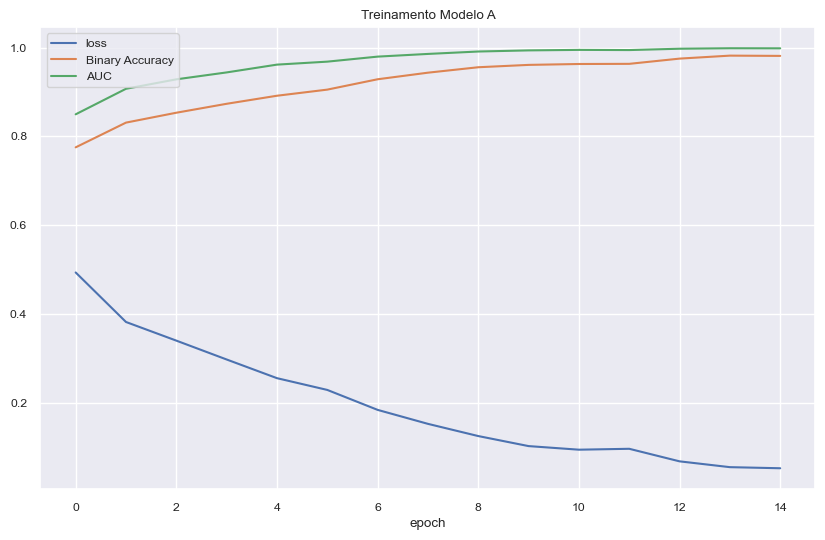

In [18]:
# Treinamento do Modelo A
fig = plt.figure(figsize=(10,6))
sns.set(font_scale=0.8)
plt.title("Treinamento Modelo A")
plt.plot(hist_modeloA_treino.history["loss"], label='loss')
plt.plot(hist_modeloA_treino.history["binary_accuracy"], label='Binary Accuracy')
plt.plot(hist_modeloA_treino.history["auc"], label='AUC')
plt.xlabel("epoch")
plt.legend(loc="upper left")
plt.show()

In [19]:
## avaliacao no conjunto de teste do Modelo A
score = modelo_A.evaluate(embeddings_pt_test, y_test_pt)
print("Acurácia Binária: ", round(score[1],4))
print("AUC-PR: ", round(score[2],4))
# exibir os valores obtidos

47/47 [==============================] - 0s 1ms/step - loss: 0.7447 - binary_accuracy: 0.8080 - auc: 0.8703
Acurácia Binária:  0.808
AUC-PR:  0.8703


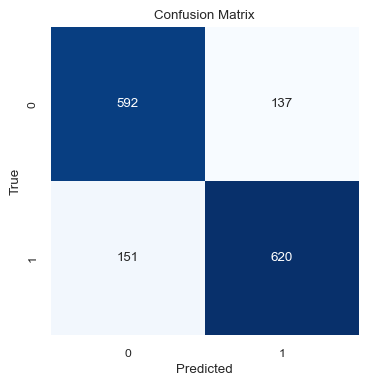

In [66]:
# Matriz de Confuzão do Modelo A

y_pred = np.squeeze(modelo_A.predict(embeddings_pt_test, verbose=0))
y_pred_class = np.rint(y_pred)

cm = confusion_matrix(y_test_pt, y_pred_class)


plt.figure(figsize=(4, 4))
sns.set(font_scale=0.8)
sns.heatmap(cm, annot=True, cmap='Blues', cbar=False, square=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

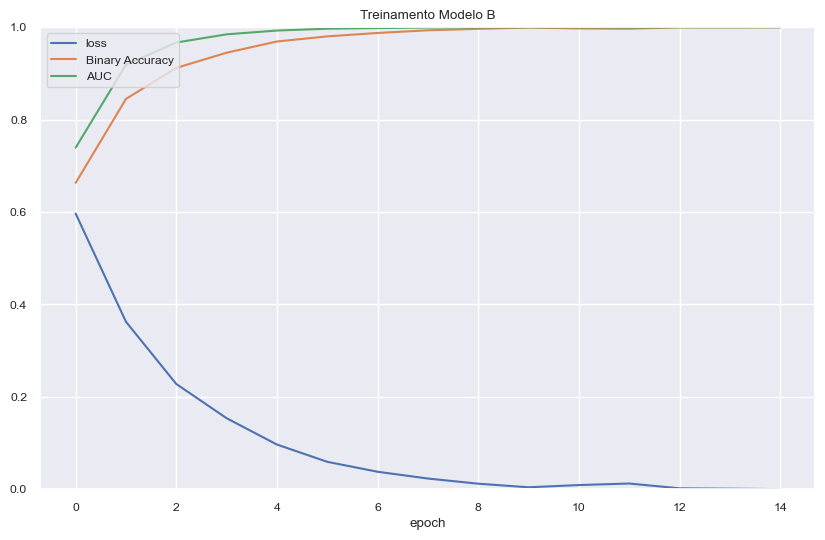

In [21]:
# Treinamento do Modelo B
fig = plt.figure(figsize=(10,6))
sns.set(font_scale=0.8)
plt.title("Treinamento Modelo B")
plt.plot(hist_modeloB_treino.history["loss"], label='loss')
plt.plot(hist_modeloB_treino.history["binary_accuracy"], label='Binary Accuracy')
plt.plot(hist_modeloB_treino.history["auc_1"], label='AUC')
plt.xlabel("epoch")
plt.legend(loc="upper left")
plt.ylim(0,1)
plt.show()

In [22]:
## avaliacao no conjunto de teste do Modelo B
score = modelo_B.evaluate(X_test_tok_pt, y_test_pt)
print("Acurácia Binária: ", round(score[1],4))
print("AUC-PR: ", round(score[2],4))
# exibir os valores obtidos

47/47 [==============================] - 4s 81ms/step - loss: 1.7236 - binary_accuracy: 0.8113 - auc_1: 0.8224
Acurácia Binária:  0.8113
AUC-PR:  0.8224


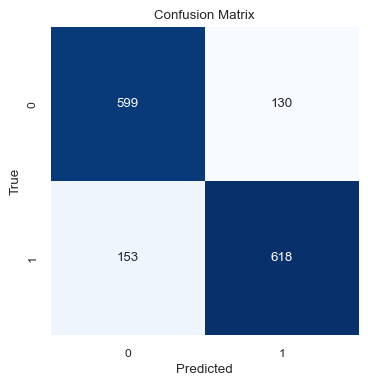

In [67]:
# Matriz de Confuzão do Modelo B

y_pred = np.squeeze(modelo_B.predict(X_test_tok_pt, verbose=0))
y_pred_class = np.rint(y_pred)

cm = confusion_matrix(y_test_pt, y_pred_class)


plt.figure(figsize=(4, 4))
sns.set(font_scale=0.8)
sns.heatmap(cm, annot=True, cmap='Blues', cbar=False, square=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

### 4. (3,0 pt) Fine-tuning dos Modelos anteriores usando os dados em **ingles**

1. Modelo A : usando embeddings extraídos dos textos em ingles. Para esse modelo torne a primeira camada densa não treinável.
2. Modelo B : usando os tokens extraídos dos textos em ingles. Para esse modelo permita a adaptação de todas as camadas

Siga o exemplo que copia o modelo e seus pesos para um novo modelo.

Após o treinamento exiba as métricas obtidas em teste

In [24]:
## Fine-tuning do Modelo A com a primeira camada densa congelada

In [25]:
# Cria novo modelo copiando a arquitetura
modelo_A2 = keras.models.clone_model(modelo_A)
# Copia os pesos do modelo anterior para o novo modelo
modelo_A2.set_weights(modelo_A.get_weights())


In [26]:
# Tornando a primeira camada densa não treinável
modelo_A2.layers[2].trainable =False
modelo_A2.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 768)]             0         
                                                                 
 batch_normalization (Batch  (None, 768)               3072      
 Normalization)                                                  
                                                                 
 dense (Dense)               (None, 384)               295296    
                                                                 
 dense_1 (Dense)             (None, 384)               147840    
                                                                 
 batch_normalization_1 (Bat  (None, 384)               1536      
 chNormalization)                                                
                                                                 
 activation (Activation)     (None, 384)               0     

In [27]:
# Compilando o modelo com perda entropia cruzada e métricas além da perda, a área sob a curva Precision-Recall (AUC PR) e a Acurácia Binária
# Otimizador Adam e taxa de aprendizado constante de 0.00002
modelo_A2.compile(loss="binary_crossentropy", optimizer=keras.optimizers.Adam(learning_rate=0.00002 ), metrics=['BinaryAccuracy', keras.metrics.AUC(curve='PR')])

# Treinando o modelo para a línguagem EN (Inglês) por 15 épocas com batch size 24 
hist_modeloA2_treino =  modelo_A2.fit(embeddings_train, y_train_en, batch_size=24, epochs=15)

Epoch 1/15

355/355 [==============================] - 2s 3ms/step - loss: 0.1522 - binary_accuracy: 0.9441 - auc_2: 0.9844
Epoch 2/15
355/355 [==============================] - 1s 3ms/step - loss: 0.1265 - binary_accuracy: 0.9522 - auc_2: 0.9888
Epoch 3/15
355/355 [==============================] - 1s 3ms/step - loss: 0.1289 - binary_accuracy: 0.9524 - auc_2: 0.9887
Epoch 4/15
355/355 [==============================] - 1s 3ms/step - loss: 0.1304 - binary_accuracy: 0.9521 - auc_2: 0.9887
Epoch 5/15
355/355 [==============================] - 1s 3ms/step - loss: 0.1277 - binary_accuracy: 0.9531 - auc_2: 0.9889
Epoch 6/15
355/355 [==============================] - 1s 3ms/step - loss: 0.1196 - binary_accuracy: 0.9544 - auc_2: 0.9906
Epoch 7/15
355/355 [==============================] - 1s 3ms/step - loss: 0.1317 - binary_accuracy: 0.9508 - auc_2: 0.9888
Epoch 8/15
355/355 [==============================] - 1s 3ms/step - loss: 0.1228 - binary_accuracy: 0.9527 - auc_2: 0.9904
Epoch 9/15
355/

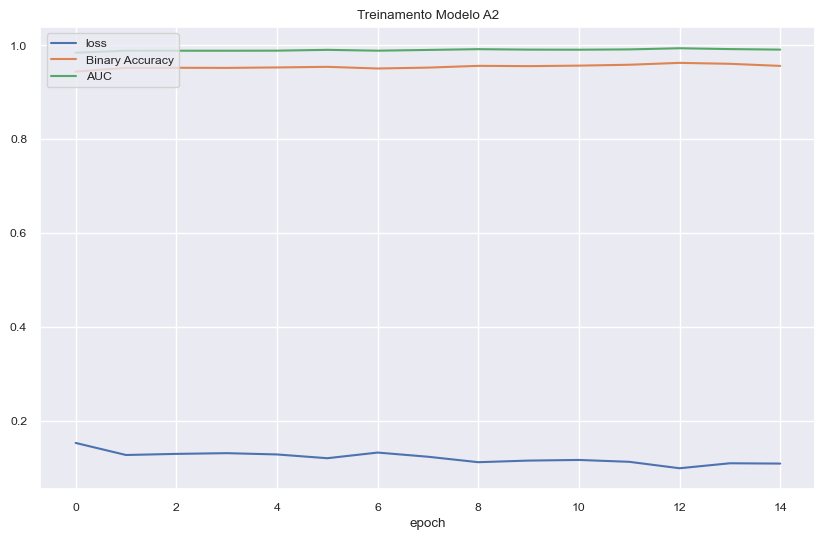

In [28]:
# Treinamento do Modelo A2
fig = plt.figure(figsize=(10,6))
sns.set(font_scale=0.8)
plt.title("Treinamento Modelo A2")
plt.plot(hist_modeloA2_treino.history["loss"], label='loss')
plt.plot(hist_modeloA2_treino.history["binary_accuracy"], label='Binary Accuracy')
plt.plot(hist_modeloA2_treino.history["auc_2"], label='AUC')
plt.xlabel("epoch")
plt.legend(loc="upper left")
plt.show()

In [29]:
## avaliacao no conjunto de teste do Modelo A2
score = modelo_A2.evaluate(embeddings_test, y_test_en)
print("Acurácia Binária: ", round(score[1],4))
print("AUC-PR: ", round(score[2],4))

47/47 [==============================] - 0s 1ms/step - loss: 0.6569 - binary_accuracy: 0.8173 - auc_2: 0.8857
Acurácia Binária:  0.8173
AUC-PR:  0.8857


In [30]:
## Fine-tuning do Modelo B
# Cria novo modelo copiando a arquitetura
modelo_B2 = keras.models.clone_model(modelo_B)
# Copia os pesos do modelo anterior para o novo modelo
modelo_B2.set_weights(modelo_B.get_weights())

In [31]:
# instanciar, compilar e treinar modelo B2
# Compilando o modelo com perda entropia cruzada e métricas além da perda, a área sob a curva Precision-Recall (AUC PR) e a Acurácia Binária
# Otimizador Adam e taxa de aprendizado constante de 0.00002
modelo_B2.compile(loss="binary_crossentropy", optimizer=keras.optimizers.Adam(learning_rate=0.00002) , metrics=['BinaryAccuracy', keras.metrics.AUC(curve='PR')])

# Treinando o modelo para a línguagem PT por 15 épocas com batch size 24
hist_modeloB2_treino =  modelo_B2.fit(X_train_tok_en, y_train_en, batch_size=24, epochs=15)

Epoch 1/15
355/355 [==============================] - 67s 185ms/step - loss: 2.6903 - binary_accuracy: 0.5053 - auc_3: 0.5088
Epoch 2/15
355/355 [==============================] - 59s 167ms/step - loss: 0.9425 - binary_accuracy: 0.5039 - auc_3: 0.5054
Epoch 3/15
355/355 [==============================] - 63s 177ms/step - loss: 0.6990 - binary_accuracy: 0.5120 - auc_3: 0.5181
Epoch 4/15
355/355 [==============================] - 66s 185ms/step - loss: 0.6988 - binary_accuracy: 0.5087 - auc_3: 0.5124
Epoch 5/15
355/355 [==============================] - 65s 184ms/step - loss: 0.6958 - binary_accuracy: 0.5061 - auc_3: 0.5179
Epoch 6/15
355/355 [==============================] - 63s 178ms/step - loss: 0.6941 - binary_accuracy: 0.5176 - auc_3: 0.5195
Epoch 7/15
355/355 [==============================] - 63s 177ms/step - loss: 0.6936 - binary_accuracy: 0.5155 - auc_3: 0.5226
Epoch 8/15
355/355 [==============================] - 66s 186ms/step - loss: 0.6930 - binary_accuracy: 0.5209 - auc_3:

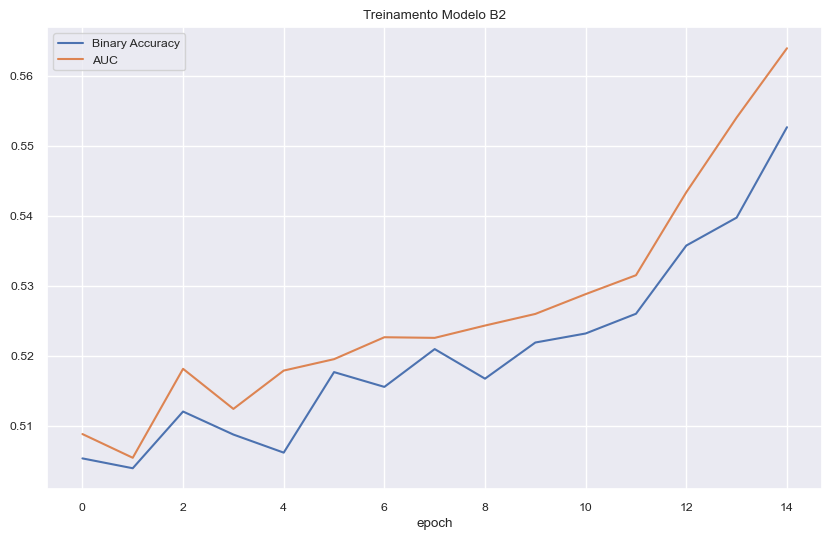

In [73]:
# Treinamento do Modelo B2
fig = plt.figure(figsize=(10,6))
sns.set(font_scale=0.8)
plt.title("Treinamento Modelo B2")
#plt.plot(hist_modeloB2_treino.history["loss"], label='loss') # Removida do gráfico para melhorar a visualização
plt.plot(hist_modeloB2_treino.history["binary_accuracy"], label='Binary Accuracy')
plt.plot(hist_modeloB2_treino.history["auc_3"], label='AUC')
plt.xlabel("epoch")
plt.legend(loc="upper left")
plt.show()

In [33]:
## avaliacao no conjunto de teste do Modelo B2
score = modelo_B2.evaluate(X_test_tok_en, y_test_en)
print("Acurácia Binária: ", round(score[1],4))
print("AUC-PR: ", round(score[2],4))

47/47 [==============================] - 4s 82ms/step - loss: 0.6877 - binary_accuracy: 0.5453 - auc_3: 0.5805
Acurácia Binária:  0.5453
AUC-PR:  0.5805


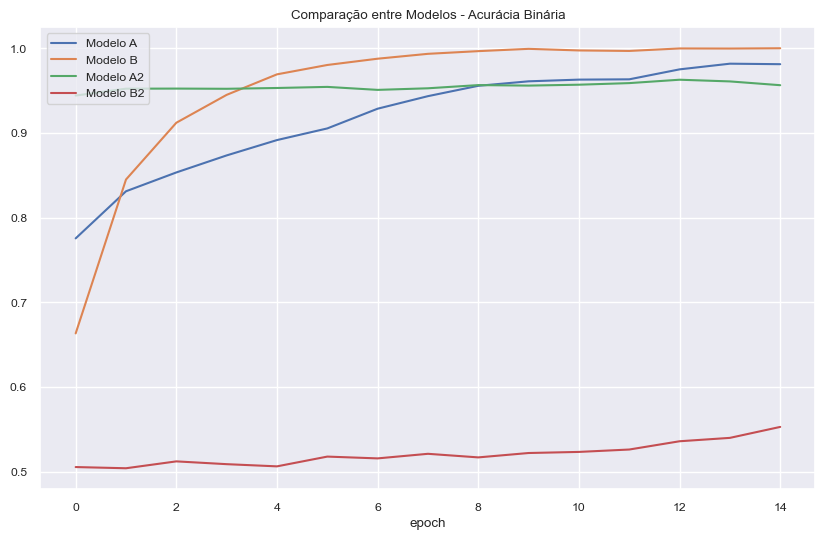

In [69]:
# Comparação entre modelos
fig = plt.figure(figsize=(10,6))
sns.set(font_scale=0.8)
plt.title("Comparação entre Modelos - Acurácia Binária")
plt.plot(hist_modeloA_treino.history["binary_accuracy"], label='Modelo A')
plt.plot(hist_modeloB_treino.history["binary_accuracy"], label='Modelo B')
plt.plot(hist_modeloA2_treino.history["binary_accuracy"], label='Modelo A2')
plt.plot(hist_modeloB2_treino.history["binary_accuracy"], label='Modelo B2')
plt.xlabel("epoch")
plt.legend(loc="upper left")
plt.show()

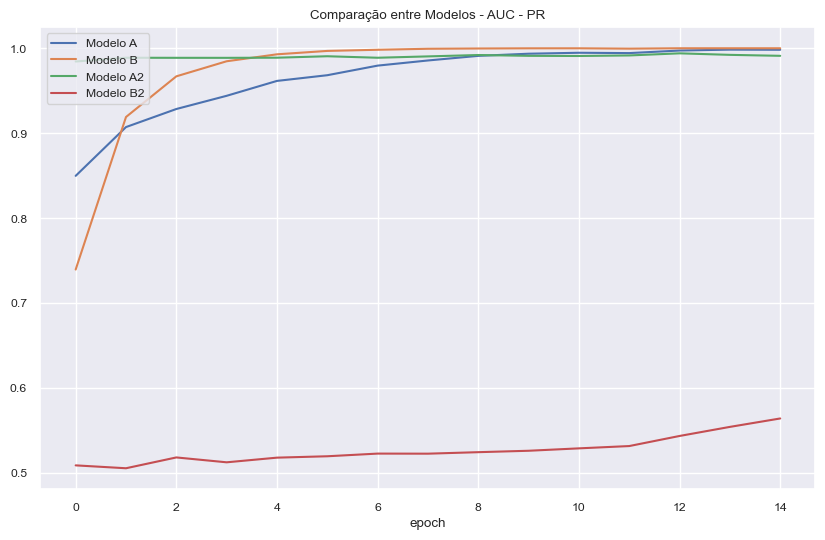

In [70]:
# Comparação entre modelos - AUC
fig = plt.figure(figsize=(10,6))
sns.set(font_scale=0.8)
plt.title("Comparação entre Modelos - AUC - PR")
plt.plot(hist_modeloA_treino.history["auc"], label='Modelo A')
plt.plot(hist_modeloB_treino.history["auc_1"], label='Modelo B')
plt.plot(hist_modeloA2_treino.history["auc_2"], label='Modelo A2')
plt.plot(hist_modeloB2_treino.history["auc_3"], label='Modelo B2')
plt.xlabel("epoch")
plt.legend(loc="upper left")
plt.show()

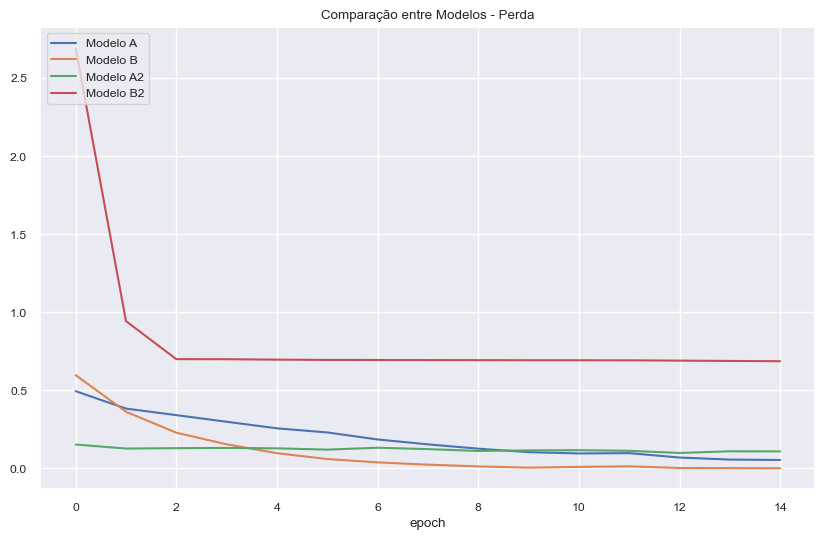

In [71]:
# Comparação entre modelos - Loss
fig = plt.figure(figsize=(10,6))
sns.set(font_scale=0.8)
plt.title("Comparação entre Modelos - Perda")
plt.plot(hist_modeloA_treino.history["loss"], label='Modelo A')
plt.plot(hist_modeloB_treino.history["loss"], label='Modelo B')
plt.plot(hist_modeloA2_treino.history["loss"], label='Modelo A2')
plt.plot(hist_modeloB2_treino.history["loss"], label='Modelo B2')
plt.xlabel("epoch")
plt.legend(loc="upper left")
plt.show()

## Bônus (+1pt)

### 1: Análise dos espaços de características do textos em português usando tSNE em duas dimensões

#### a. Espaço embedding original em portugues
#### b. Espaço embedding Modelo A
#### c. Espaço embedding Modelo B

Use o TNSE com os parametros definidos no exemplo abaixo. Realize fit_transform nos dados de teste relativo a cada modelo para projetar os dados em 2 dimensões e a seguir plote esses espaços 2d usando scatterplots.

Após, escreva suas conclusões sobre essa análise visual comparativa entre os 3 espaços

In [34]:
from sklearn.manifold import TSNE

In [35]:
# TSNE e seus parametros
tsne_1 = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=6)

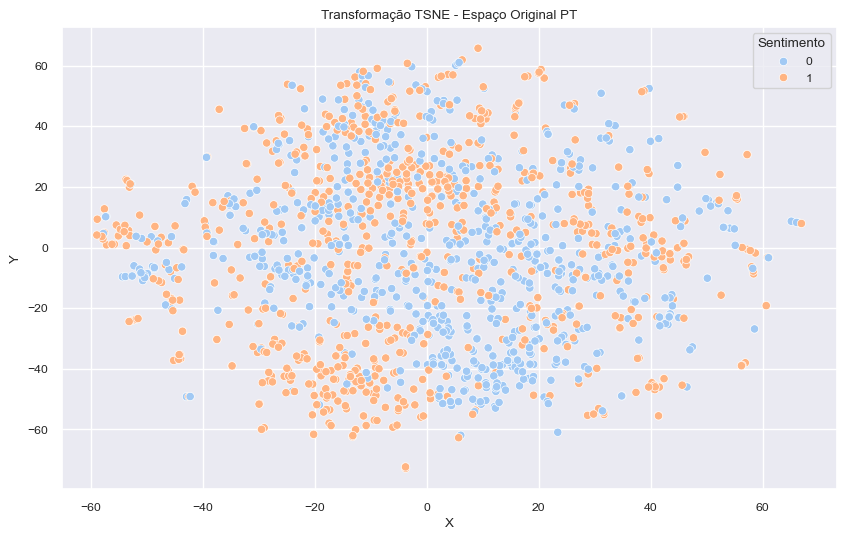

In [36]:
espaco_original = pd.DataFrame(tsne_1.fit_transform(embeddings_pt_test), columns=['X', 'Y'])
espaco_original['Sentimento'] = y_test_pt
fig = plt.figure(figsize=(10,6))
sns.scatterplot(data=espaco_original, x='X', y='Y', hue='Sentimento', palette='pastel')
plt.title("Transformação TSNE - Espaço Original PT")
plt.show()


In [83]:
# Extraíndo dados da última camada densa de 384 dimensões do Modelo A (layer[3])

modelo_A_densa = keras.Model(inputs=modelo_A.inputs, outputs=modelo_A.layers[3].output)
embeddings_modelo_A = modelo_A_densa.predict(embeddings_pt_test, verbose=0)

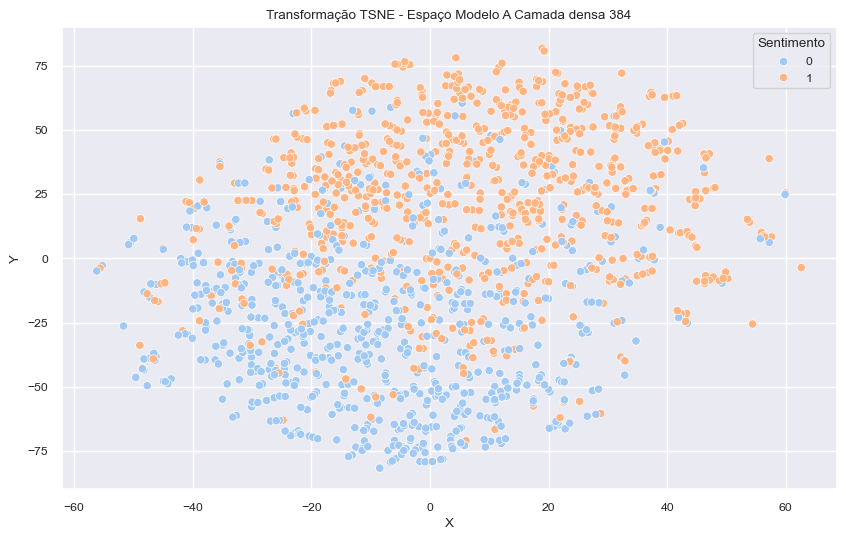

In [84]:
espaco_ModeloA = pd.DataFrame(tsne_1.fit_transform(embeddings_modelo_A), columns=['X', 'Y'])
espaco_ModeloA['Sentimento'] = y_test_pt
fig = plt.figure(figsize=(10,6))
sns.scatterplot(data=espaco_ModeloA, x='X', y='Y', hue='Sentimento', palette='pastel')
plt.title("Transformação TSNE - Espaço Modelo A Camada densa 384")
plt.show()

In [64]:
# Extraíndo dados da última camada densa de 384 dimensões do Modelo B

modelo_B_densa = keras.Model(inputs=modelo_B.inputs, outputs=modelo_B.layers[4].output)
embeddings_modelo_B = modelo_B_densa.predict(X_test_tok_pt, verbose=0)

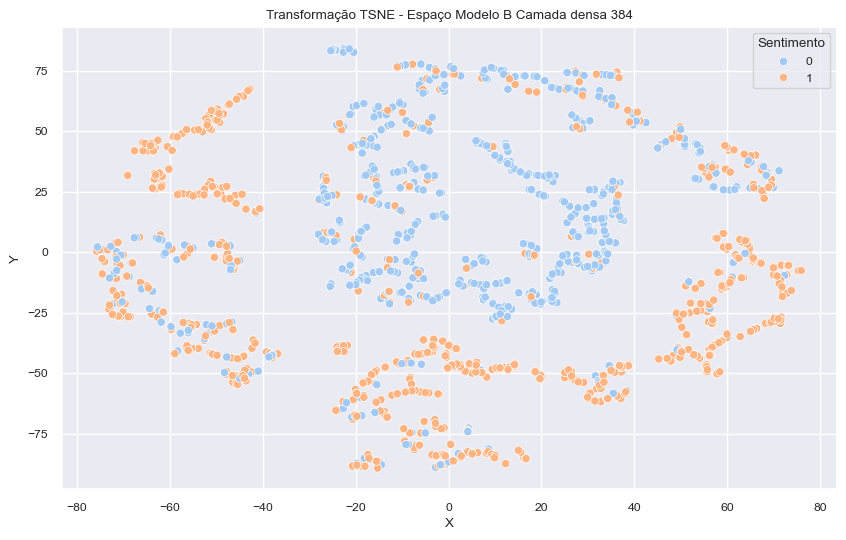

In [65]:
espaco_ModeloB = pd.DataFrame(tsne_1.fit_transform(embeddings_modelo_B), columns=['X', 'Y'])
espaco_ModeloB['Sentimento'] = y_test_pt
fig = plt.figure(figsize=(10,6))
sns.scatterplot(data=espaco_ModeloB, x='X', y='Y', hue='Sentimento', palette='pastel')
plt.title("Transformação TSNE - Espaço Modelo B Camada densa 384")
plt.show()

Comparando os gráficos conseguimos notar uma evolução na separação entre os grupos de sentimentos positivos e negativos. Quanto mais avançada na rede neural a separação fica mais evidente. Isso nos leva a concluir que a construção está sendo eficiente em separar os grupos com sentimentos positivos e negativos nas avaliações.

Para evidenciar a afirmação coloquei a evolução dos outputs das camadas no esquema abaixo.

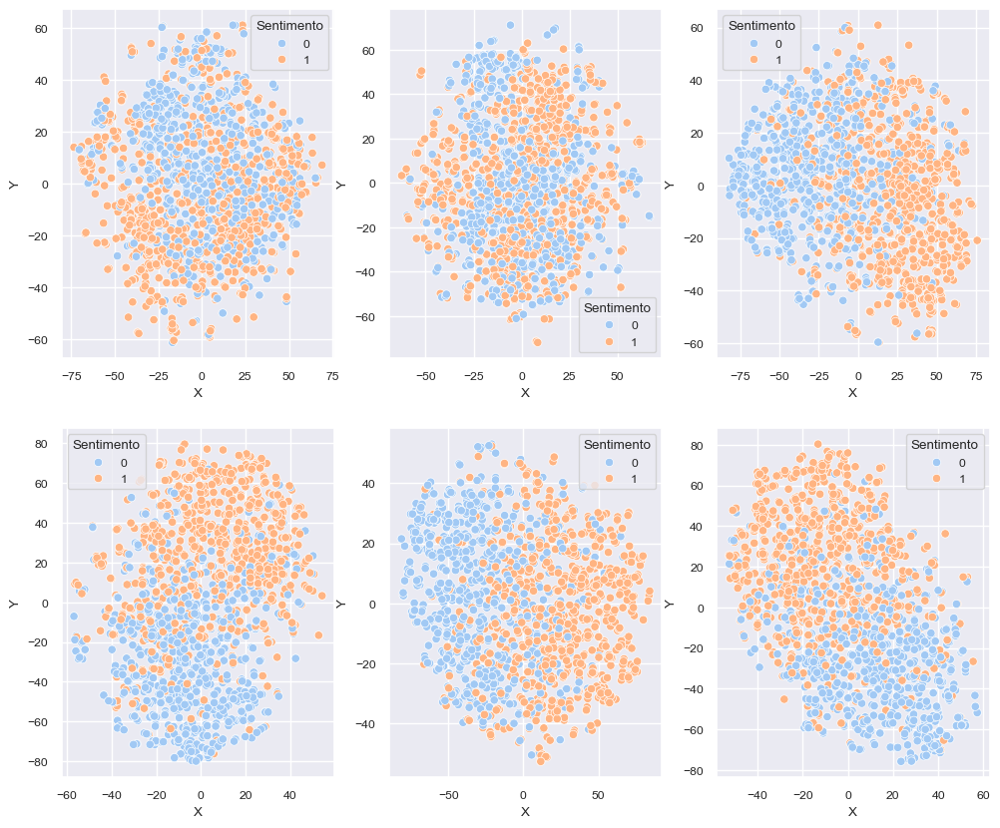

In [89]:
plt.figure(figsize=(12,10))

for i in range(1,7):
    modelo_A_densa = keras.Model(inputs=modelo_A.inputs, outputs=modelo_A.layers[i].output)
    embeddings_modelo_A = modelo_A_densa.predict(embeddings_pt_test, verbose=0)
    espaco_ModeloA = pd.DataFrame(tsne_1.fit_transform(embeddings_modelo_A), columns=['X', 'Y'])
    espaco_ModeloA['Sentimento'] = y_test_pt
    plt.subplot(2,3,i); sns.scatterplot(data=espaco_ModeloA, x='X', y='Y', hue='Sentimento', palette='pastel')


plt.show()